In [1]:
#By Andrei Erofeev
import torch
from torch.utils.data import Dataset, DataLoader
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler

In [2]:
import time
import os
import copy

In [3]:
import numpy as np
import tqdm
from PIL import Image, ImageFont
import torch
from IPython import display
from facedetector import FaceDetector
from dataloaders.WIDERloader import WIDERLoader
from dataloaders.WIDERloader import collate_fn as wider_collater
from dataloaders.transforms import transform
from dataloaders.MAFAloader import MAFALoader, collate_fn
from models.VanillaClassificator import MaskDetectionModel
from models.MultiLabelClassificator import MultilabelClassificator
from models.Custom_model import make_model, Flatten, vgg_classif
from models import FAN_detector
from metrics import mAP, multilabel_mAP
from facenet_pytorch import MTCNN
import torchvision.transforms.functional as TF
import matplotlib.pyplot as plt
from torch.utils.data.dataset import Dataset
import scipy
import scipy.io
import pandas as pd
import tensorboard
from torch.utils.tensorboard import SummaryWriter
from datetime import datetime

In [4]:
DO_TRAIN = False

In [5]:
test_MAFA = MAFALoader('../MAFA/test/images/', '../MAFA/test/LabelTestAll.mat', mode = 'test', only_multiple_faces=True)
train_MAFA = MAFALoader('../MAFA/train/images/', '../MAFA/train/LabelTrainAll.mat', mode = 'train', only_multiple_faces=True)
#val_MAFA = MAFALoader('../MAFA/test/images/', '../MAFA/test/LabelTestAll.mat', mode = 'test',
#                      only_multiple_faces=True, cut_size=100)

train_WIDER = WIDERLoader('../WIDER/WIDER_train/images/wider_face_train_bbx_gt.txt',
                          '../WIDER/WIDER_train/images', mode = 'train', cut_size=10000)
test_WIDER = WIDERLoader('../WIDER/WIDER_val/images/wider_face_val_bbx_gt.txt',
                          '../WIDER/WIDER_val/images', mode = 'val', cut_size=1000)

In [6]:
len(train_MAFA), len(test_MAFA)

(2046, 1674)

In [7]:
train_dataloader = DataLoader(train_WIDER, batch_size=16, shuffle=True, collate_fn=collate_fn)
test_dataloader = DataLoader(test_WIDER, batch_size=1, shuffle=False)

In [8]:
def setup_experiment(title, logdir="./tb"):
    #experiment_name = "{}-{}".format(title, datetime.now().strftime("%d.%m.%Y-%H:%M:%S"))
    experiment_name = "{}-{}".format(title, datetime.now().strftime("%d.%m.%Y-%H.%M.%S"))
    writer = SummaryWriter(log_dir=os.path.join(logdir, experiment_name))
    best_model_path = f"{title}.best.pth"
    return writer, experiment_name, best_model_path

In [8]:
retinanet = FAN_detector.resnet34(num_classes=3)

In [9]:
if DO_TRAIN:
    retinanet_dict = retinanet.state_dict()
    pretrained_dict = torch.load('./weights/resnet34-333f7ec4.pth')
    pretrained_dict = {k: v for k, v in pretrained_dict.items() if k in retinanet_dict}
    retinanet_dict.update(pretrained_dict)
    retinanet.load_state_dict(retinanet_dict)

In [10]:
retinanet.cuda()

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [11]:
if DO_TRAIN:
    optimizer = optim.Adam(retinanet.parameters(), lr=1e-4)

In [12]:
if DO_TRAIN:
    writer, experiment_name, best_model_path = setup_experiment(retinanet.__class__.__name__, logdir="./tb")
    print(f"Experiment name: {experiment_name}")

In [13]:
retinanet.train()
retinanet([train_WIDER[2][0].unsqueeze(0).cuda().float(), train_WIDER[2][1].unsqueeze(0)])

C:\Users\EAS\Documents\Study\Skoltech\PhD\Deep Learning\Project\code\dataloaders\WIDERloader.py:74: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return torch.from_numpy(np.asarray(img)).to(device), torch.tensor(boxes, dtype = torch.float32).to(device)


(tensor([0.0434], device='cuda:0', grad_fn=<MeanBackward1>),
 tensor([0.], device='cuda:0'),
 tensor([0.6931], device='cuda:0', grad_fn=<MeanBackward1>))

In [14]:
class UnNormalizer(object):
    def __init__(self, mean=None, std=None):
        if mean == None:
            self.mean = [0.485, 0.456, 0.406]
        else:
            self.mean = mean
        if std == None:
            self.std = [0.229, 0.224, 0.225]
        else:
            self.std = std

    def __call__(self, tensor):
        """
        Args:
            tensor (Tensor): Tensor image of size (C, H, W) to be normalized.
        Returns:
            Tensor: Normalized image.
        """
        for t, m, s in zip(tensor, self.mean, self.std):
            t.mul_(s).add_(m)
        return tensor

In [15]:
unnorm = UnNormalizer()

In [16]:
def plot_img_and_boxes(img, gt_box, pred_box):
    display.clear_output(wait=True)
    img = unnorm(img)
    img = TF.to_pil_image(img.cpu())
    fig, ax = plt.subplots(figsize=(12, 12))
    ax.imshow(img, aspect='equal')
    
    if pred_box is not None:
        for bbox in pred_box:
            if bbox is None:
                break
            ax.add_patch(
                plt.Rectangle((bbox[0], bbox[1]),
                              (bbox[2] - bbox[0]),
                              (bbox[3] - bbox[1]), fill=False,
                              edgecolor='red', linewidth=1.5)
                )
        
    for bbox in gt_box:
        ax.add_patch(
            plt.Rectangle((bbox[0], bbox[1]),
                          (bbox[2] - bbox[0]),
                          (bbox[3] - bbox[1]), fill=False,
                          edgecolor='blue', linewidth=1.5)
            )


    plt.axis('off')
    plt.tight_layout()
    plt.draw()
    plt.show()

In [20]:
if DO_TRAIN:
    n_epoches = 50
    iters = 0
    best_loss = 1e6
    best_mAP = -1
    for epoch_num in range(n_epoches):

        retinanet.train()
        #retinanet.module.freeze_bn()

        epoch_loss = []

        for iter_num, data in enumerate(train_dataloader):
            iters += 1

            optimizer.zero_grad()

            classification_loss, regression_loss, mask_loss = retinanet([data[0].cuda().float(), data[1]])

            classification_loss = classification_loss.mean()
            regression_loss = regression_loss.mean()
            mask_loss = mask_loss.mean()

            loss = classification_loss + regression_loss + mask_loss

            if bool(loss == 0):
                continue

            loss.backward()

            torch.nn.utils.clip_grad_norm_(retinanet.parameters(), 0.1)

            optimizer.step()

            #loss_hist.append(float(loss))

            epoch_loss.append(float(loss))

            print('Epoch: {} | Iteration: {} | Classification loss: {:1.5f} | Regression loss: {:1.5f} | Best mAP: {:0.5f}'.format(epoch_num, iters, float(classification_loss), float(regression_loss), best_mAP))

            writer.add_scalar('classification_loss', classification_loss, iters)
            writer.add_scalar('regression_loss', regression_loss, iters)
            writer.add_scalar('loss', loss, iters)

            if loss.item() < best_loss:
                best_loss = loss.item()
                torch.save(retinanet.state_dict(), best_model_path)

            del classification_loss
            del regression_loss

    #     retinanet.eval()
    #     pred_boxes = retinanet(test_[1][0].unsqueeze(0).cuda().float())
    #     #print(pred_boxes[-1])
    #     plot_img_and_boxes(test_MAFA[1][0], test_MAFA[1][1], pred_boxes[-1])

    #     val_pred_MAFA_boxes = []
    #     for i, sample in enumerate(val_MAFA):
    #         boxes = retinanet(sample[0].unsqueeze(0).float())[2]
    #         if boxes is None:
    #             boxes = []
    #         else:
    #             boxes = list(boxes.cpu().detach().numpy())
    #         val_pred_MAFA_boxes.append(boxes)
    #         del sample
    #         del boxes
    #     mafa_results = mAP(val_MAFA, val_pred_MAFA_boxes)
    #     cur_map = mafa_results['mean_average_precision']
    #     print('Current mAP: ', cur_map)
    #     if cur_map > best_mAP:
    #         best_mAP = cur_map
    #         torch.save(retinanet.state_dict(), best_model_path)

    #     retinanet.train()

Epoch: 0 | Iteration: 1 | Classification loss: 0.72360 | Regression loss: 0.66581 | Best mAP: -1.00000
Epoch: 0 | Iteration: 2 | Classification loss: 0.62632 | Regression loss: 0.67467 | Best mAP: -1.00000
Epoch: 0 | Iteration: 3 | Classification loss: 0.43614 | Regression loss: 0.45502 | Best mAP: -1.00000
Epoch: 0 | Iteration: 4 | Classification loss: 0.79085 | Regression loss: 0.77440 | Best mAP: -1.00000
Epoch: 0 | Iteration: 5 | Classification loss: 0.65210 | Regression loss: 0.73229 | Best mAP: -1.00000
Epoch: 0 | Iteration: 6 | Classification loss: 0.78887 | Regression loss: 0.67378 | Best mAP: -1.00000
Epoch: 0 | Iteration: 7 | Classification loss: 1.11322 | Regression loss: 0.66071 | Best mAP: -1.00000
Epoch: 0 | Iteration: 8 | Classification loss: 0.49459 | Regression loss: 0.54237 | Best mAP: -1.00000
Epoch: 0 | Iteration: 9 | Classification loss: 0.68886 | Regression loss: 0.88083 | Best mAP: -1.00000
Epoch: 0 | Iteration: 10 | Classification loss: 0.54063 | Regression loss

Epoch: 0 | Iteration: 80 | Classification loss: 0.37769 | Regression loss: 0.64241 | Best mAP: -1.00000
Epoch: 0 | Iteration: 81 | Classification loss: 0.29229 | Regression loss: 0.54910 | Best mAP: -1.00000
Epoch: 0 | Iteration: 82 | Classification loss: 0.31705 | Regression loss: 0.49201 | Best mAP: -1.00000
Epoch: 0 | Iteration: 83 | Classification loss: 1.01710 | Regression loss: 0.42518 | Best mAP: -1.00000
Epoch: 0 | Iteration: 84 | Classification loss: 0.19279 | Regression loss: 0.39257 | Best mAP: -1.00000
Epoch: 0 | Iteration: 85 | Classification loss: 0.21349 | Regression loss: 0.42561 | Best mAP: -1.00000
Epoch: 0 | Iteration: 86 | Classification loss: 0.25720 | Regression loss: 0.51556 | Best mAP: -1.00000
Epoch: 0 | Iteration: 87 | Classification loss: 0.33150 | Regression loss: 0.57493 | Best mAP: -1.00000
Epoch: 0 | Iteration: 88 | Classification loss: 0.42311 | Regression loss: 0.44382 | Best mAP: -1.00000
Epoch: 0 | Iteration: 89 | Classification loss: 0.38505 | Regres

Epoch: 0 | Iteration: 159 | Classification loss: 0.16215 | Regression loss: 0.45251 | Best mAP: -1.00000
Epoch: 0 | Iteration: 160 | Classification loss: 0.11375 | Regression loss: 0.33364 | Best mAP: -1.00000
Epoch: 0 | Iteration: 161 | Classification loss: 0.14428 | Regression loss: 0.34100 | Best mAP: -1.00000
Epoch: 0 | Iteration: 162 | Classification loss: 0.21135 | Regression loss: 0.42527 | Best mAP: -1.00000
Epoch: 0 | Iteration: 163 | Classification loss: 0.14246 | Regression loss: 0.36028 | Best mAP: -1.00000
Epoch: 0 | Iteration: 164 | Classification loss: 0.11506 | Regression loss: 0.26825 | Best mAP: -1.00000
Epoch: 0 | Iteration: 165 | Classification loss: 0.15468 | Regression loss: 0.35845 | Best mAP: -1.00000
Epoch: 0 | Iteration: 166 | Classification loss: 0.24173 | Regression loss: 0.42157 | Best mAP: -1.00000
Epoch: 0 | Iteration: 167 | Classification loss: 0.24975 | Regression loss: 0.34811 | Best mAP: -1.00000
Epoch: 0 | Iteration: 168 | Classification loss: 0.2047

Epoch: 0 | Iteration: 238 | Classification loss: 0.16890 | Regression loss: 0.34622 | Best mAP: -1.00000
Epoch: 0 | Iteration: 239 | Classification loss: 0.17528 | Regression loss: 0.32277 | Best mAP: -1.00000
Epoch: 0 | Iteration: 240 | Classification loss: 0.18620 | Regression loss: 0.41798 | Best mAP: -1.00000
Epoch: 0 | Iteration: 241 | Classification loss: 0.13909 | Regression loss: 0.30975 | Best mAP: -1.00000
Epoch: 0 | Iteration: 242 | Classification loss: 0.19325 | Regression loss: 0.39857 | Best mAP: -1.00000
Epoch: 0 | Iteration: 243 | Classification loss: 0.58192 | Regression loss: 0.28076 | Best mAP: -1.00000
Epoch: 0 | Iteration: 244 | Classification loss: 0.25184 | Regression loss: 0.35508 | Best mAP: -1.00000
Epoch: 0 | Iteration: 245 | Classification loss: 0.28647 | Regression loss: 0.39173 | Best mAP: -1.00000
Epoch: 0 | Iteration: 246 | Classification loss: 0.40442 | Regression loss: 0.41207 | Best mAP: -1.00000
Epoch: 0 | Iteration: 247 | Classification loss: 0.1579

Epoch: 0 | Iteration: 317 | Classification loss: 0.11983 | Regression loss: 0.25629 | Best mAP: -1.00000
Epoch: 0 | Iteration: 318 | Classification loss: 0.10344 | Regression loss: 0.26485 | Best mAP: -1.00000
Epoch: 0 | Iteration: 319 | Classification loss: 0.20134 | Regression loss: 0.37180 | Best mAP: -1.00000
Epoch: 0 | Iteration: 320 | Classification loss: 0.18752 | Regression loss: 0.32972 | Best mAP: -1.00000
Epoch: 0 | Iteration: 321 | Classification loss: 0.13386 | Regression loss: 0.31892 | Best mAP: -1.00000
Epoch: 0 | Iteration: 322 | Classification loss: 0.26238 | Regression loss: 0.34395 | Best mAP: -1.00000
Epoch: 0 | Iteration: 323 | Classification loss: 0.21014 | Regression loss: 0.28405 | Best mAP: -1.00000
Epoch: 0 | Iteration: 324 | Classification loss: 0.13718 | Regression loss: 0.32214 | Best mAP: -1.00000
Epoch: 0 | Iteration: 325 | Classification loss: 0.14077 | Regression loss: 0.26717 | Best mAP: -1.00000
Epoch: 0 | Iteration: 326 | Classification loss: 0.1673

Epoch: 0 | Iteration: 396 | Classification loss: 0.15570 | Regression loss: 0.38256 | Best mAP: -1.00000
Epoch: 0 | Iteration: 397 | Classification loss: 0.14133 | Regression loss: 0.25144 | Best mAP: -1.00000
Epoch: 0 | Iteration: 398 | Classification loss: 0.17583 | Regression loss: 0.33627 | Best mAP: -1.00000
Epoch: 0 | Iteration: 399 | Classification loss: 0.13066 | Regression loss: 0.29986 | Best mAP: -1.00000
Epoch: 0 | Iteration: 400 | Classification loss: 0.19537 | Regression loss: 0.33572 | Best mAP: -1.00000
Epoch: 0 | Iteration: 401 | Classification loss: 0.20488 | Regression loss: 0.26570 | Best mAP: -1.00000
Epoch: 0 | Iteration: 402 | Classification loss: 0.13687 | Regression loss: 0.20450 | Best mAP: -1.00000
Epoch: 0 | Iteration: 403 | Classification loss: 0.19638 | Regression loss: 0.44663 | Best mAP: -1.00000
Epoch: 0 | Iteration: 404 | Classification loss: 0.24988 | Regression loss: 0.38303 | Best mAP: -1.00000
Epoch: 0 | Iteration: 405 | Classification loss: 0.1893

Epoch: 0 | Iteration: 475 | Classification loss: 0.38155 | Regression loss: 0.36666 | Best mAP: -1.00000
Epoch: 0 | Iteration: 476 | Classification loss: 0.05497 | Regression loss: 0.12018 | Best mAP: -1.00000
Epoch: 0 | Iteration: 477 | Classification loss: 0.13246 | Regression loss: 0.34574 | Best mAP: -1.00000
Epoch: 0 | Iteration: 478 | Classification loss: 0.11545 | Regression loss: 0.31210 | Best mAP: -1.00000
Epoch: 0 | Iteration: 479 | Classification loss: 0.14294 | Regression loss: 0.25405 | Best mAP: -1.00000
Epoch: 0 | Iteration: 480 | Classification loss: 0.27248 | Regression loss: 0.20622 | Best mAP: -1.00000
Epoch: 0 | Iteration: 481 | Classification loss: 0.17504 | Regression loss: 0.44792 | Best mAP: -1.00000
Epoch: 0 | Iteration: 482 | Classification loss: 0.11300 | Regression loss: 0.42076 | Best mAP: -1.00000
Epoch: 0 | Iteration: 483 | Classification loss: 0.17765 | Regression loss: 0.41146 | Best mAP: -1.00000
Epoch: 0 | Iteration: 484 | Classification loss: 0.0883

Epoch: 0 | Iteration: 554 | Classification loss: 0.13158 | Regression loss: 0.34608 | Best mAP: -1.00000
Epoch: 0 | Iteration: 555 | Classification loss: 0.14844 | Regression loss: 0.31750 | Best mAP: -1.00000
Epoch: 0 | Iteration: 556 | Classification loss: 0.09876 | Regression loss: 0.24818 | Best mAP: -1.00000
Epoch: 0 | Iteration: 557 | Classification loss: 0.14844 | Regression loss: 0.27702 | Best mAP: -1.00000
Epoch: 0 | Iteration: 558 | Classification loss: 0.21546 | Regression loss: 0.35295 | Best mAP: -1.00000
Epoch: 0 | Iteration: 559 | Classification loss: 0.23427 | Regression loss: 0.42079 | Best mAP: -1.00000
Epoch: 0 | Iteration: 560 | Classification loss: 0.17533 | Regression loss: 0.38299 | Best mAP: -1.00000
Epoch: 0 | Iteration: 561 | Classification loss: 0.22831 | Regression loss: 0.28119 | Best mAP: -1.00000
Epoch: 0 | Iteration: 562 | Classification loss: 0.16294 | Regression loss: 0.33006 | Best mAP: -1.00000
Epoch: 0 | Iteration: 563 | Classification loss: 0.1691

Epoch: 1 | Iteration: 633 | Classification loss: 0.07090 | Regression loss: 0.28841 | Best mAP: -1.00000
Epoch: 1 | Iteration: 634 | Classification loss: 0.04575 | Regression loss: 0.19111 | Best mAP: -1.00000
Epoch: 1 | Iteration: 635 | Classification loss: 0.07485 | Regression loss: 0.27142 | Best mAP: -1.00000
Epoch: 1 | Iteration: 636 | Classification loss: 0.16252 | Regression loss: 0.21684 | Best mAP: -1.00000
Epoch: 1 | Iteration: 637 | Classification loss: 0.12689 | Regression loss: 0.16145 | Best mAP: -1.00000
Epoch: 1 | Iteration: 638 | Classification loss: 0.08216 | Regression loss: 0.21226 | Best mAP: -1.00000
Epoch: 1 | Iteration: 639 | Classification loss: 0.22245 | Regression loss: 0.36559 | Best mAP: -1.00000
Epoch: 1 | Iteration: 640 | Classification loss: 0.07695 | Regression loss: 0.23307 | Best mAP: -1.00000
Epoch: 1 | Iteration: 641 | Classification loss: 0.16042 | Regression loss: 0.33685 | Best mAP: -1.00000
Epoch: 1 | Iteration: 642 | Classification loss: 0.0841

Epoch: 1 | Iteration: 712 | Classification loss: 0.13453 | Regression loss: 0.31220 | Best mAP: -1.00000
Epoch: 1 | Iteration: 713 | Classification loss: 0.06311 | Regression loss: 0.16822 | Best mAP: -1.00000
Epoch: 1 | Iteration: 714 | Classification loss: 0.07323 | Regression loss: 0.22758 | Best mAP: -1.00000
Epoch: 1 | Iteration: 715 | Classification loss: 0.05622 | Regression loss: 0.25435 | Best mAP: -1.00000
Epoch: 1 | Iteration: 716 | Classification loss: 0.10200 | Regression loss: 0.27426 | Best mAP: -1.00000
Epoch: 1 | Iteration: 717 | Classification loss: 0.07113 | Regression loss: 0.26600 | Best mAP: -1.00000
Epoch: 1 | Iteration: 718 | Classification loss: 0.09602 | Regression loss: 0.25890 | Best mAP: -1.00000
Epoch: 1 | Iteration: 719 | Classification loss: 0.11591 | Regression loss: 0.31113 | Best mAP: -1.00000
Epoch: 1 | Iteration: 720 | Classification loss: 0.10476 | Regression loss: 0.25195 | Best mAP: -1.00000
Epoch: 1 | Iteration: 721 | Classification loss: 0.1649

Epoch: 1 | Iteration: 791 | Classification loss: 0.16670 | Regression loss: 0.25708 | Best mAP: -1.00000
Epoch: 1 | Iteration: 792 | Classification loss: 0.15974 | Regression loss: 0.21166 | Best mAP: -1.00000
Epoch: 1 | Iteration: 793 | Classification loss: 0.11091 | Regression loss: 0.30976 | Best mAP: -1.00000
Epoch: 1 | Iteration: 794 | Classification loss: 0.07944 | Regression loss: 0.22017 | Best mAP: -1.00000
Epoch: 1 | Iteration: 795 | Classification loss: 0.21838 | Regression loss: 0.26200 | Best mAP: -1.00000
Epoch: 1 | Iteration: 796 | Classification loss: 0.05678 | Regression loss: 0.19383 | Best mAP: -1.00000
Epoch: 1 | Iteration: 797 | Classification loss: 0.11044 | Regression loss: 0.28583 | Best mAP: -1.00000
Epoch: 1 | Iteration: 798 | Classification loss: 0.10264 | Regression loss: 0.22457 | Best mAP: -1.00000
Epoch: 1 | Iteration: 799 | Classification loss: 0.06244 | Regression loss: 0.16424 | Best mAP: -1.00000
Epoch: 1 | Iteration: 800 | Classification loss: 0.0940

Epoch: 1 | Iteration: 870 | Classification loss: 0.10319 | Regression loss: 0.24862 | Best mAP: -1.00000
Epoch: 1 | Iteration: 871 | Classification loss: 0.09283 | Regression loss: 0.26355 | Best mAP: -1.00000
Epoch: 1 | Iteration: 872 | Classification loss: 0.12148 | Regression loss: 0.30112 | Best mAP: -1.00000
Epoch: 1 | Iteration: 873 | Classification loss: 0.14273 | Regression loss: 0.37010 | Best mAP: -1.00000
Epoch: 1 | Iteration: 874 | Classification loss: 0.08021 | Regression loss: 0.22491 | Best mAP: -1.00000
Epoch: 1 | Iteration: 875 | Classification loss: 0.08119 | Regression loss: 0.23666 | Best mAP: -1.00000
Epoch: 1 | Iteration: 876 | Classification loss: 0.13714 | Regression loss: 0.25778 | Best mAP: -1.00000
Epoch: 1 | Iteration: 877 | Classification loss: 0.08467 | Regression loss: 0.24949 | Best mAP: -1.00000
Epoch: 1 | Iteration: 878 | Classification loss: 0.04237 | Regression loss: 0.18236 | Best mAP: -1.00000
Epoch: 1 | Iteration: 879 | Classification loss: 0.0878

Epoch: 1 | Iteration: 949 | Classification loss: 0.11978 | Regression loss: 0.32148 | Best mAP: -1.00000
Epoch: 1 | Iteration: 950 | Classification loss: 0.18188 | Regression loss: 0.42275 | Best mAP: -1.00000
Epoch: 1 | Iteration: 951 | Classification loss: 0.16291 | Regression loss: 0.27752 | Best mAP: -1.00000
Epoch: 1 | Iteration: 952 | Classification loss: 0.07023 | Regression loss: 0.16275 | Best mAP: -1.00000
Epoch: 1 | Iteration: 953 | Classification loss: 0.13797 | Regression loss: 0.25453 | Best mAP: -1.00000
Epoch: 1 | Iteration: 954 | Classification loss: 0.11219 | Regression loss: 0.27973 | Best mAP: -1.00000
Epoch: 1 | Iteration: 955 | Classification loss: 0.09367 | Regression loss: 0.22417 | Best mAP: -1.00000
Epoch: 1 | Iteration: 956 | Classification loss: 0.15914 | Regression loss: 0.22744 | Best mAP: -1.00000
Epoch: 1 | Iteration: 957 | Classification loss: 0.14592 | Regression loss: 0.23747 | Best mAP: -1.00000
Epoch: 1 | Iteration: 958 | Classification loss: 0.1052

Epoch: 1 | Iteration: 1027 | Classification loss: 0.05262 | Regression loss: 0.15022 | Best mAP: -1.00000
Epoch: 1 | Iteration: 1028 | Classification loss: 0.08013 | Regression loss: 0.22612 | Best mAP: -1.00000
Epoch: 1 | Iteration: 1029 | Classification loss: 0.08435 | Regression loss: 0.23213 | Best mAP: -1.00000
Epoch: 1 | Iteration: 1030 | Classification loss: 0.07533 | Regression loss: 0.16996 | Best mAP: -1.00000
Epoch: 1 | Iteration: 1031 | Classification loss: 0.10167 | Regression loss: 0.25048 | Best mAP: -1.00000
Epoch: 1 | Iteration: 1032 | Classification loss: 0.16545 | Regression loss: 0.31387 | Best mAP: -1.00000
Epoch: 1 | Iteration: 1033 | Classification loss: 0.13444 | Regression loss: 0.28264 | Best mAP: -1.00000
Epoch: 1 | Iteration: 1034 | Classification loss: 0.15080 | Regression loss: 0.36818 | Best mAP: -1.00000
Epoch: 1 | Iteration: 1035 | Classification loss: 0.25544 | Regression loss: 0.21459 | Best mAP: -1.00000
Epoch: 1 | Iteration: 1036 | Classification lo

Epoch: 1 | Iteration: 1105 | Classification loss: 0.04936 | Regression loss: 0.18612 | Best mAP: -1.00000
Epoch: 1 | Iteration: 1106 | Classification loss: 0.05993 | Regression loss: 0.28394 | Best mAP: -1.00000
Epoch: 1 | Iteration: 1107 | Classification loss: 0.05416 | Regression loss: 0.15594 | Best mAP: -1.00000
Epoch: 1 | Iteration: 1108 | Classification loss: 0.03727 | Regression loss: 0.13896 | Best mAP: -1.00000
Epoch: 1 | Iteration: 1109 | Classification loss: 0.09031 | Regression loss: 0.25534 | Best mAP: -1.00000
Epoch: 1 | Iteration: 1110 | Classification loss: 0.11655 | Regression loss: 0.34240 | Best mAP: -1.00000
Epoch: 1 | Iteration: 1111 | Classification loss: 0.07856 | Regression loss: 0.26460 | Best mAP: -1.00000
Epoch: 1 | Iteration: 1112 | Classification loss: 0.08657 | Regression loss: 0.20120 | Best mAP: -1.00000
Epoch: 1 | Iteration: 1113 | Classification loss: 0.12712 | Regression loss: 0.21062 | Best mAP: -1.00000
Epoch: 1 | Iteration: 1114 | Classification lo

Epoch: 1 | Iteration: 1183 | Classification loss: 0.12227 | Regression loss: 0.26210 | Best mAP: -1.00000
Epoch: 1 | Iteration: 1184 | Classification loss: 0.11210 | Regression loss: 0.24639 | Best mAP: -1.00000
Epoch: 1 | Iteration: 1185 | Classification loss: 0.13633 | Regression loss: 0.33760 | Best mAP: -1.00000
Epoch: 1 | Iteration: 1186 | Classification loss: 0.07031 | Regression loss: 0.23071 | Best mAP: -1.00000
Epoch: 1 | Iteration: 1187 | Classification loss: 0.09580 | Regression loss: 0.23410 | Best mAP: -1.00000
Epoch: 1 | Iteration: 1188 | Classification loss: 0.07673 | Regression loss: 0.16985 | Best mAP: -1.00000
Epoch: 1 | Iteration: 1189 | Classification loss: 0.07120 | Regression loss: 0.13959 | Best mAP: -1.00000
Epoch: 1 | Iteration: 1190 | Classification loss: 0.03336 | Regression loss: 0.17714 | Best mAP: -1.00000
Epoch: 1 | Iteration: 1191 | Classification loss: 0.08557 | Regression loss: 0.20096 | Best mAP: -1.00000
Epoch: 1 | Iteration: 1192 | Classification lo

Epoch: 2 | Iteration: 1261 | Classification loss: 0.09336 | Regression loss: 0.21751 | Best mAP: -1.00000
Epoch: 2 | Iteration: 1262 | Classification loss: 0.06396 | Regression loss: 0.23650 | Best mAP: -1.00000
Epoch: 2 | Iteration: 1263 | Classification loss: 0.07307 | Regression loss: 0.18214 | Best mAP: -1.00000
Epoch: 2 | Iteration: 1264 | Classification loss: 0.10524 | Regression loss: 0.16072 | Best mAP: -1.00000
Epoch: 2 | Iteration: 1265 | Classification loss: 0.04608 | Regression loss: 0.21489 | Best mAP: -1.00000
Epoch: 2 | Iteration: 1266 | Classification loss: 0.17012 | Regression loss: 0.25695 | Best mAP: -1.00000
Epoch: 2 | Iteration: 1267 | Classification loss: 0.08276 | Regression loss: 0.17688 | Best mAP: -1.00000
Epoch: 2 | Iteration: 1268 | Classification loss: 0.09306 | Regression loss: 0.24185 | Best mAP: -1.00000
Epoch: 2 | Iteration: 1269 | Classification loss: 0.06986 | Regression loss: 0.24535 | Best mAP: -1.00000
Epoch: 2 | Iteration: 1270 | Classification lo

Epoch: 2 | Iteration: 1339 | Classification loss: 0.03844 | Regression loss: 0.10528 | Best mAP: -1.00000
Epoch: 2 | Iteration: 1340 | Classification loss: 0.06806 | Regression loss: 0.14689 | Best mAP: -1.00000
Epoch: 2 | Iteration: 1341 | Classification loss: 0.12335 | Regression loss: 0.28155 | Best mAP: -1.00000
Epoch: 2 | Iteration: 1342 | Classification loss: 0.10407 | Regression loss: 0.25081 | Best mAP: -1.00000
Epoch: 2 | Iteration: 1343 | Classification loss: 0.05020 | Regression loss: 0.13320 | Best mAP: -1.00000
Epoch: 2 | Iteration: 1344 | Classification loss: 0.04650 | Regression loss: 0.11299 | Best mAP: -1.00000
Epoch: 2 | Iteration: 1345 | Classification loss: 0.09185 | Regression loss: 0.25554 | Best mAP: -1.00000
Epoch: 2 | Iteration: 1346 | Classification loss: 0.06425 | Regression loss: 0.23251 | Best mAP: -1.00000
Epoch: 2 | Iteration: 1347 | Classification loss: 0.09372 | Regression loss: 0.22308 | Best mAP: -1.00000
Epoch: 2 | Iteration: 1348 | Classification lo

Epoch: 2 | Iteration: 1417 | Classification loss: 0.09262 | Regression loss: 0.27146 | Best mAP: -1.00000
Epoch: 2 | Iteration: 1418 | Classification loss: 0.04774 | Regression loss: 0.16196 | Best mAP: -1.00000
Epoch: 2 | Iteration: 1419 | Classification loss: 0.06580 | Regression loss: 0.18670 | Best mAP: -1.00000
Epoch: 2 | Iteration: 1420 | Classification loss: 0.05631 | Regression loss: 0.20856 | Best mAP: -1.00000
Epoch: 2 | Iteration: 1421 | Classification loss: 0.03572 | Regression loss: 0.15310 | Best mAP: -1.00000
Epoch: 2 | Iteration: 1422 | Classification loss: 0.11735 | Regression loss: 0.22801 | Best mAP: -1.00000
Epoch: 2 | Iteration: 1423 | Classification loss: 0.05171 | Regression loss: 0.20530 | Best mAP: -1.00000
Epoch: 2 | Iteration: 1424 | Classification loss: 0.09658 | Regression loss: 0.25258 | Best mAP: -1.00000
Epoch: 2 | Iteration: 1425 | Classification loss: 0.03940 | Regression loss: 0.18342 | Best mAP: -1.00000
Epoch: 2 | Iteration: 1426 | Classification lo

Epoch: 2 | Iteration: 1495 | Classification loss: 0.05386 | Regression loss: 0.17109 | Best mAP: -1.00000
Epoch: 2 | Iteration: 1496 | Classification loss: 0.05809 | Regression loss: 0.24775 | Best mAP: -1.00000
Epoch: 2 | Iteration: 1497 | Classification loss: 0.04978 | Regression loss: 0.24264 | Best mAP: -1.00000
Epoch: 2 | Iteration: 1498 | Classification loss: 0.08497 | Regression loss: 0.20587 | Best mAP: -1.00000
Epoch: 2 | Iteration: 1499 | Classification loss: 0.05194 | Regression loss: 0.15244 | Best mAP: -1.00000
Epoch: 2 | Iteration: 1500 | Classification loss: 0.05838 | Regression loss: 0.21534 | Best mAP: -1.00000
Epoch: 2 | Iteration: 1501 | Classification loss: 0.05304 | Regression loss: 0.18042 | Best mAP: -1.00000
Epoch: 2 | Iteration: 1502 | Classification loss: 0.12928 | Regression loss: 0.29671 | Best mAP: -1.00000
Epoch: 2 | Iteration: 1503 | Classification loss: 0.04281 | Regression loss: 0.16385 | Best mAP: -1.00000
Epoch: 2 | Iteration: 1504 | Classification lo

Epoch: 2 | Iteration: 1573 | Classification loss: 0.07788 | Regression loss: 0.23506 | Best mAP: -1.00000
Epoch: 2 | Iteration: 1574 | Classification loss: 0.04822 | Regression loss: 0.21413 | Best mAP: -1.00000
Epoch: 2 | Iteration: 1575 | Classification loss: 0.03142 | Regression loss: 0.16049 | Best mAP: -1.00000
Epoch: 2 | Iteration: 1576 | Classification loss: 0.08923 | Regression loss: 0.22485 | Best mAP: -1.00000
Epoch: 2 | Iteration: 1577 | Classification loss: 0.07773 | Regression loss: 0.24475 | Best mAP: -1.00000
Epoch: 2 | Iteration: 1578 | Classification loss: 0.05455 | Regression loss: 0.21374 | Best mAP: -1.00000
Epoch: 2 | Iteration: 1579 | Classification loss: 0.10105 | Regression loss: 0.31639 | Best mAP: -1.00000
Epoch: 2 | Iteration: 1580 | Classification loss: 0.06868 | Regression loss: 0.17504 | Best mAP: -1.00000
Epoch: 2 | Iteration: 1581 | Classification loss: 0.05359 | Regression loss: 0.17914 | Best mAP: -1.00000
Epoch: 2 | Iteration: 1582 | Classification lo

Epoch: 2 | Iteration: 1651 | Classification loss: 0.06053 | Regression loss: 0.24241 | Best mAP: -1.00000
Epoch: 2 | Iteration: 1652 | Classification loss: 0.07774 | Regression loss: 0.26512 | Best mAP: -1.00000
Epoch: 2 | Iteration: 1653 | Classification loss: 0.04040 | Regression loss: 0.14002 | Best mAP: -1.00000
Epoch: 2 | Iteration: 1654 | Classification loss: 0.06971 | Regression loss: 0.28087 | Best mAP: -1.00000
Epoch: 2 | Iteration: 1655 | Classification loss: 0.10460 | Regression loss: 0.26073 | Best mAP: -1.00000
Epoch: 2 | Iteration: 1656 | Classification loss: 0.03224 | Regression loss: 0.17729 | Best mAP: -1.00000
Epoch: 2 | Iteration: 1657 | Classification loss: 0.05105 | Regression loss: 0.18561 | Best mAP: -1.00000
Epoch: 2 | Iteration: 1658 | Classification loss: 0.09808 | Regression loss: 0.21057 | Best mAP: -1.00000
Epoch: 2 | Iteration: 1659 | Classification loss: 0.10212 | Regression loss: 0.25065 | Best mAP: -1.00000
Epoch: 2 | Iteration: 1660 | Classification lo

Epoch: 2 | Iteration: 1729 | Classification loss: 0.01543 | Regression loss: 0.11216 | Best mAP: -1.00000
Epoch: 2 | Iteration: 1730 | Classification loss: 0.07778 | Regression loss: 0.20779 | Best mAP: -1.00000
Epoch: 2 | Iteration: 1731 | Classification loss: 0.07606 | Regression loss: 0.23016 | Best mAP: -1.00000
Epoch: 2 | Iteration: 1732 | Classification loss: 0.05149 | Regression loss: 0.20105 | Best mAP: -1.00000
Epoch: 2 | Iteration: 1733 | Classification loss: 0.09844 | Regression loss: 0.30350 | Best mAP: -1.00000
Epoch: 2 | Iteration: 1734 | Classification loss: 0.06233 | Regression loss: 0.19041 | Best mAP: -1.00000
Epoch: 2 | Iteration: 1735 | Classification loss: 0.09631 | Regression loss: 0.17955 | Best mAP: -1.00000
Epoch: 2 | Iteration: 1736 | Classification loss: 0.05398 | Regression loss: 0.21393 | Best mAP: -1.00000
Epoch: 2 | Iteration: 1737 | Classification loss: 0.07074 | Regression loss: 0.20535 | Best mAP: -1.00000
Epoch: 2 | Iteration: 1738 | Classification lo

Epoch: 2 | Iteration: 1807 | Classification loss: 0.08028 | Regression loss: 0.28921 | Best mAP: -1.00000
Epoch: 2 | Iteration: 1808 | Classification loss: 0.05887 | Regression loss: 0.17316 | Best mAP: -1.00000
Epoch: 2 | Iteration: 1809 | Classification loss: 0.13678 | Regression loss: 0.18956 | Best mAP: -1.00000
Epoch: 2 | Iteration: 1810 | Classification loss: 0.06430 | Regression loss: 0.25861 | Best mAP: -1.00000
Epoch: 2 | Iteration: 1811 | Classification loss: 0.09977 | Regression loss: 0.22968 | Best mAP: -1.00000
Epoch: 2 | Iteration: 1812 | Classification loss: 0.06993 | Regression loss: 0.21025 | Best mAP: -1.00000
Epoch: 2 | Iteration: 1813 | Classification loss: 0.05409 | Regression loss: 0.17781 | Best mAP: -1.00000
Epoch: 2 | Iteration: 1814 | Classification loss: 0.08318 | Regression loss: 0.26209 | Best mAP: -1.00000
Epoch: 2 | Iteration: 1815 | Classification loss: 0.12177 | Regression loss: 0.21313 | Best mAP: -1.00000
Epoch: 2 | Iteration: 1816 | Classification lo

Epoch: 3 | Iteration: 1885 | Classification loss: 0.06047 | Regression loss: 0.15083 | Best mAP: -1.00000
Epoch: 3 | Iteration: 1886 | Classification loss: 0.03755 | Regression loss: 0.19945 | Best mAP: -1.00000
Epoch: 3 | Iteration: 1887 | Classification loss: 0.06173 | Regression loss: 0.18547 | Best mAP: -1.00000
Epoch: 3 | Iteration: 1888 | Classification loss: 0.06571 | Regression loss: 0.21259 | Best mAP: -1.00000
Epoch: 3 | Iteration: 1889 | Classification loss: 0.03058 | Regression loss: 0.13273 | Best mAP: -1.00000
Epoch: 3 | Iteration: 1890 | Classification loss: 0.03661 | Regression loss: 0.08526 | Best mAP: -1.00000
Epoch: 3 | Iteration: 1891 | Classification loss: 0.03945 | Regression loss: 0.16387 | Best mAP: -1.00000
Epoch: 3 | Iteration: 1892 | Classification loss: 0.06563 | Regression loss: 0.21595 | Best mAP: -1.00000
Epoch: 3 | Iteration: 1893 | Classification loss: 0.03611 | Regression loss: 0.06265 | Best mAP: -1.00000
Epoch: 3 | Iteration: 1894 | Classification lo

Epoch: 3 | Iteration: 1963 | Classification loss: 0.05146 | Regression loss: 0.17789 | Best mAP: -1.00000
Epoch: 3 | Iteration: 1964 | Classification loss: 0.04298 | Regression loss: 0.19753 | Best mAP: -1.00000
Epoch: 3 | Iteration: 1965 | Classification loss: 0.02049 | Regression loss: 0.14021 | Best mAP: -1.00000
Epoch: 3 | Iteration: 1966 | Classification loss: 0.01934 | Regression loss: 0.09676 | Best mAP: -1.00000
Epoch: 3 | Iteration: 1967 | Classification loss: 0.08482 | Regression loss: 0.21090 | Best mAP: -1.00000
Epoch: 3 | Iteration: 1968 | Classification loss: 0.03774 | Regression loss: 0.14021 | Best mAP: -1.00000
Epoch: 3 | Iteration: 1969 | Classification loss: 0.03875 | Regression loss: 0.18719 | Best mAP: -1.00000
Epoch: 3 | Iteration: 1970 | Classification loss: 0.06233 | Regression loss: 0.20703 | Best mAP: -1.00000
Epoch: 3 | Iteration: 1971 | Classification loss: 0.05951 | Regression loss: 0.23365 | Best mAP: -1.00000
Epoch: 3 | Iteration: 1972 | Classification lo

Epoch: 3 | Iteration: 2041 | Classification loss: 0.03938 | Regression loss: 0.15852 | Best mAP: -1.00000
Epoch: 3 | Iteration: 2042 | Classification loss: 0.04497 | Regression loss: 0.18153 | Best mAP: -1.00000
Epoch: 3 | Iteration: 2043 | Classification loss: 0.03179 | Regression loss: 0.17648 | Best mAP: -1.00000
Epoch: 3 | Iteration: 2044 | Classification loss: 0.01970 | Regression loss: 0.13143 | Best mAP: -1.00000
Epoch: 3 | Iteration: 2045 | Classification loss: 0.06142 | Regression loss: 0.22030 | Best mAP: -1.00000
Epoch: 3 | Iteration: 2046 | Classification loss: 0.04337 | Regression loss: 0.10656 | Best mAP: -1.00000
Epoch: 3 | Iteration: 2047 | Classification loss: 0.05223 | Regression loss: 0.22408 | Best mAP: -1.00000
Epoch: 3 | Iteration: 2048 | Classification loss: 0.07651 | Regression loss: 0.23055 | Best mAP: -1.00000
Epoch: 3 | Iteration: 2049 | Classification loss: 0.04822 | Regression loss: 0.19143 | Best mAP: -1.00000
Epoch: 3 | Iteration: 2050 | Classification lo

Epoch: 3 | Iteration: 2119 | Classification loss: 0.02715 | Regression loss: 0.17582 | Best mAP: -1.00000
Epoch: 3 | Iteration: 2120 | Classification loss: 0.04309 | Regression loss: 0.12873 | Best mAP: -1.00000
Epoch: 3 | Iteration: 2121 | Classification loss: 0.05042 | Regression loss: 0.21589 | Best mAP: -1.00000
Epoch: 3 | Iteration: 2122 | Classification loss: 0.08778 | Regression loss: 0.25400 | Best mAP: -1.00000
Epoch: 3 | Iteration: 2123 | Classification loss: 0.09939 | Regression loss: 0.32635 | Best mAP: -1.00000
Epoch: 3 | Iteration: 2124 | Classification loss: 0.08751 | Regression loss: 0.18845 | Best mAP: -1.00000
Epoch: 3 | Iteration: 2125 | Classification loss: 0.02117 | Regression loss: 0.16924 | Best mAP: -1.00000
Epoch: 3 | Iteration: 2126 | Classification loss: 0.04105 | Regression loss: 0.18435 | Best mAP: -1.00000
Epoch: 3 | Iteration: 2127 | Classification loss: 0.04414 | Regression loss: 0.17764 | Best mAP: -1.00000
Epoch: 3 | Iteration: 2128 | Classification lo

Epoch: 3 | Iteration: 2197 | Classification loss: 0.02759 | Regression loss: 0.11599 | Best mAP: -1.00000
Epoch: 3 | Iteration: 2198 | Classification loss: 0.04408 | Regression loss: 0.19431 | Best mAP: -1.00000
Epoch: 3 | Iteration: 2199 | Classification loss: 0.07991 | Regression loss: 0.24775 | Best mAP: -1.00000
Epoch: 3 | Iteration: 2200 | Classification loss: 0.03521 | Regression loss: 0.11741 | Best mAP: -1.00000
Epoch: 3 | Iteration: 2201 | Classification loss: 0.06942 | Regression loss: 0.16943 | Best mAP: -1.00000
Epoch: 3 | Iteration: 2202 | Classification loss: 0.11663 | Regression loss: 0.29470 | Best mAP: -1.00000
Epoch: 3 | Iteration: 2203 | Classification loss: 0.02467 | Regression loss: 0.14137 | Best mAP: -1.00000
Epoch: 3 | Iteration: 2204 | Classification loss: 0.15319 | Regression loss: 0.14131 | Best mAP: -1.00000
Epoch: 3 | Iteration: 2205 | Classification loss: 0.04405 | Regression loss: 0.16303 | Best mAP: -1.00000
Epoch: 3 | Iteration: 2206 | Classification lo

Epoch: 3 | Iteration: 2275 | Classification loss: 0.11755 | Regression loss: 0.25283 | Best mAP: -1.00000
Epoch: 3 | Iteration: 2276 | Classification loss: 0.04812 | Regression loss: 0.17633 | Best mAP: -1.00000
Epoch: 3 | Iteration: 2277 | Classification loss: 0.03853 | Regression loss: 0.15728 | Best mAP: -1.00000
Epoch: 3 | Iteration: 2278 | Classification loss: 0.03054 | Regression loss: 0.14524 | Best mAP: -1.00000
Epoch: 3 | Iteration: 2279 | Classification loss: 0.03291 | Regression loss: 0.19381 | Best mAP: -1.00000
Epoch: 3 | Iteration: 2280 | Classification loss: 0.07140 | Regression loss: 0.19631 | Best mAP: -1.00000
Epoch: 3 | Iteration: 2281 | Classification loss: 0.04694 | Regression loss: 0.21092 | Best mAP: -1.00000
Epoch: 3 | Iteration: 2282 | Classification loss: 0.05986 | Regression loss: 0.17163 | Best mAP: -1.00000
Epoch: 3 | Iteration: 2283 | Classification loss: 0.10264 | Regression loss: 0.26837 | Best mAP: -1.00000
Epoch: 3 | Iteration: 2284 | Classification lo

Epoch: 3 | Iteration: 2353 | Classification loss: 0.03536 | Regression loss: 0.17417 | Best mAP: -1.00000
Epoch: 3 | Iteration: 2354 | Classification loss: 0.03261 | Regression loss: 0.11352 | Best mAP: -1.00000
Epoch: 3 | Iteration: 2355 | Classification loss: 0.05937 | Regression loss: 0.16863 | Best mAP: -1.00000
Epoch: 3 | Iteration: 2356 | Classification loss: 0.07841 | Regression loss: 0.20624 | Best mAP: -1.00000
Epoch: 3 | Iteration: 2357 | Classification loss: 0.06770 | Regression loss: 0.25427 | Best mAP: -1.00000
Epoch: 3 | Iteration: 2358 | Classification loss: 0.07992 | Regression loss: 0.24337 | Best mAP: -1.00000
Epoch: 3 | Iteration: 2359 | Classification loss: 0.03113 | Regression loss: 0.11419 | Best mAP: -1.00000
Epoch: 3 | Iteration: 2360 | Classification loss: 0.03545 | Regression loss: 0.15906 | Best mAP: -1.00000
Epoch: 3 | Iteration: 2361 | Classification loss: 0.10501 | Regression loss: 0.20767 | Best mAP: -1.00000
Epoch: 3 | Iteration: 2362 | Classification lo

Epoch: 3 | Iteration: 2431 | Classification loss: 0.03117 | Regression loss: 0.16591 | Best mAP: -1.00000
Epoch: 3 | Iteration: 2432 | Classification loss: 0.03649 | Regression loss: 0.16162 | Best mAP: -1.00000
Epoch: 3 | Iteration: 2433 | Classification loss: 0.05260 | Regression loss: 0.18213 | Best mAP: -1.00000
Epoch: 3 | Iteration: 2434 | Classification loss: 0.04053 | Regression loss: 0.21508 | Best mAP: -1.00000
Epoch: 3 | Iteration: 2435 | Classification loss: 0.05137 | Regression loss: 0.19009 | Best mAP: -1.00000
Epoch: 3 | Iteration: 2436 | Classification loss: 0.06019 | Regression loss: 0.19623 | Best mAP: -1.00000
Epoch: 3 | Iteration: 2437 | Classification loss: 0.08100 | Regression loss: 0.19475 | Best mAP: -1.00000
Epoch: 3 | Iteration: 2438 | Classification loss: 0.10153 | Regression loss: 0.22505 | Best mAP: -1.00000
Epoch: 3 | Iteration: 2439 | Classification loss: 0.04539 | Regression loss: 0.19017 | Best mAP: -1.00000
Epoch: 3 | Iteration: 2440 | Classification lo

Epoch: 4 | Iteration: 2509 | Classification loss: 0.02100 | Regression loss: 0.15463 | Best mAP: -1.00000
Epoch: 4 | Iteration: 2510 | Classification loss: 0.05743 | Regression loss: 0.19218 | Best mAP: -1.00000
Epoch: 4 | Iteration: 2511 | Classification loss: 0.04833 | Regression loss: 0.18309 | Best mAP: -1.00000
Epoch: 4 | Iteration: 2512 | Classification loss: 0.03563 | Regression loss: 0.15687 | Best mAP: -1.00000
Epoch: 4 | Iteration: 2513 | Classification loss: 0.04728 | Regression loss: 0.21507 | Best mAP: -1.00000
Epoch: 4 | Iteration: 2514 | Classification loss: 0.02436 | Regression loss: 0.14259 | Best mAP: -1.00000
Epoch: 4 | Iteration: 2515 | Classification loss: 0.02926 | Regression loss: 0.10608 | Best mAP: -1.00000
Epoch: 4 | Iteration: 2516 | Classification loss: 0.02183 | Regression loss: 0.14561 | Best mAP: -1.00000
Epoch: 4 | Iteration: 2517 | Classification loss: 0.06339 | Regression loss: 0.23096 | Best mAP: -1.00000
Epoch: 4 | Iteration: 2518 | Classification lo

Epoch: 4 | Iteration: 2587 | Classification loss: 0.03341 | Regression loss: 0.16048 | Best mAP: -1.00000
Epoch: 4 | Iteration: 2588 | Classification loss: 0.02507 | Regression loss: 0.11612 | Best mAP: -1.00000
Epoch: 4 | Iteration: 2589 | Classification loss: 0.04552 | Regression loss: 0.18055 | Best mAP: -1.00000
Epoch: 4 | Iteration: 2590 | Classification loss: 0.03291 | Regression loss: 0.15891 | Best mAP: -1.00000
Epoch: 4 | Iteration: 2591 | Classification loss: 0.04929 | Regression loss: 0.15416 | Best mAP: -1.00000
Epoch: 4 | Iteration: 2592 | Classification loss: 0.00850 | Regression loss: 0.08566 | Best mAP: -1.00000
Epoch: 4 | Iteration: 2593 | Classification loss: 0.02417 | Regression loss: 0.16733 | Best mAP: -1.00000
Epoch: 4 | Iteration: 2594 | Classification loss: 0.00645 | Regression loss: 0.08293 | Best mAP: -1.00000
Epoch: 4 | Iteration: 2595 | Classification loss: 0.02064 | Regression loss: 0.17329 | Best mAP: -1.00000
Epoch: 4 | Iteration: 2596 | Classification lo

Epoch: 4 | Iteration: 2665 | Classification loss: 0.05059 | Regression loss: 0.27219 | Best mAP: -1.00000
Epoch: 4 | Iteration: 2666 | Classification loss: 0.07067 | Regression loss: 0.17918 | Best mAP: -1.00000
Epoch: 4 | Iteration: 2667 | Classification loss: 0.07736 | Regression loss: 0.23621 | Best mAP: -1.00000
Epoch: 4 | Iteration: 2668 | Classification loss: 0.02344 | Regression loss: 0.12253 | Best mAP: -1.00000
Epoch: 4 | Iteration: 2669 | Classification loss: 0.03307 | Regression loss: 0.19501 | Best mAP: -1.00000
Epoch: 4 | Iteration: 2670 | Classification loss: 0.03755 | Regression loss: 0.22263 | Best mAP: -1.00000
Epoch: 4 | Iteration: 2671 | Classification loss: 0.02792 | Regression loss: 0.19157 | Best mAP: -1.00000
Epoch: 4 | Iteration: 2672 | Classification loss: 0.01653 | Regression loss: 0.14788 | Best mAP: -1.00000
Epoch: 4 | Iteration: 2673 | Classification loss: 0.04202 | Regression loss: 0.22772 | Best mAP: -1.00000
Epoch: 4 | Iteration: 2674 | Classification lo

Epoch: 4 | Iteration: 2743 | Classification loss: 0.00994 | Regression loss: 0.09792 | Best mAP: -1.00000
Epoch: 4 | Iteration: 2744 | Classification loss: 0.02632 | Regression loss: 0.17629 | Best mAP: -1.00000
Epoch: 4 | Iteration: 2745 | Classification loss: 0.05188 | Regression loss: 0.21330 | Best mAP: -1.00000
Epoch: 4 | Iteration: 2746 | Classification loss: 0.02339 | Regression loss: 0.13477 | Best mAP: -1.00000
Epoch: 4 | Iteration: 2747 | Classification loss: 0.02435 | Regression loss: 0.14210 | Best mAP: -1.00000
Epoch: 4 | Iteration: 2748 | Classification loss: 0.01968 | Regression loss: 0.13284 | Best mAP: -1.00000
Epoch: 4 | Iteration: 2749 | Classification loss: 0.05381 | Regression loss: 0.21613 | Best mAP: -1.00000
Epoch: 4 | Iteration: 2750 | Classification loss: 0.06954 | Regression loss: 0.22336 | Best mAP: -1.00000
Epoch: 4 | Iteration: 2751 | Classification loss: 0.01681 | Regression loss: 0.17915 | Best mAP: -1.00000
Epoch: 4 | Iteration: 2752 | Classification lo

Epoch: 4 | Iteration: 2821 | Classification loss: 0.02757 | Regression loss: 0.17948 | Best mAP: -1.00000
Epoch: 4 | Iteration: 2822 | Classification loss: 0.04123 | Regression loss: 0.20218 | Best mAP: -1.00000
Epoch: 4 | Iteration: 2823 | Classification loss: 0.03188 | Regression loss: 0.17940 | Best mAP: -1.00000
Epoch: 4 | Iteration: 2824 | Classification loss: 0.01147 | Regression loss: 0.11413 | Best mAP: -1.00000
Epoch: 4 | Iteration: 2825 | Classification loss: 0.04583 | Regression loss: 0.17611 | Best mAP: -1.00000
Epoch: 4 | Iteration: 2826 | Classification loss: 0.01736 | Regression loss: 0.10360 | Best mAP: -1.00000
Epoch: 4 | Iteration: 2827 | Classification loss: 0.02429 | Regression loss: 0.15998 | Best mAP: -1.00000
Epoch: 4 | Iteration: 2828 | Classification loss: 0.02313 | Regression loss: 0.14558 | Best mAP: -1.00000
Epoch: 4 | Iteration: 2829 | Classification loss: 0.04470 | Regression loss: 0.21632 | Best mAP: -1.00000
Epoch: 4 | Iteration: 2830 | Classification lo

Epoch: 4 | Iteration: 2899 | Classification loss: 0.04077 | Regression loss: 0.16364 | Best mAP: -1.00000
Epoch: 4 | Iteration: 2900 | Classification loss: 0.02596 | Regression loss: 0.13402 | Best mAP: -1.00000
Epoch: 4 | Iteration: 2901 | Classification loss: 0.03277 | Regression loss: 0.12564 | Best mAP: -1.00000
Epoch: 4 | Iteration: 2902 | Classification loss: 0.03261 | Regression loss: 0.16517 | Best mAP: -1.00000
Epoch: 4 | Iteration: 2903 | Classification loss: 0.06046 | Regression loss: 0.18565 | Best mAP: -1.00000
Epoch: 4 | Iteration: 2904 | Classification loss: 0.04827 | Regression loss: 0.16550 | Best mAP: -1.00000
Epoch: 4 | Iteration: 2905 | Classification loss: 0.04321 | Regression loss: 0.16210 | Best mAP: -1.00000
Epoch: 4 | Iteration: 2906 | Classification loss: 0.05194 | Regression loss: 0.19102 | Best mAP: -1.00000
Epoch: 4 | Iteration: 2907 | Classification loss: 0.04364 | Regression loss: 0.20205 | Best mAP: -1.00000
Epoch: 4 | Iteration: 2908 | Classification lo

Epoch: 4 | Iteration: 2977 | Classification loss: 0.03403 | Regression loss: 0.16516 | Best mAP: -1.00000
Epoch: 4 | Iteration: 2978 | Classification loss: 0.01158 | Regression loss: 0.12450 | Best mAP: -1.00000
Epoch: 4 | Iteration: 2979 | Classification loss: 0.04848 | Regression loss: 0.19380 | Best mAP: -1.00000
Epoch: 4 | Iteration: 2980 | Classification loss: 0.04326 | Regression loss: 0.21394 | Best mAP: -1.00000
Epoch: 4 | Iteration: 2981 | Classification loss: 0.06056 | Regression loss: 0.22549 | Best mAP: -1.00000
Epoch: 4 | Iteration: 2982 | Classification loss: 0.01523 | Regression loss: 0.15471 | Best mAP: -1.00000
Epoch: 4 | Iteration: 2983 | Classification loss: 0.04870 | Regression loss: 0.16069 | Best mAP: -1.00000
Epoch: 4 | Iteration: 2984 | Classification loss: 0.05622 | Regression loss: 0.20084 | Best mAP: -1.00000
Epoch: 4 | Iteration: 2985 | Classification loss: 0.06852 | Regression loss: 0.15756 | Best mAP: -1.00000
Epoch: 4 | Iteration: 2986 | Classification lo

Epoch: 4 | Iteration: 3055 | Classification loss: 0.02765 | Regression loss: 0.12747 | Best mAP: -1.00000
Epoch: 4 | Iteration: 3056 | Classification loss: 0.05502 | Regression loss: 0.13878 | Best mAP: -1.00000
Epoch: 4 | Iteration: 3057 | Classification loss: 0.04729 | Regression loss: 0.20842 | Best mAP: -1.00000
Epoch: 4 | Iteration: 3058 | Classification loss: 0.02366 | Regression loss: 0.14006 | Best mAP: -1.00000
Epoch: 4 | Iteration: 3059 | Classification loss: 0.04053 | Regression loss: 0.14397 | Best mAP: -1.00000
Epoch: 4 | Iteration: 3060 | Classification loss: 0.09845 | Regression loss: 0.19143 | Best mAP: -1.00000
Epoch: 4 | Iteration: 3061 | Classification loss: 0.00859 | Regression loss: 0.10632 | Best mAP: -1.00000
Epoch: 4 | Iteration: 3062 | Classification loss: 0.04106 | Regression loss: 0.18694 | Best mAP: -1.00000
Epoch: 4 | Iteration: 3063 | Classification loss: 0.06154 | Regression loss: 0.18224 | Best mAP: -1.00000
Epoch: 4 | Iteration: 3064 | Classification lo

Epoch: 5 | Iteration: 3133 | Classification loss: 0.01638 | Regression loss: 0.11700 | Best mAP: -1.00000
Epoch: 5 | Iteration: 3134 | Classification loss: 0.03273 | Regression loss: 0.15674 | Best mAP: -1.00000
Epoch: 5 | Iteration: 3135 | Classification loss: 0.01223 | Regression loss: 0.06721 | Best mAP: -1.00000
Epoch: 5 | Iteration: 3136 | Classification loss: 0.03466 | Regression loss: 0.13321 | Best mAP: -1.00000
Epoch: 5 | Iteration: 3137 | Classification loss: 0.01548 | Regression loss: 0.13686 | Best mAP: -1.00000
Epoch: 5 | Iteration: 3138 | Classification loss: 0.02541 | Regression loss: 0.13727 | Best mAP: -1.00000
Epoch: 5 | Iteration: 3139 | Classification loss: 0.01377 | Regression loss: 0.12325 | Best mAP: -1.00000
Epoch: 5 | Iteration: 3140 | Classification loss: 0.02347 | Regression loss: 0.08379 | Best mAP: -1.00000
Epoch: 5 | Iteration: 3141 | Classification loss: 0.01124 | Regression loss: 0.10943 | Best mAP: -1.00000
Epoch: 5 | Iteration: 3142 | Classification lo

Epoch: 5 | Iteration: 3211 | Classification loss: 0.02766 | Regression loss: 0.13257 | Best mAP: -1.00000
Epoch: 5 | Iteration: 3212 | Classification loss: 0.03060 | Regression loss: 0.13716 | Best mAP: -1.00000
Epoch: 5 | Iteration: 3213 | Classification loss: 0.06454 | Regression loss: 0.14891 | Best mAP: -1.00000
Epoch: 5 | Iteration: 3214 | Classification loss: 0.01627 | Regression loss: 0.13636 | Best mAP: -1.00000
Epoch: 5 | Iteration: 3215 | Classification loss: 0.03984 | Regression loss: 0.12437 | Best mAP: -1.00000
Epoch: 5 | Iteration: 3216 | Classification loss: 0.02162 | Regression loss: 0.15112 | Best mAP: -1.00000
Epoch: 5 | Iteration: 3217 | Classification loss: 0.03011 | Regression loss: 0.14877 | Best mAP: -1.00000
Epoch: 5 | Iteration: 3218 | Classification loss: 0.03164 | Regression loss: 0.18027 | Best mAP: -1.00000
Epoch: 5 | Iteration: 3219 | Classification loss: 0.02911 | Regression loss: 0.18677 | Best mAP: -1.00000
Epoch: 5 | Iteration: 3220 | Classification lo

Epoch: 5 | Iteration: 3289 | Classification loss: 0.02309 | Regression loss: 0.18790 | Best mAP: -1.00000
Epoch: 5 | Iteration: 3290 | Classification loss: 0.03551 | Regression loss: 0.13903 | Best mAP: -1.00000
Epoch: 5 | Iteration: 3291 | Classification loss: 0.00746 | Regression loss: 0.13788 | Best mAP: -1.00000
Epoch: 5 | Iteration: 3292 | Classification loss: 0.04524 | Regression loss: 0.15802 | Best mAP: -1.00000
Epoch: 5 | Iteration: 3293 | Classification loss: 0.06856 | Regression loss: 0.20216 | Best mAP: -1.00000
Epoch: 5 | Iteration: 3294 | Classification loss: 0.02180 | Regression loss: 0.12644 | Best mAP: -1.00000
Epoch: 5 | Iteration: 3295 | Classification loss: 0.10494 | Regression loss: 0.18869 | Best mAP: -1.00000
Epoch: 5 | Iteration: 3296 | Classification loss: 0.04225 | Regression loss: 0.13949 | Best mAP: -1.00000
Epoch: 5 | Iteration: 3297 | Classification loss: 0.02553 | Regression loss: 0.17414 | Best mAP: -1.00000
Epoch: 5 | Iteration: 3298 | Classification lo

Epoch: 5 | Iteration: 3367 | Classification loss: 0.02216 | Regression loss: 0.14820 | Best mAP: -1.00000
Epoch: 5 | Iteration: 3368 | Classification loss: 0.02165 | Regression loss: 0.14969 | Best mAP: -1.00000
Epoch: 5 | Iteration: 3369 | Classification loss: 0.01501 | Regression loss: 0.13729 | Best mAP: -1.00000
Epoch: 5 | Iteration: 3370 | Classification loss: 0.02883 | Regression loss: 0.21419 | Best mAP: -1.00000
Epoch: 5 | Iteration: 3371 | Classification loss: 0.03524 | Regression loss: 0.15141 | Best mAP: -1.00000
Epoch: 5 | Iteration: 3372 | Classification loss: 0.02678 | Regression loss: 0.15249 | Best mAP: -1.00000
Epoch: 5 | Iteration: 3373 | Classification loss: 0.01995 | Regression loss: 0.16906 | Best mAP: -1.00000
Epoch: 5 | Iteration: 3374 | Classification loss: 0.01905 | Regression loss: 0.12057 | Best mAP: -1.00000
Epoch: 5 | Iteration: 3375 | Classification loss: 0.01471 | Regression loss: 0.11064 | Best mAP: -1.00000
Epoch: 5 | Iteration: 3376 | Classification lo

Epoch: 5 | Iteration: 3445 | Classification loss: 0.01081 | Regression loss: 0.08896 | Best mAP: -1.00000
Epoch: 5 | Iteration: 3446 | Classification loss: 0.03945 | Regression loss: 0.13067 | Best mAP: -1.00000
Epoch: 5 | Iteration: 3447 | Classification loss: 0.02605 | Regression loss: 0.15722 | Best mAP: -1.00000
Epoch: 5 | Iteration: 3448 | Classification loss: 0.03316 | Regression loss: 0.14898 | Best mAP: -1.00000
Epoch: 5 | Iteration: 3449 | Classification loss: 0.03967 | Regression loss: 0.18185 | Best mAP: -1.00000
Epoch: 5 | Iteration: 3450 | Classification loss: 0.02225 | Regression loss: 0.11233 | Best mAP: -1.00000
Epoch: 5 | Iteration: 3451 | Classification loss: 0.02064 | Regression loss: 0.12699 | Best mAP: -1.00000
Epoch: 5 | Iteration: 3452 | Classification loss: 0.01458 | Regression loss: 0.09325 | Best mAP: -1.00000
Epoch: 5 | Iteration: 3453 | Classification loss: 0.02788 | Regression loss: 0.16365 | Best mAP: -1.00000
Epoch: 5 | Iteration: 3454 | Classification lo

Epoch: 5 | Iteration: 3523 | Classification loss: 0.00541 | Regression loss: 0.07433 | Best mAP: -1.00000
Epoch: 5 | Iteration: 3524 | Classification loss: 0.01529 | Regression loss: 0.12722 | Best mAP: -1.00000
Epoch: 5 | Iteration: 3525 | Classification loss: 0.01548 | Regression loss: 0.13467 | Best mAP: -1.00000
Epoch: 5 | Iteration: 3526 | Classification loss: 0.01814 | Regression loss: 0.13042 | Best mAP: -1.00000
Epoch: 5 | Iteration: 3527 | Classification loss: 0.07676 | Regression loss: 0.18740 | Best mAP: -1.00000
Epoch: 5 | Iteration: 3528 | Classification loss: 0.01372 | Regression loss: 0.13159 | Best mAP: -1.00000
Epoch: 5 | Iteration: 3529 | Classification loss: 0.01427 | Regression loss: 0.15282 | Best mAP: -1.00000
Epoch: 5 | Iteration: 3530 | Classification loss: 0.00988 | Regression loss: 0.12214 | Best mAP: -1.00000
Epoch: 5 | Iteration: 3531 | Classification loss: 0.05131 | Regression loss: 0.14397 | Best mAP: -1.00000
Epoch: 5 | Iteration: 3532 | Classification lo

Epoch: 5 | Iteration: 3601 | Classification loss: 0.02188 | Regression loss: 0.15726 | Best mAP: -1.00000
Epoch: 5 | Iteration: 3602 | Classification loss: 0.02351 | Regression loss: 0.13045 | Best mAP: -1.00000
Epoch: 5 | Iteration: 3603 | Classification loss: 0.01288 | Regression loss: 0.12465 | Best mAP: -1.00000
Epoch: 5 | Iteration: 3604 | Classification loss: 0.03070 | Regression loss: 0.13851 | Best mAP: -1.00000
Epoch: 5 | Iteration: 3605 | Classification loss: 0.01171 | Regression loss: 0.08756 | Best mAP: -1.00000
Epoch: 5 | Iteration: 3606 | Classification loss: 0.02276 | Regression loss: 0.11763 | Best mAP: -1.00000
Epoch: 5 | Iteration: 3607 | Classification loss: 0.01528 | Regression loss: 0.12108 | Best mAP: -1.00000
Epoch: 5 | Iteration: 3608 | Classification loss: 0.02998 | Regression loss: 0.15288 | Best mAP: -1.00000
Epoch: 5 | Iteration: 3609 | Classification loss: 0.03334 | Regression loss: 0.18188 | Best mAP: -1.00000
Epoch: 5 | Iteration: 3610 | Classification lo

Epoch: 5 | Iteration: 3679 | Classification loss: 0.04657 | Regression loss: 0.16495 | Best mAP: -1.00000
Epoch: 5 | Iteration: 3680 | Classification loss: 0.02402 | Regression loss: 0.15974 | Best mAP: -1.00000
Epoch: 5 | Iteration: 3681 | Classification loss: 0.02623 | Regression loss: 0.16940 | Best mAP: -1.00000
Epoch: 5 | Iteration: 3682 | Classification loss: 0.05219 | Regression loss: 0.15287 | Best mAP: -1.00000
Epoch: 5 | Iteration: 3683 | Classification loss: 0.02627 | Regression loss: 0.11314 | Best mAP: -1.00000
Epoch: 5 | Iteration: 3684 | Classification loss: 0.01692 | Regression loss: 0.14835 | Best mAP: -1.00000
Epoch: 5 | Iteration: 3685 | Classification loss: 0.01445 | Regression loss: 0.08364 | Best mAP: -1.00000
Epoch: 5 | Iteration: 3686 | Classification loss: 0.01980 | Regression loss: 0.09835 | Best mAP: -1.00000
Epoch: 5 | Iteration: 3687 | Classification loss: 0.02222 | Regression loss: 0.11919 | Best mAP: -1.00000
Epoch: 5 | Iteration: 3688 | Classification lo

Epoch: 6 | Iteration: 3757 | Classification loss: 0.03674 | Regression loss: 0.14629 | Best mAP: -1.00000
Epoch: 6 | Iteration: 3758 | Classification loss: 0.02744 | Regression loss: 0.14528 | Best mAP: -1.00000
Epoch: 6 | Iteration: 3759 | Classification loss: 0.01022 | Regression loss: 0.07746 | Best mAP: -1.00000
Epoch: 6 | Iteration: 3760 | Classification loss: 0.02524 | Regression loss: 0.10381 | Best mAP: -1.00000
Epoch: 6 | Iteration: 3761 | Classification loss: 0.03327 | Regression loss: 0.12024 | Best mAP: -1.00000
Epoch: 6 | Iteration: 3762 | Classification loss: 0.01694 | Regression loss: 0.08631 | Best mAP: -1.00000
Epoch: 6 | Iteration: 3763 | Classification loss: 0.05666 | Regression loss: 0.20159 | Best mAP: -1.00000
Epoch: 6 | Iteration: 3764 | Classification loss: 0.04149 | Regression loss: 0.11514 | Best mAP: -1.00000
Epoch: 6 | Iteration: 3765 | Classification loss: 0.02229 | Regression loss: 0.12998 | Best mAP: -1.00000
Epoch: 6 | Iteration: 3766 | Classification lo

Epoch: 6 | Iteration: 3835 | Classification loss: 0.01675 | Regression loss: 0.10509 | Best mAP: -1.00000
Epoch: 6 | Iteration: 3836 | Classification loss: 0.00601 | Regression loss: 0.07253 | Best mAP: -1.00000
Epoch: 6 | Iteration: 3837 | Classification loss: 0.06751 | Regression loss: 0.19140 | Best mAP: -1.00000
Epoch: 6 | Iteration: 3838 | Classification loss: 0.09019 | Regression loss: 0.15503 | Best mAP: -1.00000
Epoch: 6 | Iteration: 3839 | Classification loss: 0.01611 | Regression loss: 0.11828 | Best mAP: -1.00000
Epoch: 6 | Iteration: 3840 | Classification loss: 0.01343 | Regression loss: 0.14541 | Best mAP: -1.00000
Epoch: 6 | Iteration: 3841 | Classification loss: 0.01625 | Regression loss: 0.13104 | Best mAP: -1.00000
Epoch: 6 | Iteration: 3842 | Classification loss: 0.01091 | Regression loss: 0.09035 | Best mAP: -1.00000
Epoch: 6 | Iteration: 3843 | Classification loss: 0.03767 | Regression loss: 0.15071 | Best mAP: -1.00000
Epoch: 6 | Iteration: 3844 | Classification lo

Epoch: 6 | Iteration: 3913 | Classification loss: 0.02529 | Regression loss: 0.14459 | Best mAP: -1.00000
Epoch: 6 | Iteration: 3914 | Classification loss: 0.00706 | Regression loss: 0.08826 | Best mAP: -1.00000
Epoch: 6 | Iteration: 3915 | Classification loss: 0.00882 | Regression loss: 0.09788 | Best mAP: -1.00000
Epoch: 6 | Iteration: 3916 | Classification loss: 0.04005 | Regression loss: 0.16358 | Best mAP: -1.00000
Epoch: 6 | Iteration: 3917 | Classification loss: 0.00982 | Regression loss: 0.08980 | Best mAP: -1.00000
Epoch: 6 | Iteration: 3918 | Classification loss: 0.02572 | Regression loss: 0.10964 | Best mAP: -1.00000
Epoch: 6 | Iteration: 3919 | Classification loss: 0.02575 | Regression loss: 0.14448 | Best mAP: -1.00000
Epoch: 6 | Iteration: 3920 | Classification loss: 0.00274 | Regression loss: 0.08554 | Best mAP: -1.00000
Epoch: 6 | Iteration: 3921 | Classification loss: 0.01903 | Regression loss: 0.11164 | Best mAP: -1.00000
Epoch: 6 | Iteration: 3922 | Classification lo

Epoch: 6 | Iteration: 3991 | Classification loss: 0.02678 | Regression loss: 0.17112 | Best mAP: -1.00000
Epoch: 6 | Iteration: 3992 | Classification loss: 0.04131 | Regression loss: 0.21399 | Best mAP: -1.00000
Epoch: 6 | Iteration: 3993 | Classification loss: 0.04259 | Regression loss: 0.17581 | Best mAP: -1.00000
Epoch: 6 | Iteration: 3994 | Classification loss: 0.02078 | Regression loss: 0.15108 | Best mAP: -1.00000
Epoch: 6 | Iteration: 3995 | Classification loss: 0.01663 | Regression loss: 0.12358 | Best mAP: -1.00000
Epoch: 6 | Iteration: 3996 | Classification loss: 0.00905 | Regression loss: 0.11271 | Best mAP: -1.00000
Epoch: 6 | Iteration: 3997 | Classification loss: 0.05161 | Regression loss: 0.15882 | Best mAP: -1.00000
Epoch: 6 | Iteration: 3998 | Classification loss: 0.01141 | Regression loss: 0.11602 | Best mAP: -1.00000
Epoch: 6 | Iteration: 3999 | Classification loss: 0.02724 | Regression loss: 0.18177 | Best mAP: -1.00000
Epoch: 6 | Iteration: 4000 | Classification lo

Epoch: 6 | Iteration: 4069 | Classification loss: 0.01957 | Regression loss: 0.10130 | Best mAP: -1.00000
Epoch: 6 | Iteration: 4070 | Classification loss: 0.01201 | Regression loss: 0.10662 | Best mAP: -1.00000
Epoch: 6 | Iteration: 4071 | Classification loss: 0.02641 | Regression loss: 0.10112 | Best mAP: -1.00000
Epoch: 6 | Iteration: 4072 | Classification loss: 0.01033 | Regression loss: 0.11333 | Best mAP: -1.00000
Epoch: 6 | Iteration: 4073 | Classification loss: 0.00904 | Regression loss: 0.11825 | Best mAP: -1.00000
Epoch: 6 | Iteration: 4074 | Classification loss: 0.03070 | Regression loss: 0.15784 | Best mAP: -1.00000
Epoch: 6 | Iteration: 4075 | Classification loss: 0.04572 | Regression loss: 0.06542 | Best mAP: -1.00000
Epoch: 6 | Iteration: 4076 | Classification loss: 0.00903 | Regression loss: 0.10050 | Best mAP: -1.00000
Epoch: 6 | Iteration: 4077 | Classification loss: 0.05444 | Regression loss: 0.21389 | Best mAP: -1.00000
Epoch: 6 | Iteration: 4078 | Classification lo

Epoch: 6 | Iteration: 4147 | Classification loss: 0.04447 | Regression loss: 0.16170 | Best mAP: -1.00000
Epoch: 6 | Iteration: 4148 | Classification loss: 0.01493 | Regression loss: 0.10593 | Best mAP: -1.00000
Epoch: 6 | Iteration: 4149 | Classification loss: 0.00975 | Regression loss: 0.09087 | Best mAP: -1.00000
Epoch: 6 | Iteration: 4150 | Classification loss: 0.02708 | Regression loss: 0.12228 | Best mAP: -1.00000
Epoch: 6 | Iteration: 4151 | Classification loss: 0.01371 | Regression loss: 0.15142 | Best mAP: -1.00000
Epoch: 6 | Iteration: 4152 | Classification loss: 0.03660 | Regression loss: 0.13007 | Best mAP: -1.00000
Epoch: 6 | Iteration: 4153 | Classification loss: 0.01746 | Regression loss: 0.11819 | Best mAP: -1.00000
Epoch: 6 | Iteration: 4154 | Classification loss: 0.02957 | Regression loss: 0.16742 | Best mAP: -1.00000
Epoch: 6 | Iteration: 4155 | Classification loss: 0.02054 | Regression loss: 0.15005 | Best mAP: -1.00000
Epoch: 6 | Iteration: 4156 | Classification lo

Epoch: 6 | Iteration: 4225 | Classification loss: 0.00792 | Regression loss: 0.08079 | Best mAP: -1.00000
Epoch: 6 | Iteration: 4226 | Classification loss: 0.04339 | Regression loss: 0.10451 | Best mAP: -1.00000
Epoch: 6 | Iteration: 4227 | Classification loss: 0.01403 | Regression loss: 0.11104 | Best mAP: -1.00000
Epoch: 6 | Iteration: 4228 | Classification loss: 0.00674 | Regression loss: 0.10669 | Best mAP: -1.00000
Epoch: 6 | Iteration: 4229 | Classification loss: 0.02210 | Regression loss: 0.13356 | Best mAP: -1.00000
Epoch: 6 | Iteration: 4230 | Classification loss: 0.07106 | Regression loss: 0.14082 | Best mAP: -1.00000
Epoch: 6 | Iteration: 4231 | Classification loss: 0.06352 | Regression loss: 0.07429 | Best mAP: -1.00000
Epoch: 6 | Iteration: 4232 | Classification loss: 0.01348 | Regression loss: 0.11867 | Best mAP: -1.00000
Epoch: 6 | Iteration: 4233 | Classification loss: 0.02383 | Regression loss: 0.15203 | Best mAP: -1.00000
Epoch: 6 | Iteration: 4234 | Classification lo

Epoch: 6 | Iteration: 4303 | Classification loss: 0.00387 | Regression loss: 0.05698 | Best mAP: -1.00000
Epoch: 6 | Iteration: 4304 | Classification loss: 0.03674 | Regression loss: 0.13352 | Best mAP: -1.00000
Epoch: 6 | Iteration: 4305 | Classification loss: 0.05674 | Regression loss: 0.13863 | Best mAP: -1.00000
Epoch: 6 | Iteration: 4306 | Classification loss: 0.00629 | Regression loss: 0.11296 | Best mAP: -1.00000
Epoch: 6 | Iteration: 4307 | Classification loss: 0.00536 | Regression loss: 0.12199 | Best mAP: -1.00000
Epoch: 6 | Iteration: 4308 | Classification loss: 0.01187 | Regression loss: 0.09935 | Best mAP: -1.00000
Epoch: 6 | Iteration: 4309 | Classification loss: 0.01287 | Regression loss: 0.13648 | Best mAP: -1.00000
Epoch: 6 | Iteration: 4310 | Classification loss: 0.04225 | Regression loss: 0.13383 | Best mAP: -1.00000
Epoch: 6 | Iteration: 4311 | Classification loss: 0.01854 | Regression loss: 0.14793 | Best mAP: -1.00000
Epoch: 6 | Iteration: 4312 | Classification lo

Epoch: 7 | Iteration: 4381 | Classification loss: 0.00795 | Regression loss: 0.11474 | Best mAP: -1.00000
Epoch: 7 | Iteration: 4382 | Classification loss: 0.00739 | Regression loss: 0.05386 | Best mAP: -1.00000
Epoch: 7 | Iteration: 4383 | Classification loss: 0.01572 | Regression loss: 0.13497 | Best mAP: -1.00000
Epoch: 7 | Iteration: 4384 | Classification loss: 0.01462 | Regression loss: 0.11938 | Best mAP: -1.00000
Epoch: 7 | Iteration: 4385 | Classification loss: 0.01100 | Regression loss: 0.10973 | Best mAP: -1.00000
Epoch: 7 | Iteration: 4386 | Classification loss: 0.00763 | Regression loss: 0.15935 | Best mAP: -1.00000
Epoch: 7 | Iteration: 4387 | Classification loss: 0.00930 | Regression loss: 0.13823 | Best mAP: -1.00000
Epoch: 7 | Iteration: 4388 | Classification loss: 0.01303 | Regression loss: 0.15808 | Best mAP: -1.00000
Epoch: 7 | Iteration: 4389 | Classification loss: 0.02200 | Regression loss: 0.14095 | Best mAP: -1.00000
Epoch: 7 | Iteration: 4390 | Classification lo

Epoch: 7 | Iteration: 4459 | Classification loss: 0.01103 | Regression loss: 0.13435 | Best mAP: -1.00000
Epoch: 7 | Iteration: 4460 | Classification loss: 0.00799 | Regression loss: 0.09498 | Best mAP: -1.00000
Epoch: 7 | Iteration: 4461 | Classification loss: 0.03532 | Regression loss: 0.09580 | Best mAP: -1.00000
Epoch: 7 | Iteration: 4462 | Classification loss: 0.01070 | Regression loss: 0.10935 | Best mAP: -1.00000
Epoch: 7 | Iteration: 4463 | Classification loss: 0.01171 | Regression loss: 0.08401 | Best mAP: -1.00000
Epoch: 7 | Iteration: 4464 | Classification loss: 0.00534 | Regression loss: 0.07845 | Best mAP: -1.00000
Epoch: 7 | Iteration: 4465 | Classification loss: 0.02463 | Regression loss: 0.14985 | Best mAP: -1.00000
Epoch: 7 | Iteration: 4466 | Classification loss: 0.01219 | Regression loss: 0.09351 | Best mAP: -1.00000
Epoch: 7 | Iteration: 4467 | Classification loss: 0.00628 | Regression loss: 0.07512 | Best mAP: -1.00000
Epoch: 7 | Iteration: 4468 | Classification lo

Epoch: 7 | Iteration: 4537 | Classification loss: 0.03587 | Regression loss: 0.13012 | Best mAP: -1.00000
Epoch: 7 | Iteration: 4538 | Classification loss: 0.00397 | Regression loss: 0.08574 | Best mAP: -1.00000
Epoch: 7 | Iteration: 4539 | Classification loss: 0.00470 | Regression loss: 0.07613 | Best mAP: -1.00000
Epoch: 7 | Iteration: 4540 | Classification loss: 0.01468 | Regression loss: 0.10016 | Best mAP: -1.00000
Epoch: 7 | Iteration: 4541 | Classification loss: 0.00824 | Regression loss: 0.13255 | Best mAP: -1.00000
Epoch: 7 | Iteration: 4542 | Classification loss: 0.01094 | Regression loss: 0.11419 | Best mAP: -1.00000
Epoch: 7 | Iteration: 4543 | Classification loss: 0.01068 | Regression loss: 0.14498 | Best mAP: -1.00000
Epoch: 7 | Iteration: 4544 | Classification loss: 0.03720 | Regression loss: 0.14012 | Best mAP: -1.00000
Epoch: 7 | Iteration: 4545 | Classification loss: 0.01297 | Regression loss: 0.13529 | Best mAP: -1.00000
Epoch: 7 | Iteration: 4546 | Classification lo

Epoch: 7 | Iteration: 4615 | Classification loss: 0.05601 | Regression loss: 0.13808 | Best mAP: -1.00000
Epoch: 7 | Iteration: 4616 | Classification loss: 0.01167 | Regression loss: 0.12525 | Best mAP: -1.00000
Epoch: 7 | Iteration: 4617 | Classification loss: 0.01369 | Regression loss: 0.14785 | Best mAP: -1.00000
Epoch: 7 | Iteration: 4618 | Classification loss: 0.03744 | Regression loss: 0.15396 | Best mAP: -1.00000
Epoch: 7 | Iteration: 4619 | Classification loss: 0.02476 | Regression loss: 0.12756 | Best mAP: -1.00000
Epoch: 7 | Iteration: 4620 | Classification loss: 0.00890 | Regression loss: 0.10714 | Best mAP: -1.00000
Epoch: 7 | Iteration: 4621 | Classification loss: 0.01531 | Regression loss: 0.08473 | Best mAP: -1.00000
Epoch: 7 | Iteration: 4622 | Classification loss: 0.01976 | Regression loss: 0.12544 | Best mAP: -1.00000
Epoch: 7 | Iteration: 4623 | Classification loss: 0.02472 | Regression loss: 0.11183 | Best mAP: -1.00000
Epoch: 7 | Iteration: 4624 | Classification lo

Epoch: 7 | Iteration: 4693 | Classification loss: 0.00844 | Regression loss: 0.12664 | Best mAP: -1.00000
Epoch: 7 | Iteration: 4694 | Classification loss: 0.02001 | Regression loss: 0.10933 | Best mAP: -1.00000
Epoch: 7 | Iteration: 4695 | Classification loss: 0.01938 | Regression loss: 0.11021 | Best mAP: -1.00000
Epoch: 7 | Iteration: 4696 | Classification loss: 0.00809 | Regression loss: 0.12616 | Best mAP: -1.00000
Epoch: 7 | Iteration: 4697 | Classification loss: 0.00290 | Regression loss: 0.05385 | Best mAP: -1.00000
Epoch: 7 | Iteration: 4698 | Classification loss: 0.00859 | Regression loss: 0.08743 | Best mAP: -1.00000
Epoch: 7 | Iteration: 4699 | Classification loss: 0.00740 | Regression loss: 0.11051 | Best mAP: -1.00000
Epoch: 7 | Iteration: 4700 | Classification loss: 0.01829 | Regression loss: 0.12732 | Best mAP: -1.00000
Epoch: 7 | Iteration: 4701 | Classification loss: 0.01403 | Regression loss: 0.14279 | Best mAP: -1.00000
Epoch: 7 | Iteration: 4702 | Classification lo

Epoch: 7 | Iteration: 4771 | Classification loss: 0.02573 | Regression loss: 0.14692 | Best mAP: -1.00000
Epoch: 7 | Iteration: 4772 | Classification loss: 0.01698 | Regression loss: 0.12534 | Best mAP: -1.00000
Epoch: 7 | Iteration: 4773 | Classification loss: 0.04148 | Regression loss: 0.13633 | Best mAP: -1.00000
Epoch: 7 | Iteration: 4774 | Classification loss: 0.00889 | Regression loss: 0.09352 | Best mAP: -1.00000
Epoch: 7 | Iteration: 4775 | Classification loss: 0.02475 | Regression loss: 0.07357 | Best mAP: -1.00000
Epoch: 7 | Iteration: 4776 | Classification loss: 0.01631 | Regression loss: 0.13489 | Best mAP: -1.00000
Epoch: 7 | Iteration: 4777 | Classification loss: 0.00668 | Regression loss: 0.14180 | Best mAP: -1.00000
Epoch: 7 | Iteration: 4778 | Classification loss: 0.03381 | Regression loss: 0.16555 | Best mAP: -1.00000
Epoch: 7 | Iteration: 4779 | Classification loss: 0.01553 | Regression loss: 0.15996 | Best mAP: -1.00000
Epoch: 7 | Iteration: 4780 | Classification lo

Epoch: 7 | Iteration: 4849 | Classification loss: 0.02683 | Regression loss: 0.13184 | Best mAP: -1.00000
Epoch: 7 | Iteration: 4850 | Classification loss: 0.03151 | Regression loss: 0.10623 | Best mAP: -1.00000
Epoch: 7 | Iteration: 4851 | Classification loss: 0.02245 | Regression loss: 0.16229 | Best mAP: -1.00000
Epoch: 7 | Iteration: 4852 | Classification loss: 0.00814 | Regression loss: 0.08468 | Best mAP: -1.00000
Epoch: 7 | Iteration: 4853 | Classification loss: 0.02557 | Regression loss: 0.14312 | Best mAP: -1.00000
Epoch: 7 | Iteration: 4854 | Classification loss: 0.01197 | Regression loss: 0.10627 | Best mAP: -1.00000
Epoch: 7 | Iteration: 4855 | Classification loss: 0.01061 | Regression loss: 0.06481 | Best mAP: -1.00000
Epoch: 7 | Iteration: 4856 | Classification loss: 0.02627 | Regression loss: 0.11076 | Best mAP: -1.00000
Epoch: 7 | Iteration: 4857 | Classification loss: 0.01783 | Regression loss: 0.10115 | Best mAP: -1.00000
Epoch: 7 | Iteration: 4858 | Classification lo

Epoch: 7 | Iteration: 4927 | Classification loss: 0.00333 | Regression loss: 0.06487 | Best mAP: -1.00000
Epoch: 7 | Iteration: 4928 | Classification loss: 0.01946 | Regression loss: 0.18148 | Best mAP: -1.00000
Epoch: 7 | Iteration: 4929 | Classification loss: 0.00321 | Regression loss: 0.08517 | Best mAP: -1.00000
Epoch: 7 | Iteration: 4930 | Classification loss: 0.02445 | Regression loss: 0.09648 | Best mAP: -1.00000
Epoch: 7 | Iteration: 4931 | Classification loss: 0.01608 | Regression loss: 0.15321 | Best mAP: -1.00000
Epoch: 7 | Iteration: 4932 | Classification loss: 0.02701 | Regression loss: 0.17404 | Best mAP: -1.00000
Epoch: 7 | Iteration: 4933 | Classification loss: 0.01044 | Regression loss: 0.10863 | Best mAP: -1.00000
Epoch: 7 | Iteration: 4934 | Classification loss: 0.02057 | Regression loss: 0.14434 | Best mAP: -1.00000
Epoch: 7 | Iteration: 4935 | Classification loss: 0.03003 | Regression loss: 0.12672 | Best mAP: -1.00000
Epoch: 7 | Iteration: 4936 | Classification lo

Epoch: 8 | Iteration: 5005 | Classification loss: 0.01576 | Regression loss: 0.12287 | Best mAP: -1.00000
Epoch: 8 | Iteration: 5006 | Classification loss: 0.01381 | Regression loss: 0.09350 | Best mAP: -1.00000
Epoch: 8 | Iteration: 5007 | Classification loss: 0.01385 | Regression loss: 0.11893 | Best mAP: -1.00000
Epoch: 8 | Iteration: 5008 | Classification loss: 0.01598 | Regression loss: 0.11243 | Best mAP: -1.00000
Epoch: 8 | Iteration: 5009 | Classification loss: 0.01995 | Regression loss: 0.09442 | Best mAP: -1.00000
Epoch: 8 | Iteration: 5010 | Classification loss: 0.01518 | Regression loss: 0.12702 | Best mAP: -1.00000
Epoch: 8 | Iteration: 5011 | Classification loss: 0.00256 | Regression loss: 0.06820 | Best mAP: -1.00000
Epoch: 8 | Iteration: 5012 | Classification loss: 0.01444 | Regression loss: 0.12266 | Best mAP: -1.00000
Epoch: 8 | Iteration: 5013 | Classification loss: 0.00451 | Regression loss: 0.05096 | Best mAP: -1.00000
Epoch: 8 | Iteration: 5014 | Classification lo

Epoch: 8 | Iteration: 5083 | Classification loss: 0.01679 | Regression loss: 0.12728 | Best mAP: -1.00000
Epoch: 8 | Iteration: 5084 | Classification loss: 0.03805 | Regression loss: 0.15923 | Best mAP: -1.00000
Epoch: 8 | Iteration: 5085 | Classification loss: 0.01170 | Regression loss: 0.12086 | Best mAP: -1.00000
Epoch: 8 | Iteration: 5086 | Classification loss: 0.00496 | Regression loss: 0.08762 | Best mAP: -1.00000
Epoch: 8 | Iteration: 5087 | Classification loss: 0.04783 | Regression loss: 0.13974 | Best mAP: -1.00000
Epoch: 8 | Iteration: 5088 | Classification loss: 0.04479 | Regression loss: 0.13248 | Best mAP: -1.00000
Epoch: 8 | Iteration: 5089 | Classification loss: 0.01331 | Regression loss: 0.17928 | Best mAP: -1.00000
Epoch: 8 | Iteration: 5090 | Classification loss: 0.01001 | Regression loss: 0.10211 | Best mAP: -1.00000
Epoch: 8 | Iteration: 5091 | Classification loss: 0.02569 | Regression loss: 0.14566 | Best mAP: -1.00000
Epoch: 8 | Iteration: 5092 | Classification lo

Epoch: 8 | Iteration: 5161 | Classification loss: 0.00540 | Regression loss: 0.11276 | Best mAP: -1.00000
Epoch: 8 | Iteration: 5162 | Classification loss: 0.00426 | Regression loss: 0.07054 | Best mAP: -1.00000
Epoch: 8 | Iteration: 5163 | Classification loss: 0.01936 | Regression loss: 0.07497 | Best mAP: -1.00000
Epoch: 8 | Iteration: 5164 | Classification loss: 0.00488 | Regression loss: 0.07797 | Best mAP: -1.00000
Epoch: 8 | Iteration: 5165 | Classification loss: 0.02116 | Regression loss: 0.14509 | Best mAP: -1.00000
Epoch: 8 | Iteration: 5166 | Classification loss: 0.02688 | Regression loss: 0.07191 | Best mAP: -1.00000
Epoch: 8 | Iteration: 5167 | Classification loss: 0.00313 | Regression loss: 0.09280 | Best mAP: -1.00000
Epoch: 8 | Iteration: 5168 | Classification loss: 0.01999 | Regression loss: 0.11039 | Best mAP: -1.00000
Epoch: 8 | Iteration: 5169 | Classification loss: 0.01302 | Regression loss: 0.12976 | Best mAP: -1.00000
Epoch: 8 | Iteration: 5170 | Classification lo

Epoch: 8 | Iteration: 5239 | Classification loss: 0.00511 | Regression loss: 0.06084 | Best mAP: -1.00000
Epoch: 8 | Iteration: 5240 | Classification loss: 0.00673 | Regression loss: 0.10355 | Best mAP: -1.00000
Epoch: 8 | Iteration: 5241 | Classification loss: 0.01447 | Regression loss: 0.14654 | Best mAP: -1.00000
Epoch: 8 | Iteration: 5242 | Classification loss: 0.02160 | Regression loss: 0.10944 | Best mAP: -1.00000
Epoch: 8 | Iteration: 5243 | Classification loss: 0.00167 | Regression loss: 0.05167 | Best mAP: -1.00000
Epoch: 8 | Iteration: 5244 | Classification loss: 0.01879 | Regression loss: 0.10392 | Best mAP: -1.00000
Epoch: 8 | Iteration: 5245 | Classification loss: 0.00921 | Regression loss: 0.08450 | Best mAP: -1.00000
Epoch: 8 | Iteration: 5246 | Classification loss: 0.01001 | Regression loss: 0.08145 | Best mAP: -1.00000
Epoch: 8 | Iteration: 5247 | Classification loss: 0.00590 | Regression loss: 0.10194 | Best mAP: -1.00000
Epoch: 8 | Iteration: 5248 | Classification lo

Epoch: 8 | Iteration: 5317 | Classification loss: 0.00619 | Regression loss: 0.10441 | Best mAP: -1.00000
Epoch: 8 | Iteration: 5318 | Classification loss: 0.00707 | Regression loss: 0.13948 | Best mAP: -1.00000
Epoch: 8 | Iteration: 5319 | Classification loss: 0.02200 | Regression loss: 0.13922 | Best mAP: -1.00000
Epoch: 8 | Iteration: 5320 | Classification loss: 0.02018 | Regression loss: 0.13022 | Best mAP: -1.00000
Epoch: 8 | Iteration: 5321 | Classification loss: 0.01891 | Regression loss: 0.13147 | Best mAP: -1.00000
Epoch: 8 | Iteration: 5322 | Classification loss: 0.00466 | Regression loss: 0.08884 | Best mAP: -1.00000
Epoch: 8 | Iteration: 5323 | Classification loss: 0.01475 | Regression loss: 0.11101 | Best mAP: -1.00000
Epoch: 8 | Iteration: 5324 | Classification loss: 0.02583 | Regression loss: 0.10943 | Best mAP: -1.00000
Epoch: 8 | Iteration: 5325 | Classification loss: 0.01449 | Regression loss: 0.11457 | Best mAP: -1.00000
Epoch: 8 | Iteration: 5326 | Classification lo

Epoch: 8 | Iteration: 5395 | Classification loss: 0.00602 | Regression loss: 0.09474 | Best mAP: -1.00000
Epoch: 8 | Iteration: 5396 | Classification loss: 0.01312 | Regression loss: 0.12223 | Best mAP: -1.00000
Epoch: 8 | Iteration: 5397 | Classification loss: 0.02884 | Regression loss: 0.12204 | Best mAP: -1.00000
Epoch: 8 | Iteration: 5398 | Classification loss: 0.00476 | Regression loss: 0.05566 | Best mAP: -1.00000
Epoch: 8 | Iteration: 5399 | Classification loss: 0.01813 | Regression loss: 0.13839 | Best mAP: -1.00000
Epoch: 8 | Iteration: 5400 | Classification loss: 0.01300 | Regression loss: 0.11936 | Best mAP: -1.00000
Epoch: 8 | Iteration: 5401 | Classification loss: 0.01290 | Regression loss: 0.11764 | Best mAP: -1.00000
Epoch: 8 | Iteration: 5402 | Classification loss: 0.01527 | Regression loss: 0.11688 | Best mAP: -1.00000
Epoch: 8 | Iteration: 5403 | Classification loss: 0.01525 | Regression loss: 0.13105 | Best mAP: -1.00000
Epoch: 8 | Iteration: 5404 | Classification lo

Epoch: 8 | Iteration: 5473 | Classification loss: 0.00777 | Regression loss: 0.10862 | Best mAP: -1.00000
Epoch: 8 | Iteration: 5474 | Classification loss: 0.00904 | Regression loss: 0.10814 | Best mAP: -1.00000
Epoch: 8 | Iteration: 5475 | Classification loss: 0.01612 | Regression loss: 0.08764 | Best mAP: -1.00000
Epoch: 8 | Iteration: 5476 | Classification loss: 0.00471 | Regression loss: 0.07927 | Best mAP: -1.00000
Epoch: 8 | Iteration: 5477 | Classification loss: 0.00783 | Regression loss: 0.09414 | Best mAP: -1.00000
Epoch: 8 | Iteration: 5478 | Classification loss: 0.00507 | Regression loss: 0.11058 | Best mAP: -1.00000
Epoch: 8 | Iteration: 5479 | Classification loss: 0.01895 | Regression loss: 0.11001 | Best mAP: -1.00000
Epoch: 8 | Iteration: 5480 | Classification loss: 0.00482 | Regression loss: 0.07437 | Best mAP: -1.00000
Epoch: 8 | Iteration: 5481 | Classification loss: 0.13026 | Regression loss: 0.11422 | Best mAP: -1.00000
Epoch: 8 | Iteration: 5482 | Classification lo

Epoch: 8 | Iteration: 5551 | Classification loss: 0.00567 | Regression loss: 0.08953 | Best mAP: -1.00000
Epoch: 8 | Iteration: 5552 | Classification loss: 0.01679 | Regression loss: 0.10605 | Best mAP: -1.00000
Epoch: 8 | Iteration: 5553 | Classification loss: 0.01118 | Regression loss: 0.09050 | Best mAP: -1.00000
Epoch: 8 | Iteration: 5554 | Classification loss: 0.01142 | Regression loss: 0.09722 | Best mAP: -1.00000
Epoch: 8 | Iteration: 5555 | Classification loss: 0.01649 | Regression loss: 0.12114 | Best mAP: -1.00000
Epoch: 8 | Iteration: 5556 | Classification loss: 0.01158 | Regression loss: 0.13047 | Best mAP: -1.00000
Epoch: 8 | Iteration: 5557 | Classification loss: 0.01070 | Regression loss: 0.16890 | Best mAP: -1.00000
Epoch: 8 | Iteration: 5558 | Classification loss: 0.01355 | Regression loss: 0.09398 | Best mAP: -1.00000
Epoch: 8 | Iteration: 5559 | Classification loss: 0.00290 | Regression loss: 0.09279 | Best mAP: -1.00000
Epoch: 8 | Iteration: 5560 | Classification lo

Epoch: 9 | Iteration: 5629 | Classification loss: 0.02150 | Regression loss: 0.12961 | Best mAP: -1.00000
Epoch: 9 | Iteration: 5630 | Classification loss: 0.00485 | Regression loss: 0.10881 | Best mAP: -1.00000
Epoch: 9 | Iteration: 5631 | Classification loss: 0.00386 | Regression loss: 0.06809 | Best mAP: -1.00000
Epoch: 9 | Iteration: 5632 | Classification loss: 0.01727 | Regression loss: 0.11827 | Best mAP: -1.00000
Epoch: 9 | Iteration: 5633 | Classification loss: 0.01647 | Regression loss: 0.12436 | Best mAP: -1.00000
Epoch: 9 | Iteration: 5634 | Classification loss: 0.00524 | Regression loss: 0.03606 | Best mAP: -1.00000
Epoch: 9 | Iteration: 5635 | Classification loss: 0.00918 | Regression loss: 0.10625 | Best mAP: -1.00000
Epoch: 9 | Iteration: 5636 | Classification loss: 0.00186 | Regression loss: 0.09394 | Best mAP: -1.00000
Epoch: 9 | Iteration: 5637 | Classification loss: 0.02225 | Regression loss: 0.12829 | Best mAP: -1.00000
Epoch: 9 | Iteration: 5638 | Classification lo

Epoch: 9 | Iteration: 5707 | Classification loss: 0.00376 | Regression loss: 0.12264 | Best mAP: -1.00000
Epoch: 9 | Iteration: 5708 | Classification loss: 0.00089 | Regression loss: 0.07224 | Best mAP: -1.00000
Epoch: 9 | Iteration: 5709 | Classification loss: 0.01515 | Regression loss: 0.13805 | Best mAP: -1.00000
Epoch: 9 | Iteration: 5710 | Classification loss: 0.03542 | Regression loss: 0.11157 | Best mAP: -1.00000
Epoch: 9 | Iteration: 5711 | Classification loss: 0.00371 | Regression loss: 0.12213 | Best mAP: -1.00000
Epoch: 9 | Iteration: 5712 | Classification loss: 0.00637 | Regression loss: 0.14141 | Best mAP: -1.00000
Epoch: 9 | Iteration: 5713 | Classification loss: 0.01154 | Regression loss: 0.10340 | Best mAP: -1.00000
Epoch: 9 | Iteration: 5714 | Classification loss: 0.00398 | Regression loss: 0.09650 | Best mAP: -1.00000
Epoch: 9 | Iteration: 5715 | Classification loss: 0.01702 | Regression loss: 0.11632 | Best mAP: -1.00000
Epoch: 9 | Iteration: 5716 | Classification lo

Epoch: 9 | Iteration: 5785 | Classification loss: 0.00442 | Regression loss: 0.10582 | Best mAP: -1.00000
Epoch: 9 | Iteration: 5786 | Classification loss: 0.03216 | Regression loss: 0.07858 | Best mAP: -1.00000
Epoch: 9 | Iteration: 5787 | Classification loss: 0.00397 | Regression loss: 0.07987 | Best mAP: -1.00000
Epoch: 9 | Iteration: 5788 | Classification loss: 0.01591 | Regression loss: 0.15473 | Best mAP: -1.00000
Epoch: 9 | Iteration: 5789 | Classification loss: 0.00563 | Regression loss: 0.08584 | Best mAP: -1.00000
Epoch: 9 | Iteration: 5790 | Classification loss: 0.01103 | Regression loss: 0.11747 | Best mAP: -1.00000
Epoch: 9 | Iteration: 5791 | Classification loss: 0.01086 | Regression loss: 0.10720 | Best mAP: -1.00000
Epoch: 9 | Iteration: 5792 | Classification loss: 0.01439 | Regression loss: 0.08248 | Best mAP: -1.00000
Epoch: 9 | Iteration: 5793 | Classification loss: 0.00141 | Regression loss: 0.04815 | Best mAP: -1.00000
Epoch: 9 | Iteration: 5794 | Classification lo

Epoch: 9 | Iteration: 5863 | Classification loss: 0.02826 | Regression loss: 0.08442 | Best mAP: -1.00000
Epoch: 9 | Iteration: 5864 | Classification loss: 0.04054 | Regression loss: 0.14848 | Best mAP: -1.00000
Epoch: 9 | Iteration: 5865 | Classification loss: 0.01370 | Regression loss: 0.11805 | Best mAP: -1.00000
Epoch: 9 | Iteration: 5866 | Classification loss: 0.01954 | Regression loss: 0.10645 | Best mAP: -1.00000
Epoch: 9 | Iteration: 5867 | Classification loss: 0.00844 | Regression loss: 0.09660 | Best mAP: -1.00000
Epoch: 9 | Iteration: 5868 | Classification loss: 0.02555 | Regression loss: 0.18478 | Best mAP: -1.00000
Epoch: 9 | Iteration: 5869 | Classification loss: 0.01574 | Regression loss: 0.12684 | Best mAP: -1.00000
Epoch: 9 | Iteration: 5870 | Classification loss: 0.00806 | Regression loss: 0.10278 | Best mAP: -1.00000
Epoch: 9 | Iteration: 5871 | Classification loss: 0.00326 | Regression loss: 0.07093 | Best mAP: -1.00000
Epoch: 9 | Iteration: 5872 | Classification lo

Epoch: 9 | Iteration: 5941 | Classification loss: 0.00764 | Regression loss: 0.13194 | Best mAP: -1.00000
Epoch: 9 | Iteration: 5942 | Classification loss: 0.00504 | Regression loss: 0.08385 | Best mAP: -1.00000
Epoch: 9 | Iteration: 5943 | Classification loss: 0.00576 | Regression loss: 0.07975 | Best mAP: -1.00000
Epoch: 9 | Iteration: 5944 | Classification loss: 0.00748 | Regression loss: 0.10236 | Best mAP: -1.00000
Epoch: 9 | Iteration: 5945 | Classification loss: 0.00631 | Regression loss: 0.07900 | Best mAP: -1.00000
Epoch: 9 | Iteration: 5946 | Classification loss: 0.04616 | Regression loss: 0.16202 | Best mAP: -1.00000
Epoch: 9 | Iteration: 5947 | Classification loss: 0.00385 | Regression loss: 0.09598 | Best mAP: -1.00000
Epoch: 9 | Iteration: 5948 | Classification loss: 0.00735 | Regression loss: 0.10175 | Best mAP: -1.00000
Epoch: 9 | Iteration: 5949 | Classification loss: 0.00972 | Regression loss: 0.12892 | Best mAP: -1.00000
Epoch: 9 | Iteration: 5950 | Classification lo

Epoch: 9 | Iteration: 6019 | Classification loss: 0.00179 | Regression loss: 0.05085 | Best mAP: -1.00000
Epoch: 9 | Iteration: 6020 | Classification loss: 0.02321 | Regression loss: 0.13084 | Best mAP: -1.00000
Epoch: 9 | Iteration: 6021 | Classification loss: 0.00972 | Regression loss: 0.12733 | Best mAP: -1.00000
Epoch: 9 | Iteration: 6022 | Classification loss: 0.00691 | Regression loss: 0.08679 | Best mAP: -1.00000
Epoch: 9 | Iteration: 6023 | Classification loss: 0.02171 | Regression loss: 0.13220 | Best mAP: -1.00000
Epoch: 9 | Iteration: 6024 | Classification loss: 0.00662 | Regression loss: 0.10762 | Best mAP: -1.00000
Epoch: 9 | Iteration: 6025 | Classification loss: 0.05497 | Regression loss: 0.07154 | Best mAP: -1.00000
Epoch: 9 | Iteration: 6026 | Classification loss: 0.00610 | Regression loss: 0.08320 | Best mAP: -1.00000
Epoch: 9 | Iteration: 6027 | Classification loss: 0.00473 | Regression loss: 0.10487 | Best mAP: -1.00000
Epoch: 9 | Iteration: 6028 | Classification lo

Epoch: 9 | Iteration: 6097 | Classification loss: 0.00650 | Regression loss: 0.08105 | Best mAP: -1.00000
Epoch: 9 | Iteration: 6098 | Classification loss: 0.00918 | Regression loss: 0.11981 | Best mAP: -1.00000
Epoch: 9 | Iteration: 6099 | Classification loss: 0.01881 | Regression loss: 0.10304 | Best mAP: -1.00000
Epoch: 9 | Iteration: 6100 | Classification loss: 0.00745 | Regression loss: 0.08103 | Best mAP: -1.00000
Epoch: 9 | Iteration: 6101 | Classification loss: 0.00342 | Regression loss: 0.07840 | Best mAP: -1.00000
Epoch: 9 | Iteration: 6102 | Classification loss: 0.00893 | Regression loss: 0.11188 | Best mAP: -1.00000
Epoch: 9 | Iteration: 6103 | Classification loss: 0.01690 | Regression loss: 0.12589 | Best mAP: -1.00000
Epoch: 9 | Iteration: 6104 | Classification loss: 0.01158 | Regression loss: 0.09945 | Best mAP: -1.00000
Epoch: 9 | Iteration: 6105 | Classification loss: 0.00491 | Regression loss: 0.11110 | Best mAP: -1.00000
Epoch: 9 | Iteration: 6106 | Classification lo

Epoch: 9 | Iteration: 6175 | Classification loss: 0.01030 | Regression loss: 0.15250 | Best mAP: -1.00000
Epoch: 9 | Iteration: 6176 | Classification loss: 0.00535 | Regression loss: 0.08364 | Best mAP: -1.00000
Epoch: 9 | Iteration: 6177 | Classification loss: 0.00114 | Regression loss: 0.05065 | Best mAP: -1.00000
Epoch: 9 | Iteration: 6178 | Classification loss: 0.01860 | Regression loss: 0.12254 | Best mAP: -1.00000
Epoch: 9 | Iteration: 6179 | Classification loss: 0.00367 | Regression loss: 0.08229 | Best mAP: -1.00000
Epoch: 9 | Iteration: 6180 | Classification loss: 0.01441 | Regression loss: 0.12319 | Best mAP: -1.00000
Epoch: 9 | Iteration: 6181 | Classification loss: 0.00435 | Regression loss: 0.07551 | Best mAP: -1.00000
Epoch: 9 | Iteration: 6182 | Classification loss: 0.01114 | Regression loss: 0.07990 | Best mAP: -1.00000
Epoch: 9 | Iteration: 6183 | Classification loss: 0.02872 | Regression loss: 0.10994 | Best mAP: -1.00000
Epoch: 9 | Iteration: 6184 | Classification lo

Epoch: 10 | Iteration: 6253 | Classification loss: 0.00649 | Regression loss: 0.04971 | Best mAP: -1.00000
Epoch: 10 | Iteration: 6254 | Classification loss: 0.00953 | Regression loss: 0.08588 | Best mAP: -1.00000
Epoch: 10 | Iteration: 6255 | Classification loss: 0.01807 | Regression loss: 0.08530 | Best mAP: -1.00000
Epoch: 10 | Iteration: 6256 | Classification loss: 0.02160 | Regression loss: 0.09952 | Best mAP: -1.00000
Epoch: 10 | Iteration: 6257 | Classification loss: 0.02043 | Regression loss: 0.13719 | Best mAP: -1.00000
Epoch: 10 | Iteration: 6258 | Classification loss: 0.00378 | Regression loss: 0.05345 | Best mAP: -1.00000
Epoch: 10 | Iteration: 6259 | Classification loss: 0.00878 | Regression loss: 0.08438 | Best mAP: -1.00000
Epoch: 10 | Iteration: 6260 | Classification loss: 0.01976 | Regression loss: 0.14387 | Best mAP: -1.00000
Epoch: 10 | Iteration: 6261 | Classification loss: 0.00620 | Regression loss: 0.06976 | Best mAP: -1.00000
Epoch: 10 | Iteration: 6262 | Classif

Epoch: 10 | Iteration: 6330 | Classification loss: 0.00183 | Regression loss: 0.05799 | Best mAP: -1.00000
Epoch: 10 | Iteration: 6331 | Classification loss: 0.00228 | Regression loss: 0.05690 | Best mAP: -1.00000
Epoch: 10 | Iteration: 6332 | Classification loss: 0.01199 | Regression loss: 0.08521 | Best mAP: -1.00000
Epoch: 10 | Iteration: 6333 | Classification loss: 0.00398 | Regression loss: 0.08378 | Best mAP: -1.00000
Epoch: 10 | Iteration: 6334 | Classification loss: 0.00863 | Regression loss: 0.08715 | Best mAP: -1.00000
Epoch: 10 | Iteration: 6335 | Classification loss: 0.00457 | Regression loss: 0.10165 | Best mAP: -1.00000
Epoch: 10 | Iteration: 6336 | Classification loss: 0.00898 | Regression loss: 0.09441 | Best mAP: -1.00000
Epoch: 10 | Iteration: 6337 | Classification loss: 0.00395 | Regression loss: 0.10834 | Best mAP: -1.00000
Epoch: 10 | Iteration: 6338 | Classification loss: 0.01013 | Regression loss: 0.13734 | Best mAP: -1.00000
Epoch: 10 | Iteration: 6339 | Classif

Epoch: 10 | Iteration: 6407 | Classification loss: 0.00537 | Regression loss: 0.15831 | Best mAP: -1.00000
Epoch: 10 | Iteration: 6408 | Classification loss: 0.00125 | Regression loss: 0.05068 | Best mAP: -1.00000
Epoch: 10 | Iteration: 6409 | Classification loss: 0.00553 | Regression loss: 0.06705 | Best mAP: -1.00000
Epoch: 10 | Iteration: 6410 | Classification loss: 0.00600 | Regression loss: 0.07806 | Best mAP: -1.00000
Epoch: 10 | Iteration: 6411 | Classification loss: 0.00375 | Regression loss: 0.09359 | Best mAP: -1.00000
Epoch: 10 | Iteration: 6412 | Classification loss: 0.00657 | Regression loss: 0.09671 | Best mAP: -1.00000
Epoch: 10 | Iteration: 6413 | Classification loss: 0.02147 | Regression loss: 0.11852 | Best mAP: -1.00000
Epoch: 10 | Iteration: 6414 | Classification loss: 0.00261 | Regression loss: 0.11663 | Best mAP: -1.00000
Epoch: 10 | Iteration: 6415 | Classification loss: 0.01925 | Regression loss: 0.08200 | Best mAP: -1.00000
Epoch: 10 | Iteration: 6416 | Classif

Epoch: 10 | Iteration: 6484 | Classification loss: 0.02435 | Regression loss: 0.13369 | Best mAP: -1.00000
Epoch: 10 | Iteration: 6485 | Classification loss: 0.00858 | Regression loss: 0.09104 | Best mAP: -1.00000
Epoch: 10 | Iteration: 6486 | Classification loss: 0.01093 | Regression loss: 0.12324 | Best mAP: -1.00000
Epoch: 10 | Iteration: 6487 | Classification loss: 0.00396 | Regression loss: 0.06900 | Best mAP: -1.00000
Epoch: 10 | Iteration: 6488 | Classification loss: 0.00286 | Regression loss: 0.06870 | Best mAP: -1.00000
Epoch: 10 | Iteration: 6489 | Classification loss: 0.02008 | Regression loss: 0.08570 | Best mAP: -1.00000
Epoch: 10 | Iteration: 6490 | Classification loss: 0.01579 | Regression loss: 0.11806 | Best mAP: -1.00000
Epoch: 10 | Iteration: 6491 | Classification loss: 0.00744 | Regression loss: 0.11239 | Best mAP: -1.00000
Epoch: 10 | Iteration: 6492 | Classification loss: 0.02808 | Regression loss: 0.06017 | Best mAP: -1.00000
Epoch: 10 | Iteration: 6493 | Classif

Epoch: 10 | Iteration: 6561 | Classification loss: 0.00976 | Regression loss: 0.07924 | Best mAP: -1.00000
Epoch: 10 | Iteration: 6562 | Classification loss: 0.00854 | Regression loss: 0.11334 | Best mAP: -1.00000
Epoch: 10 | Iteration: 6563 | Classification loss: 0.00941 | Regression loss: 0.09029 | Best mAP: -1.00000
Epoch: 10 | Iteration: 6564 | Classification loss: 0.00446 | Regression loss: 0.06970 | Best mAP: -1.00000
Epoch: 10 | Iteration: 6565 | Classification loss: 0.01470 | Regression loss: 0.13401 | Best mAP: -1.00000
Epoch: 10 | Iteration: 6566 | Classification loss: 0.00358 | Regression loss: 0.04327 | Best mAP: -1.00000
Epoch: 10 | Iteration: 6567 | Classification loss: 0.01754 | Regression loss: 0.11331 | Best mAP: -1.00000
Epoch: 10 | Iteration: 6568 | Classification loss: 0.00997 | Regression loss: 0.06728 | Best mAP: -1.00000
Epoch: 10 | Iteration: 6569 | Classification loss: 0.00578 | Regression loss: 0.08953 | Best mAP: -1.00000
Epoch: 10 | Iteration: 6570 | Classif

Epoch: 10 | Iteration: 6638 | Classification loss: 0.00657 | Regression loss: 0.07950 | Best mAP: -1.00000
Epoch: 10 | Iteration: 6639 | Classification loss: 0.00490 | Regression loss: 0.11350 | Best mAP: -1.00000
Epoch: 10 | Iteration: 6640 | Classification loss: 0.00515 | Regression loss: 0.09899 | Best mAP: -1.00000
Epoch: 10 | Iteration: 6641 | Classification loss: 0.00312 | Regression loss: 0.07765 | Best mAP: -1.00000
Epoch: 10 | Iteration: 6642 | Classification loss: 0.00542 | Regression loss: 0.09351 | Best mAP: -1.00000
Epoch: 10 | Iteration: 6643 | Classification loss: 0.01761 | Regression loss: 0.08841 | Best mAP: -1.00000
Epoch: 10 | Iteration: 6644 | Classification loss: 0.00579 | Regression loss: 0.09167 | Best mAP: -1.00000
Epoch: 10 | Iteration: 6645 | Classification loss: 0.00280 | Regression loss: 0.10159 | Best mAP: -1.00000
Epoch: 10 | Iteration: 6646 | Classification loss: 0.00774 | Regression loss: 0.10509 | Best mAP: -1.00000
Epoch: 10 | Iteration: 6647 | Classif

Epoch: 10 | Iteration: 6715 | Classification loss: 0.01965 | Regression loss: 0.12009 | Best mAP: -1.00000
Epoch: 10 | Iteration: 6716 | Classification loss: 0.01064 | Regression loss: 0.13055 | Best mAP: -1.00000
Epoch: 10 | Iteration: 6717 | Classification loss: 0.00951 | Regression loss: 0.12310 | Best mAP: -1.00000
Epoch: 10 | Iteration: 6718 | Classification loss: 0.00459 | Regression loss: 0.03830 | Best mAP: -1.00000
Epoch: 10 | Iteration: 6719 | Classification loss: 0.00343 | Regression loss: 0.09334 | Best mAP: -1.00000
Epoch: 10 | Iteration: 6720 | Classification loss: 0.02150 | Regression loss: 0.09614 | Best mAP: -1.00000
Epoch: 10 | Iteration: 6721 | Classification loss: 0.00408 | Regression loss: 0.10831 | Best mAP: -1.00000
Epoch: 10 | Iteration: 6722 | Classification loss: 0.00263 | Regression loss: 0.08002 | Best mAP: -1.00000
Epoch: 10 | Iteration: 6723 | Classification loss: 0.01903 | Regression loss: 0.10059 | Best mAP: -1.00000
Epoch: 10 | Iteration: 6724 | Classif

Epoch: 10 | Iteration: 6792 | Classification loss: 0.00911 | Regression loss: 0.07379 | Best mAP: -1.00000
Epoch: 10 | Iteration: 6793 | Classification loss: 0.01165 | Regression loss: 0.06489 | Best mAP: -1.00000
Epoch: 10 | Iteration: 6794 | Classification loss: 0.00118 | Regression loss: 0.06457 | Best mAP: -1.00000
Epoch: 10 | Iteration: 6795 | Classification loss: 0.01438 | Regression loss: 0.11814 | Best mAP: -1.00000
Epoch: 10 | Iteration: 6796 | Classification loss: 0.01929 | Regression loss: 0.09320 | Best mAP: -1.00000
Epoch: 10 | Iteration: 6797 | Classification loss: 0.01714 | Regression loss: 0.17268 | Best mAP: -1.00000
Epoch: 10 | Iteration: 6798 | Classification loss: 0.00591 | Regression loss: 0.09500 | Best mAP: -1.00000
Epoch: 10 | Iteration: 6799 | Classification loss: 0.00688 | Regression loss: 0.08456 | Best mAP: -1.00000
Epoch: 10 | Iteration: 6800 | Classification loss: 0.01046 | Regression loss: 0.11715 | Best mAP: -1.00000
Epoch: 10 | Iteration: 6801 | Classif

Epoch: 10 | Iteration: 6869 | Classification loss: 0.00551 | Regression loss: 0.12120 | Best mAP: -1.00000
Epoch: 10 | Iteration: 6870 | Classification loss: 0.01015 | Regression loss: 0.06090 | Best mAP: -1.00000
Epoch: 10 | Iteration: 6871 | Classification loss: 0.00471 | Regression loss: 0.09446 | Best mAP: -1.00000
Epoch: 10 | Iteration: 6872 | Classification loss: 0.01602 | Regression loss: 0.08310 | Best mAP: -1.00000
Epoch: 10 | Iteration: 6873 | Classification loss: 0.01724 | Regression loss: 0.11138 | Best mAP: -1.00000
Epoch: 10 | Iteration: 6874 | Classification loss: 0.01560 | Regression loss: 0.09686 | Best mAP: -1.00000
Epoch: 10 | Iteration: 6875 | Classification loss: 0.00999 | Regression loss: 0.08274 | Best mAP: -1.00000
Epoch: 11 | Iteration: 6876 | Classification loss: 0.01703 | Regression loss: 0.10516 | Best mAP: -1.00000
Epoch: 11 | Iteration: 6877 | Classification loss: 0.01522 | Regression loss: 0.12502 | Best mAP: -1.00000
Epoch: 11 | Iteration: 6878 | Classif

Epoch: 11 | Iteration: 6946 | Classification loss: 0.00391 | Regression loss: 0.08425 | Best mAP: -1.00000
Epoch: 11 | Iteration: 6947 | Classification loss: 0.00295 | Regression loss: 0.09620 | Best mAP: -1.00000
Epoch: 11 | Iteration: 6948 | Classification loss: 0.00113 | Regression loss: 0.06142 | Best mAP: -1.00000
Epoch: 11 | Iteration: 6949 | Classification loss: 0.02444 | Regression loss: 0.13915 | Best mAP: -1.00000
Epoch: 11 | Iteration: 6950 | Classification loss: 0.00290 | Regression loss: 0.07703 | Best mAP: -1.00000
Epoch: 11 | Iteration: 6951 | Classification loss: 0.00619 | Regression loss: 0.06361 | Best mAP: -1.00000
Epoch: 11 | Iteration: 6952 | Classification loss: 0.01174 | Regression loss: 0.10460 | Best mAP: -1.00000
Epoch: 11 | Iteration: 6953 | Classification loss: 0.00215 | Regression loss: 0.07400 | Best mAP: -1.00000
Epoch: 11 | Iteration: 6954 | Classification loss: 0.00237 | Regression loss: 0.07434 | Best mAP: -1.00000
Epoch: 11 | Iteration: 6955 | Classif

Epoch: 11 | Iteration: 7023 | Classification loss: 0.00703 | Regression loss: 0.11535 | Best mAP: -1.00000
Epoch: 11 | Iteration: 7024 | Classification loss: 0.00614 | Regression loss: 0.12385 | Best mAP: -1.00000
Epoch: 11 | Iteration: 7025 | Classification loss: 0.00324 | Regression loss: 0.05223 | Best mAP: -1.00000
Epoch: 11 | Iteration: 7026 | Classification loss: 0.00760 | Regression loss: 0.08907 | Best mAP: -1.00000
Epoch: 11 | Iteration: 7027 | Classification loss: 0.00182 | Regression loss: 0.07176 | Best mAP: -1.00000
Epoch: 11 | Iteration: 7028 | Classification loss: 0.00222 | Regression loss: 0.08842 | Best mAP: -1.00000
Epoch: 11 | Iteration: 7029 | Classification loss: 0.00313 | Regression loss: 0.06512 | Best mAP: -1.00000
Epoch: 11 | Iteration: 7030 | Classification loss: 0.01796 | Regression loss: 0.08253 | Best mAP: -1.00000
Epoch: 11 | Iteration: 7031 | Classification loss: 0.01009 | Regression loss: 0.05707 | Best mAP: -1.00000
Epoch: 11 | Iteration: 7032 | Classif

Epoch: 11 | Iteration: 7100 | Classification loss: 0.00829 | Regression loss: 0.10009 | Best mAP: -1.00000
Epoch: 11 | Iteration: 7101 | Classification loss: 0.00649 | Regression loss: 0.09687 | Best mAP: -1.00000
Epoch: 11 | Iteration: 7102 | Classification loss: 0.00091 | Regression loss: 0.06983 | Best mAP: -1.00000
Epoch: 11 | Iteration: 7103 | Classification loss: 0.00109 | Regression loss: 0.05298 | Best mAP: -1.00000
Epoch: 11 | Iteration: 7104 | Classification loss: 0.01121 | Regression loss: 0.12492 | Best mAP: -1.00000
Epoch: 11 | Iteration: 7105 | Classification loss: 0.00208 | Regression loss: 0.08377 | Best mAP: -1.00000
Epoch: 11 | Iteration: 7106 | Classification loss: 0.00312 | Regression loss: 0.06015 | Best mAP: -1.00000
Epoch: 11 | Iteration: 7107 | Classification loss: 0.00885 | Regression loss: 0.11933 | Best mAP: -1.00000
Epoch: 11 | Iteration: 7108 | Classification loss: 0.00299 | Regression loss: 0.10134 | Best mAP: -1.00000
Epoch: 11 | Iteration: 7109 | Classif

Epoch: 11 | Iteration: 7177 | Classification loss: 0.00724 | Regression loss: 0.07241 | Best mAP: -1.00000
Epoch: 11 | Iteration: 7178 | Classification loss: 0.00728 | Regression loss: 0.07863 | Best mAP: -1.00000
Epoch: 11 | Iteration: 7179 | Classification loss: 0.00694 | Regression loss: 0.09193 | Best mAP: -1.00000
Epoch: 11 | Iteration: 7180 | Classification loss: 0.01023 | Regression loss: 0.07188 | Best mAP: -1.00000
Epoch: 11 | Iteration: 7181 | Classification loss: 0.00223 | Regression loss: 0.09340 | Best mAP: -1.00000
Epoch: 11 | Iteration: 7182 | Classification loss: 0.00903 | Regression loss: 0.06728 | Best mAP: -1.00000
Epoch: 11 | Iteration: 7183 | Classification loss: 0.00228 | Regression loss: 0.05527 | Best mAP: -1.00000
Epoch: 11 | Iteration: 7184 | Classification loss: 0.00228 | Regression loss: 0.07953 | Best mAP: -1.00000
Epoch: 11 | Iteration: 7185 | Classification loss: 0.00844 | Regression loss: 0.11050 | Best mAP: -1.00000
Epoch: 11 | Iteration: 7186 | Classif

Epoch: 11 | Iteration: 7254 | Classification loss: 0.00307 | Regression loss: 0.07095 | Best mAP: -1.00000
Epoch: 11 | Iteration: 7255 | Classification loss: 0.00278 | Regression loss: 0.06851 | Best mAP: -1.00000
Epoch: 11 | Iteration: 7256 | Classification loss: 0.01543 | Regression loss: 0.08468 | Best mAP: -1.00000
Epoch: 11 | Iteration: 7257 | Classification loss: 0.00633 | Regression loss: 0.08236 | Best mAP: -1.00000
Epoch: 11 | Iteration: 7258 | Classification loss: 0.00903 | Regression loss: 0.10110 | Best mAP: -1.00000
Epoch: 11 | Iteration: 7259 | Classification loss: 0.00853 | Regression loss: 0.07293 | Best mAP: -1.00000
Epoch: 11 | Iteration: 7260 | Classification loss: 0.00494 | Regression loss: 0.11349 | Best mAP: -1.00000
Epoch: 11 | Iteration: 7261 | Classification loss: 0.00203 | Regression loss: 0.06917 | Best mAP: -1.00000
Epoch: 11 | Iteration: 7262 | Classification loss: 0.01704 | Regression loss: 0.12113 | Best mAP: -1.00000
Epoch: 11 | Iteration: 7263 | Classif

Epoch: 11 | Iteration: 7331 | Classification loss: 0.00578 | Regression loss: 0.08066 | Best mAP: -1.00000
Epoch: 11 | Iteration: 7332 | Classification loss: 0.01716 | Regression loss: 0.13040 | Best mAP: -1.00000
Epoch: 11 | Iteration: 7333 | Classification loss: 0.01113 | Regression loss: 0.08797 | Best mAP: -1.00000
Epoch: 11 | Iteration: 7334 | Classification loss: 0.00527 | Regression loss: 0.06926 | Best mAP: -1.00000
Epoch: 11 | Iteration: 7335 | Classification loss: 0.01128 | Regression loss: 0.13698 | Best mAP: -1.00000
Epoch: 11 | Iteration: 7336 | Classification loss: 0.00753 | Regression loss: 0.07054 | Best mAP: -1.00000
Epoch: 11 | Iteration: 7337 | Classification loss: 0.00158 | Regression loss: 0.06129 | Best mAP: -1.00000
Epoch: 11 | Iteration: 7338 | Classification loss: 0.00179 | Regression loss: 0.06996 | Best mAP: -1.00000
Epoch: 11 | Iteration: 7339 | Classification loss: 0.00855 | Regression loss: 0.08791 | Best mAP: -1.00000
Epoch: 11 | Iteration: 7340 | Classif

Epoch: 11 | Iteration: 7408 | Classification loss: 0.00365 | Regression loss: 0.09821 | Best mAP: -1.00000
Epoch: 11 | Iteration: 7409 | Classification loss: 0.00688 | Regression loss: 0.08928 | Best mAP: -1.00000
Epoch: 11 | Iteration: 7410 | Classification loss: 0.01863 | Regression loss: 0.11967 | Best mAP: -1.00000
Epoch: 11 | Iteration: 7411 | Classification loss: 0.00307 | Regression loss: 0.09929 | Best mAP: -1.00000
Epoch: 11 | Iteration: 7412 | Classification loss: 0.00339 | Regression loss: 0.10283 | Best mAP: -1.00000
Epoch: 11 | Iteration: 7413 | Classification loss: 0.00466 | Regression loss: 0.07959 | Best mAP: -1.00000
Epoch: 11 | Iteration: 7414 | Classification loss: 0.00864 | Regression loss: 0.12290 | Best mAP: -1.00000
Epoch: 11 | Iteration: 7415 | Classification loss: 0.04006 | Regression loss: 0.13635 | Best mAP: -1.00000
Epoch: 11 | Iteration: 7416 | Classification loss: 0.00987 | Regression loss: 0.10830 | Best mAP: -1.00000
Epoch: 11 | Iteration: 7417 | Classif

Epoch: 11 | Iteration: 7485 | Classification loss: 0.00300 | Regression loss: 0.10838 | Best mAP: -1.00000
Epoch: 11 | Iteration: 7486 | Classification loss: 0.01410 | Regression loss: 0.12537 | Best mAP: -1.00000
Epoch: 11 | Iteration: 7487 | Classification loss: 0.00562 | Regression loss: 0.07099 | Best mAP: -1.00000
Epoch: 11 | Iteration: 7488 | Classification loss: 0.02027 | Regression loss: 0.09690 | Best mAP: -1.00000
Epoch: 11 | Iteration: 7489 | Classification loss: 0.02249 | Regression loss: 0.13545 | Best mAP: -1.00000
Epoch: 11 | Iteration: 7490 | Classification loss: 0.00533 | Regression loss: 0.07019 | Best mAP: -1.00000
Epoch: 11 | Iteration: 7491 | Classification loss: 0.00495 | Regression loss: 0.08852 | Best mAP: -1.00000
Epoch: 11 | Iteration: 7492 | Classification loss: 0.02217 | Regression loss: 0.11709 | Best mAP: -1.00000
Epoch: 11 | Iteration: 7493 | Classification loss: 0.02797 | Regression loss: 0.14692 | Best mAP: -1.00000
Epoch: 11 | Iteration: 7494 | Classif

Epoch: 12 | Iteration: 7562 | Classification loss: 0.00370 | Regression loss: 0.06785 | Best mAP: -1.00000
Epoch: 12 | Iteration: 7563 | Classification loss: 0.00083 | Regression loss: 0.06963 | Best mAP: -1.00000
Epoch: 12 | Iteration: 7564 | Classification loss: 0.00327 | Regression loss: 0.04991 | Best mAP: -1.00000
Epoch: 12 | Iteration: 7565 | Classification loss: 0.01587 | Regression loss: 0.08765 | Best mAP: -1.00000
Epoch: 12 | Iteration: 7566 | Classification loss: 0.00791 | Regression loss: 0.10548 | Best mAP: -1.00000
Epoch: 12 | Iteration: 7567 | Classification loss: 0.00410 | Regression loss: 0.10173 | Best mAP: -1.00000
Epoch: 12 | Iteration: 7568 | Classification loss: 0.00399 | Regression loss: 0.09733 | Best mAP: -1.00000
Epoch: 12 | Iteration: 7569 | Classification loss: 0.01318 | Regression loss: 0.09537 | Best mAP: -1.00000
Epoch: 12 | Iteration: 7570 | Classification loss: 0.02189 | Regression loss: 0.06459 | Best mAP: -1.00000
Epoch: 12 | Iteration: 7571 | Classif

Epoch: 12 | Iteration: 7639 | Classification loss: 0.00592 | Regression loss: 0.10580 | Best mAP: -1.00000
Epoch: 12 | Iteration: 7640 | Classification loss: 0.00861 | Regression loss: 0.08025 | Best mAP: -1.00000
Epoch: 12 | Iteration: 7641 | Classification loss: 0.00932 | Regression loss: 0.08232 | Best mAP: -1.00000
Epoch: 12 | Iteration: 7642 | Classification loss: 0.00351 | Regression loss: 0.07813 | Best mAP: -1.00000
Epoch: 12 | Iteration: 7643 | Classification loss: 0.01070 | Regression loss: 0.10152 | Best mAP: -1.00000
Epoch: 12 | Iteration: 7644 | Classification loss: 0.01197 | Regression loss: 0.11831 | Best mAP: -1.00000
Epoch: 12 | Iteration: 7645 | Classification loss: 0.00326 | Regression loss: 0.09103 | Best mAP: -1.00000
Epoch: 12 | Iteration: 7646 | Classification loss: 0.03633 | Regression loss: 0.10005 | Best mAP: -1.00000
Epoch: 12 | Iteration: 7647 | Classification loss: 0.00805 | Regression loss: 0.09146 | Best mAP: -1.00000
Epoch: 12 | Iteration: 7648 | Classif

Epoch: 12 | Iteration: 7716 | Classification loss: 0.00605 | Regression loss: 0.11224 | Best mAP: -1.00000
Epoch: 12 | Iteration: 7717 | Classification loss: 0.00702 | Regression loss: 0.09107 | Best mAP: -1.00000
Epoch: 12 | Iteration: 7718 | Classification loss: 0.00280 | Regression loss: 0.07385 | Best mAP: -1.00000
Epoch: 12 | Iteration: 7719 | Classification loss: 0.00501 | Regression loss: 0.11672 | Best mAP: -1.00000
Epoch: 12 | Iteration: 7720 | Classification loss: 0.00483 | Regression loss: 0.05467 | Best mAP: -1.00000
Epoch: 12 | Iteration: 7721 | Classification loss: 0.00877 | Regression loss: 0.05726 | Best mAP: -1.00000
Epoch: 12 | Iteration: 7722 | Classification loss: 0.01351 | Regression loss: 0.07902 | Best mAP: -1.00000
Epoch: 12 | Iteration: 7723 | Classification loss: 0.00385 | Regression loss: 0.07990 | Best mAP: -1.00000
Epoch: 12 | Iteration: 7724 | Classification loss: 0.00823 | Regression loss: 0.11028 | Best mAP: -1.00000
Epoch: 12 | Iteration: 7725 | Classif

Epoch: 12 | Iteration: 7793 | Classification loss: 0.00382 | Regression loss: 0.10022 | Best mAP: -1.00000
Epoch: 12 | Iteration: 7794 | Classification loss: 0.00221 | Regression loss: 0.06986 | Best mAP: -1.00000
Epoch: 12 | Iteration: 7795 | Classification loss: 0.00503 | Regression loss: 0.10154 | Best mAP: -1.00000
Epoch: 12 | Iteration: 7796 | Classification loss: 0.00401 | Regression loss: 0.07464 | Best mAP: -1.00000
Epoch: 12 | Iteration: 7797 | Classification loss: 0.00786 | Regression loss: 0.09716 | Best mAP: -1.00000
Epoch: 12 | Iteration: 7798 | Classification loss: 0.01219 | Regression loss: 0.07680 | Best mAP: -1.00000
Epoch: 12 | Iteration: 7799 | Classification loss: 0.01314 | Regression loss: 0.11454 | Best mAP: -1.00000
Epoch: 12 | Iteration: 7800 | Classification loss: 0.00630 | Regression loss: 0.05650 | Best mAP: -1.00000
Epoch: 12 | Iteration: 7801 | Classification loss: 0.00405 | Regression loss: 0.07969 | Best mAP: -1.00000
Epoch: 12 | Iteration: 7802 | Classif

Epoch: 12 | Iteration: 7870 | Classification loss: 0.01314 | Regression loss: 0.10646 | Best mAP: -1.00000
Epoch: 12 | Iteration: 7871 | Classification loss: 0.01431 | Regression loss: 0.08791 | Best mAP: -1.00000
Epoch: 12 | Iteration: 7872 | Classification loss: 0.00531 | Regression loss: 0.08763 | Best mAP: -1.00000
Epoch: 12 | Iteration: 7873 | Classification loss: 0.00303 | Regression loss: 0.06834 | Best mAP: -1.00000
Epoch: 12 | Iteration: 7874 | Classification loss: 0.00452 | Regression loss: 0.07182 | Best mAP: -1.00000
Epoch: 12 | Iteration: 7875 | Classification loss: 0.00246 | Regression loss: 0.06183 | Best mAP: -1.00000
Epoch: 12 | Iteration: 7876 | Classification loss: 0.00739 | Regression loss: 0.05981 | Best mAP: -1.00000
Epoch: 12 | Iteration: 7877 | Classification loss: 0.01433 | Regression loss: 0.10265 | Best mAP: -1.00000
Epoch: 12 | Iteration: 7878 | Classification loss: 0.00902 | Regression loss: 0.08582 | Best mAP: -1.00000
Epoch: 12 | Iteration: 7879 | Classif

Epoch: 12 | Iteration: 7947 | Classification loss: 0.00930 | Regression loss: 0.08783 | Best mAP: -1.00000
Epoch: 12 | Iteration: 7948 | Classification loss: 0.00943 | Regression loss: 0.08701 | Best mAP: -1.00000
Epoch: 12 | Iteration: 7949 | Classification loss: 0.01253 | Regression loss: 0.10369 | Best mAP: -1.00000
Epoch: 12 | Iteration: 7950 | Classification loss: 0.02268 | Regression loss: 0.12747 | Best mAP: -1.00000
Epoch: 12 | Iteration: 7951 | Classification loss: 0.00766 | Regression loss: 0.11176 | Best mAP: -1.00000
Epoch: 12 | Iteration: 7952 | Classification loss: 0.00246 | Regression loss: 0.07121 | Best mAP: -1.00000
Epoch: 12 | Iteration: 7953 | Classification loss: 0.00215 | Regression loss: 0.04280 | Best mAP: -1.00000
Epoch: 12 | Iteration: 7954 | Classification loss: 0.00501 | Regression loss: 0.09993 | Best mAP: -1.00000
Epoch: 12 | Iteration: 7955 | Classification loss: 0.00438 | Regression loss: 0.09107 | Best mAP: -1.00000
Epoch: 12 | Iteration: 7956 | Classif

Epoch: 12 | Iteration: 8024 | Classification loss: 0.00474 | Regression loss: 0.05953 | Best mAP: -1.00000
Epoch: 12 | Iteration: 8025 | Classification loss: 0.00793 | Regression loss: 0.10338 | Best mAP: -1.00000
Epoch: 12 | Iteration: 8026 | Classification loss: 0.00248 | Regression loss: 0.06705 | Best mAP: -1.00000
Epoch: 12 | Iteration: 8027 | Classification loss: 0.00170 | Regression loss: 0.03682 | Best mAP: -1.00000
Epoch: 12 | Iteration: 8028 | Classification loss: 0.00956 | Regression loss: 0.07041 | Best mAP: -1.00000
Epoch: 12 | Iteration: 8029 | Classification loss: 0.00527 | Regression loss: 0.04712 | Best mAP: -1.00000
Epoch: 12 | Iteration: 8030 | Classification loss: 0.00286 | Regression loss: 0.09063 | Best mAP: -1.00000
Epoch: 12 | Iteration: 8031 | Classification loss: 0.00666 | Regression loss: 0.05663 | Best mAP: -1.00000
Epoch: 12 | Iteration: 8032 | Classification loss: 0.00545 | Regression loss: 0.06979 | Best mAP: -1.00000
Epoch: 12 | Iteration: 8033 | Classif

Epoch: 12 | Iteration: 8101 | Classification loss: 0.00078 | Regression loss: 0.08886 | Best mAP: -1.00000
Epoch: 12 | Iteration: 8102 | Classification loss: 0.00426 | Regression loss: 0.09190 | Best mAP: -1.00000
Epoch: 12 | Iteration: 8103 | Classification loss: 0.00271 | Regression loss: 0.06274 | Best mAP: -1.00000
Epoch: 12 | Iteration: 8104 | Classification loss: 0.00401 | Regression loss: 0.09660 | Best mAP: -1.00000
Epoch: 12 | Iteration: 8105 | Classification loss: 0.00552 | Regression loss: 0.08743 | Best mAP: -1.00000
Epoch: 12 | Iteration: 8106 | Classification loss: 0.00461 | Regression loss: 0.06743 | Best mAP: -1.00000
Epoch: 12 | Iteration: 8107 | Classification loss: 0.00522 | Regression loss: 0.05704 | Best mAP: -1.00000
Epoch: 12 | Iteration: 8108 | Classification loss: 0.01164 | Regression loss: 0.13691 | Best mAP: -1.00000
Epoch: 12 | Iteration: 8109 | Classification loss: 0.01266 | Regression loss: 0.12471 | Best mAP: -1.00000
Epoch: 12 | Iteration: 8110 | Classif

Epoch: 13 | Iteration: 8178 | Classification loss: 0.01098 | Regression loss: 0.09326 | Best mAP: -1.00000
Epoch: 13 | Iteration: 8179 | Classification loss: 0.00588 | Regression loss: 0.05606 | Best mAP: -1.00000
Epoch: 13 | Iteration: 8180 | Classification loss: 0.00243 | Regression loss: 0.08277 | Best mAP: -1.00000
Epoch: 13 | Iteration: 8181 | Classification loss: 0.01342 | Regression loss: 0.04066 | Best mAP: -1.00000
Epoch: 13 | Iteration: 8182 | Classification loss: 0.00184 | Regression loss: 0.05540 | Best mAP: -1.00000
Epoch: 13 | Iteration: 8183 | Classification loss: 0.01131 | Regression loss: 0.08122 | Best mAP: -1.00000
Epoch: 13 | Iteration: 8184 | Classification loss: 0.00345 | Regression loss: 0.06235 | Best mAP: -1.00000
Epoch: 13 | Iteration: 8185 | Classification loss: 0.00274 | Regression loss: 0.09102 | Best mAP: -1.00000
Epoch: 13 | Iteration: 8186 | Classification loss: 0.00212 | Regression loss: 0.07909 | Best mAP: -1.00000
Epoch: 13 | Iteration: 8187 | Classif

Epoch: 13 | Iteration: 8255 | Classification loss: 0.00437 | Regression loss: 0.04582 | Best mAP: -1.00000
Epoch: 13 | Iteration: 8256 | Classification loss: 0.00381 | Regression loss: 0.08020 | Best mAP: -1.00000
Epoch: 13 | Iteration: 8257 | Classification loss: 0.00731 | Regression loss: 0.09527 | Best mAP: -1.00000
Epoch: 13 | Iteration: 8258 | Classification loss: 0.00110 | Regression loss: 0.07452 | Best mAP: -1.00000
Epoch: 13 | Iteration: 8259 | Classification loss: 0.00838 | Regression loss: 0.10415 | Best mAP: -1.00000
Epoch: 13 | Iteration: 8260 | Classification loss: 0.00236 | Regression loss: 0.06952 | Best mAP: -1.00000
Epoch: 13 | Iteration: 8261 | Classification loss: 0.01168 | Regression loss: 0.11616 | Best mAP: -1.00000
Epoch: 13 | Iteration: 8262 | Classification loss: 0.00132 | Regression loss: 0.07455 | Best mAP: -1.00000
Epoch: 13 | Iteration: 8263 | Classification loss: 0.00604 | Regression loss: 0.08967 | Best mAP: -1.00000
Epoch: 13 | Iteration: 8264 | Classif

Epoch: 13 | Iteration: 8332 | Classification loss: 0.00305 | Regression loss: 0.06622 | Best mAP: -1.00000
Epoch: 13 | Iteration: 8333 | Classification loss: 0.01203 | Regression loss: 0.09631 | Best mAP: -1.00000
Epoch: 13 | Iteration: 8334 | Classification loss: 0.00346 | Regression loss: 0.05952 | Best mAP: -1.00000
Epoch: 13 | Iteration: 8335 | Classification loss: 0.00780 | Regression loss: 0.07068 | Best mAP: -1.00000
Epoch: 13 | Iteration: 8336 | Classification loss: 0.00167 | Regression loss: 0.06324 | Best mAP: -1.00000
Epoch: 13 | Iteration: 8337 | Classification loss: 0.01425 | Regression loss: 0.07212 | Best mAP: -1.00000
Epoch: 13 | Iteration: 8338 | Classification loss: 0.00995 | Regression loss: 0.12965 | Best mAP: -1.00000
Epoch: 13 | Iteration: 8339 | Classification loss: 0.02665 | Regression loss: 0.15073 | Best mAP: -1.00000
Epoch: 13 | Iteration: 8340 | Classification loss: 0.00547 | Regression loss: 0.12832 | Best mAP: -1.00000
Epoch: 13 | Iteration: 8341 | Classif

Epoch: 13 | Iteration: 8409 | Classification loss: 0.00186 | Regression loss: 0.06705 | Best mAP: -1.00000
Epoch: 13 | Iteration: 8410 | Classification loss: 0.01238 | Regression loss: 0.09011 | Best mAP: -1.00000
Epoch: 13 | Iteration: 8411 | Classification loss: 0.00262 | Regression loss: 0.04822 | Best mAP: -1.00000
Epoch: 13 | Iteration: 8412 | Classification loss: 0.00686 | Regression loss: 0.08029 | Best mAP: -1.00000
Epoch: 13 | Iteration: 8413 | Classification loss: 0.00590 | Regression loss: 0.07938 | Best mAP: -1.00000
Epoch: 13 | Iteration: 8414 | Classification loss: 0.00902 | Regression loss: 0.12101 | Best mAP: -1.00000
Epoch: 13 | Iteration: 8415 | Classification loss: 0.00690 | Regression loss: 0.10576 | Best mAP: -1.00000
Epoch: 13 | Iteration: 8416 | Classification loss: 0.01290 | Regression loss: 0.12645 | Best mAP: -1.00000
Epoch: 13 | Iteration: 8417 | Classification loss: 0.00515 | Regression loss: 0.08134 | Best mAP: -1.00000
Epoch: 13 | Iteration: 8418 | Classif

Epoch: 13 | Iteration: 8486 | Classification loss: 0.01699 | Regression loss: 0.06277 | Best mAP: -1.00000
Epoch: 13 | Iteration: 8487 | Classification loss: 0.00651 | Regression loss: 0.07927 | Best mAP: -1.00000
Epoch: 13 | Iteration: 8488 | Classification loss: 0.00322 | Regression loss: 0.05072 | Best mAP: -1.00000
Epoch: 13 | Iteration: 8489 | Classification loss: 0.01434 | Regression loss: 0.11438 | Best mAP: -1.00000
Epoch: 13 | Iteration: 8490 | Classification loss: 0.00298 | Regression loss: 0.05198 | Best mAP: -1.00000
Epoch: 13 | Iteration: 8491 | Classification loss: 0.00779 | Regression loss: 0.06255 | Best mAP: -1.00000
Epoch: 13 | Iteration: 8492 | Classification loss: 0.00174 | Regression loss: 0.04930 | Best mAP: -1.00000
Epoch: 13 | Iteration: 8493 | Classification loss: 0.00386 | Regression loss: 0.07895 | Best mAP: -1.00000
Epoch: 13 | Iteration: 8494 | Classification loss: 0.01004 | Regression loss: 0.06509 | Best mAP: -1.00000
Epoch: 13 | Iteration: 8495 | Classif

Epoch: 13 | Iteration: 8563 | Classification loss: 0.01300 | Regression loss: 0.08407 | Best mAP: -1.00000
Epoch: 13 | Iteration: 8564 | Classification loss: 0.01891 | Regression loss: 0.07376 | Best mAP: -1.00000
Epoch: 13 | Iteration: 8565 | Classification loss: 0.00452 | Regression loss: 0.07967 | Best mAP: -1.00000
Epoch: 13 | Iteration: 8566 | Classification loss: 0.00618 | Regression loss: 0.09310 | Best mAP: -1.00000
Epoch: 13 | Iteration: 8567 | Classification loss: 0.00050 | Regression loss: 0.05182 | Best mAP: -1.00000
Epoch: 13 | Iteration: 8568 | Classification loss: 0.00525 | Regression loss: 0.07451 | Best mAP: -1.00000
Epoch: 13 | Iteration: 8569 | Classification loss: 0.00268 | Regression loss: 0.08620 | Best mAP: -1.00000
Epoch: 13 | Iteration: 8570 | Classification loss: 0.00564 | Regression loss: 0.07851 | Best mAP: -1.00000
Epoch: 13 | Iteration: 8571 | Classification loss: 0.01315 | Regression loss: 0.11431 | Best mAP: -1.00000
Epoch: 13 | Iteration: 8572 | Classif

Epoch: 13 | Iteration: 8640 | Classification loss: 0.00104 | Regression loss: 0.09687 | Best mAP: -1.00000
Epoch: 13 | Iteration: 8641 | Classification loss: 0.00464 | Regression loss: 0.07783 | Best mAP: -1.00000
Epoch: 13 | Iteration: 8642 | Classification loss: 0.00172 | Regression loss: 0.08788 | Best mAP: -1.00000
Epoch: 13 | Iteration: 8643 | Classification loss: 0.00473 | Regression loss: 0.06915 | Best mAP: -1.00000
Epoch: 13 | Iteration: 8644 | Classification loss: 0.00416 | Regression loss: 0.06655 | Best mAP: -1.00000
Epoch: 13 | Iteration: 8645 | Classification loss: 0.00386 | Regression loss: 0.05145 | Best mAP: -1.00000
Epoch: 13 | Iteration: 8646 | Classification loss: 0.00027 | Regression loss: 0.06488 | Best mAP: -1.00000
Epoch: 13 | Iteration: 8647 | Classification loss: 0.00412 | Regression loss: 0.07638 | Best mAP: -1.00000
Epoch: 13 | Iteration: 8648 | Classification loss: 0.00244 | Regression loss: 0.06036 | Best mAP: -1.00000
Epoch: 13 | Iteration: 8649 | Classif

Epoch: 13 | Iteration: 8717 | Classification loss: 0.00469 | Regression loss: 0.07897 | Best mAP: -1.00000
Epoch: 13 | Iteration: 8718 | Classification loss: 0.00089 | Regression loss: 0.08209 | Best mAP: -1.00000
Epoch: 13 | Iteration: 8719 | Classification loss: 0.00414 | Regression loss: 0.07472 | Best mAP: -1.00000
Epoch: 13 | Iteration: 8720 | Classification loss: 0.00511 | Regression loss: 0.08888 | Best mAP: -1.00000
Epoch: 13 | Iteration: 8721 | Classification loss: 0.00656 | Regression loss: 0.07698 | Best mAP: -1.00000
Epoch: 13 | Iteration: 8722 | Classification loss: 0.00319 | Regression loss: 0.08020 | Best mAP: -1.00000
Epoch: 13 | Iteration: 8723 | Classification loss: 0.00115 | Regression loss: 0.05161 | Best mAP: -1.00000
Epoch: 13 | Iteration: 8724 | Classification loss: 0.00876 | Regression loss: 0.08269 | Best mAP: -1.00000
Epoch: 13 | Iteration: 8725 | Classification loss: 0.00182 | Regression loss: 0.05407 | Best mAP: -1.00000
Epoch: 13 | Iteration: 8726 | Classif

Epoch: 14 | Iteration: 8794 | Classification loss: 0.00133 | Regression loss: 0.05617 | Best mAP: -1.00000
Epoch: 14 | Iteration: 8795 | Classification loss: 0.00240 | Regression loss: 0.06608 | Best mAP: -1.00000
Epoch: 14 | Iteration: 8796 | Classification loss: 0.00405 | Regression loss: 0.09470 | Best mAP: -1.00000
Epoch: 14 | Iteration: 8797 | Classification loss: 0.00595 | Regression loss: 0.06394 | Best mAP: -1.00000
Epoch: 14 | Iteration: 8798 | Classification loss: 0.00373 | Regression loss: 0.08111 | Best mAP: -1.00000
Epoch: 14 | Iteration: 8799 | Classification loss: 0.01287 | Regression loss: 0.10490 | Best mAP: -1.00000
Epoch: 14 | Iteration: 8800 | Classification loss: 0.01036 | Regression loss: 0.10804 | Best mAP: -1.00000
Epoch: 14 | Iteration: 8801 | Classification loss: 0.00306 | Regression loss: 0.07715 | Best mAP: -1.00000
Epoch: 14 | Iteration: 8802 | Classification loss: 0.00114 | Regression loss: 0.04680 | Best mAP: -1.00000
Epoch: 14 | Iteration: 8803 | Classif

Epoch: 14 | Iteration: 8871 | Classification loss: 0.00145 | Regression loss: 0.06668 | Best mAP: -1.00000
Epoch: 14 | Iteration: 8872 | Classification loss: 0.00263 | Regression loss: 0.07247 | Best mAP: -1.00000
Epoch: 14 | Iteration: 8873 | Classification loss: 0.00293 | Regression loss: 0.07794 | Best mAP: -1.00000
Epoch: 14 | Iteration: 8874 | Classification loss: 0.00675 | Regression loss: 0.10634 | Best mAP: -1.00000
Epoch: 14 | Iteration: 8875 | Classification loss: 0.01203 | Regression loss: 0.10776 | Best mAP: -1.00000
Epoch: 14 | Iteration: 8876 | Classification loss: 0.00820 | Regression loss: 0.11887 | Best mAP: -1.00000
Epoch: 14 | Iteration: 8877 | Classification loss: 0.01315 | Regression loss: 0.11078 | Best mAP: -1.00000
Epoch: 14 | Iteration: 8878 | Classification loss: 0.02334 | Regression loss: 0.07010 | Best mAP: -1.00000
Epoch: 14 | Iteration: 8879 | Classification loss: 0.01581 | Regression loss: 0.13234 | Best mAP: -1.00000
Epoch: 14 | Iteration: 8880 | Classif

Epoch: 14 | Iteration: 8948 | Classification loss: 0.00482 | Regression loss: 0.07876 | Best mAP: -1.00000
Epoch: 14 | Iteration: 8949 | Classification loss: 0.01202 | Regression loss: 0.09242 | Best mAP: -1.00000
Epoch: 14 | Iteration: 8950 | Classification loss: 0.00708 | Regression loss: 0.06712 | Best mAP: -1.00000
Epoch: 14 | Iteration: 8951 | Classification loss: 0.00147 | Regression loss: 0.05951 | Best mAP: -1.00000
Epoch: 14 | Iteration: 8952 | Classification loss: 0.00227 | Regression loss: 0.06997 | Best mAP: -1.00000
Epoch: 14 | Iteration: 8953 | Classification loss: 0.00082 | Regression loss: 0.06945 | Best mAP: -1.00000
Epoch: 14 | Iteration: 8954 | Classification loss: 0.00218 | Regression loss: 0.04759 | Best mAP: -1.00000
Epoch: 14 | Iteration: 8955 | Classification loss: 0.00487 | Regression loss: 0.10734 | Best mAP: -1.00000
Epoch: 14 | Iteration: 8956 | Classification loss: 0.00251 | Regression loss: 0.07874 | Best mAP: -1.00000
Epoch: 14 | Iteration: 8957 | Classif

Epoch: 14 | Iteration: 9025 | Classification loss: 0.00703 | Regression loss: 0.10867 | Best mAP: -1.00000
Epoch: 14 | Iteration: 9026 | Classification loss: 0.00115 | Regression loss: 0.06934 | Best mAP: -1.00000
Epoch: 14 | Iteration: 9027 | Classification loss: 0.00364 | Regression loss: 0.08203 | Best mAP: -1.00000
Epoch: 14 | Iteration: 9028 | Classification loss: 0.00208 | Regression loss: 0.08275 | Best mAP: -1.00000
Epoch: 14 | Iteration: 9029 | Classification loss: 0.00885 | Regression loss: 0.08671 | Best mAP: -1.00000
Epoch: 14 | Iteration: 9030 | Classification loss: 0.00315 | Regression loss: 0.08171 | Best mAP: -1.00000
Epoch: 14 | Iteration: 9031 | Classification loss: 0.00032 | Regression loss: 0.04114 | Best mAP: -1.00000
Epoch: 14 | Iteration: 9032 | Classification loss: 0.00506 | Regression loss: 0.07636 | Best mAP: -1.00000
Epoch: 14 | Iteration: 9033 | Classification loss: 0.00769 | Regression loss: 0.12539 | Best mAP: -1.00000
Epoch: 14 | Iteration: 9034 | Classif

Epoch: 14 | Iteration: 9102 | Classification loss: 0.00974 | Regression loss: 0.09790 | Best mAP: -1.00000
Epoch: 14 | Iteration: 9103 | Classification loss: 0.01280 | Regression loss: 0.07479 | Best mAP: -1.00000
Epoch: 14 | Iteration: 9104 | Classification loss: 0.01101 | Regression loss: 0.09757 | Best mAP: -1.00000
Epoch: 14 | Iteration: 9105 | Classification loss: 0.00556 | Regression loss: 0.04983 | Best mAP: -1.00000
Epoch: 14 | Iteration: 9106 | Classification loss: 0.00424 | Regression loss: 0.07537 | Best mAP: -1.00000
Epoch: 14 | Iteration: 9107 | Classification loss: 0.00396 | Regression loss: 0.05964 | Best mAP: -1.00000
Epoch: 14 | Iteration: 9108 | Classification loss: 0.00209 | Regression loss: 0.07440 | Best mAP: -1.00000
Epoch: 14 | Iteration: 9109 | Classification loss: 0.00334 | Regression loss: 0.06405 | Best mAP: -1.00000
Epoch: 14 | Iteration: 9110 | Classification loss: 0.00291 | Regression loss: 0.08651 | Best mAP: -1.00000
Epoch: 14 | Iteration: 9111 | Classif

Epoch: 14 | Iteration: 9179 | Classification loss: 0.00793 | Regression loss: 0.08893 | Best mAP: -1.00000
Epoch: 14 | Iteration: 9180 | Classification loss: 0.00351 | Regression loss: 0.05514 | Best mAP: -1.00000
Epoch: 14 | Iteration: 9181 | Classification loss: 0.00255 | Regression loss: 0.09241 | Best mAP: -1.00000
Epoch: 14 | Iteration: 9182 | Classification loss: 0.00483 | Regression loss: 0.08623 | Best mAP: -1.00000
Epoch: 14 | Iteration: 9183 | Classification loss: 0.00249 | Regression loss: 0.07266 | Best mAP: -1.00000
Epoch: 14 | Iteration: 9184 | Classification loss: 0.00541 | Regression loss: 0.07359 | Best mAP: -1.00000
Epoch: 14 | Iteration: 9185 | Classification loss: 0.00316 | Regression loss: 0.08547 | Best mAP: -1.00000
Epoch: 14 | Iteration: 9186 | Classification loss: 0.00334 | Regression loss: 0.08118 | Best mAP: -1.00000
Epoch: 14 | Iteration: 9187 | Classification loss: 0.00136 | Regression loss: 0.06095 | Best mAP: -1.00000
Epoch: 14 | Iteration: 9188 | Classif

Epoch: 14 | Iteration: 9256 | Classification loss: 0.00101 | Regression loss: 0.05993 | Best mAP: -1.00000
Epoch: 14 | Iteration: 9257 | Classification loss: 0.00516 | Regression loss: 0.07662 | Best mAP: -1.00000
Epoch: 14 | Iteration: 9258 | Classification loss: 0.00589 | Regression loss: 0.08519 | Best mAP: -1.00000
Epoch: 14 | Iteration: 9259 | Classification loss: 0.00387 | Regression loss: 0.07978 | Best mAP: -1.00000
Epoch: 14 | Iteration: 9260 | Classification loss: 0.00778 | Regression loss: 0.04591 | Best mAP: -1.00000
Epoch: 14 | Iteration: 9261 | Classification loss: 0.00738 | Regression loss: 0.09165 | Best mAP: -1.00000
Epoch: 14 | Iteration: 9262 | Classification loss: 0.00447 | Regression loss: 0.07677 | Best mAP: -1.00000
Epoch: 14 | Iteration: 9263 | Classification loss: 0.00336 | Regression loss: 0.09423 | Best mAP: -1.00000
Epoch: 14 | Iteration: 9264 | Classification loss: 0.00774 | Regression loss: 0.11167 | Best mAP: -1.00000
Epoch: 14 | Iteration: 9265 | Classif

Epoch: 14 | Iteration: 9333 | Classification loss: 0.00057 | Regression loss: 0.06640 | Best mAP: -1.00000
Epoch: 14 | Iteration: 9334 | Classification loss: 0.00761 | Regression loss: 0.11727 | Best mAP: -1.00000
Epoch: 14 | Iteration: 9335 | Classification loss: 0.00118 | Regression loss: 0.07503 | Best mAP: -1.00000
Epoch: 14 | Iteration: 9336 | Classification loss: 0.00389 | Regression loss: 0.08266 | Best mAP: -1.00000
Epoch: 14 | Iteration: 9337 | Classification loss: 0.00770 | Regression loss: 0.09524 | Best mAP: -1.00000
Epoch: 14 | Iteration: 9338 | Classification loss: 0.00065 | Regression loss: 0.05067 | Best mAP: -1.00000
Epoch: 14 | Iteration: 9339 | Classification loss: 0.00748 | Regression loss: 0.10144 | Best mAP: -1.00000
Epoch: 14 | Iteration: 9340 | Classification loss: 0.02399 | Regression loss: 0.07814 | Best mAP: -1.00000
Epoch: 14 | Iteration: 9341 | Classification loss: 0.00693 | Regression loss: 0.11742 | Best mAP: -1.00000
Epoch: 14 | Iteration: 9342 | Classif

Epoch: 15 | Iteration: 9410 | Classification loss: 0.00365 | Regression loss: 0.09569 | Best mAP: -1.00000
Epoch: 15 | Iteration: 9411 | Classification loss: 0.00213 | Regression loss: 0.06540 | Best mAP: -1.00000
Epoch: 15 | Iteration: 9412 | Classification loss: 0.01398 | Regression loss: 0.09340 | Best mAP: -1.00000
Epoch: 15 | Iteration: 9413 | Classification loss: 0.00153 | Regression loss: 0.04511 | Best mAP: -1.00000
Epoch: 15 | Iteration: 9414 | Classification loss: 0.00031 | Regression loss: 0.03294 | Best mAP: -1.00000
Epoch: 15 | Iteration: 9415 | Classification loss: 0.00377 | Regression loss: 0.07224 | Best mAP: -1.00000
Epoch: 15 | Iteration: 9416 | Classification loss: 0.00872 | Regression loss: 0.09909 | Best mAP: -1.00000
Epoch: 15 | Iteration: 9417 | Classification loss: 0.00175 | Regression loss: 0.05172 | Best mAP: -1.00000
Epoch: 15 | Iteration: 9418 | Classification loss: 0.00210 | Regression loss: 0.06756 | Best mAP: -1.00000
Epoch: 15 | Iteration: 9419 | Classif

Epoch: 15 | Iteration: 9487 | Classification loss: 0.00229 | Regression loss: 0.05501 | Best mAP: -1.00000
Epoch: 15 | Iteration: 9488 | Classification loss: 0.00243 | Regression loss: 0.06722 | Best mAP: -1.00000
Epoch: 15 | Iteration: 9489 | Classification loss: 0.00273 | Regression loss: 0.07228 | Best mAP: -1.00000
Epoch: 15 | Iteration: 9490 | Classification loss: 0.00285 | Regression loss: 0.07040 | Best mAP: -1.00000
Epoch: 15 | Iteration: 9491 | Classification loss: 0.00570 | Regression loss: 0.04400 | Best mAP: -1.00000
Epoch: 15 | Iteration: 9492 | Classification loss: 0.00507 | Regression loss: 0.08217 | Best mAP: -1.00000
Epoch: 15 | Iteration: 9493 | Classification loss: 0.00153 | Regression loss: 0.06331 | Best mAP: -1.00000
Epoch: 15 | Iteration: 9494 | Classification loss: 0.00804 | Regression loss: 0.07631 | Best mAP: -1.00000
Epoch: 15 | Iteration: 9495 | Classification loss: 0.00452 | Regression loss: 0.09066 | Best mAP: -1.00000
Epoch: 15 | Iteration: 9496 | Classif

Epoch: 15 | Iteration: 9564 | Classification loss: 0.00375 | Regression loss: 0.08324 | Best mAP: -1.00000
Epoch: 15 | Iteration: 9565 | Classification loss: 0.00438 | Regression loss: 0.09760 | Best mAP: -1.00000
Epoch: 15 | Iteration: 9566 | Classification loss: 0.00885 | Regression loss: 0.08385 | Best mAP: -1.00000
Epoch: 15 | Iteration: 9567 | Classification loss: 0.00115 | Regression loss: 0.07509 | Best mAP: -1.00000
Epoch: 15 | Iteration: 9568 | Classification loss: 0.00845 | Regression loss: 0.07565 | Best mAP: -1.00000
Epoch: 15 | Iteration: 9569 | Classification loss: 0.00491 | Regression loss: 0.09923 | Best mAP: -1.00000
Epoch: 15 | Iteration: 9570 | Classification loss: 0.00880 | Regression loss: 0.10121 | Best mAP: -1.00000
Epoch: 15 | Iteration: 9571 | Classification loss: 0.00677 | Regression loss: 0.08864 | Best mAP: -1.00000
Epoch: 15 | Iteration: 9572 | Classification loss: 0.00422 | Regression loss: 0.04363 | Best mAP: -1.00000
Epoch: 15 | Iteration: 9573 | Classif

Epoch: 15 | Iteration: 9641 | Classification loss: 0.00384 | Regression loss: 0.09416 | Best mAP: -1.00000
Epoch: 15 | Iteration: 9642 | Classification loss: 0.00107 | Regression loss: 0.06277 | Best mAP: -1.00000
Epoch: 15 | Iteration: 9643 | Classification loss: 0.00491 | Regression loss: 0.06472 | Best mAP: -1.00000
Epoch: 15 | Iteration: 9644 | Classification loss: 0.00069 | Regression loss: 0.04333 | Best mAP: -1.00000
Epoch: 15 | Iteration: 9645 | Classification loss: 0.00113 | Regression loss: 0.07502 | Best mAP: -1.00000
Epoch: 15 | Iteration: 9646 | Classification loss: 0.00298 | Regression loss: 0.07454 | Best mAP: -1.00000
Epoch: 15 | Iteration: 9647 | Classification loss: 0.00635 | Regression loss: 0.06483 | Best mAP: -1.00000
Epoch: 15 | Iteration: 9648 | Classification loss: 0.00060 | Regression loss: 0.06064 | Best mAP: -1.00000
Epoch: 15 | Iteration: 9649 | Classification loss: 0.00112 | Regression loss: 0.05557 | Best mAP: -1.00000
Epoch: 15 | Iteration: 9650 | Classif

Epoch: 15 | Iteration: 9718 | Classification loss: 0.00271 | Regression loss: 0.08611 | Best mAP: -1.00000
Epoch: 15 | Iteration: 9719 | Classification loss: 0.00233 | Regression loss: 0.09506 | Best mAP: -1.00000
Epoch: 15 | Iteration: 9720 | Classification loss: 0.01282 | Regression loss: 0.06741 | Best mAP: -1.00000
Epoch: 15 | Iteration: 9721 | Classification loss: 0.00105 | Regression loss: 0.06441 | Best mAP: -1.00000
Epoch: 15 | Iteration: 9722 | Classification loss: 0.02912 | Regression loss: 0.09819 | Best mAP: -1.00000
Epoch: 15 | Iteration: 9723 | Classification loss: 0.00690 | Regression loss: 0.07258 | Best mAP: -1.00000
Epoch: 15 | Iteration: 9724 | Classification loss: 0.00388 | Regression loss: 0.09360 | Best mAP: -1.00000
Epoch: 15 | Iteration: 9725 | Classification loss: 0.00059 | Regression loss: 0.06539 | Best mAP: -1.00000
Epoch: 15 | Iteration: 9726 | Classification loss: 0.00313 | Regression loss: 0.07186 | Best mAP: -1.00000
Epoch: 15 | Iteration: 9727 | Classif

Epoch: 15 | Iteration: 9795 | Classification loss: 0.00414 | Regression loss: 0.07834 | Best mAP: -1.00000
Epoch: 15 | Iteration: 9796 | Classification loss: 0.00164 | Regression loss: 0.05971 | Best mAP: -1.00000
Epoch: 15 | Iteration: 9797 | Classification loss: 0.01308 | Regression loss: 0.07576 | Best mAP: -1.00000
Epoch: 15 | Iteration: 9798 | Classification loss: 0.00113 | Regression loss: 0.04347 | Best mAP: -1.00000
Epoch: 15 | Iteration: 9799 | Classification loss: 0.00528 | Regression loss: 0.08528 | Best mAP: -1.00000
Epoch: 15 | Iteration: 9800 | Classification loss: 0.00190 | Regression loss: 0.07712 | Best mAP: -1.00000
Epoch: 15 | Iteration: 9801 | Classification loss: 0.00336 | Regression loss: 0.07857 | Best mAP: -1.00000
Epoch: 15 | Iteration: 9802 | Classification loss: 0.00272 | Regression loss: 0.10717 | Best mAP: -1.00000
Epoch: 15 | Iteration: 9803 | Classification loss: 0.00231 | Regression loss: 0.08672 | Best mAP: -1.00000
Epoch: 15 | Iteration: 9804 | Classif

Epoch: 15 | Iteration: 9872 | Classification loss: 0.00205 | Regression loss: 0.04653 | Best mAP: -1.00000
Epoch: 15 | Iteration: 9873 | Classification loss: 0.03275 | Regression loss: 0.06287 | Best mAP: -1.00000
Epoch: 15 | Iteration: 9874 | Classification loss: 0.01224 | Regression loss: 0.10874 | Best mAP: -1.00000
Epoch: 15 | Iteration: 9875 | Classification loss: 0.00143 | Regression loss: 0.07783 | Best mAP: -1.00000
Epoch: 15 | Iteration: 9876 | Classification loss: 0.00117 | Regression loss: 0.06250 | Best mAP: -1.00000
Epoch: 15 | Iteration: 9877 | Classification loss: 0.00141 | Regression loss: 0.04854 | Best mAP: -1.00000
Epoch: 15 | Iteration: 9878 | Classification loss: 0.01210 | Regression loss: 0.10858 | Best mAP: -1.00000
Epoch: 15 | Iteration: 9879 | Classification loss: 0.00606 | Regression loss: 0.08062 | Best mAP: -1.00000
Epoch: 15 | Iteration: 9880 | Classification loss: 0.00103 | Regression loss: 0.05559 | Best mAP: -1.00000
Epoch: 15 | Iteration: 9881 | Classif

Epoch: 15 | Iteration: 9949 | Classification loss: 0.00676 | Regression loss: 0.09131 | Best mAP: -1.00000
Epoch: 15 | Iteration: 9950 | Classification loss: 0.00455 | Regression loss: 0.08201 | Best mAP: -1.00000
Epoch: 15 | Iteration: 9951 | Classification loss: 0.00359 | Regression loss: 0.07484 | Best mAP: -1.00000
Epoch: 15 | Iteration: 9952 | Classification loss: 0.00834 | Regression loss: 0.09249 | Best mAP: -1.00000
Epoch: 15 | Iteration: 9953 | Classification loss: 0.00187 | Regression loss: 0.06725 | Best mAP: -1.00000
Epoch: 15 | Iteration: 9954 | Classification loss: 0.01028 | Regression loss: 0.08829 | Best mAP: -1.00000
Epoch: 15 | Iteration: 9955 | Classification loss: 0.00393 | Regression loss: 0.07617 | Best mAP: -1.00000
Epoch: 15 | Iteration: 9956 | Classification loss: 0.00586 | Regression loss: 0.08207 | Best mAP: -1.00000
Epoch: 15 | Iteration: 9957 | Classification loss: 0.00730 | Regression loss: 0.08916 | Best mAP: -1.00000
Epoch: 15 | Iteration: 9958 | Classif

Epoch: 16 | Iteration: 10026 | Classification loss: 0.00085 | Regression loss: 0.08146 | Best mAP: -1.00000
Epoch: 16 | Iteration: 10027 | Classification loss: 0.01176 | Regression loss: 0.10557 | Best mAP: -1.00000
Epoch: 16 | Iteration: 10028 | Classification loss: 0.00032 | Regression loss: 0.05196 | Best mAP: -1.00000
Epoch: 16 | Iteration: 10029 | Classification loss: 0.00309 | Regression loss: 0.08394 | Best mAP: -1.00000
Epoch: 16 | Iteration: 10030 | Classification loss: 0.00232 | Regression loss: 0.08401 | Best mAP: -1.00000
Epoch: 16 | Iteration: 10031 | Classification loss: 0.00202 | Regression loss: 0.06605 | Best mAP: -1.00000
Epoch: 16 | Iteration: 10032 | Classification loss: 0.00233 | Regression loss: 0.06547 | Best mAP: -1.00000
Epoch: 16 | Iteration: 10033 | Classification loss: 0.01033 | Regression loss: 0.06485 | Best mAP: -1.00000
Epoch: 16 | Iteration: 10034 | Classification loss: 0.00025 | Regression loss: 0.06429 | Best mAP: -1.00000
Epoch: 16 | Iteration: 10035

Epoch: 16 | Iteration: 10102 | Classification loss: 0.00712 | Regression loss: 0.09168 | Best mAP: -1.00000
Epoch: 16 | Iteration: 10103 | Classification loss: 0.00508 | Regression loss: 0.07186 | Best mAP: -1.00000
Epoch: 16 | Iteration: 10104 | Classification loss: 0.01956 | Regression loss: 0.07461 | Best mAP: -1.00000
Epoch: 16 | Iteration: 10105 | Classification loss: 0.01926 | Regression loss: 0.10736 | Best mAP: -1.00000
Epoch: 16 | Iteration: 10106 | Classification loss: 0.04792 | Regression loss: 0.09888 | Best mAP: -1.00000
Epoch: 16 | Iteration: 10107 | Classification loss: 0.00102 | Regression loss: 0.04244 | Best mAP: -1.00000
Epoch: 16 | Iteration: 10108 | Classification loss: 0.00291 | Regression loss: 0.06039 | Best mAP: -1.00000
Epoch: 16 | Iteration: 10109 | Classification loss: 0.00324 | Regression loss: 0.11073 | Best mAP: -1.00000
Epoch: 16 | Iteration: 10110 | Classification loss: 0.00394 | Regression loss: 0.06031 | Best mAP: -1.00000
Epoch: 16 | Iteration: 10111

Epoch: 16 | Iteration: 10178 | Classification loss: 0.00364 | Regression loss: 0.08948 | Best mAP: -1.00000
Epoch: 16 | Iteration: 10179 | Classification loss: 0.00624 | Regression loss: 0.07497 | Best mAP: -1.00000
Epoch: 16 | Iteration: 10180 | Classification loss: 0.00141 | Regression loss: 0.07605 | Best mAP: -1.00000
Epoch: 16 | Iteration: 10181 | Classification loss: 0.01424 | Regression loss: 0.10678 | Best mAP: -1.00000
Epoch: 16 | Iteration: 10182 | Classification loss: 0.00016 | Regression loss: 0.04162 | Best mAP: -1.00000
Epoch: 16 | Iteration: 10183 | Classification loss: 0.00316 | Regression loss: 0.07239 | Best mAP: -1.00000
Epoch: 16 | Iteration: 10184 | Classification loss: 0.00768 | Regression loss: 0.09417 | Best mAP: -1.00000
Epoch: 16 | Iteration: 10185 | Classification loss: 0.00807 | Regression loss: 0.07766 | Best mAP: -1.00000
Epoch: 16 | Iteration: 10186 | Classification loss: 0.00855 | Regression loss: 0.05853 | Best mAP: -1.00000
Epoch: 16 | Iteration: 10187

Epoch: 16 | Iteration: 10254 | Classification loss: 0.00695 | Regression loss: 0.08984 | Best mAP: -1.00000
Epoch: 16 | Iteration: 10255 | Classification loss: 0.00119 | Regression loss: 0.06152 | Best mAP: -1.00000
Epoch: 16 | Iteration: 10256 | Classification loss: 0.00215 | Regression loss: 0.08900 | Best mAP: -1.00000
Epoch: 16 | Iteration: 10257 | Classification loss: 0.00265 | Regression loss: 0.09826 | Best mAP: -1.00000
Epoch: 16 | Iteration: 10258 | Classification loss: 0.00569 | Regression loss: 0.05900 | Best mAP: -1.00000
Epoch: 16 | Iteration: 10259 | Classification loss: 0.00931 | Regression loss: 0.08460 | Best mAP: -1.00000
Epoch: 16 | Iteration: 10260 | Classification loss: 0.00184 | Regression loss: 0.05478 | Best mAP: -1.00000
Epoch: 16 | Iteration: 10261 | Classification loss: 0.00906 | Regression loss: 0.09727 | Best mAP: -1.00000
Epoch: 16 | Iteration: 10262 | Classification loss: 0.00182 | Regression loss: 0.06181 | Best mAP: -1.00000
Epoch: 16 | Iteration: 10263

Epoch: 16 | Iteration: 10330 | Classification loss: 0.00028 | Regression loss: 0.04829 | Best mAP: -1.00000
Epoch: 16 | Iteration: 10331 | Classification loss: 0.00253 | Regression loss: 0.07065 | Best mAP: -1.00000
Epoch: 16 | Iteration: 10332 | Classification loss: 0.00384 | Regression loss: 0.08680 | Best mAP: -1.00000
Epoch: 16 | Iteration: 10333 | Classification loss: 0.00453 | Regression loss: 0.05705 | Best mAP: -1.00000
Epoch: 16 | Iteration: 10334 | Classification loss: 0.03467 | Regression loss: 0.12339 | Best mAP: -1.00000
Epoch: 16 | Iteration: 10335 | Classification loss: 0.00768 | Regression loss: 0.07760 | Best mAP: -1.00000
Epoch: 16 | Iteration: 10336 | Classification loss: 0.00540 | Regression loss: 0.08408 | Best mAP: -1.00000
Epoch: 16 | Iteration: 10337 | Classification loss: 0.00284 | Regression loss: 0.05881 | Best mAP: -1.00000
Epoch: 16 | Iteration: 10338 | Classification loss: 0.00341 | Regression loss: 0.07828 | Best mAP: -1.00000
Epoch: 16 | Iteration: 10339

Epoch: 16 | Iteration: 10406 | Classification loss: 0.00121 | Regression loss: 0.04846 | Best mAP: -1.00000
Epoch: 16 | Iteration: 10407 | Classification loss: 0.00424 | Regression loss: 0.09796 | Best mAP: -1.00000
Epoch: 16 | Iteration: 10408 | Classification loss: 0.00362 | Regression loss: 0.07523 | Best mAP: -1.00000
Epoch: 16 | Iteration: 10409 | Classification loss: 0.00264 | Regression loss: 0.09362 | Best mAP: -1.00000
Epoch: 16 | Iteration: 10410 | Classification loss: 0.00152 | Regression loss: 0.07785 | Best mAP: -1.00000
Epoch: 16 | Iteration: 10411 | Classification loss: 0.00992 | Regression loss: 0.07910 | Best mAP: -1.00000
Epoch: 16 | Iteration: 10412 | Classification loss: 0.00359 | Regression loss: 0.06238 | Best mAP: -1.00000
Epoch: 16 | Iteration: 10413 | Classification loss: 0.00453 | Regression loss: 0.06361 | Best mAP: -1.00000
Epoch: 16 | Iteration: 10414 | Classification loss: 0.00509 | Regression loss: 0.09200 | Best mAP: -1.00000
Epoch: 16 | Iteration: 10415

Epoch: 16 | Iteration: 10482 | Classification loss: 0.00298 | Regression loss: 0.06593 | Best mAP: -1.00000
Epoch: 16 | Iteration: 10483 | Classification loss: 0.00232 | Regression loss: 0.08928 | Best mAP: -1.00000
Epoch: 16 | Iteration: 10484 | Classification loss: 0.00349 | Regression loss: 0.09169 | Best mAP: -1.00000
Epoch: 16 | Iteration: 10485 | Classification loss: 0.00039 | Regression loss: 0.05595 | Best mAP: -1.00000
Epoch: 16 | Iteration: 10486 | Classification loss: 0.00209 | Regression loss: 0.08652 | Best mAP: -1.00000
Epoch: 16 | Iteration: 10487 | Classification loss: 0.00273 | Regression loss: 0.07481 | Best mAP: -1.00000
Epoch: 16 | Iteration: 10488 | Classification loss: 0.00670 | Regression loss: 0.06254 | Best mAP: -1.00000
Epoch: 16 | Iteration: 10489 | Classification loss: 0.00437 | Regression loss: 0.07310 | Best mAP: -1.00000
Epoch: 16 | Iteration: 10490 | Classification loss: 0.00313 | Regression loss: 0.07011 | Best mAP: -1.00000
Epoch: 16 | Iteration: 10491

Epoch: 16 | Iteration: 10558 | Classification loss: 0.00380 | Regression loss: 0.05128 | Best mAP: -1.00000
Epoch: 16 | Iteration: 10559 | Classification loss: 0.00117 | Regression loss: 0.07914 | Best mAP: -1.00000
Epoch: 16 | Iteration: 10560 | Classification loss: 0.00349 | Regression loss: 0.07658 | Best mAP: -1.00000
Epoch: 16 | Iteration: 10561 | Classification loss: 0.00552 | Regression loss: 0.08174 | Best mAP: -1.00000
Epoch: 16 | Iteration: 10562 | Classification loss: 0.00107 | Regression loss: 0.07147 | Best mAP: -1.00000
Epoch: 16 | Iteration: 10563 | Classification loss: 0.00071 | Regression loss: 0.04364 | Best mAP: -1.00000
Epoch: 16 | Iteration: 10564 | Classification loss: 0.00163 | Regression loss: 0.06459 | Best mAP: -1.00000
Epoch: 16 | Iteration: 10565 | Classification loss: 0.00024 | Regression loss: 0.06365 | Best mAP: -1.00000
Epoch: 16 | Iteration: 10566 | Classification loss: 0.00008 | Regression loss: 0.03967 | Best mAP: -1.00000
Epoch: 16 | Iteration: 10567

Epoch: 17 | Iteration: 10634 | Classification loss: 0.00401 | Regression loss: 0.03636 | Best mAP: -1.00000
Epoch: 17 | Iteration: 10635 | Classification loss: 0.00139 | Regression loss: 0.07599 | Best mAP: -1.00000
Epoch: 17 | Iteration: 10636 | Classification loss: 0.00286 | Regression loss: 0.05648 | Best mAP: -1.00000
Epoch: 17 | Iteration: 10637 | Classification loss: 0.00132 | Regression loss: 0.05509 | Best mAP: -1.00000
Epoch: 17 | Iteration: 10638 | Classification loss: 0.00347 | Regression loss: 0.06510 | Best mAP: -1.00000
Epoch: 17 | Iteration: 10639 | Classification loss: 0.00022 | Regression loss: 0.04978 | Best mAP: -1.00000
Epoch: 17 | Iteration: 10640 | Classification loss: 0.00055 | Regression loss: 0.07993 | Best mAP: -1.00000
Epoch: 17 | Iteration: 10641 | Classification loss: 0.00339 | Regression loss: 0.06323 | Best mAP: -1.00000
Epoch: 17 | Iteration: 10642 | Classification loss: 0.00734 | Regression loss: 0.06565 | Best mAP: -1.00000
Epoch: 17 | Iteration: 10643

Epoch: 17 | Iteration: 10710 | Classification loss: 0.00117 | Regression loss: 0.06954 | Best mAP: -1.00000
Epoch: 17 | Iteration: 10711 | Classification loss: 0.00183 | Regression loss: 0.07872 | Best mAP: -1.00000
Epoch: 17 | Iteration: 10712 | Classification loss: 0.00462 | Regression loss: 0.07712 | Best mAP: -1.00000
Epoch: 17 | Iteration: 10713 | Classification loss: 0.00541 | Regression loss: 0.08515 | Best mAP: -1.00000
Epoch: 17 | Iteration: 10714 | Classification loss: 0.00666 | Regression loss: 0.09170 | Best mAP: -1.00000
Epoch: 17 | Iteration: 10715 | Classification loss: 0.00601 | Regression loss: 0.07313 | Best mAP: -1.00000
Epoch: 17 | Iteration: 10716 | Classification loss: 0.00595 | Regression loss: 0.09752 | Best mAP: -1.00000
Epoch: 17 | Iteration: 10717 | Classification loss: 0.01495 | Regression loss: 0.09134 | Best mAP: -1.00000
Epoch: 17 | Iteration: 10718 | Classification loss: 0.01054 | Regression loss: 0.06389 | Best mAP: -1.00000
Epoch: 17 | Iteration: 10719

Epoch: 17 | Iteration: 10786 | Classification loss: 0.00962 | Regression loss: 0.09042 | Best mAP: -1.00000
Epoch: 17 | Iteration: 10787 | Classification loss: 0.00047 | Regression loss: 0.08271 | Best mAP: -1.00000
Epoch: 17 | Iteration: 10788 | Classification loss: 0.00150 | Regression loss: 0.07204 | Best mAP: -1.00000
Epoch: 17 | Iteration: 10789 | Classification loss: 0.00219 | Regression loss: 0.07999 | Best mAP: -1.00000
Epoch: 17 | Iteration: 10790 | Classification loss: 0.00503 | Regression loss: 0.07299 | Best mAP: -1.00000
Epoch: 17 | Iteration: 10791 | Classification loss: 0.00038 | Regression loss: 0.06377 | Best mAP: -1.00000
Epoch: 17 | Iteration: 10792 | Classification loss: 0.00062 | Regression loss: 0.03763 | Best mAP: -1.00000
Epoch: 17 | Iteration: 10793 | Classification loss: 0.00474 | Regression loss: 0.05347 | Best mAP: -1.00000
Epoch: 17 | Iteration: 10794 | Classification loss: 0.00219 | Regression loss: 0.08859 | Best mAP: -1.00000
Epoch: 17 | Iteration: 10795

Epoch: 17 | Iteration: 10862 | Classification loss: 0.04129 | Regression loss: 0.08518 | Best mAP: -1.00000
Epoch: 17 | Iteration: 10863 | Classification loss: 0.00582 | Regression loss: 0.06555 | Best mAP: -1.00000
Epoch: 17 | Iteration: 10864 | Classification loss: 0.00389 | Regression loss: 0.06896 | Best mAP: -1.00000
Epoch: 17 | Iteration: 10865 | Classification loss: 0.01092 | Regression loss: 0.07619 | Best mAP: -1.00000
Epoch: 17 | Iteration: 10866 | Classification loss: 0.00527 | Regression loss: 0.09144 | Best mAP: -1.00000
Epoch: 17 | Iteration: 10867 | Classification loss: 0.01675 | Regression loss: 0.10550 | Best mAP: -1.00000
Epoch: 17 | Iteration: 10868 | Classification loss: 0.00692 | Regression loss: 0.07640 | Best mAP: -1.00000
Epoch: 17 | Iteration: 10869 | Classification loss: 0.02142 | Regression loss: 0.12224 | Best mAP: -1.00000
Epoch: 17 | Iteration: 10870 | Classification loss: 0.00365 | Regression loss: 0.07387 | Best mAP: -1.00000
Epoch: 17 | Iteration: 10871

Epoch: 17 | Iteration: 10938 | Classification loss: 0.00065 | Regression loss: 0.04152 | Best mAP: -1.00000
Epoch: 17 | Iteration: 10939 | Classification loss: 0.00144 | Regression loss: 0.03784 | Best mAP: -1.00000
Epoch: 17 | Iteration: 10940 | Classification loss: 0.00620 | Regression loss: 0.10731 | Best mAP: -1.00000
Epoch: 17 | Iteration: 10941 | Classification loss: 0.00140 | Regression loss: 0.05448 | Best mAP: -1.00000
Epoch: 17 | Iteration: 10942 | Classification loss: 0.00499 | Regression loss: 0.08171 | Best mAP: -1.00000
Epoch: 17 | Iteration: 10943 | Classification loss: 0.00101 | Regression loss: 0.06401 | Best mAP: -1.00000
Epoch: 17 | Iteration: 10944 | Classification loss: 0.00358 | Regression loss: 0.09689 | Best mAP: -1.00000
Epoch: 17 | Iteration: 10945 | Classification loss: 0.00798 | Regression loss: 0.07657 | Best mAP: -1.00000
Epoch: 17 | Iteration: 10946 | Classification loss: 0.00155 | Regression loss: 0.06920 | Best mAP: -1.00000
Epoch: 17 | Iteration: 10947

Epoch: 17 | Iteration: 11014 | Classification loss: 0.04851 | Regression loss: 0.09205 | Best mAP: -1.00000
Epoch: 17 | Iteration: 11015 | Classification loss: 0.00621 | Regression loss: 0.06311 | Best mAP: -1.00000
Epoch: 17 | Iteration: 11016 | Classification loss: 0.00686 | Regression loss: 0.07723 | Best mAP: -1.00000
Epoch: 17 | Iteration: 11017 | Classification loss: 0.00473 | Regression loss: 0.09817 | Best mAP: -1.00000
Epoch: 17 | Iteration: 11018 | Classification loss: 0.00340 | Regression loss: 0.06208 | Best mAP: -1.00000
Epoch: 17 | Iteration: 11019 | Classification loss: 0.02735 | Regression loss: 0.04625 | Best mAP: -1.00000
Epoch: 17 | Iteration: 11020 | Classification loss: 0.00547 | Regression loss: 0.08288 | Best mAP: -1.00000
Epoch: 17 | Iteration: 11021 | Classification loss: 0.01732 | Regression loss: 0.07287 | Best mAP: -1.00000
Epoch: 17 | Iteration: 11022 | Classification loss: 0.00537 | Regression loss: 0.07213 | Best mAP: -1.00000
Epoch: 17 | Iteration: 11023

Epoch: 17 | Iteration: 11090 | Classification loss: 0.00321 | Regression loss: 0.05345 | Best mAP: -1.00000
Epoch: 17 | Iteration: 11091 | Classification loss: 0.00178 | Regression loss: 0.06477 | Best mAP: -1.00000
Epoch: 17 | Iteration: 11092 | Classification loss: 0.00519 | Regression loss: 0.05282 | Best mAP: -1.00000
Epoch: 17 | Iteration: 11093 | Classification loss: 0.00597 | Regression loss: 0.03007 | Best mAP: -1.00000
Epoch: 17 | Iteration: 11094 | Classification loss: 0.00097 | Regression loss: 0.06346 | Best mAP: -1.00000
Epoch: 17 | Iteration: 11095 | Classification loss: 0.00456 | Regression loss: 0.09606 | Best mAP: -1.00000
Epoch: 17 | Iteration: 11096 | Classification loss: 0.00154 | Regression loss: 0.12484 | Best mAP: -1.00000
Epoch: 17 | Iteration: 11097 | Classification loss: 0.00570 | Regression loss: 0.07318 | Best mAP: -1.00000
Epoch: 17 | Iteration: 11098 | Classification loss: 0.00792 | Regression loss: 0.07604 | Best mAP: -1.00000
Epoch: 17 | Iteration: 11099

Epoch: 17 | Iteration: 11166 | Classification loss: 0.00403 | Regression loss: 0.07734 | Best mAP: -1.00000
Epoch: 17 | Iteration: 11167 | Classification loss: 0.02722 | Regression loss: 0.09980 | Best mAP: -1.00000
Epoch: 17 | Iteration: 11168 | Classification loss: 0.00394 | Regression loss: 0.05580 | Best mAP: -1.00000
Epoch: 17 | Iteration: 11169 | Classification loss: 0.00711 | Regression loss: 0.07247 | Best mAP: -1.00000
Epoch: 17 | Iteration: 11170 | Classification loss: 0.00476 | Regression loss: 0.09996 | Best mAP: -1.00000
Epoch: 17 | Iteration: 11171 | Classification loss: 0.00854 | Regression loss: 0.09030 | Best mAP: -1.00000
Epoch: 17 | Iteration: 11172 | Classification loss: 0.00138 | Regression loss: 0.05798 | Best mAP: -1.00000
Epoch: 17 | Iteration: 11173 | Classification loss: 0.00456 | Regression loss: 0.06427 | Best mAP: -1.00000
Epoch: 17 | Iteration: 11174 | Classification loss: 0.00408 | Regression loss: 0.08666 | Best mAP: -1.00000
Epoch: 17 | Iteration: 11175

Epoch: 17 | Iteration: 11242 | Classification loss: 0.00063 | Regression loss: 0.04712 | Best mAP: -1.00000
Epoch: 17 | Iteration: 11243 | Classification loss: 0.00450 | Regression loss: 0.07054 | Best mAP: -1.00000
Epoch: 17 | Iteration: 11244 | Classification loss: 0.00507 | Regression loss: 0.04102 | Best mAP: -1.00000
Epoch: 17 | Iteration: 11245 | Classification loss: 0.00441 | Regression loss: 0.06049 | Best mAP: -1.00000
Epoch: 17 | Iteration: 11246 | Classification loss: 0.00544 | Regression loss: 0.07124 | Best mAP: -1.00000
Epoch: 17 | Iteration: 11247 | Classification loss: 0.00576 | Regression loss: 0.08559 | Best mAP: -1.00000
Epoch: 17 | Iteration: 11248 | Classification loss: 0.00155 | Regression loss: 0.06628 | Best mAP: -1.00000
Epoch: 17 | Iteration: 11249 | Classification loss: 0.00153 | Regression loss: 0.05147 | Best mAP: -1.00000
Epoch: 17 | Iteration: 11250 | Classification loss: 0.00439 | Regression loss: 0.04342 | Best mAP: -1.00000
Epoch: 18 | Iteration: 11251

Epoch: 18 | Iteration: 11318 | Classification loss: 0.00585 | Regression loss: 0.10396 | Best mAP: -1.00000
Epoch: 18 | Iteration: 11319 | Classification loss: 0.00149 | Regression loss: 0.05007 | Best mAP: -1.00000
Epoch: 18 | Iteration: 11320 | Classification loss: 0.00078 | Regression loss: 0.07387 | Best mAP: -1.00000
Epoch: 18 | Iteration: 11321 | Classification loss: 0.00101 | Regression loss: 0.07582 | Best mAP: -1.00000
Epoch: 18 | Iteration: 11322 | Classification loss: 0.00128 | Regression loss: 0.04207 | Best mAP: -1.00000
Epoch: 18 | Iteration: 11323 | Classification loss: 0.00205 | Regression loss: 0.06719 | Best mAP: -1.00000
Epoch: 18 | Iteration: 11324 | Classification loss: 0.00449 | Regression loss: 0.06693 | Best mAP: -1.00000
Epoch: 18 | Iteration: 11325 | Classification loss: 0.00894 | Regression loss: 0.09056 | Best mAP: -1.00000
Epoch: 18 | Iteration: 11326 | Classification loss: 0.00041 | Regression loss: 0.07446 | Best mAP: -1.00000
Epoch: 18 | Iteration: 11327

Epoch: 18 | Iteration: 11394 | Classification loss: 0.00035 | Regression loss: 0.04049 | Best mAP: -1.00000
Epoch: 18 | Iteration: 11395 | Classification loss: 0.00063 | Regression loss: 0.04639 | Best mAP: -1.00000
Epoch: 18 | Iteration: 11396 | Classification loss: 0.00015 | Regression loss: 0.05578 | Best mAP: -1.00000
Epoch: 18 | Iteration: 11397 | Classification loss: 0.00508 | Regression loss: 0.07301 | Best mAP: -1.00000
Epoch: 18 | Iteration: 11398 | Classification loss: 0.00136 | Regression loss: 0.06811 | Best mAP: -1.00000
Epoch: 18 | Iteration: 11399 | Classification loss: 0.00198 | Regression loss: 0.08124 | Best mAP: -1.00000
Epoch: 18 | Iteration: 11400 | Classification loss: 0.00031 | Regression loss: 0.03817 | Best mAP: -1.00000
Epoch: 18 | Iteration: 11401 | Classification loss: 0.00101 | Regression loss: 0.03971 | Best mAP: -1.00000
Epoch: 18 | Iteration: 11402 | Classification loss: 0.00048 | Regression loss: 0.06223 | Best mAP: -1.00000
Epoch: 18 | Iteration: 11403

Epoch: 18 | Iteration: 11470 | Classification loss: 0.00306 | Regression loss: 0.04583 | Best mAP: -1.00000
Epoch: 18 | Iteration: 11471 | Classification loss: 0.00346 | Regression loss: 0.07420 | Best mAP: -1.00000
Epoch: 18 | Iteration: 11472 | Classification loss: 0.00373 | Regression loss: 0.07393 | Best mAP: -1.00000
Epoch: 18 | Iteration: 11473 | Classification loss: 0.00272 | Regression loss: 0.06229 | Best mAP: -1.00000
Epoch: 18 | Iteration: 11474 | Classification loss: 0.00100 | Regression loss: 0.05697 | Best mAP: -1.00000
Epoch: 18 | Iteration: 11475 | Classification loss: 0.00036 | Regression loss: 0.03468 | Best mAP: -1.00000
Epoch: 18 | Iteration: 11476 | Classification loss: 0.02261 | Regression loss: 0.06469 | Best mAP: -1.00000
Epoch: 18 | Iteration: 11477 | Classification loss: 0.00198 | Regression loss: 0.07732 | Best mAP: -1.00000
Epoch: 18 | Iteration: 11478 | Classification loss: 0.00103 | Regression loss: 0.06728 | Best mAP: -1.00000
Epoch: 18 | Iteration: 11479

Epoch: 18 | Iteration: 11546 | Classification loss: 0.00076 | Regression loss: 0.05824 | Best mAP: -1.00000
Epoch: 18 | Iteration: 11547 | Classification loss: 0.00520 | Regression loss: 0.08315 | Best mAP: -1.00000
Epoch: 18 | Iteration: 11548 | Classification loss: 0.01288 | Regression loss: 0.08713 | Best mAP: -1.00000
Epoch: 18 | Iteration: 11549 | Classification loss: 0.00283 | Regression loss: 0.05299 | Best mAP: -1.00000
Epoch: 18 | Iteration: 11550 | Classification loss: 0.00307 | Regression loss: 0.05712 | Best mAP: -1.00000
Epoch: 18 | Iteration: 11551 | Classification loss: 0.00581 | Regression loss: 0.08531 | Best mAP: -1.00000
Epoch: 18 | Iteration: 11552 | Classification loss: 0.00072 | Regression loss: 0.08014 | Best mAP: -1.00000
Epoch: 18 | Iteration: 11553 | Classification loss: 0.00092 | Regression loss: 0.07522 | Best mAP: -1.00000
Epoch: 18 | Iteration: 11554 | Classification loss: 0.00481 | Regression loss: 0.05427 | Best mAP: -1.00000
Epoch: 18 | Iteration: 11555

Epoch: 18 | Iteration: 11622 | Classification loss: 0.00314 | Regression loss: 0.05279 | Best mAP: -1.00000
Epoch: 18 | Iteration: 11623 | Classification loss: 0.00625 | Regression loss: 0.07018 | Best mAP: -1.00000
Epoch: 18 | Iteration: 11624 | Classification loss: 0.00251 | Regression loss: 0.08260 | Best mAP: -1.00000
Epoch: 18 | Iteration: 11625 | Classification loss: 0.00955 | Regression loss: 0.05637 | Best mAP: -1.00000
Epoch: 18 | Iteration: 11626 | Classification loss: 0.00186 | Regression loss: 0.05460 | Best mAP: -1.00000
Epoch: 18 | Iteration: 11627 | Classification loss: 0.00181 | Regression loss: 0.07394 | Best mAP: -1.00000
Epoch: 18 | Iteration: 11628 | Classification loss: 0.00175 | Regression loss: 0.04002 | Best mAP: -1.00000
Epoch: 18 | Iteration: 11629 | Classification loss: 0.00016 | Regression loss: 0.03839 | Best mAP: -1.00000
Epoch: 18 | Iteration: 11630 | Classification loss: 0.00153 | Regression loss: 0.05953 | Best mAP: -1.00000
Epoch: 18 | Iteration: 11631

Epoch: 18 | Iteration: 11698 | Classification loss: 0.00260 | Regression loss: 0.04916 | Best mAP: -1.00000
Epoch: 18 | Iteration: 11699 | Classification loss: 0.00076 | Regression loss: 0.04745 | Best mAP: -1.00000
Epoch: 18 | Iteration: 11700 | Classification loss: 0.00239 | Regression loss: 0.08206 | Best mAP: -1.00000
Epoch: 18 | Iteration: 11701 | Classification loss: 0.00261 | Regression loss: 0.05618 | Best mAP: -1.00000
Epoch: 18 | Iteration: 11702 | Classification loss: 0.00097 | Regression loss: 0.04188 | Best mAP: -1.00000
Epoch: 18 | Iteration: 11703 | Classification loss: 0.00063 | Regression loss: 0.05421 | Best mAP: -1.00000
Epoch: 18 | Iteration: 11704 | Classification loss: 0.00250 | Regression loss: 0.04733 | Best mAP: -1.00000
Epoch: 18 | Iteration: 11705 | Classification loss: 0.00050 | Regression loss: 0.04052 | Best mAP: -1.00000
Epoch: 18 | Iteration: 11706 | Classification loss: 0.00179 | Regression loss: 0.07279 | Best mAP: -1.00000
Epoch: 18 | Iteration: 11707

Epoch: 18 | Iteration: 11774 | Classification loss: 0.00332 | Regression loss: 0.06145 | Best mAP: -1.00000
Epoch: 18 | Iteration: 11775 | Classification loss: 0.00667 | Regression loss: 0.08488 | Best mAP: -1.00000
Epoch: 18 | Iteration: 11776 | Classification loss: 0.00028 | Regression loss: 0.05211 | Best mAP: -1.00000
Epoch: 18 | Iteration: 11777 | Classification loss: 0.00163 | Regression loss: 0.08093 | Best mAP: -1.00000
Epoch: 18 | Iteration: 11778 | Classification loss: 0.00242 | Regression loss: 0.04073 | Best mAP: -1.00000
Epoch: 18 | Iteration: 11779 | Classification loss: 0.00047 | Regression loss: 0.04055 | Best mAP: -1.00000
Epoch: 18 | Iteration: 11780 | Classification loss: 0.00110 | Regression loss: 0.04944 | Best mAP: -1.00000
Epoch: 18 | Iteration: 11781 | Classification loss: 0.00281 | Regression loss: 0.10114 | Best mAP: -1.00000
Epoch: 18 | Iteration: 11782 | Classification loss: 0.00009 | Regression loss: 0.04347 | Best mAP: -1.00000
Epoch: 18 | Iteration: 11783

Epoch: 18 | Iteration: 11850 | Classification loss: 0.00123 | Regression loss: 0.05644 | Best mAP: -1.00000
Epoch: 18 | Iteration: 11851 | Classification loss: 0.00065 | Regression loss: 0.06429 | Best mAP: -1.00000
Epoch: 18 | Iteration: 11852 | Classification loss: 0.00321 | Regression loss: 0.08027 | Best mAP: -1.00000
Epoch: 18 | Iteration: 11853 | Classification loss: 0.00223 | Regression loss: 0.06463 | Best mAP: -1.00000
Epoch: 18 | Iteration: 11854 | Classification loss: 0.00311 | Regression loss: 0.04840 | Best mAP: -1.00000
Epoch: 18 | Iteration: 11855 | Classification loss: 0.00263 | Regression loss: 0.08351 | Best mAP: -1.00000
Epoch: 18 | Iteration: 11856 | Classification loss: 0.00184 | Regression loss: 0.05868 | Best mAP: -1.00000
Epoch: 18 | Iteration: 11857 | Classification loss: 0.00177 | Regression loss: 0.02847 | Best mAP: -1.00000
Epoch: 18 | Iteration: 11858 | Classification loss: 0.00319 | Regression loss: 0.06170 | Best mAP: -1.00000
Epoch: 18 | Iteration: 11859

Epoch: 19 | Iteration: 11926 | Classification loss: 0.00917 | Regression loss: 0.09481 | Best mAP: -1.00000
Epoch: 19 | Iteration: 11927 | Classification loss: 0.00145 | Regression loss: 0.06607 | Best mAP: -1.00000
Epoch: 19 | Iteration: 11928 | Classification loss: 0.12123 | Regression loss: 0.05533 | Best mAP: -1.00000
Epoch: 19 | Iteration: 11929 | Classification loss: 0.00053 | Regression loss: 0.04466 | Best mAP: -1.00000
Epoch: 19 | Iteration: 11930 | Classification loss: 0.00059 | Regression loss: 0.08264 | Best mAP: -1.00000
Epoch: 19 | Iteration: 11931 | Classification loss: 0.00206 | Regression loss: 0.07052 | Best mAP: -1.00000
Epoch: 19 | Iteration: 11932 | Classification loss: 0.00276 | Regression loss: 0.04419 | Best mAP: -1.00000
Epoch: 19 | Iteration: 11933 | Classification loss: 0.00111 | Regression loss: 0.05340 | Best mAP: -1.00000
Epoch: 19 | Iteration: 11934 | Classification loss: 0.01244 | Regression loss: 0.10535 | Best mAP: -1.00000
Epoch: 19 | Iteration: 11935

Epoch: 19 | Iteration: 12002 | Classification loss: 0.00530 | Regression loss: 0.05901 | Best mAP: -1.00000
Epoch: 19 | Iteration: 12003 | Classification loss: 0.00086 | Regression loss: 0.09016 | Best mAP: -1.00000
Epoch: 19 | Iteration: 12004 | Classification loss: 0.00212 | Regression loss: 0.04814 | Best mAP: -1.00000
Epoch: 19 | Iteration: 12005 | Classification loss: 0.00216 | Regression loss: 0.06316 | Best mAP: -1.00000
Epoch: 19 | Iteration: 12006 | Classification loss: 0.00235 | Regression loss: 0.06856 | Best mAP: -1.00000
Epoch: 19 | Iteration: 12007 | Classification loss: 0.00057 | Regression loss: 0.05444 | Best mAP: -1.00000
Epoch: 19 | Iteration: 12008 | Classification loss: 0.00080 | Regression loss: 0.04731 | Best mAP: -1.00000
Epoch: 19 | Iteration: 12009 | Classification loss: 0.00107 | Regression loss: 0.04276 | Best mAP: -1.00000
Epoch: 19 | Iteration: 12010 | Classification loss: 0.00048 | Regression loss: 0.04573 | Best mAP: -1.00000
Epoch: 19 | Iteration: 12011

Epoch: 19 | Iteration: 12078 | Classification loss: 0.01628 | Regression loss: 0.07151 | Best mAP: -1.00000
Epoch: 19 | Iteration: 12079 | Classification loss: 0.00576 | Regression loss: 0.09795 | Best mAP: -1.00000
Epoch: 19 | Iteration: 12080 | Classification loss: 0.01234 | Regression loss: 0.09421 | Best mAP: -1.00000
Epoch: 19 | Iteration: 12081 | Classification loss: 0.00554 | Regression loss: 0.06131 | Best mAP: -1.00000
Epoch: 19 | Iteration: 12082 | Classification loss: 0.00966 | Regression loss: 0.05115 | Best mAP: -1.00000
Epoch: 19 | Iteration: 12083 | Classification loss: 0.00744 | Regression loss: 0.05505 | Best mAP: -1.00000
Epoch: 19 | Iteration: 12084 | Classification loss: 0.00215 | Regression loss: 0.05038 | Best mAP: -1.00000
Epoch: 19 | Iteration: 12085 | Classification loss: 0.00061 | Regression loss: 0.06163 | Best mAP: -1.00000
Epoch: 19 | Iteration: 12086 | Classification loss: 0.00082 | Regression loss: 0.05489 | Best mAP: -1.00000
Epoch: 19 | Iteration: 12087

Epoch: 19 | Iteration: 12154 | Classification loss: 0.00713 | Regression loss: 0.08364 | Best mAP: -1.00000
Epoch: 19 | Iteration: 12155 | Classification loss: 0.00154 | Regression loss: 0.06929 | Best mAP: -1.00000
Epoch: 19 | Iteration: 12156 | Classification loss: 0.00311 | Regression loss: 0.07075 | Best mAP: -1.00000
Epoch: 19 | Iteration: 12157 | Classification loss: 0.00634 | Regression loss: 0.05584 | Best mAP: -1.00000
Epoch: 19 | Iteration: 12158 | Classification loss: 0.00478 | Regression loss: 0.05496 | Best mAP: -1.00000
Epoch: 19 | Iteration: 12159 | Classification loss: 0.00350 | Regression loss: 0.07675 | Best mAP: -1.00000
Epoch: 19 | Iteration: 12160 | Classification loss: 0.00062 | Regression loss: 0.06064 | Best mAP: -1.00000
Epoch: 19 | Iteration: 12161 | Classification loss: 0.00079 | Regression loss: 0.06366 | Best mAP: -1.00000
Epoch: 19 | Iteration: 12162 | Classification loss: 0.00349 | Regression loss: 0.06401 | Best mAP: -1.00000
Epoch: 19 | Iteration: 12163

Epoch: 19 | Iteration: 12230 | Classification loss: 0.00612 | Regression loss: 0.07949 | Best mAP: -1.00000
Epoch: 19 | Iteration: 12231 | Classification loss: 0.00239 | Regression loss: 0.07969 | Best mAP: -1.00000
Epoch: 19 | Iteration: 12232 | Classification loss: 0.00373 | Regression loss: 0.04467 | Best mAP: -1.00000
Epoch: 19 | Iteration: 12233 | Classification loss: 0.00246 | Regression loss: 0.03868 | Best mAP: -1.00000
Epoch: 19 | Iteration: 12234 | Classification loss: 0.00028 | Regression loss: 0.05045 | Best mAP: -1.00000
Epoch: 19 | Iteration: 12235 | Classification loss: 0.00146 | Regression loss: 0.09124 | Best mAP: -1.00000
Epoch: 19 | Iteration: 12236 | Classification loss: 0.00687 | Regression loss: 0.06888 | Best mAP: -1.00000
Epoch: 19 | Iteration: 12237 | Classification loss: 0.00947 | Regression loss: 0.09419 | Best mAP: -1.00000
Epoch: 19 | Iteration: 12238 | Classification loss: 0.00158 | Regression loss: 0.04405 | Best mAP: -1.00000
Epoch: 19 | Iteration: 12239

Epoch: 19 | Iteration: 12306 | Classification loss: 0.00291 | Regression loss: 0.06263 | Best mAP: -1.00000
Epoch: 19 | Iteration: 12307 | Classification loss: 0.00115 | Regression loss: 0.10528 | Best mAP: -1.00000
Epoch: 19 | Iteration: 12308 | Classification loss: 0.00531 | Regression loss: 0.06428 | Best mAP: -1.00000
Epoch: 19 | Iteration: 12309 | Classification loss: 0.00161 | Regression loss: 0.07628 | Best mAP: -1.00000
Epoch: 19 | Iteration: 12310 | Classification loss: 0.00107 | Regression loss: 0.04307 | Best mAP: -1.00000
Epoch: 19 | Iteration: 12311 | Classification loss: 0.00130 | Regression loss: 0.04541 | Best mAP: -1.00000
Epoch: 19 | Iteration: 12312 | Classification loss: 0.00238 | Regression loss: 0.07464 | Best mAP: -1.00000
Epoch: 19 | Iteration: 12313 | Classification loss: 0.00022 | Regression loss: 0.02569 | Best mAP: -1.00000
Epoch: 19 | Iteration: 12314 | Classification loss: 0.00115 | Regression loss: 0.06514 | Best mAP: -1.00000
Epoch: 19 | Iteration: 12315

Epoch: 19 | Iteration: 12382 | Classification loss: 0.00208 | Regression loss: 0.04820 | Best mAP: -1.00000
Epoch: 19 | Iteration: 12383 | Classification loss: 0.00019 | Regression loss: 0.05888 | Best mAP: -1.00000
Epoch: 19 | Iteration: 12384 | Classification loss: 0.03776 | Regression loss: 0.07837 | Best mAP: -1.00000
Epoch: 19 | Iteration: 12385 | Classification loss: 0.00032 | Regression loss: 0.03602 | Best mAP: -1.00000
Epoch: 19 | Iteration: 12386 | Classification loss: 0.00046 | Regression loss: 0.03672 | Best mAP: -1.00000
Epoch: 19 | Iteration: 12387 | Classification loss: 0.00229 | Regression loss: 0.04518 | Best mAP: -1.00000
Epoch: 19 | Iteration: 12388 | Classification loss: 0.00535 | Regression loss: 0.06261 | Best mAP: -1.00000
Epoch: 19 | Iteration: 12389 | Classification loss: 0.00139 | Regression loss: 0.06614 | Best mAP: -1.00000
Epoch: 19 | Iteration: 12390 | Classification loss: 0.00094 | Regression loss: 0.06729 | Best mAP: -1.00000
Epoch: 19 | Iteration: 12391

Epoch: 19 | Iteration: 12458 | Classification loss: 0.00085 | Regression loss: 0.06384 | Best mAP: -1.00000
Epoch: 19 | Iteration: 12459 | Classification loss: 0.00185 | Regression loss: 0.06305 | Best mAP: -1.00000
Epoch: 19 | Iteration: 12460 | Classification loss: 0.00054 | Regression loss: 0.06738 | Best mAP: -1.00000
Epoch: 19 | Iteration: 12461 | Classification loss: 0.00563 | Regression loss: 0.07794 | Best mAP: -1.00000
Epoch: 19 | Iteration: 12462 | Classification loss: 0.00133 | Regression loss: 0.05344 | Best mAP: -1.00000
Epoch: 19 | Iteration: 12463 | Classification loss: 0.00485 | Regression loss: 0.09501 | Best mAP: -1.00000
Epoch: 19 | Iteration: 12464 | Classification loss: 0.00025 | Regression loss: 0.04924 | Best mAP: -1.00000
Epoch: 19 | Iteration: 12465 | Classification loss: 0.00113 | Regression loss: 0.06494 | Best mAP: -1.00000
Epoch: 19 | Iteration: 12466 | Classification loss: 0.00077 | Regression loss: 0.06328 | Best mAP: -1.00000
Epoch: 19 | Iteration: 12467

Epoch: 20 | Iteration: 12534 | Classification loss: 0.00470 | Regression loss: 0.08509 | Best mAP: -1.00000
Epoch: 20 | Iteration: 12535 | Classification loss: 0.00041 | Regression loss: 0.06302 | Best mAP: -1.00000
Epoch: 20 | Iteration: 12536 | Classification loss: 0.00289 | Regression loss: 0.05629 | Best mAP: -1.00000
Epoch: 20 | Iteration: 12537 | Classification loss: 0.00120 | Regression loss: 0.05574 | Best mAP: -1.00000
Epoch: 20 | Iteration: 12538 | Classification loss: 0.00450 | Regression loss: 0.04814 | Best mAP: -1.00000
Epoch: 20 | Iteration: 12539 | Classification loss: 0.00020 | Regression loss: 0.03823 | Best mAP: -1.00000
Epoch: 20 | Iteration: 12540 | Classification loss: 0.01093 | Regression loss: 0.04786 | Best mAP: -1.00000
Epoch: 20 | Iteration: 12541 | Classification loss: 0.00332 | Regression loss: 0.05439 | Best mAP: -1.00000
Epoch: 20 | Iteration: 12542 | Classification loss: 0.00135 | Regression loss: 0.06842 | Best mAP: -1.00000
Epoch: 20 | Iteration: 12543

Epoch: 20 | Iteration: 12610 | Classification loss: 0.00088 | Regression loss: 0.05683 | Best mAP: -1.00000
Epoch: 20 | Iteration: 12611 | Classification loss: 0.00241 | Regression loss: 0.06716 | Best mAP: -1.00000
Epoch: 20 | Iteration: 12612 | Classification loss: 0.00280 | Regression loss: 0.05298 | Best mAP: -1.00000
Epoch: 20 | Iteration: 12613 | Classification loss: 0.00251 | Regression loss: 0.08517 | Best mAP: -1.00000
Epoch: 20 | Iteration: 12614 | Classification loss: 0.00222 | Regression loss: 0.05396 | Best mAP: -1.00000
Epoch: 20 | Iteration: 12615 | Classification loss: 0.00337 | Regression loss: 0.06768 | Best mAP: -1.00000
Epoch: 20 | Iteration: 12616 | Classification loss: 0.02762 | Regression loss: 0.07429 | Best mAP: -1.00000
Epoch: 20 | Iteration: 12617 | Classification loss: 0.00051 | Regression loss: 0.04016 | Best mAP: -1.00000
Epoch: 20 | Iteration: 12618 | Classification loss: 0.00136 | Regression loss: 0.05676 | Best mAP: -1.00000
Epoch: 20 | Iteration: 12619

Epoch: 20 | Iteration: 12686 | Classification loss: 0.00165 | Regression loss: 0.08271 | Best mAP: -1.00000
Epoch: 20 | Iteration: 12687 | Classification loss: 0.00073 | Regression loss: 0.05110 | Best mAP: -1.00000
Epoch: 20 | Iteration: 12688 | Classification loss: 0.00038 | Regression loss: 0.06665 | Best mAP: -1.00000
Epoch: 20 | Iteration: 12689 | Classification loss: 0.00286 | Regression loss: 0.03378 | Best mAP: -1.00000
Epoch: 20 | Iteration: 12690 | Classification loss: 0.00126 | Regression loss: 0.04591 | Best mAP: -1.00000
Epoch: 20 | Iteration: 12691 | Classification loss: 0.00239 | Regression loss: 0.10918 | Best mAP: -1.00000
Epoch: 20 | Iteration: 12692 | Classification loss: 0.00122 | Regression loss: 0.07473 | Best mAP: -1.00000
Epoch: 20 | Iteration: 12693 | Classification loss: 0.00293 | Regression loss: 0.06557 | Best mAP: -1.00000
Epoch: 20 | Iteration: 12694 | Classification loss: 0.00065 | Regression loss: 0.05688 | Best mAP: -1.00000
Epoch: 20 | Iteration: 12695

Epoch: 20 | Iteration: 12762 | Classification loss: 0.00053 | Regression loss: 0.06836 | Best mAP: -1.00000
Epoch: 20 | Iteration: 12763 | Classification loss: 0.00285 | Regression loss: 0.08202 | Best mAP: -1.00000
Epoch: 20 | Iteration: 12764 | Classification loss: 0.01187 | Regression loss: 0.06447 | Best mAP: -1.00000
Epoch: 20 | Iteration: 12765 | Classification loss: 0.00104 | Regression loss: 0.05386 | Best mAP: -1.00000
Epoch: 20 | Iteration: 12766 | Classification loss: 0.00189 | Regression loss: 0.05514 | Best mAP: -1.00000
Epoch: 20 | Iteration: 12767 | Classification loss: 0.00810 | Regression loss: 0.08425 | Best mAP: -1.00000
Epoch: 20 | Iteration: 12768 | Classification loss: 0.00083 | Regression loss: 0.05635 | Best mAP: -1.00000
Epoch: 20 | Iteration: 12769 | Classification loss: 0.00294 | Regression loss: 0.07698 | Best mAP: -1.00000
Epoch: 20 | Iteration: 12770 | Classification loss: 0.00290 | Regression loss: 0.04990 | Best mAP: -1.00000
Epoch: 20 | Iteration: 12771

Epoch: 20 | Iteration: 12838 | Classification loss: 0.00364 | Regression loss: 0.05336 | Best mAP: -1.00000
Epoch: 20 | Iteration: 12839 | Classification loss: 0.00014 | Regression loss: 0.03486 | Best mAP: -1.00000
Epoch: 20 | Iteration: 12840 | Classification loss: 0.00204 | Regression loss: 0.06393 | Best mAP: -1.00000
Epoch: 20 | Iteration: 12841 | Classification loss: 0.00358 | Regression loss: 0.05600 | Best mAP: -1.00000
Epoch: 20 | Iteration: 12842 | Classification loss: 0.00153 | Regression loss: 0.10808 | Best mAP: -1.00000
Epoch: 20 | Iteration: 12843 | Classification loss: 0.00059 | Regression loss: 0.05245 | Best mAP: -1.00000
Epoch: 20 | Iteration: 12844 | Classification loss: 0.00094 | Regression loss: 0.04825 | Best mAP: -1.00000
Epoch: 20 | Iteration: 12845 | Classification loss: 0.00074 | Regression loss: 0.07060 | Best mAP: -1.00000
Epoch: 20 | Iteration: 12846 | Classification loss: 0.00136 | Regression loss: 0.06226 | Best mAP: -1.00000
Epoch: 20 | Iteration: 12847

Epoch: 20 | Iteration: 12914 | Classification loss: 0.00236 | Regression loss: 0.04476 | Best mAP: -1.00000
Epoch: 20 | Iteration: 12915 | Classification loss: 0.00523 | Regression loss: 0.09661 | Best mAP: -1.00000
Epoch: 20 | Iteration: 12916 | Classification loss: 0.00938 | Regression loss: 0.07725 | Best mAP: -1.00000
Epoch: 20 | Iteration: 12917 | Classification loss: 0.00275 | Regression loss: 0.05625 | Best mAP: -1.00000
Epoch: 20 | Iteration: 12918 | Classification loss: 0.00157 | Regression loss: 0.08693 | Best mAP: -1.00000
Epoch: 20 | Iteration: 12919 | Classification loss: 0.00098 | Regression loss: 0.06974 | Best mAP: -1.00000
Epoch: 20 | Iteration: 12920 | Classification loss: 0.00095 | Regression loss: 0.05709 | Best mAP: -1.00000
Epoch: 20 | Iteration: 12921 | Classification loss: 0.00090 | Regression loss: 0.04404 | Best mAP: -1.00000
Epoch: 20 | Iteration: 12922 | Classification loss: 0.03573 | Regression loss: 0.04799 | Best mAP: -1.00000
Epoch: 20 | Iteration: 12923

Epoch: 20 | Iteration: 12990 | Classification loss: 0.00668 | Regression loss: 0.09380 | Best mAP: -1.00000
Epoch: 20 | Iteration: 12991 | Classification loss: 0.00192 | Regression loss: 0.06820 | Best mAP: -1.00000
Epoch: 20 | Iteration: 12992 | Classification loss: 0.00033 | Regression loss: 0.04412 | Best mAP: -1.00000
Epoch: 20 | Iteration: 12993 | Classification loss: 0.00691 | Regression loss: 0.06161 | Best mAP: -1.00000
Epoch: 20 | Iteration: 12994 | Classification loss: 0.00075 | Regression loss: 0.06731 | Best mAP: -1.00000
Epoch: 20 | Iteration: 12995 | Classification loss: 0.01197 | Regression loss: 0.07160 | Best mAP: -1.00000
Epoch: 20 | Iteration: 12996 | Classification loss: 0.00370 | Regression loss: 0.07031 | Best mAP: -1.00000
Epoch: 20 | Iteration: 12997 | Classification loss: 0.00062 | Regression loss: 0.04243 | Best mAP: -1.00000
Epoch: 20 | Iteration: 12998 | Classification loss: 0.00649 | Regression loss: 0.06649 | Best mAP: -1.00000
Epoch: 20 | Iteration: 12999

Epoch: 20 | Iteration: 13066 | Classification loss: 0.00398 | Regression loss: 0.07019 | Best mAP: -1.00000
Epoch: 20 | Iteration: 13067 | Classification loss: 0.00560 | Regression loss: 0.06184 | Best mAP: -1.00000
Epoch: 20 | Iteration: 13068 | Classification loss: 0.00515 | Regression loss: 0.07861 | Best mAP: -1.00000
Epoch: 20 | Iteration: 13069 | Classification loss: 0.00203 | Regression loss: 0.06977 | Best mAP: -1.00000
Epoch: 20 | Iteration: 13070 | Classification loss: 0.00110 | Regression loss: 0.04815 | Best mAP: -1.00000
Epoch: 20 | Iteration: 13071 | Classification loss: 0.00246 | Regression loss: 0.06070 | Best mAP: -1.00000
Epoch: 20 | Iteration: 13072 | Classification loss: 0.00032 | Regression loss: 0.04092 | Best mAP: -1.00000
Epoch: 20 | Iteration: 13073 | Classification loss: 0.00024 | Regression loss: 0.05348 | Best mAP: -1.00000
Epoch: 20 | Iteration: 13074 | Classification loss: 0.00380 | Regression loss: 0.03929 | Best mAP: -1.00000
Epoch: 20 | Iteration: 13075

Epoch: 21 | Iteration: 13142 | Classification loss: 0.01178 | Regression loss: 0.10593 | Best mAP: -1.00000
Epoch: 21 | Iteration: 13143 | Classification loss: 0.00108 | Regression loss: 0.06967 | Best mAP: -1.00000
Epoch: 21 | Iteration: 13144 | Classification loss: 0.00041 | Regression loss: 0.06710 | Best mAP: -1.00000
Epoch: 21 | Iteration: 13145 | Classification loss: 0.00172 | Regression loss: 0.08672 | Best mAP: -1.00000
Epoch: 21 | Iteration: 13146 | Classification loss: 0.00097 | Regression loss: 0.04278 | Best mAP: -1.00000
Epoch: 21 | Iteration: 13147 | Classification loss: 0.00130 | Regression loss: 0.06900 | Best mAP: -1.00000
Epoch: 21 | Iteration: 13148 | Classification loss: 0.00177 | Regression loss: 0.04501 | Best mAP: -1.00000
Epoch: 21 | Iteration: 13149 | Classification loss: 0.00311 | Regression loss: 0.06237 | Best mAP: -1.00000
Epoch: 21 | Iteration: 13150 | Classification loss: 0.00209 | Regression loss: 0.08708 | Best mAP: -1.00000
Epoch: 21 | Iteration: 13151

Epoch: 21 | Iteration: 13218 | Classification loss: 0.00062 | Regression loss: 0.05596 | Best mAP: -1.00000
Epoch: 21 | Iteration: 13219 | Classification loss: 0.00364 | Regression loss: 0.08291 | Best mAP: -1.00000
Epoch: 21 | Iteration: 13220 | Classification loss: 0.00103 | Regression loss: 0.05016 | Best mAP: -1.00000
Epoch: 21 | Iteration: 13221 | Classification loss: 0.00428 | Regression loss: 0.06266 | Best mAP: -1.00000
Epoch: 21 | Iteration: 13222 | Classification loss: 0.00108 | Regression loss: 0.05569 | Best mAP: -1.00000
Epoch: 21 | Iteration: 13223 | Classification loss: 0.00144 | Regression loss: 0.03692 | Best mAP: -1.00000
Epoch: 21 | Iteration: 13224 | Classification loss: 0.00150 | Regression loss: 0.06780 | Best mAP: -1.00000
Epoch: 21 | Iteration: 13225 | Classification loss: 0.01196 | Regression loss: 0.08265 | Best mAP: -1.00000
Epoch: 21 | Iteration: 13226 | Classification loss: 0.00336 | Regression loss: 0.05182 | Best mAP: -1.00000
Epoch: 21 | Iteration: 13227

Epoch: 21 | Iteration: 13294 | Classification loss: 0.00493 | Regression loss: 0.06346 | Best mAP: -1.00000
Epoch: 21 | Iteration: 13295 | Classification loss: 0.00015 | Regression loss: 0.03769 | Best mAP: -1.00000
Epoch: 21 | Iteration: 13296 | Classification loss: 0.00032 | Regression loss: 0.07557 | Best mAP: -1.00000
Epoch: 21 | Iteration: 13297 | Classification loss: 0.00351 | Regression loss: 0.05061 | Best mAP: -1.00000
Epoch: 21 | Iteration: 13298 | Classification loss: 0.00037 | Regression loss: 0.03859 | Best mAP: -1.00000
Epoch: 21 | Iteration: 13299 | Classification loss: 0.00247 | Regression loss: 0.07038 | Best mAP: -1.00000
Epoch: 21 | Iteration: 13300 | Classification loss: 0.00089 | Regression loss: 0.05175 | Best mAP: -1.00000
Epoch: 21 | Iteration: 13301 | Classification loss: 0.00012 | Regression loss: 0.06709 | Best mAP: -1.00000
Epoch: 21 | Iteration: 13302 | Classification loss: 0.00044 | Regression loss: 0.03085 | Best mAP: -1.00000
Epoch: 21 | Iteration: 13303

Epoch: 21 | Iteration: 13370 | Classification loss: 0.00215 | Regression loss: 0.02901 | Best mAP: -1.00000
Epoch: 21 | Iteration: 13371 | Classification loss: 0.00019 | Regression loss: 0.03696 | Best mAP: -1.00000
Epoch: 21 | Iteration: 13372 | Classification loss: 0.00029 | Regression loss: 0.05055 | Best mAP: -1.00000
Epoch: 21 | Iteration: 13373 | Classification loss: 0.00096 | Regression loss: 0.03979 | Best mAP: -1.00000
Epoch: 21 | Iteration: 13374 | Classification loss: 0.00045 | Regression loss: 0.02849 | Best mAP: -1.00000
Epoch: 21 | Iteration: 13375 | Classification loss: 0.00068 | Regression loss: 0.03401 | Best mAP: -1.00000
Epoch: 21 | Iteration: 13376 | Classification loss: 0.03157 | Regression loss: 0.10572 | Best mAP: -1.00000
Epoch: 21 | Iteration: 13377 | Classification loss: 0.00264 | Regression loss: 0.08762 | Best mAP: -1.00000
Epoch: 21 | Iteration: 13378 | Classification loss: 0.00133 | Regression loss: 0.05684 | Best mAP: -1.00000
Epoch: 21 | Iteration: 13379

Epoch: 21 | Iteration: 13446 | Classification loss: 0.00356 | Regression loss: 0.06439 | Best mAP: -1.00000
Epoch: 21 | Iteration: 13447 | Classification loss: 0.00111 | Regression loss: 0.04158 | Best mAP: -1.00000
Epoch: 21 | Iteration: 13448 | Classification loss: 0.00158 | Regression loss: 0.05413 | Best mAP: -1.00000
Epoch: 21 | Iteration: 13449 | Classification loss: 0.00356 | Regression loss: 0.05309 | Best mAP: -1.00000
Epoch: 21 | Iteration: 13450 | Classification loss: 0.00459 | Regression loss: 0.06352 | Best mAP: -1.00000
Epoch: 21 | Iteration: 13451 | Classification loss: 0.00127 | Regression loss: 0.06348 | Best mAP: -1.00000
Epoch: 21 | Iteration: 13452 | Classification loss: 0.00304 | Regression loss: 0.05142 | Best mAP: -1.00000
Epoch: 21 | Iteration: 13453 | Classification loss: 0.00059 | Regression loss: 0.05313 | Best mAP: -1.00000
Epoch: 21 | Iteration: 13454 | Classification loss: 0.00128 | Regression loss: 0.05395 | Best mAP: -1.00000
Epoch: 21 | Iteration: 13455

Epoch: 21 | Iteration: 13522 | Classification loss: 0.00024 | Regression loss: 0.04136 | Best mAP: -1.00000
Epoch: 21 | Iteration: 13523 | Classification loss: 0.00046 | Regression loss: 0.04828 | Best mAP: -1.00000
Epoch: 21 | Iteration: 13524 | Classification loss: 0.00842 | Regression loss: 0.05698 | Best mAP: -1.00000
Epoch: 21 | Iteration: 13525 | Classification loss: 0.00051 | Regression loss: 0.02643 | Best mAP: -1.00000
Epoch: 21 | Iteration: 13526 | Classification loss: 0.00056 | Regression loss: 0.02334 | Best mAP: -1.00000
Epoch: 21 | Iteration: 13527 | Classification loss: 0.00320 | Regression loss: 0.07804 | Best mAP: -1.00000
Epoch: 21 | Iteration: 13528 | Classification loss: 0.00180 | Regression loss: 0.07443 | Best mAP: -1.00000
Epoch: 21 | Iteration: 13529 | Classification loss: 0.03310 | Regression loss: 0.05411 | Best mAP: -1.00000
Epoch: 21 | Iteration: 13530 | Classification loss: 0.00040 | Regression loss: 0.04963 | Best mAP: -1.00000
Epoch: 21 | Iteration: 13531

Epoch: 21 | Iteration: 13598 | Classification loss: 0.00162 | Regression loss: 0.03719 | Best mAP: -1.00000
Epoch: 21 | Iteration: 13599 | Classification loss: 0.00955 | Regression loss: 0.05011 | Best mAP: -1.00000
Epoch: 21 | Iteration: 13600 | Classification loss: 0.00547 | Regression loss: 0.06576 | Best mAP: -1.00000
Epoch: 21 | Iteration: 13601 | Classification loss: 0.00299 | Regression loss: 0.06567 | Best mAP: -1.00000
Epoch: 21 | Iteration: 13602 | Classification loss: 0.00041 | Regression loss: 0.07116 | Best mAP: -1.00000
Epoch: 21 | Iteration: 13603 | Classification loss: 0.00119 | Regression loss: 0.07336 | Best mAP: -1.00000
Epoch: 21 | Iteration: 13604 | Classification loss: 0.00234 | Regression loss: 0.05453 | Best mAP: -1.00000
Epoch: 21 | Iteration: 13605 | Classification loss: 0.02351 | Regression loss: 0.08673 | Best mAP: -1.00000
Epoch: 21 | Iteration: 13606 | Classification loss: 0.00219 | Regression loss: 0.07533 | Best mAP: -1.00000
Epoch: 21 | Iteration: 13607

Epoch: 21 | Iteration: 13674 | Classification loss: 0.00252 | Regression loss: 0.05620 | Best mAP: -1.00000
Epoch: 21 | Iteration: 13675 | Classification loss: 0.00044 | Regression loss: 0.06303 | Best mAP: -1.00000
Epoch: 21 | Iteration: 13676 | Classification loss: 0.00346 | Regression loss: 0.08257 | Best mAP: -1.00000
Epoch: 21 | Iteration: 13677 | Classification loss: 0.00187 | Regression loss: 0.06621 | Best mAP: -1.00000
Epoch: 21 | Iteration: 13678 | Classification loss: 0.00308 | Regression loss: 0.07599 | Best mAP: -1.00000
Epoch: 21 | Iteration: 13679 | Classification loss: 0.00513 | Regression loss: 0.08165 | Best mAP: -1.00000
Epoch: 21 | Iteration: 13680 | Classification loss: 0.00074 | Regression loss: 0.02926 | Best mAP: -1.00000
Epoch: 21 | Iteration: 13681 | Classification loss: 0.00144 | Regression loss: 0.08427 | Best mAP: -1.00000
Epoch: 21 | Iteration: 13682 | Classification loss: 0.00241 | Regression loss: 0.06990 | Best mAP: -1.00000
Epoch: 21 | Iteration: 13683

Epoch: 21 | Iteration: 13750 | Classification loss: 0.00418 | Regression loss: 0.04903 | Best mAP: -1.00000
Epoch: 22 | Iteration: 13751 | Classification loss: 0.00067 | Regression loss: 0.05514 | Best mAP: -1.00000
Epoch: 22 | Iteration: 13752 | Classification loss: 0.00029 | Regression loss: 0.05925 | Best mAP: -1.00000
Epoch: 22 | Iteration: 13753 | Classification loss: 0.00093 | Regression loss: 0.05729 | Best mAP: -1.00000
Epoch: 22 | Iteration: 13754 | Classification loss: 0.00197 | Regression loss: 0.05529 | Best mAP: -1.00000
Epoch: 22 | Iteration: 13755 | Classification loss: 0.00343 | Regression loss: 0.06296 | Best mAP: -1.00000
Epoch: 22 | Iteration: 13756 | Classification loss: 0.00023 | Regression loss: 0.05280 | Best mAP: -1.00000
Epoch: 22 | Iteration: 13757 | Classification loss: 0.00248 | Regression loss: 0.05706 | Best mAP: -1.00000
Epoch: 22 | Iteration: 13758 | Classification loss: 0.00029 | Regression loss: 0.03625 | Best mAP: -1.00000
Epoch: 22 | Iteration: 13759

Epoch: 22 | Iteration: 13826 | Classification loss: 0.00160 | Regression loss: 0.06535 | Best mAP: -1.00000
Epoch: 22 | Iteration: 13827 | Classification loss: 0.00116 | Regression loss: 0.05368 | Best mAP: -1.00000
Epoch: 22 | Iteration: 13828 | Classification loss: 0.00028 | Regression loss: 0.06069 | Best mAP: -1.00000
Epoch: 22 | Iteration: 13829 | Classification loss: 0.00016 | Regression loss: 0.05048 | Best mAP: -1.00000
Epoch: 22 | Iteration: 13830 | Classification loss: 0.00018 | Regression loss: 0.04805 | Best mAP: -1.00000
Epoch: 22 | Iteration: 13831 | Classification loss: 0.00097 | Regression loss: 0.07687 | Best mAP: -1.00000
Epoch: 22 | Iteration: 13832 | Classification loss: 0.00039 | Regression loss: 0.05596 | Best mAP: -1.00000
Epoch: 22 | Iteration: 13833 | Classification loss: 0.00020 | Regression loss: 0.04062 | Best mAP: -1.00000
Epoch: 22 | Iteration: 13834 | Classification loss: 0.00041 | Regression loss: 0.07302 | Best mAP: -1.00000
Epoch: 22 | Iteration: 13835

Epoch: 22 | Iteration: 13902 | Classification loss: 0.00949 | Regression loss: 0.09249 | Best mAP: -1.00000
Epoch: 22 | Iteration: 13903 | Classification loss: 0.00093 | Regression loss: 0.05158 | Best mAP: -1.00000
Epoch: 22 | Iteration: 13904 | Classification loss: 0.00014 | Regression loss: 0.05476 | Best mAP: -1.00000
Epoch: 22 | Iteration: 13905 | Classification loss: 0.00030 | Regression loss: 0.04494 | Best mAP: -1.00000
Epoch: 22 | Iteration: 13906 | Classification loss: 0.00021 | Regression loss: 0.03715 | Best mAP: -1.00000
Epoch: 22 | Iteration: 13907 | Classification loss: 0.00814 | Regression loss: 0.06482 | Best mAP: -1.00000
Epoch: 22 | Iteration: 13908 | Classification loss: 0.00075 | Regression loss: 0.05798 | Best mAP: -1.00000
Epoch: 22 | Iteration: 13909 | Classification loss: 0.00114 | Regression loss: 0.06505 | Best mAP: -1.00000
Epoch: 22 | Iteration: 13910 | Classification loss: 0.00090 | Regression loss: 0.07045 | Best mAP: -1.00000
Epoch: 22 | Iteration: 13911

Epoch: 22 | Iteration: 13978 | Classification loss: 0.00278 | Regression loss: 0.04134 | Best mAP: -1.00000
Epoch: 22 | Iteration: 13979 | Classification loss: 0.00101 | Regression loss: 0.03958 | Best mAP: -1.00000
Epoch: 22 | Iteration: 13980 | Classification loss: 0.00066 | Regression loss: 0.06841 | Best mAP: -1.00000
Epoch: 22 | Iteration: 13981 | Classification loss: 0.00486 | Regression loss: 0.06842 | Best mAP: -1.00000
Epoch: 22 | Iteration: 13982 | Classification loss: 0.00271 | Regression loss: 0.04801 | Best mAP: -1.00000
Epoch: 22 | Iteration: 13983 | Classification loss: 0.00150 | Regression loss: 0.05480 | Best mAP: -1.00000
Epoch: 22 | Iteration: 13984 | Classification loss: 0.00048 | Regression loss: 0.05516 | Best mAP: -1.00000
Epoch: 22 | Iteration: 13985 | Classification loss: 0.00134 | Regression loss: 0.06315 | Best mAP: -1.00000
Epoch: 22 | Iteration: 13986 | Classification loss: 0.00545 | Regression loss: 0.03859 | Best mAP: -1.00000
Epoch: 22 | Iteration: 13987

Epoch: 22 | Iteration: 14054 | Classification loss: 0.00029 | Regression loss: 0.03616 | Best mAP: -1.00000
Epoch: 22 | Iteration: 14055 | Classification loss: 0.00397 | Regression loss: 0.06611 | Best mAP: -1.00000
Epoch: 22 | Iteration: 14056 | Classification loss: 0.00918 | Regression loss: 0.06653 | Best mAP: -1.00000
Epoch: 22 | Iteration: 14057 | Classification loss: 0.00204 | Regression loss: 0.05198 | Best mAP: -1.00000
Epoch: 22 | Iteration: 14058 | Classification loss: 0.00328 | Regression loss: 0.05579 | Best mAP: -1.00000
Epoch: 22 | Iteration: 14059 | Classification loss: 0.00003 | Regression loss: 0.03167 | Best mAP: -1.00000
Epoch: 22 | Iteration: 14060 | Classification loss: 0.00077 | Regression loss: 0.04434 | Best mAP: -1.00000
Epoch: 22 | Iteration: 14061 | Classification loss: 0.00195 | Regression loss: 0.06951 | Best mAP: -1.00000
Epoch: 22 | Iteration: 14062 | Classification loss: 0.00231 | Regression loss: 0.03351 | Best mAP: -1.00000
Epoch: 22 | Iteration: 14063

Epoch: 22 | Iteration: 14130 | Classification loss: 0.00217 | Regression loss: 0.05571 | Best mAP: -1.00000
Epoch: 22 | Iteration: 14131 | Classification loss: 0.00303 | Regression loss: 0.05742 | Best mAP: -1.00000
Epoch: 22 | Iteration: 14132 | Classification loss: 0.00047 | Regression loss: 0.05157 | Best mAP: -1.00000
Epoch: 22 | Iteration: 14133 | Classification loss: 0.00302 | Regression loss: 0.06655 | Best mAP: -1.00000
Epoch: 22 | Iteration: 14134 | Classification loss: 0.00066 | Regression loss: 0.03449 | Best mAP: -1.00000
Epoch: 22 | Iteration: 14135 | Classification loss: 0.02147 | Regression loss: 0.03397 | Best mAP: -1.00000
Epoch: 22 | Iteration: 14136 | Classification loss: 0.00084 | Regression loss: 0.06628 | Best mAP: -1.00000
Epoch: 22 | Iteration: 14137 | Classification loss: 0.00032 | Regression loss: 0.04642 | Best mAP: -1.00000
Epoch: 22 | Iteration: 14138 | Classification loss: 0.00149 | Regression loss: 0.05865 | Best mAP: -1.00000
Epoch: 22 | Iteration: 14139

Epoch: 22 | Iteration: 14206 | Classification loss: 0.00091 | Regression loss: 0.05098 | Best mAP: -1.00000
Epoch: 22 | Iteration: 14207 | Classification loss: 0.00247 | Regression loss: 0.05172 | Best mAP: -1.00000
Epoch: 22 | Iteration: 14208 | Classification loss: 0.00542 | Regression loss: 0.04646 | Best mAP: -1.00000
Epoch: 22 | Iteration: 14209 | Classification loss: 0.00043 | Regression loss: 0.03707 | Best mAP: -1.00000
Epoch: 22 | Iteration: 14210 | Classification loss: 0.00154 | Regression loss: 0.05074 | Best mAP: -1.00000
Epoch: 22 | Iteration: 14211 | Classification loss: 0.00390 | Regression loss: 0.07174 | Best mAP: -1.00000
Epoch: 22 | Iteration: 14212 | Classification loss: 0.00104 | Regression loss: 0.04350 | Best mAP: -1.00000
Epoch: 22 | Iteration: 14213 | Classification loss: 0.00406 | Regression loss: 0.06735 | Best mAP: -1.00000
Epoch: 22 | Iteration: 14214 | Classification loss: 0.00077 | Regression loss: 0.04022 | Best mAP: -1.00000
Epoch: 22 | Iteration: 14215

Epoch: 22 | Iteration: 14282 | Classification loss: 0.00285 | Regression loss: 0.05056 | Best mAP: -1.00000
Epoch: 22 | Iteration: 14283 | Classification loss: 0.00114 | Regression loss: 0.04900 | Best mAP: -1.00000
Epoch: 22 | Iteration: 14284 | Classification loss: 0.00087 | Regression loss: 0.04241 | Best mAP: -1.00000
Epoch: 22 | Iteration: 14285 | Classification loss: 0.00261 | Regression loss: 0.05983 | Best mAP: -1.00000
Epoch: 22 | Iteration: 14286 | Classification loss: 0.00132 | Regression loss: 0.04204 | Best mAP: -1.00000
Epoch: 22 | Iteration: 14287 | Classification loss: 0.00073 | Regression loss: 0.03724 | Best mAP: -1.00000
Epoch: 22 | Iteration: 14288 | Classification loss: 0.00341 | Regression loss: 0.07787 | Best mAP: -1.00000
Epoch: 22 | Iteration: 14289 | Classification loss: 0.00055 | Regression loss: 0.03715 | Best mAP: -1.00000
Epoch: 22 | Iteration: 14290 | Classification loss: 0.00566 | Regression loss: 0.07685 | Best mAP: -1.00000
Epoch: 22 | Iteration: 14291

Epoch: 22 | Iteration: 14358 | Classification loss: 0.00055 | Regression loss: 0.04924 | Best mAP: -1.00000
Epoch: 22 | Iteration: 14359 | Classification loss: 0.00222 | Regression loss: 0.05457 | Best mAP: -1.00000
Epoch: 22 | Iteration: 14360 | Classification loss: 0.00102 | Regression loss: 0.04809 | Best mAP: -1.00000
Epoch: 22 | Iteration: 14361 | Classification loss: 0.00073 | Regression loss: 0.04761 | Best mAP: -1.00000
Epoch: 22 | Iteration: 14362 | Classification loss: 0.00576 | Regression loss: 0.05248 | Best mAP: -1.00000
Epoch: 22 | Iteration: 14363 | Classification loss: 0.00304 | Regression loss: 0.06107 | Best mAP: -1.00000
Epoch: 22 | Iteration: 14364 | Classification loss: 0.00038 | Regression loss: 0.05656 | Best mAP: -1.00000
Epoch: 22 | Iteration: 14365 | Classification loss: 0.00388 | Regression loss: 0.06624 | Best mAP: -1.00000
Epoch: 22 | Iteration: 14366 | Classification loss: 0.00071 | Regression loss: 0.03389 | Best mAP: -1.00000
Epoch: 22 | Iteration: 14367

Epoch: 23 | Iteration: 14434 | Classification loss: 0.01149 | Regression loss: 0.09006 | Best mAP: -1.00000
Epoch: 23 | Iteration: 14435 | Classification loss: 0.00027 | Regression loss: 0.06040 | Best mAP: -1.00000
Epoch: 23 | Iteration: 14436 | Classification loss: 0.00069 | Regression loss: 0.04638 | Best mAP: -1.00000
Epoch: 23 | Iteration: 14437 | Classification loss: 0.01059 | Regression loss: 0.06230 | Best mAP: -1.00000
Epoch: 23 | Iteration: 14438 | Classification loss: 0.00007 | Regression loss: 0.05470 | Best mAP: -1.00000
Epoch: 23 | Iteration: 14439 | Classification loss: 0.00022 | Regression loss: 0.05780 | Best mAP: -1.00000
Epoch: 23 | Iteration: 14440 | Classification loss: 0.00595 | Regression loss: 0.04819 | Best mAP: -1.00000
Epoch: 23 | Iteration: 14441 | Classification loss: 0.00040 | Regression loss: 0.05008 | Best mAP: -1.00000
Epoch: 23 | Iteration: 14442 | Classification loss: 0.00014 | Regression loss: 0.04395 | Best mAP: -1.00000
Epoch: 23 | Iteration: 14443

Epoch: 23 | Iteration: 14510 | Classification loss: 0.00085 | Regression loss: 0.02013 | Best mAP: -1.00000
Epoch: 23 | Iteration: 14511 | Classification loss: 0.00063 | Regression loss: 0.03784 | Best mAP: -1.00000
Epoch: 23 | Iteration: 14512 | Classification loss: 0.00054 | Regression loss: 0.05823 | Best mAP: -1.00000
Epoch: 23 | Iteration: 14513 | Classification loss: 0.00318 | Regression loss: 0.04469 | Best mAP: -1.00000
Epoch: 23 | Iteration: 14514 | Classification loss: 0.00101 | Regression loss: 0.06048 | Best mAP: -1.00000
Epoch: 23 | Iteration: 14515 | Classification loss: 0.00128 | Regression loss: 0.04792 | Best mAP: -1.00000
Epoch: 23 | Iteration: 14516 | Classification loss: 0.00026 | Regression loss: 0.02945 | Best mAP: -1.00000
Epoch: 23 | Iteration: 14517 | Classification loss: 0.00022 | Regression loss: 0.03565 | Best mAP: -1.00000
Epoch: 23 | Iteration: 14518 | Classification loss: 0.00298 | Regression loss: 0.06499 | Best mAP: -1.00000
Epoch: 23 | Iteration: 14519

Epoch: 23 | Iteration: 14586 | Classification loss: 0.00128 | Regression loss: 0.07838 | Best mAP: -1.00000
Epoch: 23 | Iteration: 14587 | Classification loss: 0.00466 | Regression loss: 0.08887 | Best mAP: -1.00000
Epoch: 23 | Iteration: 14588 | Classification loss: 0.00163 | Regression loss: 0.03651 | Best mAP: -1.00000
Epoch: 23 | Iteration: 14589 | Classification loss: 0.00111 | Regression loss: 0.05057 | Best mAP: -1.00000
Epoch: 23 | Iteration: 14590 | Classification loss: 0.00817 | Regression loss: 0.05687 | Best mAP: -1.00000
Epoch: 23 | Iteration: 14591 | Classification loss: 0.00145 | Regression loss: 0.07222 | Best mAP: -1.00000
Epoch: 23 | Iteration: 14592 | Classification loss: 0.00063 | Regression loss: 0.04792 | Best mAP: -1.00000
Epoch: 23 | Iteration: 14593 | Classification loss: 0.00026 | Regression loss: 0.04146 | Best mAP: -1.00000
Epoch: 23 | Iteration: 14594 | Classification loss: 0.00713 | Regression loss: 0.05242 | Best mAP: -1.00000
Epoch: 23 | Iteration: 14595

Epoch: 23 | Iteration: 14662 | Classification loss: 0.00764 | Regression loss: 0.07636 | Best mAP: -1.00000
Epoch: 23 | Iteration: 14663 | Classification loss: 0.00024 | Regression loss: 0.04506 | Best mAP: -1.00000
Epoch: 23 | Iteration: 14664 | Classification loss: 0.00207 | Regression loss: 0.03942 | Best mAP: -1.00000
Epoch: 23 | Iteration: 14665 | Classification loss: 0.00269 | Regression loss: 0.04827 | Best mAP: -1.00000
Epoch: 23 | Iteration: 14666 | Classification loss: 0.00558 | Regression loss: 0.02807 | Best mAP: -1.00000
Epoch: 23 | Iteration: 14667 | Classification loss: 0.00324 | Regression loss: 0.06818 | Best mAP: -1.00000
Epoch: 23 | Iteration: 14668 | Classification loss: 0.00053 | Regression loss: 0.04956 | Best mAP: -1.00000
Epoch: 23 | Iteration: 14669 | Classification loss: 0.00123 | Regression loss: 0.05455 | Best mAP: -1.00000
Epoch: 23 | Iteration: 14670 | Classification loss: 0.00925 | Regression loss: 0.05851 | Best mAP: -1.00000
Epoch: 23 | Iteration: 14671

Epoch: 23 | Iteration: 14738 | Classification loss: 0.00315 | Regression loss: 0.04685 | Best mAP: -1.00000
Epoch: 23 | Iteration: 14739 | Classification loss: 0.01670 | Regression loss: 0.07482 | Best mAP: -1.00000
Epoch: 23 | Iteration: 14740 | Classification loss: 0.00037 | Regression loss: 0.03240 | Best mAP: -1.00000
Epoch: 23 | Iteration: 14741 | Classification loss: 0.00444 | Regression loss: 0.05450 | Best mAP: -1.00000
Epoch: 23 | Iteration: 14742 | Classification loss: 0.00137 | Regression loss: 0.06061 | Best mAP: -1.00000
Epoch: 23 | Iteration: 14743 | Classification loss: 0.00438 | Regression loss: 0.05911 | Best mAP: -1.00000
Epoch: 23 | Iteration: 14744 | Classification loss: 0.00033 | Regression loss: 0.03789 | Best mAP: -1.00000
Epoch: 23 | Iteration: 14745 | Classification loss: 0.00023 | Regression loss: 0.04588 | Best mAP: -1.00000
Epoch: 23 | Iteration: 14746 | Classification loss: 0.00534 | Regression loss: 0.05761 | Best mAP: -1.00000
Epoch: 23 | Iteration: 14747

Epoch: 23 | Iteration: 14814 | Classification loss: 0.00255 | Regression loss: 0.06700 | Best mAP: -1.00000
Epoch: 23 | Iteration: 14815 | Classification loss: 0.00069 | Regression loss: 0.04875 | Best mAP: -1.00000
Epoch: 23 | Iteration: 14816 | Classification loss: 0.00015 | Regression loss: 0.05159 | Best mAP: -1.00000
Epoch: 23 | Iteration: 14817 | Classification loss: 0.00057 | Regression loss: 0.05564 | Best mAP: -1.00000
Epoch: 23 | Iteration: 14818 | Classification loss: 0.00730 | Regression loss: 0.06338 | Best mAP: -1.00000
Epoch: 23 | Iteration: 14819 | Classification loss: 0.00169 | Regression loss: 0.06947 | Best mAP: -1.00000
Epoch: 23 | Iteration: 14820 | Classification loss: 0.00029 | Regression loss: 0.07079 | Best mAP: -1.00000
Epoch: 23 | Iteration: 14821 | Classification loss: 0.00209 | Regression loss: 0.07858 | Best mAP: -1.00000
Epoch: 23 | Iteration: 14822 | Classification loss: 0.00007 | Regression loss: 0.03322 | Best mAP: -1.00000
Epoch: 23 | Iteration: 14823

Epoch: 23 | Iteration: 14890 | Classification loss: 0.00366 | Regression loss: 0.07730 | Best mAP: -1.00000
Epoch: 23 | Iteration: 14891 | Classification loss: 0.00011 | Regression loss: 0.04241 | Best mAP: -1.00000
Epoch: 23 | Iteration: 14892 | Classification loss: 0.00029 | Regression loss: 0.05112 | Best mAP: -1.00000
Epoch: 23 | Iteration: 14893 | Classification loss: 0.00015 | Regression loss: 0.05064 | Best mAP: -1.00000
Epoch: 23 | Iteration: 14894 | Classification loss: 0.00016 | Regression loss: 0.03604 | Best mAP: -1.00000
Epoch: 23 | Iteration: 14895 | Classification loss: 0.01089 | Regression loss: 0.07183 | Best mAP: -1.00000
Epoch: 23 | Iteration: 14896 | Classification loss: 0.00134 | Regression loss: 0.06517 | Best mAP: -1.00000
Epoch: 23 | Iteration: 14897 | Classification loss: 0.00085 | Regression loss: 0.05599 | Best mAP: -1.00000
Epoch: 23 | Iteration: 14898 | Classification loss: 0.00030 | Regression loss: 0.05563 | Best mAP: -1.00000
Epoch: 23 | Iteration: 14899

Epoch: 23 | Iteration: 14966 | Classification loss: 0.00521 | Regression loss: 0.05282 | Best mAP: -1.00000
Epoch: 23 | Iteration: 14967 | Classification loss: 0.00115 | Regression loss: 0.04783 | Best mAP: -1.00000
Epoch: 23 | Iteration: 14968 | Classification loss: 0.00370 | Regression loss: 0.06541 | Best mAP: -1.00000
Epoch: 23 | Iteration: 14969 | Classification loss: 0.00090 | Regression loss: 0.04845 | Best mAP: -1.00000
Epoch: 23 | Iteration: 14970 | Classification loss: 0.00375 | Regression loss: 0.03965 | Best mAP: -1.00000
Epoch: 23 | Iteration: 14971 | Classification loss: 0.00495 | Regression loss: 0.05963 | Best mAP: -1.00000
Epoch: 23 | Iteration: 14972 | Classification loss: 0.00698 | Regression loss: 0.07648 | Best mAP: -1.00000
Epoch: 23 | Iteration: 14973 | Classification loss: 0.00059 | Regression loss: 0.04732 | Best mAP: -1.00000
Epoch: 23 | Iteration: 14974 | Classification loss: 0.00138 | Regression loss: 0.03337 | Best mAP: -1.00000
Epoch: 23 | Iteration: 14975

Epoch: 24 | Iteration: 15042 | Classification loss: 0.00196 | Regression loss: 0.05689 | Best mAP: -1.00000
Epoch: 24 | Iteration: 15043 | Classification loss: 0.00048 | Regression loss: 0.09054 | Best mAP: -1.00000
Epoch: 24 | Iteration: 15044 | Classification loss: 0.00076 | Regression loss: 0.05960 | Best mAP: -1.00000
Epoch: 24 | Iteration: 15045 | Classification loss: 0.00035 | Regression loss: 0.06396 | Best mAP: -1.00000
Epoch: 24 | Iteration: 15046 | Classification loss: 0.00080 | Regression loss: 0.04978 | Best mAP: -1.00000
Epoch: 24 | Iteration: 15047 | Classification loss: 0.00086 | Regression loss: 0.04271 | Best mAP: -1.00000
Epoch: 24 | Iteration: 15048 | Classification loss: 0.00125 | Regression loss: 0.03207 | Best mAP: -1.00000
Epoch: 24 | Iteration: 15049 | Classification loss: 0.00439 | Regression loss: 0.05504 | Best mAP: -1.00000
Epoch: 24 | Iteration: 15050 | Classification loss: 0.00019 | Regression loss: 0.07196 | Best mAP: -1.00000
Epoch: 24 | Iteration: 15051

Epoch: 24 | Iteration: 15118 | Classification loss: 0.00256 | Regression loss: 0.05936 | Best mAP: -1.00000
Epoch: 24 | Iteration: 15119 | Classification loss: 0.00448 | Regression loss: 0.04559 | Best mAP: -1.00000
Epoch: 24 | Iteration: 15120 | Classification loss: 0.00019 | Regression loss: 0.05376 | Best mAP: -1.00000
Epoch: 24 | Iteration: 15121 | Classification loss: 0.00054 | Regression loss: 0.04820 | Best mAP: -1.00000
Epoch: 24 | Iteration: 15122 | Classification loss: 0.00320 | Regression loss: 0.07577 | Best mAP: -1.00000
Epoch: 24 | Iteration: 15123 | Classification loss: 0.00219 | Regression loss: 0.05588 | Best mAP: -1.00000
Epoch: 24 | Iteration: 15124 | Classification loss: 0.00266 | Regression loss: 0.04559 | Best mAP: -1.00000
Epoch: 24 | Iteration: 15125 | Classification loss: 0.05510 | Regression loss: 0.06895 | Best mAP: -1.00000
Epoch: 24 | Iteration: 15126 | Classification loss: 0.00021 | Regression loss: 0.07170 | Best mAP: -1.00000
Epoch: 24 | Iteration: 15127

Epoch: 24 | Iteration: 15194 | Classification loss: 0.00074 | Regression loss: 0.03470 | Best mAP: -1.00000
Epoch: 24 | Iteration: 15195 | Classification loss: 0.00164 | Regression loss: 0.05264 | Best mAP: -1.00000
Epoch: 24 | Iteration: 15196 | Classification loss: 0.00058 | Regression loss: 0.06758 | Best mAP: -1.00000
Epoch: 24 | Iteration: 15197 | Classification loss: 0.00985 | Regression loss: 0.06911 | Best mAP: -1.00000
Epoch: 24 | Iteration: 15198 | Classification loss: 0.00119 | Regression loss: 0.05548 | Best mAP: -1.00000
Epoch: 24 | Iteration: 15199 | Classification loss: 0.00360 | Regression loss: 0.05657 | Best mAP: -1.00000
Epoch: 24 | Iteration: 15200 | Classification loss: 0.00253 | Regression loss: 0.04794 | Best mAP: -1.00000
Epoch: 24 | Iteration: 15201 | Classification loss: 0.00321 | Regression loss: 0.06536 | Best mAP: -1.00000
Epoch: 24 | Iteration: 15202 | Classification loss: 0.00206 | Regression loss: 0.05013 | Best mAP: -1.00000
Epoch: 24 | Iteration: 15203

Epoch: 24 | Iteration: 15270 | Classification loss: 0.00228 | Regression loss: 0.08612 | Best mAP: -1.00000
Epoch: 24 | Iteration: 15271 | Classification loss: 0.00126 | Regression loss: 0.04719 | Best mAP: -1.00000
Epoch: 24 | Iteration: 15272 | Classification loss: 0.00193 | Regression loss: 0.05140 | Best mAP: -1.00000
Epoch: 24 | Iteration: 15273 | Classification loss: 0.00018 | Regression loss: 0.04988 | Best mAP: -1.00000
Epoch: 24 | Iteration: 15274 | Classification loss: 0.00116 | Regression loss: 0.05168 | Best mAP: -1.00000
Epoch: 24 | Iteration: 15275 | Classification loss: 0.00101 | Regression loss: 0.06029 | Best mAP: -1.00000
Epoch: 24 | Iteration: 15276 | Classification loss: 0.00096 | Regression loss: 0.04568 | Best mAP: -1.00000
Epoch: 24 | Iteration: 15277 | Classification loss: 0.00081 | Regression loss: 0.05246 | Best mAP: -1.00000
Epoch: 24 | Iteration: 15278 | Classification loss: 0.00033 | Regression loss: 0.06416 | Best mAP: -1.00000
Epoch: 24 | Iteration: 15279

Epoch: 24 | Iteration: 15346 | Classification loss: 0.00033 | Regression loss: 0.04407 | Best mAP: -1.00000
Epoch: 24 | Iteration: 15347 | Classification loss: 0.00205 | Regression loss: 0.06944 | Best mAP: -1.00000
Epoch: 24 | Iteration: 15348 | Classification loss: 0.00110 | Regression loss: 0.06465 | Best mAP: -1.00000
Epoch: 24 | Iteration: 15349 | Classification loss: 0.00041 | Regression loss: 0.05745 | Best mAP: -1.00000
Epoch: 24 | Iteration: 15350 | Classification loss: 0.00014 | Regression loss: 0.05874 | Best mAP: -1.00000
Epoch: 24 | Iteration: 15351 | Classification loss: 0.00021 | Regression loss: 0.03876 | Best mAP: -1.00000
Epoch: 24 | Iteration: 15352 | Classification loss: 0.00248 | Regression loss: 0.06799 | Best mAP: -1.00000
Epoch: 24 | Iteration: 15353 | Classification loss: 0.00078 | Regression loss: 0.03909 | Best mAP: -1.00000
Epoch: 24 | Iteration: 15354 | Classification loss: 0.00119 | Regression loss: 0.05966 | Best mAP: -1.00000
Epoch: 24 | Iteration: 15355

Epoch: 24 | Iteration: 15422 | Classification loss: 0.00021 | Regression loss: 0.05429 | Best mAP: -1.00000
Epoch: 24 | Iteration: 15423 | Classification loss: 0.00088 | Regression loss: 0.03589 | Best mAP: -1.00000
Epoch: 24 | Iteration: 15424 | Classification loss: 0.00029 | Regression loss: 0.05579 | Best mAP: -1.00000
Epoch: 24 | Iteration: 15425 | Classification loss: 0.00292 | Regression loss: 0.07651 | Best mAP: -1.00000
Epoch: 24 | Iteration: 15426 | Classification loss: 0.00159 | Regression loss: 0.06361 | Best mAP: -1.00000
Epoch: 24 | Iteration: 15427 | Classification loss: 0.00043 | Regression loss: 0.04141 | Best mAP: -1.00000
Epoch: 24 | Iteration: 15428 | Classification loss: 0.00056 | Regression loss: 0.05596 | Best mAP: -1.00000
Epoch: 24 | Iteration: 15429 | Classification loss: 0.00111 | Regression loss: 0.05853 | Best mAP: -1.00000
Epoch: 24 | Iteration: 15430 | Classification loss: 0.00604 | Regression loss: 0.05315 | Best mAP: -1.00000
Epoch: 24 | Iteration: 15431

Epoch: 24 | Iteration: 15498 | Classification loss: 0.00056 | Regression loss: 0.04527 | Best mAP: -1.00000
Epoch: 24 | Iteration: 15499 | Classification loss: 0.00219 | Regression loss: 0.04022 | Best mAP: -1.00000
Epoch: 24 | Iteration: 15500 | Classification loss: 0.00010 | Regression loss: 0.03289 | Best mAP: -1.00000
Epoch: 24 | Iteration: 15501 | Classification loss: 0.00242 | Regression loss: 0.05400 | Best mAP: -1.00000
Epoch: 24 | Iteration: 15502 | Classification loss: 0.00243 | Regression loss: 0.07626 | Best mAP: -1.00000
Epoch: 24 | Iteration: 15503 | Classification loss: 0.00448 | Regression loss: 0.09523 | Best mAP: -1.00000
Epoch: 24 | Iteration: 15504 | Classification loss: 0.00270 | Regression loss: 0.05749 | Best mAP: -1.00000
Epoch: 24 | Iteration: 15505 | Classification loss: 0.00119 | Regression loss: 0.06104 | Best mAP: -1.00000
Epoch: 24 | Iteration: 15506 | Classification loss: 0.00121 | Regression loss: 0.04728 | Best mAP: -1.00000
Epoch: 24 | Iteration: 15507

Epoch: 24 | Iteration: 15574 | Classification loss: 0.00081 | Regression loss: 0.05320 | Best mAP: -1.00000
Epoch: 24 | Iteration: 15575 | Classification loss: 0.01838 | Regression loss: 0.04737 | Best mAP: -1.00000
Epoch: 24 | Iteration: 15576 | Classification loss: 0.00014 | Regression loss: 0.04101 | Best mAP: -1.00000
Epoch: 24 | Iteration: 15577 | Classification loss: 0.00034 | Regression loss: 0.02939 | Best mAP: -1.00000
Epoch: 24 | Iteration: 15578 | Classification loss: 0.00109 | Regression loss: 0.04635 | Best mAP: -1.00000
Epoch: 24 | Iteration: 15579 | Classification loss: 0.00057 | Regression loss: 0.05186 | Best mAP: -1.00000
Epoch: 24 | Iteration: 15580 | Classification loss: 0.00015 | Regression loss: 0.03556 | Best mAP: -1.00000
Epoch: 24 | Iteration: 15581 | Classification loss: 0.00037 | Regression loss: 0.04342 | Best mAP: -1.00000
Epoch: 24 | Iteration: 15582 | Classification loss: 0.00216 | Regression loss: 0.08038 | Best mAP: -1.00000
Epoch: 24 | Iteration: 15583

Epoch: 25 | Iteration: 15650 | Classification loss: 0.00262 | Regression loss: 0.06540 | Best mAP: -1.00000
Epoch: 25 | Iteration: 15651 | Classification loss: 0.00282 | Regression loss: 0.07106 | Best mAP: -1.00000
Epoch: 25 | Iteration: 15652 | Classification loss: 0.00102 | Regression loss: 0.03850 | Best mAP: -1.00000
Epoch: 25 | Iteration: 15653 | Classification loss: 0.00086 | Regression loss: 0.05342 | Best mAP: -1.00000
Epoch: 25 | Iteration: 15654 | Classification loss: 0.00032 | Regression loss: 0.03601 | Best mAP: -1.00000
Epoch: 25 | Iteration: 15655 | Classification loss: 0.00128 | Regression loss: 0.04330 | Best mAP: -1.00000
Epoch: 25 | Iteration: 15656 | Classification loss: 0.00083 | Regression loss: 0.08149 | Best mAP: -1.00000
Epoch: 25 | Iteration: 15657 | Classification loss: 0.00032 | Regression loss: 0.06522 | Best mAP: -1.00000
Epoch: 25 | Iteration: 15658 | Classification loss: 0.00573 | Regression loss: 0.05761 | Best mAP: -1.00000
Epoch: 25 | Iteration: 15659

Epoch: 25 | Iteration: 15726 | Classification loss: 0.00031 | Regression loss: 0.04577 | Best mAP: -1.00000
Epoch: 25 | Iteration: 15727 | Classification loss: 0.00406 | Regression loss: 0.07467 | Best mAP: -1.00000
Epoch: 25 | Iteration: 15728 | Classification loss: 0.00090 | Regression loss: 0.04854 | Best mAP: -1.00000
Epoch: 25 | Iteration: 15729 | Classification loss: 0.00106 | Regression loss: 0.04596 | Best mAP: -1.00000
Epoch: 25 | Iteration: 15730 | Classification loss: 0.00013 | Regression loss: 0.03717 | Best mAP: -1.00000
Epoch: 25 | Iteration: 15731 | Classification loss: 0.00008 | Regression loss: 0.03095 | Best mAP: -1.00000
Epoch: 25 | Iteration: 15732 | Classification loss: 0.00090 | Regression loss: 0.04860 | Best mAP: -1.00000
Epoch: 25 | Iteration: 15733 | Classification loss: 0.00210 | Regression loss: 0.07349 | Best mAP: -1.00000
Epoch: 25 | Iteration: 15734 | Classification loss: 0.00145 | Regression loss: 0.04509 | Best mAP: -1.00000
Epoch: 25 | Iteration: 15735

Epoch: 25 | Iteration: 15802 | Classification loss: 0.00167 | Regression loss: 0.05226 | Best mAP: -1.00000
Epoch: 25 | Iteration: 15803 | Classification loss: 0.00222 | Regression loss: 0.06485 | Best mAP: -1.00000
Epoch: 25 | Iteration: 15804 | Classification loss: 0.00012 | Regression loss: 0.05568 | Best mAP: -1.00000
Epoch: 25 | Iteration: 15805 | Classification loss: 0.00073 | Regression loss: 0.04404 | Best mAP: -1.00000
Epoch: 25 | Iteration: 15806 | Classification loss: 0.00087 | Regression loss: 0.06601 | Best mAP: -1.00000
Epoch: 25 | Iteration: 15807 | Classification loss: 0.00026 | Regression loss: 0.05720 | Best mAP: -1.00000
Epoch: 25 | Iteration: 15808 | Classification loss: 0.00005 | Regression loss: 0.03454 | Best mAP: -1.00000
Epoch: 25 | Iteration: 15809 | Classification loss: 0.00011 | Regression loss: 0.03015 | Best mAP: -1.00000
Epoch: 25 | Iteration: 15810 | Classification loss: 0.00038 | Regression loss: 0.03602 | Best mAP: -1.00000
Epoch: 25 | Iteration: 15811

Epoch: 25 | Iteration: 15878 | Classification loss: 0.00195 | Regression loss: 0.05968 | Best mAP: -1.00000
Epoch: 25 | Iteration: 15879 | Classification loss: 0.00066 | Regression loss: 0.05352 | Best mAP: -1.00000
Epoch: 25 | Iteration: 15880 | Classification loss: 0.00011 | Regression loss: 0.04301 | Best mAP: -1.00000
Epoch: 25 | Iteration: 15881 | Classification loss: 0.00175 | Regression loss: 0.05161 | Best mAP: -1.00000
Epoch: 25 | Iteration: 15882 | Classification loss: 0.00023 | Regression loss: 0.06477 | Best mAP: -1.00000
Epoch: 25 | Iteration: 15883 | Classification loss: 0.00313 | Regression loss: 0.06527 | Best mAP: -1.00000
Epoch: 25 | Iteration: 15884 | Classification loss: 0.00027 | Regression loss: 0.07282 | Best mAP: -1.00000
Epoch: 25 | Iteration: 15885 | Classification loss: 0.00105 | Regression loss: 0.04861 | Best mAP: -1.00000
Epoch: 25 | Iteration: 15886 | Classification loss: 0.00352 | Regression loss: 0.07434 | Best mAP: -1.00000
Epoch: 25 | Iteration: 15887

Epoch: 25 | Iteration: 15954 | Classification loss: 0.00256 | Regression loss: 0.05056 | Best mAP: -1.00000
Epoch: 25 | Iteration: 15955 | Classification loss: 0.00111 | Regression loss: 0.04113 | Best mAP: -1.00000
Epoch: 25 | Iteration: 15956 | Classification loss: 0.00027 | Regression loss: 0.03435 | Best mAP: -1.00000
Epoch: 25 | Iteration: 15957 | Classification loss: 0.00096 | Regression loss: 0.05864 | Best mAP: -1.00000
Epoch: 25 | Iteration: 15958 | Classification loss: 0.00102 | Regression loss: 0.04169 | Best mAP: -1.00000
Epoch: 25 | Iteration: 15959 | Classification loss: 0.00240 | Regression loss: 0.04151 | Best mAP: -1.00000
Epoch: 25 | Iteration: 15960 | Classification loss: 0.00037 | Regression loss: 0.02317 | Best mAP: -1.00000
Epoch: 25 | Iteration: 15961 | Classification loss: 0.00046 | Regression loss: 0.04304 | Best mAP: -1.00000
Epoch: 25 | Iteration: 15962 | Classification loss: 0.00005 | Regression loss: 0.03720 | Best mAP: -1.00000
Epoch: 25 | Iteration: 15963

Epoch: 25 | Iteration: 16030 | Classification loss: 0.00008 | Regression loss: 0.06566 | Best mAP: -1.00000
Epoch: 25 | Iteration: 16031 | Classification loss: 0.00125 | Regression loss: 0.05131 | Best mAP: -1.00000
Epoch: 25 | Iteration: 16032 | Classification loss: 0.00066 | Regression loss: 0.06113 | Best mAP: -1.00000
Epoch: 25 | Iteration: 16033 | Classification loss: 0.00266 | Regression loss: 0.05519 | Best mAP: -1.00000
Epoch: 25 | Iteration: 16034 | Classification loss: 0.00708 | Regression loss: 0.05099 | Best mAP: -1.00000
Epoch: 25 | Iteration: 16035 | Classification loss: 0.00089 | Regression loss: 0.05948 | Best mAP: -1.00000
Epoch: 25 | Iteration: 16036 | Classification loss: 0.00467 | Regression loss: 0.06972 | Best mAP: -1.00000
Epoch: 25 | Iteration: 16037 | Classification loss: 0.00317 | Regression loss: 0.05880 | Best mAP: -1.00000
Epoch: 25 | Iteration: 16038 | Classification loss: 0.00032 | Regression loss: 0.04848 | Best mAP: -1.00000
Epoch: 25 | Iteration: 16039

Epoch: 25 | Iteration: 16106 | Classification loss: 0.00302 | Regression loss: 0.05423 | Best mAP: -1.00000
Epoch: 25 | Iteration: 16107 | Classification loss: 0.00007 | Regression loss: 0.02547 | Best mAP: -1.00000
Epoch: 25 | Iteration: 16108 | Classification loss: 0.00134 | Regression loss: 0.05487 | Best mAP: -1.00000
Epoch: 25 | Iteration: 16109 | Classification loss: 0.00031 | Regression loss: 0.03869 | Best mAP: -1.00000
Epoch: 25 | Iteration: 16110 | Classification loss: 0.00010 | Regression loss: 0.02451 | Best mAP: -1.00000
Epoch: 25 | Iteration: 16111 | Classification loss: 0.00027 | Regression loss: 0.03475 | Best mAP: -1.00000
Epoch: 25 | Iteration: 16112 | Classification loss: 0.00290 | Regression loss: 0.06284 | Best mAP: -1.00000
Epoch: 25 | Iteration: 16113 | Classification loss: 0.00479 | Regression loss: 0.07325 | Best mAP: -1.00000
Epoch: 25 | Iteration: 16114 | Classification loss: 0.00381 | Regression loss: 0.06198 | Best mAP: -1.00000
Epoch: 25 | Iteration: 16115

Epoch: 25 | Iteration: 16182 | Classification loss: 0.00831 | Regression loss: 0.07834 | Best mAP: -1.00000
Epoch: 25 | Iteration: 16183 | Classification loss: 0.00013 | Regression loss: 0.05262 | Best mAP: -1.00000
Epoch: 25 | Iteration: 16184 | Classification loss: 0.00077 | Regression loss: 0.04952 | Best mAP: -1.00000
Epoch: 25 | Iteration: 16185 | Classification loss: 0.00217 | Regression loss: 0.06317 | Best mAP: -1.00000
Epoch: 25 | Iteration: 16186 | Classification loss: 0.00086 | Regression loss: 0.04357 | Best mAP: -1.00000
Epoch: 25 | Iteration: 16187 | Classification loss: 0.00054 | Regression loss: 0.03491 | Best mAP: -1.00000
Epoch: 25 | Iteration: 16188 | Classification loss: 0.00030 | Regression loss: 0.05832 | Best mAP: -1.00000
Epoch: 25 | Iteration: 16189 | Classification loss: 0.00173 | Regression loss: 0.06653 | Best mAP: -1.00000
Epoch: 25 | Iteration: 16190 | Classification loss: 0.00293 | Regression loss: 0.05597 | Best mAP: -1.00000
Epoch: 25 | Iteration: 16191

Epoch: 26 | Iteration: 16258 | Classification loss: 0.00556 | Regression loss: 0.05480 | Best mAP: -1.00000
Epoch: 26 | Iteration: 16259 | Classification loss: 0.00161 | Regression loss: 0.04099 | Best mAP: -1.00000
Epoch: 26 | Iteration: 16260 | Classification loss: 0.00630 | Regression loss: 0.08060 | Best mAP: -1.00000
Epoch: 26 | Iteration: 16261 | Classification loss: 0.00060 | Regression loss: 0.05471 | Best mAP: -1.00000
Epoch: 26 | Iteration: 16262 | Classification loss: 0.00297 | Regression loss: 0.05332 | Best mAP: -1.00000
Epoch: 26 | Iteration: 16263 | Classification loss: 0.00316 | Regression loss: 0.03426 | Best mAP: -1.00000
Epoch: 26 | Iteration: 16264 | Classification loss: 0.00129 | Regression loss: 0.03441 | Best mAP: -1.00000
Epoch: 26 | Iteration: 16265 | Classification loss: 0.05836 | Regression loss: 0.09046 | Best mAP: -1.00000
Epoch: 26 | Iteration: 16266 | Classification loss: 0.00021 | Regression loss: 0.03830 | Best mAP: -1.00000
Epoch: 26 | Iteration: 16267

Epoch: 26 | Iteration: 16334 | Classification loss: 0.00503 | Regression loss: 0.04214 | Best mAP: -1.00000
Epoch: 26 | Iteration: 16335 | Classification loss: 0.01069 | Regression loss: 0.06695 | Best mAP: -1.00000
Epoch: 26 | Iteration: 16336 | Classification loss: 0.00235 | Regression loss: 0.04248 | Best mAP: -1.00000
Epoch: 26 | Iteration: 16337 | Classification loss: 0.00195 | Regression loss: 0.06182 | Best mAP: -1.00000
Epoch: 26 | Iteration: 16338 | Classification loss: 0.00164 | Regression loss: 0.05654 | Best mAP: -1.00000
Epoch: 26 | Iteration: 16339 | Classification loss: 0.00067 | Regression loss: 0.03102 | Best mAP: -1.00000
Epoch: 26 | Iteration: 16340 | Classification loss: 0.00104 | Regression loss: 0.05696 | Best mAP: -1.00000
Epoch: 26 | Iteration: 16341 | Classification loss: 0.00152 | Regression loss: 0.06001 | Best mAP: -1.00000
Epoch: 26 | Iteration: 16342 | Classification loss: 0.00190 | Regression loss: 0.06370 | Best mAP: -1.00000
Epoch: 26 | Iteration: 16343

Epoch: 26 | Iteration: 16410 | Classification loss: 0.00122 | Regression loss: 0.06072 | Best mAP: -1.00000
Epoch: 26 | Iteration: 16411 | Classification loss: 0.00130 | Regression loss: 0.02536 | Best mAP: -1.00000
Epoch: 26 | Iteration: 16412 | Classification loss: 0.00074 | Regression loss: 0.06116 | Best mAP: -1.00000
Epoch: 26 | Iteration: 16413 | Classification loss: 0.00038 | Regression loss: 0.04483 | Best mAP: -1.00000
Epoch: 26 | Iteration: 16414 | Classification loss: 0.00117 | Regression loss: 0.05668 | Best mAP: -1.00000
Epoch: 26 | Iteration: 16415 | Classification loss: 0.00303 | Regression loss: 0.05394 | Best mAP: -1.00000
Epoch: 26 | Iteration: 16416 | Classification loss: 0.00258 | Regression loss: 0.05186 | Best mAP: -1.00000
Epoch: 26 | Iteration: 16417 | Classification loss: 0.00093 | Regression loss: 0.03487 | Best mAP: -1.00000
Epoch: 26 | Iteration: 16418 | Classification loss: 0.00092 | Regression loss: 0.05365 | Best mAP: -1.00000
Epoch: 26 | Iteration: 16419

Epoch: 26 | Iteration: 16486 | Classification loss: 0.00467 | Regression loss: 0.05124 | Best mAP: -1.00000
Epoch: 26 | Iteration: 16487 | Classification loss: 0.00031 | Regression loss: 0.03890 | Best mAP: -1.00000
Epoch: 26 | Iteration: 16488 | Classification loss: 0.00693 | Regression loss: 0.04963 | Best mAP: -1.00000
Epoch: 26 | Iteration: 16489 | Classification loss: 0.00122 | Regression loss: 0.05163 | Best mAP: -1.00000
Epoch: 26 | Iteration: 16490 | Classification loss: 0.00140 | Regression loss: 0.04894 | Best mAP: -1.00000
Epoch: 26 | Iteration: 16491 | Classification loss: 0.00178 | Regression loss: 0.05637 | Best mAP: -1.00000
Epoch: 26 | Iteration: 16492 | Classification loss: 0.00045 | Regression loss: 0.04003 | Best mAP: -1.00000
Epoch: 26 | Iteration: 16493 | Classification loss: 0.00143 | Regression loss: 0.06286 | Best mAP: -1.00000
Epoch: 26 | Iteration: 16494 | Classification loss: 0.00067 | Regression loss: 0.05873 | Best mAP: -1.00000
Epoch: 26 | Iteration: 16495

Epoch: 26 | Iteration: 16562 | Classification loss: 0.00006 | Regression loss: 0.05562 | Best mAP: -1.00000
Epoch: 26 | Iteration: 16563 | Classification loss: 0.00012 | Regression loss: 0.04317 | Best mAP: -1.00000
Epoch: 26 | Iteration: 16564 | Classification loss: 0.00069 | Regression loss: 0.05321 | Best mAP: -1.00000
Epoch: 26 | Iteration: 16565 | Classification loss: 0.00195 | Regression loss: 0.03892 | Best mAP: -1.00000
Epoch: 26 | Iteration: 16566 | Classification loss: 0.00040 | Regression loss: 0.03029 | Best mAP: -1.00000
Epoch: 26 | Iteration: 16567 | Classification loss: 0.00012 | Regression loss: 0.04100 | Best mAP: -1.00000
Epoch: 26 | Iteration: 16568 | Classification loss: 0.01869 | Regression loss: 0.05420 | Best mAP: -1.00000
Epoch: 26 | Iteration: 16569 | Classification loss: 0.00125 | Regression loss: 0.03622 | Best mAP: -1.00000
Epoch: 26 | Iteration: 16570 | Classification loss: 0.00482 | Regression loss: 0.03457 | Best mAP: -1.00000
Epoch: 26 | Iteration: 16571

Epoch: 26 | Iteration: 16638 | Classification loss: 0.00089 | Regression loss: 0.03292 | Best mAP: -1.00000
Epoch: 26 | Iteration: 16639 | Classification loss: 0.00042 | Regression loss: 0.04410 | Best mAP: -1.00000
Epoch: 26 | Iteration: 16640 | Classification loss: 0.00043 | Regression loss: 0.06000 | Best mAP: -1.00000
Epoch: 26 | Iteration: 16641 | Classification loss: 0.00802 | Regression loss: 0.04342 | Best mAP: -1.00000
Epoch: 26 | Iteration: 16642 | Classification loss: 0.00010 | Regression loss: 0.03646 | Best mAP: -1.00000
Epoch: 26 | Iteration: 16643 | Classification loss: 0.00618 | Regression loss: 0.05910 | Best mAP: -1.00000
Epoch: 26 | Iteration: 16644 | Classification loss: 0.01039 | Regression loss: 0.08137 | Best mAP: -1.00000
Epoch: 26 | Iteration: 16645 | Classification loss: 0.00162 | Regression loss: 0.05417 | Best mAP: -1.00000
Epoch: 26 | Iteration: 16646 | Classification loss: 0.00009 | Regression loss: 0.03891 | Best mAP: -1.00000
Epoch: 26 | Iteration: 16647

Epoch: 26 | Iteration: 16714 | Classification loss: 0.00155 | Regression loss: 0.05842 | Best mAP: -1.00000
Epoch: 26 | Iteration: 16715 | Classification loss: 0.00026 | Regression loss: 0.06704 | Best mAP: -1.00000
Epoch: 26 | Iteration: 16716 | Classification loss: 0.00021 | Regression loss: 0.04584 | Best mAP: -1.00000
Epoch: 26 | Iteration: 16717 | Classification loss: 0.00012 | Regression loss: 0.04123 | Best mAP: -1.00000
Epoch: 26 | Iteration: 16718 | Classification loss: 0.00072 | Regression loss: 0.05647 | Best mAP: -1.00000
Epoch: 26 | Iteration: 16719 | Classification loss: 0.00572 | Regression loss: 0.06196 | Best mAP: -1.00000
Epoch: 26 | Iteration: 16720 | Classification loss: 0.12376 | Regression loss: 0.01414 | Best mAP: -1.00000
Epoch: 26 | Iteration: 16721 | Classification loss: 0.00128 | Regression loss: 0.08167 | Best mAP: -1.00000
Epoch: 26 | Iteration: 16722 | Classification loss: 0.00035 | Regression loss: 0.04621 | Best mAP: -1.00000
Epoch: 26 | Iteration: 16723

Epoch: 26 | Iteration: 16790 | Classification loss: 0.00545 | Regression loss: 0.06286 | Best mAP: -1.00000
Epoch: 26 | Iteration: 16791 | Classification loss: 0.00145 | Regression loss: 0.05453 | Best mAP: -1.00000
Epoch: 26 | Iteration: 16792 | Classification loss: 0.00184 | Regression loss: 0.04438 | Best mAP: -1.00000
Epoch: 26 | Iteration: 16793 | Classification loss: 0.00036 | Regression loss: 0.05548 | Best mAP: -1.00000
Epoch: 26 | Iteration: 16794 | Classification loss: 0.00274 | Regression loss: 0.05976 | Best mAP: -1.00000
Epoch: 26 | Iteration: 16795 | Classification loss: 0.00219 | Regression loss: 0.06498 | Best mAP: -1.00000
Epoch: 26 | Iteration: 16796 | Classification loss: 0.00072 | Regression loss: 0.05067 | Best mAP: -1.00000
Epoch: 26 | Iteration: 16797 | Classification loss: 0.01201 | Regression loss: 0.03139 | Best mAP: -1.00000
Epoch: 26 | Iteration: 16798 | Classification loss: 0.00058 | Regression loss: 0.04316 | Best mAP: -1.00000
Epoch: 26 | Iteration: 16799

Epoch: 26 | Iteration: 16866 | Classification loss: 0.00505 | Regression loss: 0.05454 | Best mAP: -1.00000
Epoch: 26 | Iteration: 16867 | Classification loss: 0.00331 | Regression loss: 0.04376 | Best mAP: -1.00000
Epoch: 26 | Iteration: 16868 | Classification loss: 0.00108 | Regression loss: 0.03670 | Best mAP: -1.00000
Epoch: 26 | Iteration: 16869 | Classification loss: 0.00152 | Regression loss: 0.06430 | Best mAP: -1.00000
Epoch: 26 | Iteration: 16870 | Classification loss: 0.00329 | Regression loss: 0.06430 | Best mAP: -1.00000
Epoch: 26 | Iteration: 16871 | Classification loss: 0.00012 | Regression loss: 0.02283 | Best mAP: -1.00000
Epoch: 26 | Iteration: 16872 | Classification loss: 0.00125 | Regression loss: 0.06193 | Best mAP: -1.00000
Epoch: 26 | Iteration: 16873 | Classification loss: 0.00075 | Regression loss: 0.03935 | Best mAP: -1.00000
Epoch: 26 | Iteration: 16874 | Classification loss: 0.00302 | Regression loss: 0.06679 | Best mAP: -1.00000
Epoch: 26 | Iteration: 16875

Epoch: 27 | Iteration: 16942 | Classification loss: 0.00138 | Regression loss: 0.03718 | Best mAP: -1.00000
Epoch: 27 | Iteration: 16943 | Classification loss: 0.00070 | Regression loss: 0.04453 | Best mAP: -1.00000
Epoch: 27 | Iteration: 16944 | Classification loss: 0.00435 | Regression loss: 0.04728 | Best mAP: -1.00000
Epoch: 27 | Iteration: 16945 | Classification loss: 0.00004 | Regression loss: 0.03884 | Best mAP: -1.00000
Epoch: 27 | Iteration: 16946 | Classification loss: 0.00019 | Regression loss: 0.04915 | Best mAP: -1.00000
Epoch: 27 | Iteration: 16947 | Classification loss: 0.01386 | Regression loss: 0.04192 | Best mAP: -1.00000
Epoch: 27 | Iteration: 16948 | Classification loss: 0.00417 | Regression loss: 0.06947 | Best mAP: -1.00000
Epoch: 27 | Iteration: 16949 | Classification loss: 0.00005 | Regression loss: 0.04499 | Best mAP: -1.00000
Epoch: 27 | Iteration: 16950 | Classification loss: 0.00085 | Regression loss: 0.06121 | Best mAP: -1.00000
Epoch: 27 | Iteration: 16951

Epoch: 27 | Iteration: 17018 | Classification loss: 0.00504 | Regression loss: 0.05351 | Best mAP: -1.00000
Epoch: 27 | Iteration: 17019 | Classification loss: 0.00620 | Regression loss: 0.07225 | Best mAP: -1.00000
Epoch: 27 | Iteration: 17020 | Classification loss: 0.00169 | Regression loss: 0.05271 | Best mAP: -1.00000
Epoch: 27 | Iteration: 17021 | Classification loss: 0.00256 | Regression loss: 0.04792 | Best mAP: -1.00000
Epoch: 27 | Iteration: 17022 | Classification loss: 0.01159 | Regression loss: 0.05228 | Best mAP: -1.00000
Epoch: 27 | Iteration: 17023 | Classification loss: 0.00034 | Regression loss: 0.03988 | Best mAP: -1.00000
Epoch: 27 | Iteration: 17024 | Classification loss: 0.00769 | Regression loss: 0.06125 | Best mAP: -1.00000
Epoch: 27 | Iteration: 17025 | Classification loss: 0.00285 | Regression loss: 0.04034 | Best mAP: -1.00000
Epoch: 27 | Iteration: 17026 | Classification loss: 0.00898 | Regression loss: 0.04759 | Best mAP: -1.00000
Epoch: 27 | Iteration: 17027

Epoch: 27 | Iteration: 17094 | Classification loss: 0.00034 | Regression loss: 0.04389 | Best mAP: -1.00000
Epoch: 27 | Iteration: 17095 | Classification loss: 0.00018 | Regression loss: 0.03622 | Best mAP: -1.00000
Epoch: 27 | Iteration: 17096 | Classification loss: 0.00007 | Regression loss: 0.03496 | Best mAP: -1.00000
Epoch: 27 | Iteration: 17097 | Classification loss: 0.00320 | Regression loss: 0.03837 | Best mAP: -1.00000
Epoch: 27 | Iteration: 17098 | Classification loss: 0.00005 | Regression loss: 0.04152 | Best mAP: -1.00000
Epoch: 27 | Iteration: 17099 | Classification loss: 0.00071 | Regression loss: 0.08879 | Best mAP: -1.00000
Epoch: 27 | Iteration: 17100 | Classification loss: 0.00028 | Regression loss: 0.03877 | Best mAP: -1.00000
Epoch: 27 | Iteration: 17101 | Classification loss: 0.00021 | Regression loss: 0.05109 | Best mAP: -1.00000
Epoch: 27 | Iteration: 17102 | Classification loss: 0.00140 | Regression loss: 0.06080 | Best mAP: -1.00000
Epoch: 27 | Iteration: 17103

Epoch: 27 | Iteration: 17170 | Classification loss: 0.00215 | Regression loss: 0.06207 | Best mAP: -1.00000
Epoch: 27 | Iteration: 17171 | Classification loss: 0.00029 | Regression loss: 0.03105 | Best mAP: -1.00000
Epoch: 27 | Iteration: 17172 | Classification loss: 0.00128 | Regression loss: 0.06286 | Best mAP: -1.00000
Epoch: 27 | Iteration: 17173 | Classification loss: 0.00041 | Regression loss: 0.04117 | Best mAP: -1.00000
Epoch: 27 | Iteration: 17174 | Classification loss: 0.00021 | Regression loss: 0.05792 | Best mAP: -1.00000
Epoch: 27 | Iteration: 17175 | Classification loss: 0.00126 | Regression loss: 0.06306 | Best mAP: -1.00000
Epoch: 27 | Iteration: 17176 | Classification loss: 0.00095 | Regression loss: 0.04843 | Best mAP: -1.00000
Epoch: 27 | Iteration: 17177 | Classification loss: 0.00518 | Regression loss: 0.06658 | Best mAP: -1.00000
Epoch: 27 | Iteration: 17178 | Classification loss: 0.00813 | Regression loss: 0.07258 | Best mAP: -1.00000
Epoch: 27 | Iteration: 17179

Epoch: 27 | Iteration: 17246 | Classification loss: 0.00035 | Regression loss: 0.04667 | Best mAP: -1.00000
Epoch: 27 | Iteration: 17247 | Classification loss: 0.00004 | Regression loss: 0.02254 | Best mAP: -1.00000
Epoch: 27 | Iteration: 17248 | Classification loss: 0.00171 | Regression loss: 0.07008 | Best mAP: -1.00000
Epoch: 27 | Iteration: 17249 | Classification loss: 0.00169 | Regression loss: 0.04899 | Best mAP: -1.00000
Epoch: 27 | Iteration: 17250 | Classification loss: 0.00255 | Regression loss: 0.06344 | Best mAP: -1.00000
Epoch: 27 | Iteration: 17251 | Classification loss: 0.00158 | Regression loss: 0.03824 | Best mAP: -1.00000
Epoch: 27 | Iteration: 17252 | Classification loss: 0.00012 | Regression loss: 0.04292 | Best mAP: -1.00000
Epoch: 27 | Iteration: 17253 | Classification loss: 0.00091 | Regression loss: 0.04637 | Best mAP: -1.00000
Epoch: 27 | Iteration: 17254 | Classification loss: 0.00109 | Regression loss: 0.06874 | Best mAP: -1.00000
Epoch: 27 | Iteration: 17255

Epoch: 27 | Iteration: 17322 | Classification loss: 0.00068 | Regression loss: 0.05907 | Best mAP: -1.00000
Epoch: 27 | Iteration: 17323 | Classification loss: 0.00247 | Regression loss: 0.05505 | Best mAP: -1.00000
Epoch: 27 | Iteration: 17324 | Classification loss: 0.00134 | Regression loss: 0.04818 | Best mAP: -1.00000
Epoch: 27 | Iteration: 17325 | Classification loss: 0.00100 | Regression loss: 0.07018 | Best mAP: -1.00000
Epoch: 27 | Iteration: 17326 | Classification loss: 0.00841 | Regression loss: 0.06446 | Best mAP: -1.00000
Epoch: 27 | Iteration: 17327 | Classification loss: 0.00007 | Regression loss: 0.03288 | Best mAP: -1.00000
Epoch: 27 | Iteration: 17328 | Classification loss: 0.00217 | Regression loss: 0.04187 | Best mAP: -1.00000
Epoch: 27 | Iteration: 17329 | Classification loss: 0.00354 | Regression loss: 0.08331 | Best mAP: -1.00000
Epoch: 27 | Iteration: 17330 | Classification loss: 0.00154 | Regression loss: 0.05524 | Best mAP: -1.00000
Epoch: 27 | Iteration: 17331

Epoch: 27 | Iteration: 17398 | Classification loss: 0.00005 | Regression loss: 0.03922 | Best mAP: -1.00000
Epoch: 27 | Iteration: 17399 | Classification loss: 0.00014 | Regression loss: 0.04310 | Best mAP: -1.00000
Epoch: 27 | Iteration: 17400 | Classification loss: 0.00014 | Regression loss: 0.04236 | Best mAP: -1.00000
Epoch: 27 | Iteration: 17401 | Classification loss: 0.00036 | Regression loss: 0.04421 | Best mAP: -1.00000
Epoch: 27 | Iteration: 17402 | Classification loss: 0.00045 | Regression loss: 0.07615 | Best mAP: -1.00000
Epoch: 27 | Iteration: 17403 | Classification loss: 0.00427 | Regression loss: 0.05535 | Best mAP: -1.00000
Epoch: 27 | Iteration: 17404 | Classification loss: 0.00046 | Regression loss: 0.02838 | Best mAP: -1.00000
Epoch: 27 | Iteration: 17405 | Classification loss: 0.00135 | Regression loss: 0.05510 | Best mAP: -1.00000
Epoch: 27 | Iteration: 17406 | Classification loss: 0.00005 | Regression loss: 0.04200 | Best mAP: -1.00000
Epoch: 27 | Iteration: 17407

Epoch: 27 | Iteration: 17474 | Classification loss: 0.00048 | Regression loss: 0.03452 | Best mAP: -1.00000
Epoch: 27 | Iteration: 17475 | Classification loss: 0.00056 | Regression loss: 0.07361 | Best mAP: -1.00000
Epoch: 27 | Iteration: 17476 | Classification loss: 0.00040 | Regression loss: 0.04664 | Best mAP: -1.00000
Epoch: 27 | Iteration: 17477 | Classification loss: 0.00181 | Regression loss: 0.05439 | Best mAP: -1.00000
Epoch: 27 | Iteration: 17478 | Classification loss: 0.00041 | Regression loss: 0.03504 | Best mAP: -1.00000
Epoch: 27 | Iteration: 17479 | Classification loss: 0.00020 | Regression loss: 0.05278 | Best mAP: -1.00000
Epoch: 27 | Iteration: 17480 | Classification loss: 0.00120 | Regression loss: 0.05755 | Best mAP: -1.00000
Epoch: 27 | Iteration: 17481 | Classification loss: 0.00318 | Regression loss: 0.04485 | Best mAP: -1.00000
Epoch: 27 | Iteration: 17482 | Classification loss: 0.00908 | Regression loss: 0.05614 | Best mAP: -1.00000
Epoch: 27 | Iteration: 17483

Epoch: 28 | Iteration: 17550 | Classification loss: 0.00227 | Regression loss: 0.04758 | Best mAP: -1.00000
Epoch: 28 | Iteration: 17551 | Classification loss: 0.02203 | Regression loss: 0.05922 | Best mAP: -1.00000
Epoch: 28 | Iteration: 17552 | Classification loss: 0.00403 | Regression loss: 0.05430 | Best mAP: -1.00000
Epoch: 28 | Iteration: 17553 | Classification loss: 0.00279 | Regression loss: 0.05959 | Best mAP: -1.00000
Epoch: 28 | Iteration: 17554 | Classification loss: 0.00112 | Regression loss: 0.06213 | Best mAP: -1.00000
Epoch: 28 | Iteration: 17555 | Classification loss: 0.00065 | Regression loss: 0.05059 | Best mAP: -1.00000
Epoch: 28 | Iteration: 17556 | Classification loss: 0.00046 | Regression loss: 0.03063 | Best mAP: -1.00000
Epoch: 28 | Iteration: 17557 | Classification loss: 0.00269 | Regression loss: 0.04341 | Best mAP: -1.00000
Epoch: 28 | Iteration: 17558 | Classification loss: 0.00105 | Regression loss: 0.05660 | Best mAP: -1.00000
Epoch: 28 | Iteration: 17559

Epoch: 28 | Iteration: 17626 | Classification loss: 0.00226 | Regression loss: 0.03712 | Best mAP: -1.00000
Epoch: 28 | Iteration: 17627 | Classification loss: 0.00036 | Regression loss: 0.06293 | Best mAP: -1.00000
Epoch: 28 | Iteration: 17628 | Classification loss: 0.00042 | Regression loss: 0.03307 | Best mAP: -1.00000
Epoch: 28 | Iteration: 17629 | Classification loss: 0.00328 | Regression loss: 0.03401 | Best mAP: -1.00000
Epoch: 28 | Iteration: 17630 | Classification loss: 0.00033 | Regression loss: 0.04821 | Best mAP: -1.00000
Epoch: 28 | Iteration: 17631 | Classification loss: 0.00079 | Regression loss: 0.05516 | Best mAP: -1.00000
Epoch: 28 | Iteration: 17632 | Classification loss: 0.00023 | Regression loss: 0.04593 | Best mAP: -1.00000
Epoch: 28 | Iteration: 17633 | Classification loss: 0.00150 | Regression loss: 0.04883 | Best mAP: -1.00000
Epoch: 28 | Iteration: 17634 | Classification loss: 0.00043 | Regression loss: 0.03637 | Best mAP: -1.00000
Epoch: 28 | Iteration: 17635

Epoch: 28 | Iteration: 17702 | Classification loss: 0.00008 | Regression loss: 0.02082 | Best mAP: -1.00000
Epoch: 28 | Iteration: 17703 | Classification loss: 0.00028 | Regression loss: 0.05255 | Best mAP: -1.00000
Epoch: 28 | Iteration: 17704 | Classification loss: 0.00015 | Regression loss: 0.05104 | Best mAP: -1.00000
Epoch: 28 | Iteration: 17705 | Classification loss: 0.00202 | Regression loss: 0.04247 | Best mAP: -1.00000
Epoch: 28 | Iteration: 17706 | Classification loss: 0.00585 | Regression loss: 0.04993 | Best mAP: -1.00000
Epoch: 28 | Iteration: 17707 | Classification loss: 0.00005 | Regression loss: 0.02738 | Best mAP: -1.00000
Epoch: 28 | Iteration: 17708 | Classification loss: 0.00004 | Regression loss: 0.03983 | Best mAP: -1.00000
Epoch: 28 | Iteration: 17709 | Classification loss: 0.00008 | Regression loss: 0.02945 | Best mAP: -1.00000
Epoch: 28 | Iteration: 17710 | Classification loss: 0.00006 | Regression loss: 0.05077 | Best mAP: -1.00000
Epoch: 28 | Iteration: 17711

Epoch: 28 | Iteration: 17778 | Classification loss: 0.00074 | Regression loss: 0.04728 | Best mAP: -1.00000
Epoch: 28 | Iteration: 17779 | Classification loss: 0.03227 | Regression loss: 0.06062 | Best mAP: -1.00000
Epoch: 28 | Iteration: 17780 | Classification loss: 0.00061 | Regression loss: 0.04863 | Best mAP: -1.00000
Epoch: 28 | Iteration: 17781 | Classification loss: 0.00418 | Regression loss: 0.08063 | Best mAP: -1.00000
Epoch: 28 | Iteration: 17782 | Classification loss: 0.00464 | Regression loss: 0.04174 | Best mAP: -1.00000
Epoch: 28 | Iteration: 17783 | Classification loss: 0.00036 | Regression loss: 0.04632 | Best mAP: -1.00000
Epoch: 28 | Iteration: 17784 | Classification loss: 0.00086 | Regression loss: 0.06234 | Best mAP: -1.00000
Epoch: 28 | Iteration: 17785 | Classification loss: 0.00002 | Regression loss: 0.03063 | Best mAP: -1.00000
Epoch: 28 | Iteration: 17786 | Classification loss: 0.00108 | Regression loss: 0.05798 | Best mAP: -1.00000
Epoch: 28 | Iteration: 17787

Epoch: 28 | Iteration: 17854 | Classification loss: 0.00032 | Regression loss: 0.03861 | Best mAP: -1.00000
Epoch: 28 | Iteration: 17855 | Classification loss: 0.00420 | Regression loss: 0.04965 | Best mAP: -1.00000
Epoch: 28 | Iteration: 17856 | Classification loss: 0.00328 | Regression loss: 0.07035 | Best mAP: -1.00000
Epoch: 28 | Iteration: 17857 | Classification loss: 0.00017 | Regression loss: 0.05967 | Best mAP: -1.00000
Epoch: 28 | Iteration: 17858 | Classification loss: 0.00030 | Regression loss: 0.04098 | Best mAP: -1.00000
Epoch: 28 | Iteration: 17859 | Classification loss: 0.00303 | Regression loss: 0.04635 | Best mAP: -1.00000
Epoch: 28 | Iteration: 17860 | Classification loss: 0.00089 | Regression loss: 0.03537 | Best mAP: -1.00000
Epoch: 28 | Iteration: 17861 | Classification loss: 0.00019 | Regression loss: 0.05111 | Best mAP: -1.00000
Epoch: 28 | Iteration: 17862 | Classification loss: 0.00268 | Regression loss: 0.04975 | Best mAP: -1.00000
Epoch: 28 | Iteration: 17863

Epoch: 28 | Iteration: 17930 | Classification loss: 0.00145 | Regression loss: 0.04596 | Best mAP: -1.00000
Epoch: 28 | Iteration: 17931 | Classification loss: 0.00009 | Regression loss: 0.05157 | Best mAP: -1.00000
Epoch: 28 | Iteration: 17932 | Classification loss: 0.00330 | Regression loss: 0.05439 | Best mAP: -1.00000
Epoch: 28 | Iteration: 17933 | Classification loss: 0.00049 | Regression loss: 0.05843 | Best mAP: -1.00000
Epoch: 28 | Iteration: 17934 | Classification loss: 0.00007 | Regression loss: 0.03411 | Best mAP: -1.00000
Epoch: 28 | Iteration: 17935 | Classification loss: 0.00017 | Regression loss: 0.04792 | Best mAP: -1.00000
Epoch: 28 | Iteration: 17936 | Classification loss: 0.00241 | Regression loss: 0.05139 | Best mAP: -1.00000
Epoch: 28 | Iteration: 17937 | Classification loss: 0.00049 | Regression loss: 0.04448 | Best mAP: -1.00000
Epoch: 28 | Iteration: 17938 | Classification loss: 0.00038 | Regression loss: 0.03343 | Best mAP: -1.00000
Epoch: 28 | Iteration: 17939

Epoch: 28 | Iteration: 18006 | Classification loss: 0.00060 | Regression loss: 0.05554 | Best mAP: -1.00000
Epoch: 28 | Iteration: 18007 | Classification loss: 0.00102 | Regression loss: 0.05868 | Best mAP: -1.00000
Epoch: 28 | Iteration: 18008 | Classification loss: 0.00042 | Regression loss: 0.04087 | Best mAP: -1.00000
Epoch: 28 | Iteration: 18009 | Classification loss: 0.00019 | Regression loss: 0.04686 | Best mAP: -1.00000
Epoch: 28 | Iteration: 18010 | Classification loss: 0.00459 | Regression loss: 0.06959 | Best mAP: -1.00000
Epoch: 28 | Iteration: 18011 | Classification loss: 0.00008 | Regression loss: 0.06792 | Best mAP: -1.00000
Epoch: 28 | Iteration: 18012 | Classification loss: 0.00003 | Regression loss: 0.03985 | Best mAP: -1.00000
Epoch: 28 | Iteration: 18013 | Classification loss: 0.00059 | Regression loss: 0.02722 | Best mAP: -1.00000
Epoch: 28 | Iteration: 18014 | Classification loss: 0.00183 | Regression loss: 0.04586 | Best mAP: -1.00000
Epoch: 28 | Iteration: 18015

Epoch: 28 | Iteration: 18082 | Classification loss: 0.00081 | Regression loss: 0.04828 | Best mAP: -1.00000
Epoch: 28 | Iteration: 18083 | Classification loss: 0.00025 | Regression loss: 0.04954 | Best mAP: -1.00000
Epoch: 28 | Iteration: 18084 | Classification loss: 0.00011 | Regression loss: 0.04998 | Best mAP: -1.00000
Epoch: 28 | Iteration: 18085 | Classification loss: 0.00035 | Regression loss: 0.04842 | Best mAP: -1.00000
Epoch: 28 | Iteration: 18086 | Classification loss: 0.00197 | Regression loss: 0.04888 | Best mAP: -1.00000
Epoch: 28 | Iteration: 18087 | Classification loss: 0.00041 | Regression loss: 0.05120 | Best mAP: -1.00000
Epoch: 28 | Iteration: 18088 | Classification loss: 0.00197 | Regression loss: 0.04209 | Best mAP: -1.00000
Epoch: 28 | Iteration: 18089 | Classification loss: 0.00150 | Regression loss: 0.04041 | Best mAP: -1.00000
Epoch: 28 | Iteration: 18090 | Classification loss: 0.00350 | Regression loss: 0.08806 | Best mAP: -1.00000
Epoch: 28 | Iteration: 18091

Epoch: 29 | Iteration: 18158 | Classification loss: 0.00072 | Regression loss: 0.06708 | Best mAP: -1.00000
Epoch: 29 | Iteration: 18159 | Classification loss: 0.00142 | Regression loss: 0.03038 | Best mAP: -1.00000
Epoch: 29 | Iteration: 18160 | Classification loss: 0.00152 | Regression loss: 0.05627 | Best mAP: -1.00000
Epoch: 29 | Iteration: 18161 | Classification loss: 0.00515 | Regression loss: 0.07805 | Best mAP: -1.00000
Epoch: 29 | Iteration: 18162 | Classification loss: 0.00250 | Regression loss: 0.04974 | Best mAP: -1.00000
Epoch: 29 | Iteration: 18163 | Classification loss: 0.00167 | Regression loss: 0.04119 | Best mAP: -1.00000
Epoch: 29 | Iteration: 18164 | Classification loss: 0.07171 | Regression loss: 0.05799 | Best mAP: -1.00000
Epoch: 29 | Iteration: 18165 | Classification loss: 0.00139 | Regression loss: 0.04820 | Best mAP: -1.00000
Epoch: 29 | Iteration: 18166 | Classification loss: 0.00167 | Regression loss: 0.08652 | Best mAP: -1.00000
Epoch: 29 | Iteration: 18167

Epoch: 29 | Iteration: 18234 | Classification loss: 0.00031 | Regression loss: 0.04408 | Best mAP: -1.00000
Epoch: 29 | Iteration: 18235 | Classification loss: 0.00053 | Regression loss: 0.02773 | Best mAP: -1.00000
Epoch: 29 | Iteration: 18236 | Classification loss: 0.00071 | Regression loss: 0.05465 | Best mAP: -1.00000
Epoch: 29 | Iteration: 18237 | Classification loss: 0.00081 | Regression loss: 0.04122 | Best mAP: -1.00000
Epoch: 29 | Iteration: 18238 | Classification loss: 0.00324 | Regression loss: 0.05557 | Best mAP: -1.00000
Epoch: 29 | Iteration: 18239 | Classification loss: 0.00070 | Regression loss: 0.04447 | Best mAP: -1.00000
Epoch: 29 | Iteration: 18240 | Classification loss: 0.00317 | Regression loss: 0.04821 | Best mAP: -1.00000
Epoch: 29 | Iteration: 18241 | Classification loss: 0.00153 | Regression loss: 0.08777 | Best mAP: -1.00000
Epoch: 29 | Iteration: 18242 | Classification loss: 0.00542 | Regression loss: 0.04880 | Best mAP: -1.00000
Epoch: 29 | Iteration: 18243

Epoch: 29 | Iteration: 18310 | Classification loss: 0.00018 | Regression loss: 0.04639 | Best mAP: -1.00000
Epoch: 29 | Iteration: 18311 | Classification loss: 0.00003 | Regression loss: 0.02770 | Best mAP: -1.00000
Epoch: 29 | Iteration: 18312 | Classification loss: 0.00001 | Regression loss: 0.04847 | Best mAP: -1.00000
Epoch: 29 | Iteration: 18313 | Classification loss: 0.00064 | Regression loss: 0.05420 | Best mAP: -1.00000
Epoch: 29 | Iteration: 18314 | Classification loss: 0.00026 | Regression loss: 0.03793 | Best mAP: -1.00000
Epoch: 29 | Iteration: 18315 | Classification loss: 0.00058 | Regression loss: 0.06499 | Best mAP: -1.00000
Epoch: 29 | Iteration: 18316 | Classification loss: 0.00029 | Regression loss: 0.05963 | Best mAP: -1.00000
Epoch: 29 | Iteration: 18317 | Classification loss: 0.00076 | Regression loss: 0.05358 | Best mAP: -1.00000
Epoch: 29 | Iteration: 18318 | Classification loss: 0.00034 | Regression loss: 0.04028 | Best mAP: -1.00000
Epoch: 29 | Iteration: 18319

Epoch: 29 | Iteration: 18386 | Classification loss: 0.00302 | Regression loss: 0.05050 | Best mAP: -1.00000
Epoch: 29 | Iteration: 18387 | Classification loss: 0.00120 | Regression loss: 0.06333 | Best mAP: -1.00000
Epoch: 29 | Iteration: 18388 | Classification loss: 0.00008 | Regression loss: 0.03674 | Best mAP: -1.00000
Epoch: 29 | Iteration: 18389 | Classification loss: 0.00005 | Regression loss: 0.02885 | Best mAP: -1.00000
Epoch: 29 | Iteration: 18390 | Classification loss: 0.00017 | Regression loss: 0.04143 | Best mAP: -1.00000
Epoch: 29 | Iteration: 18391 | Classification loss: 0.00030 | Regression loss: 0.05810 | Best mAP: -1.00000
Epoch: 29 | Iteration: 18392 | Classification loss: 0.00011 | Regression loss: 0.02627 | Best mAP: -1.00000
Epoch: 29 | Iteration: 18393 | Classification loss: 0.00004 | Regression loss: 0.03818 | Best mAP: -1.00000
Epoch: 29 | Iteration: 18394 | Classification loss: 0.00079 | Regression loss: 0.05180 | Best mAP: -1.00000
Epoch: 29 | Iteration: 18395

Epoch: 29 | Iteration: 18462 | Classification loss: 0.00089 | Regression loss: 0.07423 | Best mAP: -1.00000
Epoch: 29 | Iteration: 18463 | Classification loss: 0.00002 | Regression loss: 0.04257 | Best mAP: -1.00000
Epoch: 29 | Iteration: 18464 | Classification loss: 0.00030 | Regression loss: 0.05270 | Best mAP: -1.00000
Epoch: 29 | Iteration: 18465 | Classification loss: 0.00007 | Regression loss: 0.02292 | Best mAP: -1.00000
Epoch: 29 | Iteration: 18466 | Classification loss: 0.00012 | Regression loss: 0.03440 | Best mAP: -1.00000
Epoch: 29 | Iteration: 18467 | Classification loss: 0.00107 | Regression loss: 0.04440 | Best mAP: -1.00000
Epoch: 29 | Iteration: 18468 | Classification loss: 0.00230 | Regression loss: 0.05938 | Best mAP: -1.00000
Epoch: 29 | Iteration: 18469 | Classification loss: 0.00011 | Regression loss: 0.02831 | Best mAP: -1.00000
Epoch: 29 | Iteration: 18470 | Classification loss: 0.00057 | Regression loss: 0.05142 | Best mAP: -1.00000
Epoch: 29 | Iteration: 18471

Epoch: 29 | Iteration: 18538 | Classification loss: 0.00032 | Regression loss: 0.04557 | Best mAP: -1.00000
Epoch: 29 | Iteration: 18539 | Classification loss: 0.00282 | Regression loss: 0.05545 | Best mAP: -1.00000
Epoch: 29 | Iteration: 18540 | Classification loss: 0.00121 | Regression loss: 0.04281 | Best mAP: -1.00000
Epoch: 29 | Iteration: 18541 | Classification loss: 0.00225 | Regression loss: 0.07971 | Best mAP: -1.00000
Epoch: 29 | Iteration: 18542 | Classification loss: 0.00050 | Regression loss: 0.03511 | Best mAP: -1.00000
Epoch: 29 | Iteration: 18543 | Classification loss: 0.00212 | Regression loss: 0.02846 | Best mAP: -1.00000
Epoch: 29 | Iteration: 18544 | Classification loss: 0.00037 | Regression loss: 0.04816 | Best mAP: -1.00000
Epoch: 29 | Iteration: 18545 | Classification loss: 0.00288 | Regression loss: 0.06544 | Best mAP: -1.00000
Epoch: 29 | Iteration: 18546 | Classification loss: 0.00001 | Regression loss: 0.02909 | Best mAP: -1.00000
Epoch: 29 | Iteration: 18547

Epoch: 29 | Iteration: 18614 | Classification loss: 0.00078 | Regression loss: 0.06200 | Best mAP: -1.00000
Epoch: 29 | Iteration: 18615 | Classification loss: 0.00061 | Regression loss: 0.04523 | Best mAP: -1.00000
Epoch: 29 | Iteration: 18616 | Classification loss: 0.00030 | Regression loss: 0.05451 | Best mAP: -1.00000
Epoch: 29 | Iteration: 18617 | Classification loss: 0.00126 | Regression loss: 0.05578 | Best mAP: -1.00000
Epoch: 29 | Iteration: 18618 | Classification loss: 0.00031 | Regression loss: 0.03278 | Best mAP: -1.00000
Epoch: 29 | Iteration: 18619 | Classification loss: 0.00042 | Regression loss: 0.04636 | Best mAP: -1.00000
Epoch: 29 | Iteration: 18620 | Classification loss: 0.00007 | Regression loss: 0.05973 | Best mAP: -1.00000
Epoch: 29 | Iteration: 18621 | Classification loss: 0.00135 | Regression loss: 0.04882 | Best mAP: -1.00000
Epoch: 29 | Iteration: 18622 | Classification loss: 0.00071 | Regression loss: 0.04991 | Best mAP: -1.00000
Epoch: 29 | Iteration: 18623

Epoch: 29 | Iteration: 18690 | Classification loss: 0.00468 | Regression loss: 0.04561 | Best mAP: -1.00000
Epoch: 29 | Iteration: 18691 | Classification loss: 0.00019 | Regression loss: 0.04927 | Best mAP: -1.00000
Epoch: 29 | Iteration: 18692 | Classification loss: 0.00525 | Regression loss: 0.04291 | Best mAP: -1.00000
Epoch: 29 | Iteration: 18693 | Classification loss: 0.00060 | Regression loss: 0.03160 | Best mAP: -1.00000
Epoch: 29 | Iteration: 18694 | Classification loss: 0.00036 | Regression loss: 0.03926 | Best mAP: -1.00000
Epoch: 29 | Iteration: 18695 | Classification loss: 0.00048 | Regression loss: 0.03090 | Best mAP: -1.00000
Epoch: 29 | Iteration: 18696 | Classification loss: 0.00140 | Regression loss: 0.03775 | Best mAP: -1.00000
Epoch: 29 | Iteration: 18697 | Classification loss: 0.00003 | Regression loss: 0.02051 | Best mAP: -1.00000
Epoch: 29 | Iteration: 18698 | Classification loss: 0.00012 | Regression loss: 0.01727 | Best mAP: -1.00000
Epoch: 29 | Iteration: 18699

Epoch: 30 | Iteration: 18766 | Classification loss: 0.00018 | Regression loss: 0.04914 | Best mAP: -1.00000
Epoch: 30 | Iteration: 18767 | Classification loss: 0.00015 | Regression loss: 0.04619 | Best mAP: -1.00000
Epoch: 30 | Iteration: 18768 | Classification loss: 0.00108 | Regression loss: 0.05670 | Best mAP: -1.00000
Epoch: 30 | Iteration: 18769 | Classification loss: 0.00496 | Regression loss: 0.06382 | Best mAP: -1.00000
Epoch: 30 | Iteration: 18770 | Classification loss: 0.00019 | Regression loss: 0.06258 | Best mAP: -1.00000
Epoch: 30 | Iteration: 18771 | Classification loss: 0.00051 | Regression loss: 0.03728 | Best mAP: -1.00000
Epoch: 30 | Iteration: 18772 | Classification loss: 0.00103 | Regression loss: 0.05631 | Best mAP: -1.00000
Epoch: 30 | Iteration: 18773 | Classification loss: 0.00017 | Regression loss: 0.04355 | Best mAP: -1.00000
Epoch: 30 | Iteration: 18774 | Classification loss: 0.00005 | Regression loss: 0.04029 | Best mAP: -1.00000
Epoch: 30 | Iteration: 18775

Epoch: 30 | Iteration: 18842 | Classification loss: 0.00037 | Regression loss: 0.06037 | Best mAP: -1.00000
Epoch: 30 | Iteration: 18843 | Classification loss: 0.00174 | Regression loss: 0.03460 | Best mAP: -1.00000
Epoch: 30 | Iteration: 18844 | Classification loss: 0.00204 | Regression loss: 0.05197 | Best mAP: -1.00000
Epoch: 30 | Iteration: 18845 | Classification loss: 0.00076 | Regression loss: 0.05524 | Best mAP: -1.00000
Epoch: 30 | Iteration: 18846 | Classification loss: 0.00083 | Regression loss: 0.05960 | Best mAP: -1.00000
Epoch: 30 | Iteration: 18847 | Classification loss: 0.01354 | Regression loss: 0.05519 | Best mAP: -1.00000
Epoch: 30 | Iteration: 18848 | Classification loss: 0.00252 | Regression loss: 0.07696 | Best mAP: -1.00000
Epoch: 30 | Iteration: 18849 | Classification loss: 0.00025 | Regression loss: 0.03662 | Best mAP: -1.00000
Epoch: 30 | Iteration: 18850 | Classification loss: 0.00432 | Regression loss: 0.05277 | Best mAP: -1.00000
Epoch: 30 | Iteration: 18851

Epoch: 30 | Iteration: 18918 | Classification loss: 0.00014 | Regression loss: 0.03362 | Best mAP: -1.00000
Epoch: 30 | Iteration: 18919 | Classification loss: 0.00055 | Regression loss: 0.03203 | Best mAP: -1.00000
Epoch: 30 | Iteration: 18920 | Classification loss: 0.00015 | Regression loss: 0.03369 | Best mAP: -1.00000
Epoch: 30 | Iteration: 18921 | Classification loss: 0.00293 | Regression loss: 0.03590 | Best mAP: -1.00000
Epoch: 30 | Iteration: 18922 | Classification loss: 0.00605 | Regression loss: 0.07597 | Best mAP: -1.00000
Epoch: 30 | Iteration: 18923 | Classification loss: 0.00027 | Regression loss: 0.02708 | Best mAP: -1.00000
Epoch: 30 | Iteration: 18924 | Classification loss: 0.00025 | Regression loss: 0.05621 | Best mAP: -1.00000
Epoch: 30 | Iteration: 18925 | Classification loss: 0.00029 | Regression loss: 0.03502 | Best mAP: -1.00000
Epoch: 30 | Iteration: 18926 | Classification loss: 0.00015 | Regression loss: 0.04311 | Best mAP: -1.00000
Epoch: 30 | Iteration: 18927

Epoch: 30 | Iteration: 18994 | Classification loss: 0.00099 | Regression loss: 0.05551 | Best mAP: -1.00000
Epoch: 30 | Iteration: 18995 | Classification loss: 0.00047 | Regression loss: 0.03831 | Best mAP: -1.00000
Epoch: 30 | Iteration: 18996 | Classification loss: 0.00043 | Regression loss: 0.06518 | Best mAP: -1.00000
Epoch: 30 | Iteration: 18997 | Classification loss: 0.00017 | Regression loss: 0.05069 | Best mAP: -1.00000
Epoch: 30 | Iteration: 18998 | Classification loss: 0.00010 | Regression loss: 0.02569 | Best mAP: -1.00000
Epoch: 30 | Iteration: 18999 | Classification loss: 0.00028 | Regression loss: 0.05573 | Best mAP: -1.00000
Epoch: 30 | Iteration: 19000 | Classification loss: 0.00056 | Regression loss: 0.03524 | Best mAP: -1.00000
Epoch: 30 | Iteration: 19001 | Classification loss: 0.00048 | Regression loss: 0.03909 | Best mAP: -1.00000
Epoch: 30 | Iteration: 19002 | Classification loss: 0.00023 | Regression loss: 0.04176 | Best mAP: -1.00000
Epoch: 30 | Iteration: 19003

Epoch: 30 | Iteration: 19070 | Classification loss: 0.00127 | Regression loss: 0.04648 | Best mAP: -1.00000
Epoch: 30 | Iteration: 19071 | Classification loss: 0.00009 | Regression loss: 0.02931 | Best mAP: -1.00000
Epoch: 30 | Iteration: 19072 | Classification loss: 0.00238 | Regression loss: 0.06112 | Best mAP: -1.00000
Epoch: 30 | Iteration: 19073 | Classification loss: 0.00021 | Regression loss: 0.05382 | Best mAP: -1.00000
Epoch: 30 | Iteration: 19074 | Classification loss: 0.00210 | Regression loss: 0.04213 | Best mAP: -1.00000
Epoch: 30 | Iteration: 19075 | Classification loss: 0.01047 | Regression loss: 0.03478 | Best mAP: -1.00000
Epoch: 30 | Iteration: 19076 | Classification loss: 0.00104 | Regression loss: 0.05129 | Best mAP: -1.00000
Epoch: 30 | Iteration: 19077 | Classification loss: 0.00104 | Regression loss: 0.06056 | Best mAP: -1.00000
Epoch: 30 | Iteration: 19078 | Classification loss: 0.00011 | Regression loss: 0.04595 | Best mAP: -1.00000
Epoch: 30 | Iteration: 19079

Epoch: 30 | Iteration: 19146 | Classification loss: 0.00036 | Regression loss: 0.04248 | Best mAP: -1.00000
Epoch: 30 | Iteration: 19147 | Classification loss: 0.00004 | Regression loss: 0.04631 | Best mAP: -1.00000
Epoch: 30 | Iteration: 19148 | Classification loss: 0.00010 | Regression loss: 0.02793 | Best mAP: -1.00000
Epoch: 30 | Iteration: 19149 | Classification loss: 0.00041 | Regression loss: 0.05005 | Best mAP: -1.00000
Epoch: 30 | Iteration: 19150 | Classification loss: 0.00111 | Regression loss: 0.04969 | Best mAP: -1.00000
Epoch: 30 | Iteration: 19151 | Classification loss: 0.00009 | Regression loss: 0.04272 | Best mAP: -1.00000
Epoch: 30 | Iteration: 19152 | Classification loss: 0.00055 | Regression loss: 0.04508 | Best mAP: -1.00000
Epoch: 30 | Iteration: 19153 | Classification loss: 0.00057 | Regression loss: 0.06068 | Best mAP: -1.00000
Epoch: 30 | Iteration: 19154 | Classification loss: 0.00290 | Regression loss: 0.04779 | Best mAP: -1.00000
Epoch: 30 | Iteration: 19155

Epoch: 30 | Iteration: 19222 | Classification loss: 0.00254 | Regression loss: 0.07640 | Best mAP: -1.00000
Epoch: 30 | Iteration: 19223 | Classification loss: 0.00331 | Regression loss: 0.05348 | Best mAP: -1.00000
Epoch: 30 | Iteration: 19224 | Classification loss: 0.00014 | Regression loss: 0.02106 | Best mAP: -1.00000
Epoch: 30 | Iteration: 19225 | Classification loss: 0.00014 | Regression loss: 0.04597 | Best mAP: -1.00000
Epoch: 30 | Iteration: 19226 | Classification loss: 0.00022 | Regression loss: 0.03139 | Best mAP: -1.00000
Epoch: 30 | Iteration: 19227 | Classification loss: 0.00052 | Regression loss: 0.03148 | Best mAP: -1.00000
Epoch: 30 | Iteration: 19228 | Classification loss: 0.00073 | Regression loss: 0.04233 | Best mAP: -1.00000
Epoch: 30 | Iteration: 19229 | Classification loss: 0.00139 | Regression loss: 0.06844 | Best mAP: -1.00000
Epoch: 30 | Iteration: 19230 | Classification loss: 0.00302 | Regression loss: 0.04403 | Best mAP: -1.00000
Epoch: 30 | Iteration: 19231

Epoch: 30 | Iteration: 19298 | Classification loss: 0.00483 | Regression loss: 0.03710 | Best mAP: -1.00000
Epoch: 30 | Iteration: 19299 | Classification loss: 0.00018 | Regression loss: 0.02336 | Best mAP: -1.00000
Epoch: 30 | Iteration: 19300 | Classification loss: 0.00085 | Regression loss: 0.04371 | Best mAP: -1.00000
Epoch: 30 | Iteration: 19301 | Classification loss: 0.00097 | Regression loss: 0.05748 | Best mAP: -1.00000
Epoch: 30 | Iteration: 19302 | Classification loss: 0.00350 | Regression loss: 0.06284 | Best mAP: -1.00000
Epoch: 30 | Iteration: 19303 | Classification loss: 0.00116 | Regression loss: 0.06491 | Best mAP: -1.00000
Epoch: 30 | Iteration: 19304 | Classification loss: 0.00027 | Regression loss: 0.05868 | Best mAP: -1.00000
Epoch: 30 | Iteration: 19305 | Classification loss: 0.00421 | Regression loss: 0.05818 | Best mAP: -1.00000
Epoch: 30 | Iteration: 19306 | Classification loss: 0.00006 | Regression loss: 0.02525 | Best mAP: -1.00000
Epoch: 30 | Iteration: 19307

Epoch: 30 | Iteration: 19374 | Classification loss: 0.00869 | Regression loss: 0.04175 | Best mAP: -1.00000
Epoch: 30 | Iteration: 19375 | Classification loss: 0.00019 | Regression loss: 0.04443 | Best mAP: -1.00000
Epoch: 31 | Iteration: 19376 | Classification loss: 0.00141 | Regression loss: 0.04940 | Best mAP: -1.00000
Epoch: 31 | Iteration: 19377 | Classification loss: 0.00042 | Regression loss: 0.05646 | Best mAP: -1.00000
Epoch: 31 | Iteration: 19378 | Classification loss: 0.00104 | Regression loss: 0.03445 | Best mAP: -1.00000
Epoch: 31 | Iteration: 19379 | Classification loss: 0.00002 | Regression loss: 0.03406 | Best mAP: -1.00000
Epoch: 31 | Iteration: 19380 | Classification loss: 0.00088 | Regression loss: 0.05451 | Best mAP: -1.00000
Epoch: 31 | Iteration: 19381 | Classification loss: 0.00121 | Regression loss: 0.04626 | Best mAP: -1.00000
Epoch: 31 | Iteration: 19382 | Classification loss: 0.00266 | Regression loss: 0.04511 | Best mAP: -1.00000
Epoch: 31 | Iteration: 19383

Epoch: 31 | Iteration: 19450 | Classification loss: 0.00084 | Regression loss: 0.04092 | Best mAP: -1.00000
Epoch: 31 | Iteration: 19451 | Classification loss: 0.00073 | Regression loss: 0.04326 | Best mAP: -1.00000
Epoch: 31 | Iteration: 19452 | Classification loss: 0.01538 | Regression loss: 0.04647 | Best mAP: -1.00000
Epoch: 31 | Iteration: 19453 | Classification loss: 0.00087 | Regression loss: 0.02951 | Best mAP: -1.00000
Epoch: 31 | Iteration: 19454 | Classification loss: 0.00159 | Regression loss: 0.05615 | Best mAP: -1.00000
Epoch: 31 | Iteration: 19455 | Classification loss: 0.00081 | Regression loss: 0.02942 | Best mAP: -1.00000
Epoch: 31 | Iteration: 19456 | Classification loss: 0.00300 | Regression loss: 0.06157 | Best mAP: -1.00000
Epoch: 31 | Iteration: 19457 | Classification loss: 0.00077 | Regression loss: 0.06333 | Best mAP: -1.00000
Epoch: 31 | Iteration: 19458 | Classification loss: 0.00245 | Regression loss: 0.06220 | Best mAP: -1.00000
Epoch: 31 | Iteration: 19459

Epoch: 31 | Iteration: 19526 | Classification loss: 0.00080 | Regression loss: 0.05564 | Best mAP: -1.00000
Epoch: 31 | Iteration: 19527 | Classification loss: 0.00198 | Regression loss: 0.04543 | Best mAP: -1.00000
Epoch: 31 | Iteration: 19528 | Classification loss: 0.00028 | Regression loss: 0.03958 | Best mAP: -1.00000
Epoch: 31 | Iteration: 19529 | Classification loss: 0.00223 | Regression loss: 0.04359 | Best mAP: -1.00000
Epoch: 31 | Iteration: 19530 | Classification loss: 0.00173 | Regression loss: 0.04859 | Best mAP: -1.00000
Epoch: 31 | Iteration: 19531 | Classification loss: 0.00179 | Regression loss: 0.08611 | Best mAP: -1.00000
Epoch: 31 | Iteration: 19532 | Classification loss: 0.00470 | Regression loss: 0.03370 | Best mAP: -1.00000
Epoch: 31 | Iteration: 19533 | Classification loss: 0.00091 | Regression loss: 0.03331 | Best mAP: -1.00000
Epoch: 31 | Iteration: 19534 | Classification loss: 0.00164 | Regression loss: 0.05613 | Best mAP: -1.00000
Epoch: 31 | Iteration: 19535

Epoch: 31 | Iteration: 19602 | Classification loss: 0.00007 | Regression loss: 0.03397 | Best mAP: -1.00000
Epoch: 31 | Iteration: 19603 | Classification loss: 0.00058 | Regression loss: 0.05174 | Best mAP: -1.00000
Epoch: 31 | Iteration: 19604 | Classification loss: 0.00026 | Regression loss: 0.02531 | Best mAP: -1.00000
Epoch: 31 | Iteration: 19605 | Classification loss: 0.00172 | Regression loss: 0.02306 | Best mAP: -1.00000
Epoch: 31 | Iteration: 19606 | Classification loss: 0.00007 | Regression loss: 0.04813 | Best mAP: -1.00000
Epoch: 31 | Iteration: 19607 | Classification loss: 0.00045 | Regression loss: 0.04544 | Best mAP: -1.00000
Epoch: 31 | Iteration: 19608 | Classification loss: 0.00040 | Regression loss: 0.04188 | Best mAP: -1.00000
Epoch: 31 | Iteration: 19609 | Classification loss: 0.00179 | Regression loss: 0.06516 | Best mAP: -1.00000
Epoch: 31 | Iteration: 19610 | Classification loss: 0.00147 | Regression loss: 0.03794 | Best mAP: -1.00000
Epoch: 31 | Iteration: 19611

Epoch: 31 | Iteration: 19678 | Classification loss: 0.00107 | Regression loss: 0.04707 | Best mAP: -1.00000
Epoch: 31 | Iteration: 19679 | Classification loss: 0.00051 | Regression loss: 0.03801 | Best mAP: -1.00000
Epoch: 31 | Iteration: 19680 | Classification loss: 0.00006 | Regression loss: 0.02304 | Best mAP: -1.00000
Epoch: 31 | Iteration: 19681 | Classification loss: 0.00036 | Regression loss: 0.04122 | Best mAP: -1.00000
Epoch: 31 | Iteration: 19682 | Classification loss: 0.00101 | Regression loss: 0.04153 | Best mAP: -1.00000
Epoch: 31 | Iteration: 19683 | Classification loss: 0.00020 | Regression loss: 0.03900 | Best mAP: -1.00000
Epoch: 31 | Iteration: 19684 | Classification loss: 0.00008 | Regression loss: 0.04327 | Best mAP: -1.00000
Epoch: 31 | Iteration: 19685 | Classification loss: 0.00008 | Regression loss: 0.04490 | Best mAP: -1.00000
Epoch: 31 | Iteration: 19686 | Classification loss: 0.00001 | Regression loss: 0.02231 | Best mAP: -1.00000
Epoch: 31 | Iteration: 19687

Epoch: 31 | Iteration: 19754 | Classification loss: 0.00031 | Regression loss: 0.03545 | Best mAP: -1.00000
Epoch: 31 | Iteration: 19755 | Classification loss: 0.00043 | Regression loss: 0.03596 | Best mAP: -1.00000
Epoch: 31 | Iteration: 19756 | Classification loss: 0.09243 | Regression loss: 0.08556 | Best mAP: -1.00000
Epoch: 31 | Iteration: 19757 | Classification loss: 0.00005 | Regression loss: 0.03799 | Best mAP: -1.00000
Epoch: 31 | Iteration: 19758 | Classification loss: 0.00044 | Regression loss: 0.04367 | Best mAP: -1.00000
Epoch: 31 | Iteration: 19759 | Classification loss: 0.00026 | Regression loss: 0.02120 | Best mAP: -1.00000
Epoch: 31 | Iteration: 19760 | Classification loss: 0.00064 | Regression loss: 0.05777 | Best mAP: -1.00000
Epoch: 31 | Iteration: 19761 | Classification loss: 0.00038 | Regression loss: 0.04087 | Best mAP: -1.00000
Epoch: 31 | Iteration: 19762 | Classification loss: 0.00097 | Regression loss: 0.05196 | Best mAP: -1.00000
Epoch: 31 | Iteration: 19763

Epoch: 31 | Iteration: 19830 | Classification loss: 0.00276 | Regression loss: 0.06249 | Best mAP: -1.00000
Epoch: 31 | Iteration: 19831 | Classification loss: 0.00022 | Regression loss: 0.04388 | Best mAP: -1.00000
Epoch: 31 | Iteration: 19832 | Classification loss: 0.00031 | Regression loss: 0.01870 | Best mAP: -1.00000
Epoch: 31 | Iteration: 19833 | Classification loss: 0.00035 | Regression loss: 0.03428 | Best mAP: -1.00000
Epoch: 31 | Iteration: 19834 | Classification loss: 0.00003 | Regression loss: 0.03564 | Best mAP: -1.00000
Epoch: 31 | Iteration: 19835 | Classification loss: 0.00053 | Regression loss: 0.02389 | Best mAP: -1.00000
Epoch: 31 | Iteration: 19836 | Classification loss: 0.00027 | Regression loss: 0.06421 | Best mAP: -1.00000
Epoch: 31 | Iteration: 19837 | Classification loss: 0.00025 | Regression loss: 0.05088 | Best mAP: -1.00000
Epoch: 31 | Iteration: 19838 | Classification loss: 0.00098 | Regression loss: 0.05067 | Best mAP: -1.00000
Epoch: 31 | Iteration: 19839

Epoch: 31 | Iteration: 19906 | Classification loss: 0.00081 | Regression loss: 0.04272 | Best mAP: -1.00000
Epoch: 31 | Iteration: 19907 | Classification loss: 0.00044 | Regression loss: 0.04627 | Best mAP: -1.00000
Epoch: 31 | Iteration: 19908 | Classification loss: 0.00031 | Regression loss: 0.04458 | Best mAP: -1.00000
Epoch: 31 | Iteration: 19909 | Classification loss: 0.00190 | Regression loss: 0.03984 | Best mAP: -1.00000
Epoch: 31 | Iteration: 19910 | Classification loss: 0.00243 | Regression loss: 0.05449 | Best mAP: -1.00000
Epoch: 31 | Iteration: 19911 | Classification loss: 0.00314 | Regression loss: 0.04538 | Best mAP: -1.00000
Epoch: 31 | Iteration: 19912 | Classification loss: 0.00010 | Regression loss: 0.04844 | Best mAP: -1.00000
Epoch: 31 | Iteration: 19913 | Classification loss: 0.00022 | Regression loss: 0.03078 | Best mAP: -1.00000
Epoch: 31 | Iteration: 19914 | Classification loss: 0.00254 | Regression loss: 0.06711 | Best mAP: -1.00000
Epoch: 31 | Iteration: 19915

Epoch: 31 | Iteration: 19982 | Classification loss: 0.00160 | Regression loss: 0.04246 | Best mAP: -1.00000
Epoch: 31 | Iteration: 19983 | Classification loss: 0.00101 | Regression loss: 0.03327 | Best mAP: -1.00000
Epoch: 31 | Iteration: 19984 | Classification loss: 0.00172 | Regression loss: 0.03788 | Best mAP: -1.00000
Epoch: 31 | Iteration: 19985 | Classification loss: 0.00040 | Regression loss: 0.04333 | Best mAP: -1.00000
Epoch: 31 | Iteration: 19986 | Classification loss: 0.00483 | Regression loss: 0.03846 | Best mAP: -1.00000
Epoch: 31 | Iteration: 19987 | Classification loss: 0.00180 | Regression loss: 0.03094 | Best mAP: -1.00000
Epoch: 31 | Iteration: 19988 | Classification loss: 0.00010 | Regression loss: 0.04434 | Best mAP: -1.00000
Epoch: 31 | Iteration: 19989 | Classification loss: 0.00126 | Regression loss: 0.06377 | Best mAP: -1.00000
Epoch: 31 | Iteration: 19990 | Classification loss: 0.00171 | Regression loss: 0.06234 | Best mAP: -1.00000
Epoch: 31 | Iteration: 19991

Epoch: 32 | Iteration: 20058 | Classification loss: 0.00102 | Regression loss: 0.04095 | Best mAP: -1.00000
Epoch: 32 | Iteration: 20059 | Classification loss: 0.00013 | Regression loss: 0.03728 | Best mAP: -1.00000
Epoch: 32 | Iteration: 20060 | Classification loss: 0.00047 | Regression loss: 0.03744 | Best mAP: -1.00000
Epoch: 32 | Iteration: 20061 | Classification loss: 0.00029 | Regression loss: 0.02397 | Best mAP: -1.00000
Epoch: 32 | Iteration: 20062 | Classification loss: 0.00007 | Regression loss: 0.03242 | Best mAP: -1.00000
Epoch: 32 | Iteration: 20063 | Classification loss: 0.00068 | Regression loss: 0.05244 | Best mAP: -1.00000
Epoch: 32 | Iteration: 20064 | Classification loss: 0.00051 | Regression loss: 0.04499 | Best mAP: -1.00000
Epoch: 32 | Iteration: 20065 | Classification loss: 0.00011 | Regression loss: 0.05126 | Best mAP: -1.00000
Epoch: 32 | Iteration: 20066 | Classification loss: 0.00439 | Regression loss: 0.03029 | Best mAP: -1.00000
Epoch: 32 | Iteration: 20067

Epoch: 32 | Iteration: 20134 | Classification loss: 0.00002 | Regression loss: 0.05678 | Best mAP: -1.00000
Epoch: 32 | Iteration: 20135 | Classification loss: 0.00011 | Regression loss: 0.05644 | Best mAP: -1.00000
Epoch: 32 | Iteration: 20136 | Classification loss: 0.00017 | Regression loss: 0.03937 | Best mAP: -1.00000
Epoch: 32 | Iteration: 20137 | Classification loss: 0.00063 | Regression loss: 0.05630 | Best mAP: -1.00000
Epoch: 32 | Iteration: 20138 | Classification loss: 0.00032 | Regression loss: 0.04713 | Best mAP: -1.00000
Epoch: 32 | Iteration: 20139 | Classification loss: 0.00005 | Regression loss: 0.04494 | Best mAP: -1.00000
Epoch: 32 | Iteration: 20140 | Classification loss: 0.00173 | Regression loss: 0.06524 | Best mAP: -1.00000
Epoch: 32 | Iteration: 20141 | Classification loss: 0.00105 | Regression loss: 0.05656 | Best mAP: -1.00000
Epoch: 32 | Iteration: 20142 | Classification loss: 0.00030 | Regression loss: 0.04533 | Best mAP: -1.00000
Epoch: 32 | Iteration: 20143

Epoch: 32 | Iteration: 20210 | Classification loss: 0.00248 | Regression loss: 0.05870 | Best mAP: -1.00000
Epoch: 32 | Iteration: 20211 | Classification loss: 0.00009 | Regression loss: 0.03414 | Best mAP: -1.00000
Epoch: 32 | Iteration: 20212 | Classification loss: 0.00089 | Regression loss: 0.04210 | Best mAP: -1.00000
Epoch: 32 | Iteration: 20213 | Classification loss: 0.00165 | Regression loss: 0.06292 | Best mAP: -1.00000
Epoch: 32 | Iteration: 20214 | Classification loss: 0.00092 | Regression loss: 0.05570 | Best mAP: -1.00000
Epoch: 32 | Iteration: 20215 | Classification loss: 0.00032 | Regression loss: 0.03666 | Best mAP: -1.00000
Epoch: 32 | Iteration: 20216 | Classification loss: 0.00018 | Regression loss: 0.02642 | Best mAP: -1.00000
Epoch: 32 | Iteration: 20217 | Classification loss: 0.00135 | Regression loss: 0.04804 | Best mAP: -1.00000
Epoch: 32 | Iteration: 20218 | Classification loss: 0.00189 | Regression loss: 0.05770 | Best mAP: -1.00000
Epoch: 32 | Iteration: 20219

Epoch: 32 | Iteration: 20286 | Classification loss: 0.00000 | Regression loss: 0.04885 | Best mAP: -1.00000
Epoch: 32 | Iteration: 20287 | Classification loss: 0.00123 | Regression loss: 0.06499 | Best mAP: -1.00000
Epoch: 32 | Iteration: 20288 | Classification loss: 0.00019 | Regression loss: 0.04048 | Best mAP: -1.00000
Epoch: 32 | Iteration: 20289 | Classification loss: 0.00014 | Regression loss: 0.05670 | Best mAP: -1.00000
Epoch: 32 | Iteration: 20290 | Classification loss: 0.00190 | Regression loss: 0.03546 | Best mAP: -1.00000
Epoch: 32 | Iteration: 20291 | Classification loss: 0.00038 | Regression loss: 0.06398 | Best mAP: -1.00000
Epoch: 32 | Iteration: 20292 | Classification loss: 0.00077 | Regression loss: 0.06015 | Best mAP: -1.00000
Epoch: 32 | Iteration: 20293 | Classification loss: 0.00015 | Regression loss: 0.02206 | Best mAP: -1.00000
Epoch: 32 | Iteration: 20294 | Classification loss: 0.00011 | Regression loss: 0.03554 | Best mAP: -1.00000
Epoch: 32 | Iteration: 20295

Epoch: 32 | Iteration: 20362 | Classification loss: 0.00012 | Regression loss: 0.05235 | Best mAP: -1.00000
Epoch: 32 | Iteration: 20363 | Classification loss: 0.00033 | Regression loss: 0.04232 | Best mAP: -1.00000
Epoch: 32 | Iteration: 20364 | Classification loss: 0.00013 | Regression loss: 0.05095 | Best mAP: -1.00000
Epoch: 32 | Iteration: 20365 | Classification loss: 0.00019 | Regression loss: 0.03796 | Best mAP: -1.00000
Epoch: 32 | Iteration: 20366 | Classification loss: 0.00053 | Regression loss: 0.04916 | Best mAP: -1.00000
Epoch: 32 | Iteration: 20367 | Classification loss: 0.00121 | Regression loss: 0.04097 | Best mAP: -1.00000
Epoch: 32 | Iteration: 20368 | Classification loss: 0.00145 | Regression loss: 0.04989 | Best mAP: -1.00000
Epoch: 32 | Iteration: 20369 | Classification loss: 0.00022 | Regression loss: 0.04698 | Best mAP: -1.00000
Epoch: 32 | Iteration: 20370 | Classification loss: 0.00034 | Regression loss: 0.05231 | Best mAP: -1.00000
Epoch: 32 | Iteration: 20371

Epoch: 32 | Iteration: 20438 | Classification loss: 0.00014 | Regression loss: 0.01773 | Best mAP: -1.00000
Epoch: 32 | Iteration: 20439 | Classification loss: 0.00053 | Regression loss: 0.02956 | Best mAP: -1.00000
Epoch: 32 | Iteration: 20440 | Classification loss: 0.00010 | Regression loss: 0.04547 | Best mAP: -1.00000
Epoch: 32 | Iteration: 20441 | Classification loss: 0.00110 | Regression loss: 0.04951 | Best mAP: -1.00000
Epoch: 32 | Iteration: 20442 | Classification loss: 0.01064 | Regression loss: 0.05666 | Best mAP: -1.00000
Epoch: 32 | Iteration: 20443 | Classification loss: 0.00004 | Regression loss: 0.03052 | Best mAP: -1.00000
Epoch: 32 | Iteration: 20444 | Classification loss: 0.01080 | Regression loss: 0.06688 | Best mAP: -1.00000
Epoch: 32 | Iteration: 20445 | Classification loss: 0.00118 | Regression loss: 0.05186 | Best mAP: -1.00000
Epoch: 32 | Iteration: 20446 | Classification loss: 0.00007 | Regression loss: 0.02877 | Best mAP: -1.00000
Epoch: 32 | Iteration: 20447

Epoch: 32 | Iteration: 20514 | Classification loss: 0.00008 | Regression loss: 0.03351 | Best mAP: -1.00000
Epoch: 32 | Iteration: 20515 | Classification loss: 0.00008 | Regression loss: 0.05068 | Best mAP: -1.00000
Epoch: 32 | Iteration: 20516 | Classification loss: 0.00163 | Regression loss: 0.04432 | Best mAP: -1.00000
Epoch: 32 | Iteration: 20517 | Classification loss: 0.00157 | Regression loss: 0.05490 | Best mAP: -1.00000
Epoch: 32 | Iteration: 20518 | Classification loss: 0.02398 | Regression loss: 0.04164 | Best mAP: -1.00000
Epoch: 32 | Iteration: 20519 | Classification loss: 0.01367 | Regression loss: 0.04263 | Best mAP: -1.00000
Epoch: 32 | Iteration: 20520 | Classification loss: 0.00030 | Regression loss: 0.03289 | Best mAP: -1.00000
Epoch: 32 | Iteration: 20521 | Classification loss: 0.03643 | Regression loss: 0.03971 | Best mAP: -1.00000
Epoch: 32 | Iteration: 20522 | Classification loss: 0.00062 | Regression loss: 0.04711 | Best mAP: -1.00000
Epoch: 32 | Iteration: 20523

Epoch: 32 | Iteration: 20590 | Classification loss: 0.00039 | Regression loss: 0.05652 | Best mAP: -1.00000
Epoch: 32 | Iteration: 20591 | Classification loss: 0.00090 | Regression loss: 0.03115 | Best mAP: -1.00000
Epoch: 32 | Iteration: 20592 | Classification loss: 0.00049 | Regression loss: 0.04147 | Best mAP: -1.00000
Epoch: 32 | Iteration: 20593 | Classification loss: 0.00008 | Regression loss: 0.03763 | Best mAP: -1.00000
Epoch: 32 | Iteration: 20594 | Classification loss: 0.00046 | Regression loss: 0.05918 | Best mAP: -1.00000
Epoch: 32 | Iteration: 20595 | Classification loss: 0.00171 | Regression loss: 0.03624 | Best mAP: -1.00000
Epoch: 32 | Iteration: 20596 | Classification loss: 0.00328 | Regression loss: 0.05669 | Best mAP: -1.00000
Epoch: 32 | Iteration: 20597 | Classification loss: 0.00014 | Regression loss: 0.04325 | Best mAP: -1.00000
Epoch: 32 | Iteration: 20598 | Classification loss: 0.00099 | Regression loss: 0.03945 | Best mAP: -1.00000
Epoch: 32 | Iteration: 20599

Epoch: 33 | Iteration: 20666 | Classification loss: 0.00255 | Regression loss: 0.05904 | Best mAP: -1.00000
Epoch: 33 | Iteration: 20667 | Classification loss: 0.00104 | Regression loss: 0.05317 | Best mAP: -1.00000
Epoch: 33 | Iteration: 20668 | Classification loss: 0.00011 | Regression loss: 0.03591 | Best mAP: -1.00000
Epoch: 33 | Iteration: 20669 | Classification loss: 0.00048 | Regression loss: 0.05331 | Best mAP: -1.00000
Epoch: 33 | Iteration: 20670 | Classification loss: 0.00017 | Regression loss: 0.05691 | Best mAP: -1.00000
Epoch: 33 | Iteration: 20671 | Classification loss: 0.00017 | Regression loss: 0.06029 | Best mAP: -1.00000
Epoch: 33 | Iteration: 20672 | Classification loss: 0.00141 | Regression loss: 0.04724 | Best mAP: -1.00000
Epoch: 33 | Iteration: 20673 | Classification loss: 0.00005 | Regression loss: 0.02855 | Best mAP: -1.00000
Epoch: 33 | Iteration: 20674 | Classification loss: 0.00006 | Regression loss: 0.03614 | Best mAP: -1.00000
Epoch: 33 | Iteration: 20675

Epoch: 33 | Iteration: 20742 | Classification loss: 0.00045 | Regression loss: 0.04419 | Best mAP: -1.00000
Epoch: 33 | Iteration: 20743 | Classification loss: 0.00105 | Regression loss: 0.01800 | Best mAP: -1.00000
Epoch: 33 | Iteration: 20744 | Classification loss: 0.00159 | Regression loss: 0.03535 | Best mAP: -1.00000
Epoch: 33 | Iteration: 20745 | Classification loss: 0.00008 | Regression loss: 0.03076 | Best mAP: -1.00000
Epoch: 33 | Iteration: 20746 | Classification loss: 0.00033 | Regression loss: 0.03803 | Best mAP: -1.00000
Epoch: 33 | Iteration: 20747 | Classification loss: 0.00023 | Regression loss: 0.04647 | Best mAP: -1.00000
Epoch: 33 | Iteration: 20748 | Classification loss: 0.00007 | Regression loss: 0.04284 | Best mAP: -1.00000
Epoch: 33 | Iteration: 20749 | Classification loss: 0.00037 | Regression loss: 0.05050 | Best mAP: -1.00000
Epoch: 33 | Iteration: 20750 | Classification loss: 0.00477 | Regression loss: 0.03208 | Best mAP: -1.00000
Epoch: 33 | Iteration: 20751

Epoch: 33 | Iteration: 20818 | Classification loss: 0.00030 | Regression loss: 0.05101 | Best mAP: -1.00000
Epoch: 33 | Iteration: 20819 | Classification loss: 0.00048 | Regression loss: 0.06673 | Best mAP: -1.00000
Epoch: 33 | Iteration: 20820 | Classification loss: 0.00006 | Regression loss: 0.03140 | Best mAP: -1.00000
Epoch: 33 | Iteration: 20821 | Classification loss: 0.00014 | Regression loss: 0.03199 | Best mAP: -1.00000
Epoch: 33 | Iteration: 20822 | Classification loss: 0.00003 | Regression loss: 0.02851 | Best mAP: -1.00000
Epoch: 33 | Iteration: 20823 | Classification loss: 0.00114 | Regression loss: 0.05824 | Best mAP: -1.00000
Epoch: 33 | Iteration: 20824 | Classification loss: 0.00102 | Regression loss: 0.05412 | Best mAP: -1.00000
Epoch: 33 | Iteration: 20825 | Classification loss: 0.00130 | Regression loss: 0.03654 | Best mAP: -1.00000
Epoch: 33 | Iteration: 20826 | Classification loss: 0.00041 | Regression loss: 0.04414 | Best mAP: -1.00000
Epoch: 33 | Iteration: 20827

Epoch: 33 | Iteration: 20894 | Classification loss: 0.00011 | Regression loss: 0.05593 | Best mAP: -1.00000
Epoch: 33 | Iteration: 20895 | Classification loss: 0.00015 | Regression loss: 0.04788 | Best mAP: -1.00000
Epoch: 33 | Iteration: 20896 | Classification loss: 0.00537 | Regression loss: 0.04696 | Best mAP: -1.00000
Epoch: 33 | Iteration: 20897 | Classification loss: 0.00008 | Regression loss: 0.03388 | Best mAP: -1.00000
Epoch: 33 | Iteration: 20898 | Classification loss: 0.00064 | Regression loss: 0.04316 | Best mAP: -1.00000
Epoch: 33 | Iteration: 20899 | Classification loss: 0.00028 | Regression loss: 0.04755 | Best mAP: -1.00000
Epoch: 33 | Iteration: 20900 | Classification loss: 0.00027 | Regression loss: 0.04492 | Best mAP: -1.00000
Epoch: 33 | Iteration: 20901 | Classification loss: 0.00053 | Regression loss: 0.04550 | Best mAP: -1.00000
Epoch: 33 | Iteration: 20902 | Classification loss: 0.00005 | Regression loss: 0.03280 | Best mAP: -1.00000
Epoch: 33 | Iteration: 20903

Epoch: 33 | Iteration: 20970 | Classification loss: 0.00018 | Regression loss: 0.03726 | Best mAP: -1.00000
Epoch: 33 | Iteration: 20971 | Classification loss: 0.00127 | Regression loss: 0.06254 | Best mAP: -1.00000
Epoch: 33 | Iteration: 20972 | Classification loss: 0.00052 | Regression loss: 0.05799 | Best mAP: -1.00000
Epoch: 33 | Iteration: 20973 | Classification loss: 0.00151 | Regression loss: 0.04452 | Best mAP: -1.00000
Epoch: 33 | Iteration: 20974 | Classification loss: 2.77958 | Regression loss: 0.04109 | Best mAP: -1.00000
Epoch: 33 | Iteration: 20975 | Classification loss: 0.00088 | Regression loss: 0.06118 | Best mAP: -1.00000
Epoch: 33 | Iteration: 20976 | Classification loss: 0.00002 | Regression loss: 0.02351 | Best mAP: -1.00000
Epoch: 33 | Iteration: 20977 | Classification loss: 0.00005 | Regression loss: 0.04193 | Best mAP: -1.00000
Epoch: 33 | Iteration: 20978 | Classification loss: 0.00003 | Regression loss: 0.03605 | Best mAP: -1.00000
Epoch: 33 | Iteration: 20979

Epoch: 33 | Iteration: 21046 | Classification loss: 0.00034 | Regression loss: 0.05691 | Best mAP: -1.00000
Epoch: 33 | Iteration: 21047 | Classification loss: 0.00014 | Regression loss: 0.03502 | Best mAP: -1.00000
Epoch: 33 | Iteration: 21048 | Classification loss: 0.00050 | Regression loss: 0.05008 | Best mAP: -1.00000
Epoch: 33 | Iteration: 21049 | Classification loss: 0.00197 | Regression loss: 0.06819 | Best mAP: -1.00000
Epoch: 33 | Iteration: 21050 | Classification loss: 0.00027 | Regression loss: 0.04405 | Best mAP: -1.00000
Epoch: 33 | Iteration: 21051 | Classification loss: 0.00036 | Regression loss: 0.03915 | Best mAP: -1.00000
Epoch: 33 | Iteration: 21052 | Classification loss: 0.00223 | Regression loss: 0.04553 | Best mAP: -1.00000
Epoch: 33 | Iteration: 21053 | Classification loss: 0.00016 | Regression loss: 0.02986 | Best mAP: -1.00000
Epoch: 33 | Iteration: 21054 | Classification loss: 0.00081 | Regression loss: 0.04790 | Best mAP: -1.00000
Epoch: 33 | Iteration: 21055

Epoch: 33 | Iteration: 21122 | Classification loss: 0.00071 | Regression loss: 0.03867 | Best mAP: -1.00000
Epoch: 33 | Iteration: 21123 | Classification loss: 0.00020 | Regression loss: 0.03232 | Best mAP: -1.00000
Epoch: 33 | Iteration: 21124 | Classification loss: 0.00033 | Regression loss: 0.06059 | Best mAP: -1.00000
Epoch: 33 | Iteration: 21125 | Classification loss: 0.00023 | Regression loss: 0.02637 | Best mAP: -1.00000
Epoch: 33 | Iteration: 21126 | Classification loss: 0.00305 | Regression loss: 0.05219 | Best mAP: -1.00000
Epoch: 33 | Iteration: 21127 | Classification loss: 0.00034 | Regression loss: 0.03599 | Best mAP: -1.00000
Epoch: 33 | Iteration: 21128 | Classification loss: 0.00003 | Regression loss: 0.03306 | Best mAP: -1.00000
Epoch: 33 | Iteration: 21129 | Classification loss: 0.00056 | Regression loss: 0.03571 | Best mAP: -1.00000
Epoch: 33 | Iteration: 21130 | Classification loss: 0.00020 | Regression loss: 0.04471 | Best mAP: -1.00000
Epoch: 33 | Iteration: 21131

Epoch: 33 | Iteration: 21198 | Classification loss: 0.00040 | Regression loss: 0.04519 | Best mAP: -1.00000
Epoch: 33 | Iteration: 21199 | Classification loss: 0.00077 | Regression loss: 0.03484 | Best mAP: -1.00000
Epoch: 33 | Iteration: 21200 | Classification loss: 0.00106 | Regression loss: 0.05378 | Best mAP: -1.00000
Epoch: 33 | Iteration: 21201 | Classification loss: 0.00084 | Regression loss: 0.05009 | Best mAP: -1.00000
Epoch: 33 | Iteration: 21202 | Classification loss: 0.00004 | Regression loss: 0.02827 | Best mAP: -1.00000
Epoch: 33 | Iteration: 21203 | Classification loss: 0.00010 | Regression loss: 0.03573 | Best mAP: -1.00000
Epoch: 33 | Iteration: 21204 | Classification loss: 0.00027 | Regression loss: 0.04401 | Best mAP: -1.00000
Epoch: 33 | Iteration: 21205 | Classification loss: 0.00076 | Regression loss: 0.03856 | Best mAP: -1.00000
Epoch: 33 | Iteration: 21206 | Classification loss: 0.00016 | Regression loss: 0.03748 | Best mAP: -1.00000
Epoch: 33 | Iteration: 21207

Epoch: 34 | Iteration: 21274 | Classification loss: 0.00049 | Regression loss: 0.03903 | Best mAP: -1.00000
Epoch: 34 | Iteration: 21275 | Classification loss: 0.00033 | Regression loss: 0.05405 | Best mAP: -1.00000
Epoch: 34 | Iteration: 21276 | Classification loss: 0.00006 | Regression loss: 0.05390 | Best mAP: -1.00000
Epoch: 34 | Iteration: 21277 | Classification loss: 0.00007 | Regression loss: 0.02261 | Best mAP: -1.00000
Epoch: 34 | Iteration: 21278 | Classification loss: 0.00013 | Regression loss: 0.02610 | Best mAP: -1.00000
Epoch: 34 | Iteration: 21279 | Classification loss: 0.00217 | Regression loss: 0.04768 | Best mAP: -1.00000
Epoch: 34 | Iteration: 21280 | Classification loss: 0.00097 | Regression loss: 0.06021 | Best mAP: -1.00000
Epoch: 34 | Iteration: 21281 | Classification loss: 0.00054 | Regression loss: 0.05528 | Best mAP: -1.00000
Epoch: 34 | Iteration: 21282 | Classification loss: 0.00007 | Regression loss: 0.03254 | Best mAP: -1.00000
Epoch: 34 | Iteration: 21283

Epoch: 34 | Iteration: 21350 | Classification loss: 0.00053 | Regression loss: 0.04473 | Best mAP: -1.00000
Epoch: 34 | Iteration: 21351 | Classification loss: 0.00013 | Regression loss: 0.03799 | Best mAP: -1.00000
Epoch: 34 | Iteration: 21352 | Classification loss: 0.00002 | Regression loss: 0.03592 | Best mAP: -1.00000
Epoch: 34 | Iteration: 21353 | Classification loss: 0.00098 | Regression loss: 0.03510 | Best mAP: -1.00000
Epoch: 34 | Iteration: 21354 | Classification loss: 0.00016 | Regression loss: 0.05281 | Best mAP: -1.00000
Epoch: 34 | Iteration: 21355 | Classification loss: 0.00361 | Regression loss: 0.05304 | Best mAP: -1.00000
Epoch: 34 | Iteration: 21356 | Classification loss: 0.00033 | Regression loss: 0.04053 | Best mAP: -1.00000
Epoch: 34 | Iteration: 21357 | Classification loss: 0.00029 | Regression loss: 0.04321 | Best mAP: -1.00000
Epoch: 34 | Iteration: 21358 | Classification loss: 0.00033 | Regression loss: 0.02288 | Best mAP: -1.00000
Epoch: 34 | Iteration: 21359

Epoch: 34 | Iteration: 21426 | Classification loss: 0.00034 | Regression loss: 0.03504 | Best mAP: -1.00000
Epoch: 34 | Iteration: 21427 | Classification loss: 0.00168 | Regression loss: 0.05750 | Best mAP: -1.00000
Epoch: 34 | Iteration: 21428 | Classification loss: 0.00048 | Regression loss: 0.04467 | Best mAP: -1.00000
Epoch: 34 | Iteration: 21429 | Classification loss: 0.00020 | Regression loss: 0.07104 | Best mAP: -1.00000
Epoch: 34 | Iteration: 21430 | Classification loss: 0.00007 | Regression loss: 0.02622 | Best mAP: -1.00000
Epoch: 34 | Iteration: 21431 | Classification loss: 0.00061 | Regression loss: 0.07568 | Best mAP: -1.00000
Epoch: 34 | Iteration: 21432 | Classification loss: 0.00161 | Regression loss: 0.04694 | Best mAP: -1.00000
Epoch: 34 | Iteration: 21433 | Classification loss: 0.00019 | Regression loss: 0.04636 | Best mAP: -1.00000
Epoch: 34 | Iteration: 21434 | Classification loss: 0.00176 | Regression loss: 0.07832 | Best mAP: -1.00000
Epoch: 34 | Iteration: 21435

Epoch: 34 | Iteration: 21502 | Classification loss: 0.00120 | Regression loss: 0.06620 | Best mAP: -1.00000
Epoch: 34 | Iteration: 21503 | Classification loss: 0.00121 | Regression loss: 0.05159 | Best mAP: -1.00000
Epoch: 34 | Iteration: 21504 | Classification loss: 0.00027 | Regression loss: 0.04169 | Best mAP: -1.00000
Epoch: 34 | Iteration: 21505 | Classification loss: 0.00001 | Regression loss: 0.01280 | Best mAP: -1.00000
Epoch: 34 | Iteration: 21506 | Classification loss: 0.00140 | Regression loss: 0.04573 | Best mAP: -1.00000
Epoch: 34 | Iteration: 21507 | Classification loss: 0.00108 | Regression loss: 0.04304 | Best mAP: -1.00000
Epoch: 34 | Iteration: 21508 | Classification loss: 0.00031 | Regression loss: 0.03471 | Best mAP: -1.00000
Epoch: 34 | Iteration: 21509 | Classification loss: 0.00004 | Regression loss: 0.03148 | Best mAP: -1.00000
Epoch: 34 | Iteration: 21510 | Classification loss: 0.00588 | Regression loss: 0.07534 | Best mAP: -1.00000
Epoch: 34 | Iteration: 21511

Epoch: 34 | Iteration: 21578 | Classification loss: 0.00733 | Regression loss: 0.04742 | Best mAP: -1.00000
Epoch: 34 | Iteration: 21579 | Classification loss: 0.00004 | Regression loss: 0.03452 | Best mAP: -1.00000
Epoch: 34 | Iteration: 21580 | Classification loss: 0.01826 | Regression loss: 0.04938 | Best mAP: -1.00000
Epoch: 34 | Iteration: 21581 | Classification loss: 0.00132 | Regression loss: 0.05787 | Best mAP: -1.00000
Epoch: 34 | Iteration: 21582 | Classification loss: 0.00038 | Regression loss: 0.04491 | Best mAP: -1.00000
Epoch: 34 | Iteration: 21583 | Classification loss: 0.00043 | Regression loss: 0.03769 | Best mAP: -1.00000
Epoch: 34 | Iteration: 21584 | Classification loss: 0.00299 | Regression loss: 0.04490 | Best mAP: -1.00000
Epoch: 34 | Iteration: 21585 | Classification loss: 0.01446 | Regression loss: 0.06041 | Best mAP: -1.00000
Epoch: 34 | Iteration: 21586 | Classification loss: 0.00052 | Regression loss: 0.04587 | Best mAP: -1.00000
Epoch: 34 | Iteration: 21587

Epoch: 34 | Iteration: 21654 | Classification loss: 0.00201 | Regression loss: 0.03240 | Best mAP: -1.00000
Epoch: 34 | Iteration: 21655 | Classification loss: 0.00103 | Regression loss: 0.05313 | Best mAP: -1.00000
Epoch: 34 | Iteration: 21656 | Classification loss: 0.00023 | Regression loss: 0.03932 | Best mAP: -1.00000
Epoch: 34 | Iteration: 21657 | Classification loss: 0.00094 | Regression loss: 0.04481 | Best mAP: -1.00000
Epoch: 34 | Iteration: 21658 | Classification loss: 0.00018 | Regression loss: 0.02685 | Best mAP: -1.00000
Epoch: 34 | Iteration: 21659 | Classification loss: 0.00050 | Regression loss: 0.03963 | Best mAP: -1.00000
Epoch: 34 | Iteration: 21660 | Classification loss: 0.00070 | Regression loss: 0.04046 | Best mAP: -1.00000
Epoch: 34 | Iteration: 21661 | Classification loss: 0.00008 | Regression loss: 0.02859 | Best mAP: -1.00000
Epoch: 34 | Iteration: 21662 | Classification loss: 0.00004 | Regression loss: 0.02891 | Best mAP: -1.00000
Epoch: 34 | Iteration: 21663

Epoch: 34 | Iteration: 21730 | Classification loss: 0.00478 | Regression loss: 0.03831 | Best mAP: -1.00000
Epoch: 34 | Iteration: 21731 | Classification loss: 0.00185 | Regression loss: 0.04262 | Best mAP: -1.00000
Epoch: 34 | Iteration: 21732 | Classification loss: 0.00109 | Regression loss: 0.02614 | Best mAP: -1.00000
Epoch: 34 | Iteration: 21733 | Classification loss: 0.00005 | Regression loss: 0.02862 | Best mAP: -1.00000
Epoch: 34 | Iteration: 21734 | Classification loss: 0.00072 | Regression loss: 0.03857 | Best mAP: -1.00000
Epoch: 34 | Iteration: 21735 | Classification loss: 0.00013 | Regression loss: 0.03921 | Best mAP: -1.00000
Epoch: 34 | Iteration: 21736 | Classification loss: 0.00020 | Regression loss: 0.03197 | Best mAP: -1.00000
Epoch: 34 | Iteration: 21737 | Classification loss: 0.00061 | Regression loss: 0.03255 | Best mAP: -1.00000
Epoch: 34 | Iteration: 21738 | Classification loss: 0.00295 | Regression loss: 0.04427 | Best mAP: -1.00000
Epoch: 34 | Iteration: 21739

Epoch: 34 | Iteration: 21806 | Classification loss: 0.00039 | Regression loss: 0.03857 | Best mAP: -1.00000
Epoch: 34 | Iteration: 21807 | Classification loss: 0.00026 | Regression loss: 0.04389 | Best mAP: -1.00000
Epoch: 34 | Iteration: 21808 | Classification loss: 0.05014 | Regression loss: 0.03185 | Best mAP: -1.00000
Epoch: 34 | Iteration: 21809 | Classification loss: 0.00008 | Regression loss: 0.04070 | Best mAP: -1.00000
Epoch: 34 | Iteration: 21810 | Classification loss: 0.00131 | Regression loss: 0.03518 | Best mAP: -1.00000
Epoch: 34 | Iteration: 21811 | Classification loss: 0.00181 | Regression loss: 0.05192 | Best mAP: -1.00000
Epoch: 34 | Iteration: 21812 | Classification loss: 0.00018 | Regression loss: 0.04257 | Best mAP: -1.00000
Epoch: 34 | Iteration: 21813 | Classification loss: 0.00004 | Regression loss: 0.04764 | Best mAP: -1.00000
Epoch: 34 | Iteration: 21814 | Classification loss: 0.00025 | Regression loss: 0.04859 | Best mAP: -1.00000
Epoch: 34 | Iteration: 21815

Epoch: 35 | Iteration: 21882 | Classification loss: 0.00047 | Regression loss: 0.03969 | Best mAP: -1.00000
Epoch: 35 | Iteration: 21883 | Classification loss: 0.00014 | Regression loss: 0.04495 | Best mAP: -1.00000
Epoch: 35 | Iteration: 21884 | Classification loss: 0.01172 | Regression loss: 0.02965 | Best mAP: -1.00000
Epoch: 35 | Iteration: 21885 | Classification loss: 0.00014 | Regression loss: 0.03735 | Best mAP: -1.00000
Epoch: 35 | Iteration: 21886 | Classification loss: 0.00747 | Regression loss: 0.04491 | Best mAP: -1.00000
Epoch: 35 | Iteration: 21887 | Classification loss: 0.00055 | Regression loss: 0.04683 | Best mAP: -1.00000
Epoch: 35 | Iteration: 21888 | Classification loss: 0.00137 | Regression loss: 0.03892 | Best mAP: -1.00000
Epoch: 35 | Iteration: 21889 | Classification loss: 0.00072 | Regression loss: 0.04448 | Best mAP: -1.00000
Epoch: 35 | Iteration: 21890 | Classification loss: 0.00322 | Regression loss: 0.06745 | Best mAP: -1.00000
Epoch: 35 | Iteration: 21891

Epoch: 35 | Iteration: 21958 | Classification loss: 0.00026 | Regression loss: 0.04186 | Best mAP: -1.00000
Epoch: 35 | Iteration: 21959 | Classification loss: 0.01646 | Regression loss: 0.07068 | Best mAP: -1.00000
Epoch: 35 | Iteration: 21960 | Classification loss: 0.00075 | Regression loss: 0.05104 | Best mAP: -1.00000
Epoch: 35 | Iteration: 21961 | Classification loss: 0.00022 | Regression loss: 0.03270 | Best mAP: -1.00000
Epoch: 35 | Iteration: 21962 | Classification loss: 0.00041 | Regression loss: 0.04359 | Best mAP: -1.00000
Epoch: 35 | Iteration: 21963 | Classification loss: 0.00002 | Regression loss: 0.02734 | Best mAP: -1.00000
Epoch: 35 | Iteration: 21964 | Classification loss: 0.00041 | Regression loss: 0.04404 | Best mAP: -1.00000
Epoch: 35 | Iteration: 21965 | Classification loss: 0.00059 | Regression loss: 0.04334 | Best mAP: -1.00000
Epoch: 35 | Iteration: 21966 | Classification loss: 0.00028 | Regression loss: 0.03786 | Best mAP: -1.00000
Epoch: 35 | Iteration: 21967

Epoch: 35 | Iteration: 22034 | Classification loss: 0.00065 | Regression loss: 0.05261 | Best mAP: -1.00000
Epoch: 35 | Iteration: 22035 | Classification loss: 0.00003 | Regression loss: 0.02289 | Best mAP: -1.00000
Epoch: 35 | Iteration: 22036 | Classification loss: 0.00011 | Regression loss: 0.02603 | Best mAP: -1.00000
Epoch: 35 | Iteration: 22037 | Classification loss: 0.00026 | Regression loss: 0.03469 | Best mAP: -1.00000
Epoch: 35 | Iteration: 22038 | Classification loss: 0.00050 | Regression loss: 0.04329 | Best mAP: -1.00000
Epoch: 35 | Iteration: 22039 | Classification loss: 0.00093 | Regression loss: 0.04433 | Best mAP: -1.00000
Epoch: 35 | Iteration: 22040 | Classification loss: 0.00265 | Regression loss: 0.04153 | Best mAP: -1.00000
Epoch: 35 | Iteration: 22041 | Classification loss: 0.00004 | Regression loss: 0.04551 | Best mAP: -1.00000
Epoch: 35 | Iteration: 22042 | Classification loss: 0.00143 | Regression loss: 0.04668 | Best mAP: -1.00000
Epoch: 35 | Iteration: 22043

Epoch: 35 | Iteration: 22110 | Classification loss: 0.00091 | Regression loss: 0.04750 | Best mAP: -1.00000
Epoch: 35 | Iteration: 22111 | Classification loss: 0.00156 | Regression loss: 0.06006 | Best mAP: -1.00000
Epoch: 35 | Iteration: 22112 | Classification loss: 0.00049 | Regression loss: 0.03830 | Best mAP: -1.00000
Epoch: 35 | Iteration: 22113 | Classification loss: 0.00190 | Regression loss: 0.03135 | Best mAP: -1.00000
Epoch: 35 | Iteration: 22114 | Classification loss: 0.00144 | Regression loss: 0.05566 | Best mAP: -1.00000
Epoch: 35 | Iteration: 22115 | Classification loss: 0.00475 | Regression loss: 0.04515 | Best mAP: -1.00000
Epoch: 35 | Iteration: 22116 | Classification loss: 0.00015 | Regression loss: 0.04635 | Best mAP: -1.00000
Epoch: 35 | Iteration: 22117 | Classification loss: 0.00082 | Regression loss: 0.03489 | Best mAP: -1.00000
Epoch: 35 | Iteration: 22118 | Classification loss: 0.00005 | Regression loss: 0.02707 | Best mAP: -1.00000
Epoch: 35 | Iteration: 22119

Epoch: 35 | Iteration: 22186 | Classification loss: 0.00090 | Regression loss: 0.03322 | Best mAP: -1.00000
Epoch: 35 | Iteration: 22187 | Classification loss: 0.00297 | Regression loss: 0.04587 | Best mAP: -1.00000
Epoch: 35 | Iteration: 22188 | Classification loss: 0.00002 | Regression loss: 0.04832 | Best mAP: -1.00000
Epoch: 35 | Iteration: 22189 | Classification loss: 0.00037 | Regression loss: 0.03418 | Best mAP: -1.00000
Epoch: 35 | Iteration: 22190 | Classification loss: 0.00019 | Regression loss: 0.03694 | Best mAP: -1.00000
Epoch: 35 | Iteration: 22191 | Classification loss: 0.00022 | Regression loss: 0.03541 | Best mAP: -1.00000
Epoch: 35 | Iteration: 22192 | Classification loss: 0.00431 | Regression loss: 0.04072 | Best mAP: -1.00000
Epoch: 35 | Iteration: 22193 | Classification loss: 0.01250 | Regression loss: 0.04315 | Best mAP: -1.00000
Epoch: 35 | Iteration: 22194 | Classification loss: 0.00004 | Regression loss: 0.02482 | Best mAP: -1.00000
Epoch: 35 | Iteration: 22195

Epoch: 35 | Iteration: 22262 | Classification loss: 0.00845 | Regression loss: 0.04200 | Best mAP: -1.00000
Epoch: 35 | Iteration: 22263 | Classification loss: 0.00249 | Regression loss: 0.06258 | Best mAP: -1.00000
Epoch: 35 | Iteration: 22264 | Classification loss: 0.00115 | Regression loss: 0.04706 | Best mAP: -1.00000
Epoch: 35 | Iteration: 22265 | Classification loss: 0.00010 | Regression loss: 0.03162 | Best mAP: -1.00000
Epoch: 35 | Iteration: 22266 | Classification loss: 0.00013 | Regression loss: 0.04629 | Best mAP: -1.00000
Epoch: 35 | Iteration: 22267 | Classification loss: 0.00014 | Regression loss: 0.02255 | Best mAP: -1.00000
Epoch: 35 | Iteration: 22268 | Classification loss: 0.00069 | Regression loss: 0.04996 | Best mAP: -1.00000
Epoch: 35 | Iteration: 22269 | Classification loss: 0.00077 | Regression loss: 0.02943 | Best mAP: -1.00000
Epoch: 35 | Iteration: 22270 | Classification loss: 0.00097 | Regression loss: 0.03930 | Best mAP: -1.00000
Epoch: 35 | Iteration: 22271

Epoch: 35 | Iteration: 22338 | Classification loss: 0.00100 | Regression loss: 0.04054 | Best mAP: -1.00000
Epoch: 35 | Iteration: 22339 | Classification loss: 0.00010 | Regression loss: 0.03224 | Best mAP: -1.00000
Epoch: 35 | Iteration: 22340 | Classification loss: 0.00148 | Regression loss: 0.06416 | Best mAP: -1.00000
Epoch: 35 | Iteration: 22341 | Classification loss: 0.00004 | Regression loss: 0.03040 | Best mAP: -1.00000
Epoch: 35 | Iteration: 22342 | Classification loss: 0.00006 | Regression loss: 0.05357 | Best mAP: -1.00000
Epoch: 35 | Iteration: 22343 | Classification loss: 0.00005 | Regression loss: 0.04479 | Best mAP: -1.00000
Epoch: 35 | Iteration: 22344 | Classification loss: 0.00040 | Regression loss: 0.02955 | Best mAP: -1.00000
Epoch: 35 | Iteration: 22345 | Classification loss: 0.00039 | Regression loss: 0.04125 | Best mAP: -1.00000
Epoch: 35 | Iteration: 22346 | Classification loss: 0.00040 | Regression loss: 0.04103 | Best mAP: -1.00000
Epoch: 35 | Iteration: 22347

Epoch: 35 | Iteration: 22414 | Classification loss: 0.00053 | Regression loss: 0.04227 | Best mAP: -1.00000
Epoch: 35 | Iteration: 22415 | Classification loss: 0.00005 | Regression loss: 0.02698 | Best mAP: -1.00000
Epoch: 35 | Iteration: 22416 | Classification loss: 0.00069 | Regression loss: 0.03898 | Best mAP: -1.00000
Epoch: 35 | Iteration: 22417 | Classification loss: 0.00025 | Regression loss: 0.03661 | Best mAP: -1.00000
Epoch: 35 | Iteration: 22418 | Classification loss: 0.00007 | Regression loss: 0.03630 | Best mAP: -1.00000
Epoch: 35 | Iteration: 22419 | Classification loss: 0.00019 | Regression loss: 0.01485 | Best mAP: -1.00000
Epoch: 35 | Iteration: 22420 | Classification loss: 0.00007 | Regression loss: 0.03771 | Best mAP: -1.00000
Epoch: 35 | Iteration: 22421 | Classification loss: 0.00015 | Regression loss: 0.04345 | Best mAP: -1.00000
Epoch: 35 | Iteration: 22422 | Classification loss: 0.00073 | Regression loss: 0.03928 | Best mAP: -1.00000
Epoch: 35 | Iteration: 22423

Epoch: 35 | Iteration: 22490 | Classification loss: 0.00073 | Regression loss: 0.03295 | Best mAP: -1.00000
Epoch: 35 | Iteration: 22491 | Classification loss: 0.00298 | Regression loss: 0.04053 | Best mAP: -1.00000
Epoch: 35 | Iteration: 22492 | Classification loss: 0.00013 | Regression loss: 0.02068 | Best mAP: -1.00000
Epoch: 35 | Iteration: 22493 | Classification loss: 0.00037 | Regression loss: 0.04365 | Best mAP: -1.00000
Epoch: 35 | Iteration: 22494 | Classification loss: 0.00005 | Regression loss: 0.03740 | Best mAP: -1.00000
Epoch: 35 | Iteration: 22495 | Classification loss: 0.00005 | Regression loss: 0.03081 | Best mAP: -1.00000
Epoch: 35 | Iteration: 22496 | Classification loss: 0.00104 | Regression loss: 0.05568 | Best mAP: -1.00000
Epoch: 35 | Iteration: 22497 | Classification loss: 0.00461 | Regression loss: 0.04335 | Best mAP: -1.00000
Epoch: 35 | Iteration: 22498 | Classification loss: 0.00030 | Regression loss: 0.04115 | Best mAP: -1.00000
Epoch: 35 | Iteration: 22499

Epoch: 36 | Iteration: 22566 | Classification loss: 0.00031 | Regression loss: 0.02562 | Best mAP: -1.00000
Epoch: 36 | Iteration: 22567 | Classification loss: 0.00011 | Regression loss: 0.04305 | Best mAP: -1.00000
Epoch: 36 | Iteration: 22568 | Classification loss: 0.00337 | Regression loss: 0.03872 | Best mAP: -1.00000
Epoch: 36 | Iteration: 22569 | Classification loss: 0.00050 | Regression loss: 0.01977 | Best mAP: -1.00000
Epoch: 36 | Iteration: 22570 | Classification loss: 0.00054 | Regression loss: 0.02190 | Best mAP: -1.00000
Epoch: 36 | Iteration: 22571 | Classification loss: 0.00013 | Regression loss: 0.03652 | Best mAP: -1.00000
Epoch: 36 | Iteration: 22572 | Classification loss: 0.00196 | Regression loss: 0.03927 | Best mAP: -1.00000
Epoch: 36 | Iteration: 22573 | Classification loss: 0.00741 | Regression loss: 0.02698 | Best mAP: -1.00000
Epoch: 36 | Iteration: 22574 | Classification loss: 0.00046 | Regression loss: 0.07157 | Best mAP: -1.00000
Epoch: 36 | Iteration: 22575

Epoch: 36 | Iteration: 22642 | Classification loss: 0.00031 | Regression loss: 0.05353 | Best mAP: -1.00000
Epoch: 36 | Iteration: 22643 | Classification loss: 0.00009 | Regression loss: 0.05572 | Best mAP: -1.00000
Epoch: 36 | Iteration: 22644 | Classification loss: 0.00016 | Regression loss: 0.05538 | Best mAP: -1.00000
Epoch: 36 | Iteration: 22645 | Classification loss: 0.00036 | Regression loss: 0.06331 | Best mAP: -1.00000
Epoch: 36 | Iteration: 22646 | Classification loss: 0.00031 | Regression loss: 0.03279 | Best mAP: -1.00000
Epoch: 36 | Iteration: 22647 | Classification loss: 0.00011 | Regression loss: 0.03077 | Best mAP: -1.00000
Epoch: 36 | Iteration: 22648 | Classification loss: 0.00026 | Regression loss: 0.04758 | Best mAP: -1.00000
Epoch: 36 | Iteration: 22649 | Classification loss: 0.00014 | Regression loss: 0.04461 | Best mAP: -1.00000
Epoch: 36 | Iteration: 22650 | Classification loss: 0.00150 | Regression loss: 0.06605 | Best mAP: -1.00000
Epoch: 36 | Iteration: 22651

Epoch: 36 | Iteration: 22718 | Classification loss: 0.00667 | Regression loss: 0.05200 | Best mAP: -1.00000
Epoch: 36 | Iteration: 22719 | Classification loss: 0.00004 | Regression loss: 0.03261 | Best mAP: -1.00000
Epoch: 36 | Iteration: 22720 | Classification loss: 0.00023 | Regression loss: 0.03872 | Best mAP: -1.00000
Epoch: 36 | Iteration: 22721 | Classification loss: 0.00093 | Regression loss: 0.05639 | Best mAP: -1.00000
Epoch: 36 | Iteration: 22722 | Classification loss: 0.00060 | Regression loss: 0.04501 | Best mAP: -1.00000
Epoch: 36 | Iteration: 22723 | Classification loss: 0.00023 | Regression loss: 0.02937 | Best mAP: -1.00000
Epoch: 36 | Iteration: 22724 | Classification loss: 0.00040 | Regression loss: 0.03949 | Best mAP: -1.00000
Epoch: 36 | Iteration: 22725 | Classification loss: 0.00362 | Regression loss: 0.06934 | Best mAP: -1.00000
Epoch: 36 | Iteration: 22726 | Classification loss: 0.00308 | Regression loss: 0.03788 | Best mAP: -1.00000
Epoch: 36 | Iteration: 22727

Epoch: 36 | Iteration: 22794 | Classification loss: 0.00003 | Regression loss: 0.03576 | Best mAP: -1.00000
Epoch: 36 | Iteration: 22795 | Classification loss: 0.00052 | Regression loss: 0.06033 | Best mAP: -1.00000
Epoch: 36 | Iteration: 22796 | Classification loss: 0.00002 | Regression loss: 0.02285 | Best mAP: -1.00000
Epoch: 36 | Iteration: 22797 | Classification loss: 0.00024 | Regression loss: 0.04124 | Best mAP: -1.00000
Epoch: 36 | Iteration: 22798 | Classification loss: 0.00007 | Regression loss: 0.01625 | Best mAP: -1.00000
Epoch: 36 | Iteration: 22799 | Classification loss: 0.00010 | Regression loss: 0.03521 | Best mAP: -1.00000
Epoch: 36 | Iteration: 22800 | Classification loss: 0.00038 | Regression loss: 0.03923 | Best mAP: -1.00000
Epoch: 36 | Iteration: 22801 | Classification loss: 0.00018 | Regression loss: 0.04123 | Best mAP: -1.00000
Epoch: 36 | Iteration: 22802 | Classification loss: 0.00005 | Regression loss: 0.03774 | Best mAP: -1.00000
Epoch: 36 | Iteration: 22803

Epoch: 36 | Iteration: 22870 | Classification loss: 0.00040 | Regression loss: 0.03025 | Best mAP: -1.00000
Epoch: 36 | Iteration: 22871 | Classification loss: 0.00256 | Regression loss: 0.06064 | Best mAP: -1.00000
Epoch: 36 | Iteration: 22872 | Classification loss: 0.00044 | Regression loss: 0.03639 | Best mAP: -1.00000
Epoch: 36 | Iteration: 22873 | Classification loss: 0.00140 | Regression loss: 0.04908 | Best mAP: -1.00000
Epoch: 36 | Iteration: 22874 | Classification loss: 0.00205 | Regression loss: 0.04448 | Best mAP: -1.00000
Epoch: 36 | Iteration: 22875 | Classification loss: 0.00091 | Regression loss: 0.03467 | Best mAP: -1.00000
Epoch: 36 | Iteration: 22876 | Classification loss: 0.00021 | Regression loss: 0.03302 | Best mAP: -1.00000
Epoch: 36 | Iteration: 22877 | Classification loss: 0.00565 | Regression loss: 0.03016 | Best mAP: -1.00000
Epoch: 36 | Iteration: 22878 | Classification loss: 0.00026 | Regression loss: 0.03875 | Best mAP: -1.00000
Epoch: 36 | Iteration: 22879

Epoch: 36 | Iteration: 22946 | Classification loss: 0.00006 | Regression loss: 0.03073 | Best mAP: -1.00000
Epoch: 36 | Iteration: 22947 | Classification loss: 0.00001 | Regression loss: 0.03050 | Best mAP: -1.00000
Epoch: 36 | Iteration: 22948 | Classification loss: 0.00078 | Regression loss: 0.04246 | Best mAP: -1.00000
Epoch: 36 | Iteration: 22949 | Classification loss: 0.00011 | Regression loss: 0.03811 | Best mAP: -1.00000
Epoch: 36 | Iteration: 22950 | Classification loss: 0.00004 | Regression loss: 0.02720 | Best mAP: -1.00000
Epoch: 36 | Iteration: 22951 | Classification loss: 0.00069 | Regression loss: 0.04783 | Best mAP: -1.00000
Epoch: 36 | Iteration: 22952 | Classification loss: 0.00188 | Regression loss: 0.05217 | Best mAP: -1.00000
Epoch: 36 | Iteration: 22953 | Classification loss: 0.00011 | Regression loss: 0.04372 | Best mAP: -1.00000
Epoch: 36 | Iteration: 22954 | Classification loss: 0.00055 | Regression loss: 0.04810 | Best mAP: -1.00000
Epoch: 36 | Iteration: 22955

Epoch: 36 | Iteration: 23022 | Classification loss: 0.00101 | Regression loss: 0.04125 | Best mAP: -1.00000
Epoch: 36 | Iteration: 23023 | Classification loss: 0.00010 | Regression loss: 0.03886 | Best mAP: -1.00000
Epoch: 36 | Iteration: 23024 | Classification loss: 0.00003 | Regression loss: 0.03629 | Best mAP: -1.00000
Epoch: 36 | Iteration: 23025 | Classification loss: 0.00025 | Regression loss: 0.03370 | Best mAP: -1.00000
Epoch: 36 | Iteration: 23026 | Classification loss: 0.00036 | Regression loss: 0.03204 | Best mAP: -1.00000
Epoch: 36 | Iteration: 23027 | Classification loss: 0.00095 | Regression loss: 0.03657 | Best mAP: -1.00000
Epoch: 36 | Iteration: 23028 | Classification loss: 0.00048 | Regression loss: 0.05463 | Best mAP: -1.00000
Epoch: 36 | Iteration: 23029 | Classification loss: 0.00014 | Regression loss: 0.02773 | Best mAP: -1.00000
Epoch: 36 | Iteration: 23030 | Classification loss: 0.00214 | Regression loss: 0.02846 | Best mAP: -1.00000
Epoch: 36 | Iteration: 23031

Epoch: 36 | Iteration: 23098 | Classification loss: 0.00168 | Regression loss: 0.05074 | Best mAP: -1.00000
Epoch: 36 | Iteration: 23099 | Classification loss: 0.00016 | Regression loss: 0.03803 | Best mAP: -1.00000
Epoch: 36 | Iteration: 23100 | Classification loss: 0.00013 | Regression loss: 0.03362 | Best mAP: -1.00000
Epoch: 36 | Iteration: 23101 | Classification loss: 0.00011 | Regression loss: 0.04173 | Best mAP: -1.00000
Epoch: 36 | Iteration: 23102 | Classification loss: 0.00026 | Regression loss: 0.03632 | Best mAP: -1.00000
Epoch: 36 | Iteration: 23103 | Classification loss: 0.00002 | Regression loss: 0.03468 | Best mAP: -1.00000
Epoch: 36 | Iteration: 23104 | Classification loss: 0.00024 | Regression loss: 0.05352 | Best mAP: -1.00000
Epoch: 36 | Iteration: 23105 | Classification loss: 0.00011 | Regression loss: 0.04853 | Best mAP: -1.00000
Epoch: 36 | Iteration: 23106 | Classification loss: 0.00045 | Regression loss: 0.04125 | Best mAP: -1.00000
Epoch: 36 | Iteration: 23107

Epoch: 37 | Iteration: 23174 | Classification loss: 0.00055 | Regression loss: 0.04297 | Best mAP: -1.00000
Epoch: 37 | Iteration: 23175 | Classification loss: 0.00038 | Regression loss: 0.04178 | Best mAP: -1.00000
Epoch: 37 | Iteration: 23176 | Classification loss: 0.00203 | Regression loss: 0.04774 | Best mAP: -1.00000
Epoch: 37 | Iteration: 23177 | Classification loss: 0.00085 | Regression loss: 0.05557 | Best mAP: -1.00000
Epoch: 37 | Iteration: 23178 | Classification loss: 0.00016 | Regression loss: 0.04341 | Best mAP: -1.00000
Epoch: 37 | Iteration: 23179 | Classification loss: 0.00011 | Regression loss: 0.03353 | Best mAP: -1.00000
Epoch: 37 | Iteration: 23180 | Classification loss: 0.00274 | Regression loss: 0.04119 | Best mAP: -1.00000
Epoch: 37 | Iteration: 23181 | Classification loss: 0.00002 | Regression loss: 0.04655 | Best mAP: -1.00000
Epoch: 37 | Iteration: 23182 | Classification loss: 0.00002 | Regression loss: 0.02397 | Best mAP: -1.00000
Epoch: 37 | Iteration: 23183

Epoch: 37 | Iteration: 23250 | Classification loss: 0.00003 | Regression loss: 0.02629 | Best mAP: -1.00000
Epoch: 37 | Iteration: 23251 | Classification loss: 0.00035 | Regression loss: 0.03595 | Best mAP: -1.00000
Epoch: 37 | Iteration: 23252 | Classification loss: 0.00094 | Regression loss: 0.03595 | Best mAP: -1.00000
Epoch: 37 | Iteration: 23253 | Classification loss: 0.00022 | Regression loss: 0.03798 | Best mAP: -1.00000
Epoch: 37 | Iteration: 23254 | Classification loss: 0.00005 | Regression loss: 0.02920 | Best mAP: -1.00000
Epoch: 37 | Iteration: 23255 | Classification loss: 0.00018 | Regression loss: 0.04507 | Best mAP: -1.00000
Epoch: 37 | Iteration: 23256 | Classification loss: 0.00004 | Regression loss: 0.04672 | Best mAP: -1.00000
Epoch: 37 | Iteration: 23257 | Classification loss: 0.00008 | Regression loss: 0.03328 | Best mAP: -1.00000
Epoch: 37 | Iteration: 23258 | Classification loss: 0.00003 | Regression loss: 0.04031 | Best mAP: -1.00000
Epoch: 37 | Iteration: 23259

Epoch: 37 | Iteration: 23326 | Classification loss: 0.00038 | Regression loss: 0.03666 | Best mAP: -1.00000
Epoch: 37 | Iteration: 23327 | Classification loss: 0.00010 | Regression loss: 0.04191 | Best mAP: -1.00000
Epoch: 37 | Iteration: 23328 | Classification loss: 0.00993 | Regression loss: 0.07015 | Best mAP: -1.00000
Epoch: 37 | Iteration: 23329 | Classification loss: 0.00152 | Regression loss: 0.06729 | Best mAP: -1.00000
Epoch: 37 | Iteration: 23330 | Classification loss: 0.00021 | Regression loss: 0.04756 | Best mAP: -1.00000
Epoch: 37 | Iteration: 23331 | Classification loss: 0.00009 | Regression loss: 0.05099 | Best mAP: -1.00000
Epoch: 37 | Iteration: 23332 | Classification loss: 0.00001 | Regression loss: 0.03370 | Best mAP: -1.00000
Epoch: 37 | Iteration: 23333 | Classification loss: 0.00002 | Regression loss: 0.03013 | Best mAP: -1.00000
Epoch: 37 | Iteration: 23334 | Classification loss: 0.00020 | Regression loss: 0.03792 | Best mAP: -1.00000
Epoch: 37 | Iteration: 23335

Epoch: 37 | Iteration: 23402 | Classification loss: 0.00023 | Regression loss: 0.02267 | Best mAP: -1.00000
Epoch: 37 | Iteration: 23403 | Classification loss: 0.00165 | Regression loss: 0.04012 | Best mAP: -1.00000
Epoch: 37 | Iteration: 23404 | Classification loss: 0.00003 | Regression loss: 0.03786 | Best mAP: -1.00000
Epoch: 37 | Iteration: 23405 | Classification loss: 0.00020 | Regression loss: 0.01756 | Best mAP: -1.00000
Epoch: 37 | Iteration: 23406 | Classification loss: 0.00006 | Regression loss: 0.02892 | Best mAP: -1.00000
Epoch: 37 | Iteration: 23407 | Classification loss: 0.00002 | Regression loss: 0.02902 | Best mAP: -1.00000
Epoch: 37 | Iteration: 23408 | Classification loss: 0.00006 | Regression loss: 0.02765 | Best mAP: -1.00000
Epoch: 37 | Iteration: 23409 | Classification loss: 0.00056 | Regression loss: 0.04183 | Best mAP: -1.00000
Epoch: 37 | Iteration: 23410 | Classification loss: 0.00025 | Regression loss: 0.03991 | Best mAP: -1.00000
Epoch: 37 | Iteration: 23411

Epoch: 37 | Iteration: 23478 | Classification loss: 0.00010 | Regression loss: 0.04143 | Best mAP: -1.00000
Epoch: 37 | Iteration: 23479 | Classification loss: 0.00002 | Regression loss: 0.03563 | Best mAP: -1.00000
Epoch: 37 | Iteration: 23480 | Classification loss: 0.00006 | Regression loss: 0.04976 | Best mAP: -1.00000
Epoch: 37 | Iteration: 23481 | Classification loss: 0.00001 | Regression loss: 0.03307 | Best mAP: -1.00000
Epoch: 37 | Iteration: 23482 | Classification loss: 0.00015 | Regression loss: 0.03689 | Best mAP: -1.00000
Epoch: 37 | Iteration: 23483 | Classification loss: 0.00002 | Regression loss: 0.02397 | Best mAP: -1.00000
Epoch: 37 | Iteration: 23484 | Classification loss: 0.00033 | Regression loss: 0.02867 | Best mAP: -1.00000
Epoch: 37 | Iteration: 23485 | Classification loss: 0.00077 | Regression loss: 0.04866 | Best mAP: -1.00000
Epoch: 37 | Iteration: 23486 | Classification loss: 0.00001 | Regression loss: 0.02399 | Best mAP: -1.00000
Epoch: 37 | Iteration: 23487

Epoch: 37 | Iteration: 23554 | Classification loss: 0.00053 | Regression loss: 0.02832 | Best mAP: -1.00000
Epoch: 37 | Iteration: 23555 | Classification loss: 0.00140 | Regression loss: 0.04967 | Best mAP: -1.00000
Epoch: 37 | Iteration: 23556 | Classification loss: 0.00003 | Regression loss: 0.04384 | Best mAP: -1.00000
Epoch: 37 | Iteration: 23557 | Classification loss: 0.00057 | Regression loss: 0.04948 | Best mAP: -1.00000
Epoch: 37 | Iteration: 23558 | Classification loss: 0.00009 | Regression loss: 0.03005 | Best mAP: -1.00000
Epoch: 37 | Iteration: 23559 | Classification loss: 0.00018 | Regression loss: 0.03600 | Best mAP: -1.00000
Epoch: 37 | Iteration: 23560 | Classification loss: 0.00042 | Regression loss: 0.04541 | Best mAP: -1.00000
Epoch: 37 | Iteration: 23561 | Classification loss: 0.00031 | Regression loss: 0.03999 | Best mAP: -1.00000
Epoch: 37 | Iteration: 23562 | Classification loss: 0.00001 | Regression loss: 0.02177 | Best mAP: -1.00000
Epoch: 37 | Iteration: 23563

Epoch: 37 | Iteration: 23630 | Classification loss: 0.00007 | Regression loss: 0.02876 | Best mAP: -1.00000
Epoch: 37 | Iteration: 23631 | Classification loss: 0.00056 | Regression loss: 0.03144 | Best mAP: -1.00000
Epoch: 37 | Iteration: 23632 | Classification loss: 0.00323 | Regression loss: 0.03488 | Best mAP: -1.00000
Epoch: 37 | Iteration: 23633 | Classification loss: 0.00004 | Regression loss: 0.02399 | Best mAP: -1.00000
Epoch: 37 | Iteration: 23634 | Classification loss: 0.00038 | Regression loss: 0.04092 | Best mAP: -1.00000
Epoch: 37 | Iteration: 23635 | Classification loss: 0.00001 | Regression loss: 0.03076 | Best mAP: -1.00000
Epoch: 37 | Iteration: 23636 | Classification loss: 0.00002 | Regression loss: 0.04343 | Best mAP: -1.00000
Epoch: 37 | Iteration: 23637 | Classification loss: 0.00023 | Regression loss: 0.04792 | Best mAP: -1.00000
Epoch: 37 | Iteration: 23638 | Classification loss: 0.00011 | Regression loss: 0.03964 | Best mAP: -1.00000
Epoch: 37 | Iteration: 23639

Epoch: 37 | Iteration: 23706 | Classification loss: 0.00017 | Regression loss: 0.02366 | Best mAP: -1.00000
Epoch: 37 | Iteration: 23707 | Classification loss: 0.00005 | Regression loss: 0.04009 | Best mAP: -1.00000
Epoch: 37 | Iteration: 23708 | Classification loss: 0.00007 | Regression loss: 0.03403 | Best mAP: -1.00000
Epoch: 37 | Iteration: 23709 | Classification loss: 0.00011 | Regression loss: 0.04613 | Best mAP: -1.00000
Epoch: 37 | Iteration: 23710 | Classification loss: 0.00027 | Regression loss: 0.05746 | Best mAP: -1.00000
Epoch: 37 | Iteration: 23711 | Classification loss: 0.00013 | Regression loss: 0.03246 | Best mAP: -1.00000
Epoch: 37 | Iteration: 23712 | Classification loss: 0.00004 | Regression loss: 0.03094 | Best mAP: -1.00000
Epoch: 37 | Iteration: 23713 | Classification loss: 0.00003 | Regression loss: 0.03636 | Best mAP: -1.00000
Epoch: 37 | Iteration: 23714 | Classification loss: 0.00072 | Regression loss: 0.04480 | Best mAP: -1.00000
Epoch: 37 | Iteration: 23715

Epoch: 38 | Iteration: 23782 | Classification loss: 0.00015 | Regression loss: 0.03493 | Best mAP: -1.00000
Epoch: 38 | Iteration: 23783 | Classification loss: 0.00001 | Regression loss: 0.02503 | Best mAP: -1.00000
Epoch: 38 | Iteration: 23784 | Classification loss: 0.00006 | Regression loss: 0.03192 | Best mAP: -1.00000
Epoch: 38 | Iteration: 23785 | Classification loss: 0.00179 | Regression loss: 0.04089 | Best mAP: -1.00000
Epoch: 38 | Iteration: 23786 | Classification loss: 0.00019 | Regression loss: 0.04403 | Best mAP: -1.00000
Epoch: 38 | Iteration: 23787 | Classification loss: 0.00018 | Regression loss: 0.04504 | Best mAP: -1.00000
Epoch: 38 | Iteration: 23788 | Classification loss: 0.00081 | Regression loss: 0.03138 | Best mAP: -1.00000
Epoch: 38 | Iteration: 23789 | Classification loss: 0.00060 | Regression loss: 0.02921 | Best mAP: -1.00000
Epoch: 38 | Iteration: 23790 | Classification loss: 0.00001 | Regression loss: 0.02721 | Best mAP: -1.00000
Epoch: 38 | Iteration: 23791

Epoch: 38 | Iteration: 23858 | Classification loss: 0.00096 | Regression loss: 0.03904 | Best mAP: -1.00000
Epoch: 38 | Iteration: 23859 | Classification loss: 0.00005 | Regression loss: 0.03051 | Best mAP: -1.00000
Epoch: 38 | Iteration: 23860 | Classification loss: 0.00080 | Regression loss: 0.04105 | Best mAP: -1.00000
Epoch: 38 | Iteration: 23861 | Classification loss: 0.00008 | Regression loss: 0.03573 | Best mAP: -1.00000
Epoch: 38 | Iteration: 23862 | Classification loss: 0.00023 | Regression loss: 0.03072 | Best mAP: -1.00000
Epoch: 38 | Iteration: 23863 | Classification loss: 0.00172 | Regression loss: 0.04665 | Best mAP: -1.00000
Epoch: 38 | Iteration: 23864 | Classification loss: 0.00002 | Regression loss: 0.02149 | Best mAP: -1.00000
Epoch: 38 | Iteration: 23865 | Classification loss: 0.00008 | Regression loss: 0.03709 | Best mAP: -1.00000
Epoch: 38 | Iteration: 23866 | Classification loss: 0.00002 | Regression loss: 0.03928 | Best mAP: -1.00000
Epoch: 38 | Iteration: 23867

Epoch: 38 | Iteration: 23934 | Classification loss: 0.00004 | Regression loss: 0.05606 | Best mAP: -1.00000
Epoch: 38 | Iteration: 23935 | Classification loss: 0.00020 | Regression loss: 0.03929 | Best mAP: -1.00000
Epoch: 38 | Iteration: 23936 | Classification loss: 0.00003 | Regression loss: 0.04036 | Best mAP: -1.00000
Epoch: 38 | Iteration: 23937 | Classification loss: 0.00130 | Regression loss: 0.03405 | Best mAP: -1.00000
Epoch: 38 | Iteration: 23938 | Classification loss: 0.00294 | Regression loss: 0.03240 | Best mAP: -1.00000
Epoch: 38 | Iteration: 23939 | Classification loss: 0.00020 | Regression loss: 0.05493 | Best mAP: -1.00000
Epoch: 38 | Iteration: 23940 | Classification loss: 0.00001 | Regression loss: 0.03241 | Best mAP: -1.00000
Epoch: 38 | Iteration: 23941 | Classification loss: 0.00009 | Regression loss: 0.02583 | Best mAP: -1.00000
Epoch: 38 | Iteration: 23942 | Classification loss: 0.00017 | Regression loss: 0.04634 | Best mAP: -1.00000
Epoch: 38 | Iteration: 23943

Epoch: 38 | Iteration: 24010 | Classification loss: 0.00014 | Regression loss: 0.04476 | Best mAP: -1.00000
Epoch: 38 | Iteration: 24011 | Classification loss: 0.00011 | Regression loss: 0.02462 | Best mAP: -1.00000
Epoch: 38 | Iteration: 24012 | Classification loss: 0.00013 | Regression loss: 0.05419 | Best mAP: -1.00000
Epoch: 38 | Iteration: 24013 | Classification loss: 0.00003 | Regression loss: 0.04607 | Best mAP: -1.00000
Epoch: 38 | Iteration: 24014 | Classification loss: 0.00002 | Regression loss: 0.02744 | Best mAP: -1.00000
Epoch: 38 | Iteration: 24015 | Classification loss: 0.00196 | Regression loss: 0.04478 | Best mAP: -1.00000
Epoch: 38 | Iteration: 24016 | Classification loss: 0.00001 | Regression loss: 0.03685 | Best mAP: -1.00000
Epoch: 38 | Iteration: 24017 | Classification loss: 0.00003 | Regression loss: 0.02460 | Best mAP: -1.00000
Epoch: 38 | Iteration: 24018 | Classification loss: 0.00006 | Regression loss: 0.03008 | Best mAP: -1.00000
Epoch: 38 | Iteration: 24019

Epoch: 38 | Iteration: 24086 | Classification loss: 0.00023 | Regression loss: 0.03505 | Best mAP: -1.00000
Epoch: 38 | Iteration: 24087 | Classification loss: 0.00008 | Regression loss: 0.03661 | Best mAP: -1.00000
Epoch: 38 | Iteration: 24088 | Classification loss: 0.00008 | Regression loss: 0.03167 | Best mAP: -1.00000
Epoch: 38 | Iteration: 24089 | Classification loss: 0.00045 | Regression loss: 0.06240 | Best mAP: -1.00000
Epoch: 38 | Iteration: 24090 | Classification loss: 0.00148 | Regression loss: 0.03619 | Best mAP: -1.00000
Epoch: 38 | Iteration: 24091 | Classification loss: 0.00359 | Regression loss: 0.05405 | Best mAP: -1.00000
Epoch: 38 | Iteration: 24092 | Classification loss: 0.00012 | Regression loss: 0.05626 | Best mAP: -1.00000
Epoch: 38 | Iteration: 24093 | Classification loss: 0.00040 | Regression loss: 0.05124 | Best mAP: -1.00000
Epoch: 38 | Iteration: 24094 | Classification loss: 0.00006 | Regression loss: 0.02683 | Best mAP: -1.00000
Epoch: 38 | Iteration: 24095

Epoch: 38 | Iteration: 24162 | Classification loss: 0.00031 | Regression loss: 0.03193 | Best mAP: -1.00000
Epoch: 38 | Iteration: 24163 | Classification loss: 0.00226 | Regression loss: 0.04999 | Best mAP: -1.00000
Epoch: 38 | Iteration: 24164 | Classification loss: 0.00055 | Regression loss: 0.03523 | Best mAP: -1.00000
Epoch: 38 | Iteration: 24165 | Classification loss: 0.00005 | Regression loss: 0.03365 | Best mAP: -1.00000
Epoch: 38 | Iteration: 24166 | Classification loss: 0.00041 | Regression loss: 0.04417 | Best mAP: -1.00000
Epoch: 38 | Iteration: 24167 | Classification loss: 0.00142 | Regression loss: 0.04999 | Best mAP: -1.00000
Epoch: 38 | Iteration: 24168 | Classification loss: 0.00012 | Regression loss: 0.03291 | Best mAP: -1.00000
Epoch: 38 | Iteration: 24169 | Classification loss: 0.00062 | Regression loss: 0.03197 | Best mAP: -1.00000
Epoch: 38 | Iteration: 24170 | Classification loss: 0.00048 | Regression loss: 0.03761 | Best mAP: -1.00000
Epoch: 38 | Iteration: 24171

Epoch: 38 | Iteration: 24238 | Classification loss: 0.00014 | Regression loss: 0.02605 | Best mAP: -1.00000
Epoch: 38 | Iteration: 24239 | Classification loss: 0.00035 | Regression loss: 0.04195 | Best mAP: -1.00000
Epoch: 38 | Iteration: 24240 | Classification loss: 0.05334 | Regression loss: 0.05811 | Best mAP: -1.00000
Epoch: 38 | Iteration: 24241 | Classification loss: 0.00001 | Regression loss: 0.02782 | Best mAP: -1.00000
Epoch: 38 | Iteration: 24242 | Classification loss: 0.00063 | Regression loss: 0.01958 | Best mAP: -1.00000
Epoch: 38 | Iteration: 24243 | Classification loss: 0.00051 | Regression loss: 0.04161 | Best mAP: -1.00000
Epoch: 38 | Iteration: 24244 | Classification loss: 0.00209 | Regression loss: 0.05004 | Best mAP: -1.00000
Epoch: 38 | Iteration: 24245 | Classification loss: 0.00006 | Regression loss: 0.02532 | Best mAP: -1.00000
Epoch: 38 | Iteration: 24246 | Classification loss: 0.00262 | Regression loss: 0.05349 | Best mAP: -1.00000
Epoch: 38 | Iteration: 24247

Epoch: 38 | Iteration: 24314 | Classification loss: 0.13320 | Regression loss: 0.04160 | Best mAP: -1.00000
Epoch: 38 | Iteration: 24315 | Classification loss: 0.00030 | Regression loss: 0.04092 | Best mAP: -1.00000
Epoch: 38 | Iteration: 24316 | Classification loss: 0.00041 | Regression loss: 0.04231 | Best mAP: -1.00000
Epoch: 38 | Iteration: 24317 | Classification loss: 0.00065 | Regression loss: 0.03419 | Best mAP: -1.00000
Epoch: 38 | Iteration: 24318 | Classification loss: 0.00008 | Regression loss: 0.04409 | Best mAP: -1.00000
Epoch: 38 | Iteration: 24319 | Classification loss: 0.00006 | Regression loss: 0.06287 | Best mAP: -1.00000
Epoch: 38 | Iteration: 24320 | Classification loss: 0.00012 | Regression loss: 0.03600 | Best mAP: -1.00000
Epoch: 38 | Iteration: 24321 | Classification loss: 0.00050 | Regression loss: 0.03959 | Best mAP: -1.00000
Epoch: 38 | Iteration: 24322 | Classification loss: 0.00091 | Regression loss: 0.03247 | Best mAP: -1.00000
Epoch: 38 | Iteration: 24323

Epoch: 39 | Iteration: 24390 | Classification loss: 0.00006 | Regression loss: 0.04324 | Best mAP: -1.00000
Epoch: 39 | Iteration: 24391 | Classification loss: 0.00030 | Regression loss: 0.04512 | Best mAP: -1.00000
Epoch: 39 | Iteration: 24392 | Classification loss: 0.00030 | Regression loss: 0.02236 | Best mAP: -1.00000
Epoch: 39 | Iteration: 24393 | Classification loss: 0.00061 | Regression loss: 0.02933 | Best mAP: -1.00000
Epoch: 39 | Iteration: 24394 | Classification loss: 0.00048 | Regression loss: 0.02910 | Best mAP: -1.00000
Epoch: 39 | Iteration: 24395 | Classification loss: 0.00006 | Regression loss: 0.03353 | Best mAP: -1.00000
Epoch: 39 | Iteration: 24396 | Classification loss: 0.00004 | Regression loss: 0.03244 | Best mAP: -1.00000
Epoch: 39 | Iteration: 24397 | Classification loss: 0.00035 | Regression loss: 0.04294 | Best mAP: -1.00000
Epoch: 39 | Iteration: 24398 | Classification loss: 0.00004 | Regression loss: 0.02861 | Best mAP: -1.00000
Epoch: 39 | Iteration: 24399

Epoch: 39 | Iteration: 24466 | Classification loss: 0.00035 | Regression loss: 0.03414 | Best mAP: -1.00000
Epoch: 39 | Iteration: 24467 | Classification loss: 0.01255 | Regression loss: 0.07462 | Best mAP: -1.00000
Epoch: 39 | Iteration: 24468 | Classification loss: 0.00948 | Regression loss: 0.04240 | Best mAP: -1.00000
Epoch: 39 | Iteration: 24469 | Classification loss: 0.00453 | Regression loss: 0.04219 | Best mAP: -1.00000
Epoch: 39 | Iteration: 24470 | Classification loss: 0.00007 | Regression loss: 0.03176 | Best mAP: -1.00000
Epoch: 39 | Iteration: 24471 | Classification loss: 0.00094 | Regression loss: 0.03433 | Best mAP: -1.00000
Epoch: 39 | Iteration: 24472 | Classification loss: 0.00008 | Regression loss: 0.03004 | Best mAP: -1.00000
Epoch: 39 | Iteration: 24473 | Classification loss: 0.00018 | Regression loss: 0.04416 | Best mAP: -1.00000
Epoch: 39 | Iteration: 24474 | Classification loss: 0.00041 | Regression loss: 0.02500 | Best mAP: -1.00000
Epoch: 39 | Iteration: 24475

Epoch: 39 | Iteration: 24542 | Classification loss: 0.00007 | Regression loss: 0.04690 | Best mAP: -1.00000
Epoch: 39 | Iteration: 24543 | Classification loss: 0.00041 | Regression loss: 0.03150 | Best mAP: -1.00000
Epoch: 39 | Iteration: 24544 | Classification loss: 0.00219 | Regression loss: 0.02897 | Best mAP: -1.00000
Epoch: 39 | Iteration: 24545 | Classification loss: 0.00006 | Regression loss: 0.02473 | Best mAP: -1.00000
Epoch: 39 | Iteration: 24546 | Classification loss: 0.00021 | Regression loss: 0.03934 | Best mAP: -1.00000
Epoch: 39 | Iteration: 24547 | Classification loss: 0.00252 | Regression loss: 0.04901 | Best mAP: -1.00000
Epoch: 39 | Iteration: 24548 | Classification loss: 0.00006 | Regression loss: 0.02966 | Best mAP: -1.00000
Epoch: 39 | Iteration: 24549 | Classification loss: 0.00044 | Regression loss: 0.03389 | Best mAP: -1.00000
Epoch: 39 | Iteration: 24550 | Classification loss: 0.00008 | Regression loss: 0.04258 | Best mAP: -1.00000
Epoch: 39 | Iteration: 24551

Epoch: 39 | Iteration: 24618 | Classification loss: 0.00086 | Regression loss: 0.04448 | Best mAP: -1.00000
Epoch: 39 | Iteration: 24619 | Classification loss: 0.00007 | Regression loss: 0.02503 | Best mAP: -1.00000
Epoch: 39 | Iteration: 24620 | Classification loss: 0.00147 | Regression loss: 0.04782 | Best mAP: -1.00000
Epoch: 39 | Iteration: 24621 | Classification loss: 0.00042 | Regression loss: 0.02901 | Best mAP: -1.00000
Epoch: 39 | Iteration: 24622 | Classification loss: 0.00042 | Regression loss: 0.04765 | Best mAP: -1.00000
Epoch: 39 | Iteration: 24623 | Classification loss: 0.00235 | Regression loss: 0.03791 | Best mAP: -1.00000
Epoch: 39 | Iteration: 24624 | Classification loss: 0.00136 | Regression loss: 0.03702 | Best mAP: -1.00000
Epoch: 39 | Iteration: 24625 | Classification loss: 0.00065 | Regression loss: 0.02719 | Best mAP: -1.00000
Epoch: 39 | Iteration: 24626 | Classification loss: 0.00307 | Regression loss: 0.03338 | Best mAP: -1.00000
Epoch: 39 | Iteration: 24627

Epoch: 39 | Iteration: 24694 | Classification loss: 0.00035 | Regression loss: 0.02476 | Best mAP: -1.00000
Epoch: 39 | Iteration: 24695 | Classification loss: 0.00015 | Regression loss: 0.02764 | Best mAP: -1.00000
Epoch: 39 | Iteration: 24696 | Classification loss: 0.00019 | Regression loss: 0.04229 | Best mAP: -1.00000
Epoch: 39 | Iteration: 24697 | Classification loss: 0.00161 | Regression loss: 0.04074 | Best mAP: -1.00000
Epoch: 39 | Iteration: 24698 | Classification loss: 0.00011 | Regression loss: 0.03474 | Best mAP: -1.00000
Epoch: 39 | Iteration: 24699 | Classification loss: 0.00012 | Regression loss: 0.03703 | Best mAP: -1.00000
Epoch: 39 | Iteration: 24700 | Classification loss: 0.00002 | Regression loss: 0.04208 | Best mAP: -1.00000
Epoch: 39 | Iteration: 24701 | Classification loss: 0.00429 | Regression loss: 0.04434 | Best mAP: -1.00000
Epoch: 39 | Iteration: 24702 | Classification loss: 0.00024 | Regression loss: 0.04715 | Best mAP: -1.00000
Epoch: 39 | Iteration: 24703

Epoch: 39 | Iteration: 24770 | Classification loss: 0.00012 | Regression loss: 0.02416 | Best mAP: -1.00000
Epoch: 39 | Iteration: 24771 | Classification loss: 0.00065 | Regression loss: 0.03416 | Best mAP: -1.00000
Epoch: 39 | Iteration: 24772 | Classification loss: 0.00011 | Regression loss: 0.03008 | Best mAP: -1.00000
Epoch: 39 | Iteration: 24773 | Classification loss: 0.00061 | Regression loss: 0.03887 | Best mAP: -1.00000
Epoch: 39 | Iteration: 24774 | Classification loss: 0.00061 | Regression loss: 0.03137 | Best mAP: -1.00000
Epoch: 39 | Iteration: 24775 | Classification loss: 0.00004 | Regression loss: 0.02935 | Best mAP: -1.00000
Epoch: 39 | Iteration: 24776 | Classification loss: 0.00120 | Regression loss: 0.04550 | Best mAP: -1.00000
Epoch: 39 | Iteration: 24777 | Classification loss: 0.00014 | Regression loss: 0.03118 | Best mAP: -1.00000
Epoch: 39 | Iteration: 24778 | Classification loss: 0.00025 | Regression loss: 0.03658 | Best mAP: -1.00000
Epoch: 39 | Iteration: 24779

Epoch: 39 | Iteration: 24846 | Classification loss: 0.00405 | Regression loss: 0.03705 | Best mAP: -1.00000
Epoch: 39 | Iteration: 24847 | Classification loss: 0.00009 | Regression loss: 0.03498 | Best mAP: -1.00000
Epoch: 39 | Iteration: 24848 | Classification loss: 0.00004 | Regression loss: 0.04078 | Best mAP: -1.00000
Epoch: 39 | Iteration: 24849 | Classification loss: 0.00021 | Regression loss: 0.04700 | Best mAP: -1.00000
Epoch: 39 | Iteration: 24850 | Classification loss: 0.00016 | Regression loss: 0.03717 | Best mAP: -1.00000
Epoch: 39 | Iteration: 24851 | Classification loss: 0.01782 | Regression loss: 0.05405 | Best mAP: -1.00000
Epoch: 39 | Iteration: 24852 | Classification loss: 0.00012 | Regression loss: 0.02195 | Best mAP: -1.00000
Epoch: 39 | Iteration: 24853 | Classification loss: 0.00047 | Regression loss: 0.04466 | Best mAP: -1.00000
Epoch: 39 | Iteration: 24854 | Classification loss: 0.00010 | Regression loss: 0.03651 | Best mAP: -1.00000
Epoch: 39 | Iteration: 24855

Epoch: 39 | Iteration: 24922 | Classification loss: 0.00134 | Regression loss: 0.03715 | Best mAP: -1.00000
Epoch: 39 | Iteration: 24923 | Classification loss: 0.00029 | Regression loss: 0.03459 | Best mAP: -1.00000
Epoch: 39 | Iteration: 24924 | Classification loss: 0.00004 | Regression loss: 0.02623 | Best mAP: -1.00000
Epoch: 39 | Iteration: 24925 | Classification loss: 0.00122 | Regression loss: 0.04489 | Best mAP: -1.00000
Epoch: 39 | Iteration: 24926 | Classification loss: 0.00003 | Regression loss: 0.04174 | Best mAP: -1.00000
Epoch: 39 | Iteration: 24927 | Classification loss: 0.00013 | Regression loss: 0.05039 | Best mAP: -1.00000
Epoch: 39 | Iteration: 24928 | Classification loss: 0.00002 | Regression loss: 0.03114 | Best mAP: -1.00000
Epoch: 39 | Iteration: 24929 | Classification loss: 0.00060 | Regression loss: 0.03831 | Best mAP: -1.00000
Epoch: 39 | Iteration: 24930 | Classification loss: 0.00022 | Regression loss: 0.02315 | Best mAP: -1.00000
Epoch: 39 | Iteration: 24931

Epoch: 39 | Iteration: 24998 | Classification loss: 0.00058 | Regression loss: 0.04683 | Best mAP: -1.00000
Epoch: 39 | Iteration: 24999 | Classification loss: 0.00046 | Regression loss: 0.04725 | Best mAP: -1.00000
Epoch: 39 | Iteration: 25000 | Classification loss: 0.00086 | Regression loss: 0.04610 | Best mAP: -1.00000
Epoch: 40 | Iteration: 25001 | Classification loss: 0.00064 | Regression loss: 0.03280 | Best mAP: -1.00000
Epoch: 40 | Iteration: 25002 | Classification loss: 0.00003 | Regression loss: 0.02978 | Best mAP: -1.00000
Epoch: 40 | Iteration: 25003 | Classification loss: 0.00009 | Regression loss: 0.02749 | Best mAP: -1.00000
Epoch: 40 | Iteration: 25004 | Classification loss: 0.00061 | Regression loss: 0.01940 | Best mAP: -1.00000
Epoch: 40 | Iteration: 25005 | Classification loss: 0.00020 | Regression loss: 0.02421 | Best mAP: -1.00000
Epoch: 40 | Iteration: 25006 | Classification loss: 0.00815 | Regression loss: 0.07597 | Best mAP: -1.00000
Epoch: 40 | Iteration: 25007

Epoch: 40 | Iteration: 25074 | Classification loss: 0.00005 | Regression loss: 0.02210 | Best mAP: -1.00000
Epoch: 40 | Iteration: 25075 | Classification loss: 0.00016 | Regression loss: 0.03020 | Best mAP: -1.00000
Epoch: 40 | Iteration: 25076 | Classification loss: 0.00009 | Regression loss: 0.04645 | Best mAP: -1.00000
Epoch: 40 | Iteration: 25077 | Classification loss: 0.00000 | Regression loss: 0.01936 | Best mAP: -1.00000
Epoch: 40 | Iteration: 25078 | Classification loss: 0.00002 | Regression loss: 0.03738 | Best mAP: -1.00000
Epoch: 40 | Iteration: 25079 | Classification loss: 0.00027 | Regression loss: 0.03069 | Best mAP: -1.00000
Epoch: 40 | Iteration: 25080 | Classification loss: 0.00030 | Regression loss: 0.02666 | Best mAP: -1.00000
Epoch: 40 | Iteration: 25081 | Classification loss: 0.00040 | Regression loss: 0.04425 | Best mAP: -1.00000
Epoch: 40 | Iteration: 25082 | Classification loss: 0.00008 | Regression loss: 0.03448 | Best mAP: -1.00000
Epoch: 40 | Iteration: 25083

Epoch: 40 | Iteration: 25150 | Classification loss: 0.00007 | Regression loss: 0.04505 | Best mAP: -1.00000
Epoch: 40 | Iteration: 25151 | Classification loss: 0.00009 | Regression loss: 0.03801 | Best mAP: -1.00000
Epoch: 40 | Iteration: 25152 | Classification loss: 0.00041 | Regression loss: 0.02026 | Best mAP: -1.00000
Epoch: 40 | Iteration: 25153 | Classification loss: 0.00013 | Regression loss: 0.04546 | Best mAP: -1.00000
Epoch: 40 | Iteration: 25154 | Classification loss: 0.00002 | Regression loss: 0.03022 | Best mAP: -1.00000
Epoch: 40 | Iteration: 25155 | Classification loss: 0.00006 | Regression loss: 0.04122 | Best mAP: -1.00000
Epoch: 40 | Iteration: 25156 | Classification loss: 0.00064 | Regression loss: 0.03287 | Best mAP: -1.00000
Epoch: 40 | Iteration: 25157 | Classification loss: 0.00039 | Regression loss: 0.03271 | Best mAP: -1.00000
Epoch: 40 | Iteration: 25158 | Classification loss: 0.00039 | Regression loss: 0.04304 | Best mAP: -1.00000
Epoch: 40 | Iteration: 25159

Epoch: 40 | Iteration: 25226 | Classification loss: 0.00002 | Regression loss: 0.02742 | Best mAP: -1.00000
Epoch: 40 | Iteration: 25227 | Classification loss: 0.00013 | Regression loss: 0.04370 | Best mAP: -1.00000
Epoch: 40 | Iteration: 25228 | Classification loss: 0.00401 | Regression loss: 0.05611 | Best mAP: -1.00000
Epoch: 40 | Iteration: 25229 | Classification loss: 0.00756 | Regression loss: 0.03819 | Best mAP: -1.00000
Epoch: 40 | Iteration: 25230 | Classification loss: 0.00004 | Regression loss: 0.02780 | Best mAP: -1.00000
Epoch: 40 | Iteration: 25231 | Classification loss: 0.00003 | Regression loss: 0.02970 | Best mAP: -1.00000
Epoch: 40 | Iteration: 25232 | Classification loss: 0.00013 | Regression loss: 0.04012 | Best mAP: -1.00000
Epoch: 40 | Iteration: 25233 | Classification loss: 0.00028 | Regression loss: 0.05046 | Best mAP: -1.00000
Epoch: 40 | Iteration: 25234 | Classification loss: 0.00009 | Regression loss: 0.04193 | Best mAP: -1.00000
Epoch: 40 | Iteration: 25235

Epoch: 40 | Iteration: 25302 | Classification loss: 0.00002 | Regression loss: 0.02221 | Best mAP: -1.00000
Epoch: 40 | Iteration: 25303 | Classification loss: 0.00002 | Regression loss: 0.03503 | Best mAP: -1.00000
Epoch: 40 | Iteration: 25304 | Classification loss: 0.00024 | Regression loss: 0.04145 | Best mAP: -1.00000
Epoch: 40 | Iteration: 25305 | Classification loss: 0.00004 | Regression loss: 0.03508 | Best mAP: -1.00000
Epoch: 40 | Iteration: 25306 | Classification loss: 0.00001 | Regression loss: 0.02509 | Best mAP: -1.00000
Epoch: 40 | Iteration: 25307 | Classification loss: 0.00006 | Regression loss: 0.02360 | Best mAP: -1.00000
Epoch: 40 | Iteration: 25308 | Classification loss: 0.00036 | Regression loss: 0.04656 | Best mAP: -1.00000
Epoch: 40 | Iteration: 25309 | Classification loss: 0.00028 | Regression loss: 0.03208 | Best mAP: -1.00000
Epoch: 40 | Iteration: 25310 | Classification loss: 0.00016 | Regression loss: 0.03239 | Best mAP: -1.00000
Epoch: 40 | Iteration: 25311

Epoch: 40 | Iteration: 25378 | Classification loss: 0.00016 | Regression loss: 0.01919 | Best mAP: -1.00000
Epoch: 40 | Iteration: 25379 | Classification loss: 0.00132 | Regression loss: 0.02949 | Best mAP: -1.00000
Epoch: 40 | Iteration: 25380 | Classification loss: 0.00103 | Regression loss: 0.04508 | Best mAP: -1.00000
Epoch: 40 | Iteration: 25381 | Classification loss: 0.00001 | Regression loss: 0.02461 | Best mAP: -1.00000
Epoch: 40 | Iteration: 25382 | Classification loss: 0.00062 | Regression loss: 0.04584 | Best mAP: -1.00000
Epoch: 40 | Iteration: 25383 | Classification loss: 0.00011 | Regression loss: 0.03121 | Best mAP: -1.00000
Epoch: 40 | Iteration: 25384 | Classification loss: 0.00026 | Regression loss: 0.03706 | Best mAP: -1.00000
Epoch: 40 | Iteration: 25385 | Classification loss: 0.00093 | Regression loss: 0.04136 | Best mAP: -1.00000
Epoch: 40 | Iteration: 25386 | Classification loss: 0.00017 | Regression loss: 0.02792 | Best mAP: -1.00000
Epoch: 40 | Iteration: 25387

Epoch: 40 | Iteration: 25454 | Classification loss: 0.00036 | Regression loss: 0.02879 | Best mAP: -1.00000
Epoch: 40 | Iteration: 25455 | Classification loss: 0.00069 | Regression loss: 0.03514 | Best mAP: -1.00000
Epoch: 40 | Iteration: 25456 | Classification loss: 0.00005 | Regression loss: 0.03291 | Best mAP: -1.00000
Epoch: 40 | Iteration: 25457 | Classification loss: 0.00040 | Regression loss: 0.03800 | Best mAP: -1.00000
Epoch: 40 | Iteration: 25458 | Classification loss: 0.00119 | Regression loss: 0.06995 | Best mAP: -1.00000
Epoch: 40 | Iteration: 25459 | Classification loss: 0.00015 | Regression loss: 0.03926 | Best mAP: -1.00000
Epoch: 40 | Iteration: 25460 | Classification loss: 0.00843 | Regression loss: 0.03160 | Best mAP: -1.00000
Epoch: 40 | Iteration: 25461 | Classification loss: 0.00002 | Regression loss: 0.03266 | Best mAP: -1.00000
Epoch: 40 | Iteration: 25462 | Classification loss: 0.00133 | Regression loss: 0.03194 | Best mAP: -1.00000
Epoch: 40 | Iteration: 25463

Epoch: 40 | Iteration: 25530 | Classification loss: 0.00061 | Regression loss: 0.03585 | Best mAP: -1.00000
Epoch: 40 | Iteration: 25531 | Classification loss: 0.00050 | Regression loss: 0.03760 | Best mAP: -1.00000
Epoch: 40 | Iteration: 25532 | Classification loss: 0.00018 | Regression loss: 0.03733 | Best mAP: -1.00000
Epoch: 40 | Iteration: 25533 | Classification loss: 0.00007 | Regression loss: 0.04667 | Best mAP: -1.00000
Epoch: 40 | Iteration: 25534 | Classification loss: 0.00040 | Regression loss: 0.04455 | Best mAP: -1.00000
Epoch: 40 | Iteration: 25535 | Classification loss: 0.00002 | Regression loss: 0.03063 | Best mAP: -1.00000
Epoch: 40 | Iteration: 25536 | Classification loss: 0.00005 | Regression loss: 0.02823 | Best mAP: -1.00000
Epoch: 40 | Iteration: 25537 | Classification loss: 0.00102 | Regression loss: 0.05090 | Best mAP: -1.00000
Epoch: 40 | Iteration: 25538 | Classification loss: 0.00001 | Regression loss: 0.02487 | Best mAP: -1.00000
Epoch: 40 | Iteration: 25539

Epoch: 40 | Iteration: 25606 | Classification loss: 0.00041 | Regression loss: 0.03033 | Best mAP: -1.00000
Epoch: 40 | Iteration: 25607 | Classification loss: 0.00110 | Regression loss: 0.03416 | Best mAP: -1.00000
Epoch: 40 | Iteration: 25608 | Classification loss: 0.00018 | Regression loss: 0.04182 | Best mAP: -1.00000
Epoch: 40 | Iteration: 25609 | Classification loss: 0.00109 | Regression loss: 0.03305 | Best mAP: -1.00000
Epoch: 40 | Iteration: 25610 | Classification loss: 0.00004 | Regression loss: 0.03186 | Best mAP: -1.00000
Epoch: 40 | Iteration: 25611 | Classification loss: 0.00192 | Regression loss: 0.03991 | Best mAP: -1.00000
Epoch: 40 | Iteration: 25612 | Classification loss: 0.00002 | Regression loss: 0.03645 | Best mAP: -1.00000
Epoch: 40 | Iteration: 25613 | Classification loss: 0.00093 | Regression loss: 0.03321 | Best mAP: -1.00000
Epoch: 40 | Iteration: 25614 | Classification loss: 0.00014 | Regression loss: 0.03136 | Best mAP: -1.00000
Epoch: 40 | Iteration: 25615

Epoch: 41 | Iteration: 25682 | Classification loss: 0.00083 | Regression loss: 0.05446 | Best mAP: -1.00000
Epoch: 41 | Iteration: 25683 | Classification loss: 0.00010 | Regression loss: 0.03691 | Best mAP: -1.00000
Epoch: 41 | Iteration: 25684 | Classification loss: 0.00022 | Regression loss: 0.03210 | Best mAP: -1.00000
Epoch: 41 | Iteration: 25685 | Classification loss: 0.00160 | Regression loss: 0.04456 | Best mAP: -1.00000
Epoch: 41 | Iteration: 25686 | Classification loss: 0.00318 | Regression loss: 0.04426 | Best mAP: -1.00000
Epoch: 41 | Iteration: 25687 | Classification loss: 0.00049 | Regression loss: 0.03640 | Best mAP: -1.00000
Epoch: 41 | Iteration: 25688 | Classification loss: 0.00164 | Regression loss: 0.04656 | Best mAP: -1.00000
Epoch: 41 | Iteration: 25689 | Classification loss: 0.00019 | Regression loss: 0.04582 | Best mAP: -1.00000
Epoch: 41 | Iteration: 25690 | Classification loss: 0.00003 | Regression loss: 0.03522 | Best mAP: -1.00000
Epoch: 41 | Iteration: 25691

Epoch: 41 | Iteration: 25758 | Classification loss: 0.00003 | Regression loss: 0.04019 | Best mAP: -1.00000
Epoch: 41 | Iteration: 25759 | Classification loss: 0.00102 | Regression loss: 0.06433 | Best mAP: -1.00000
Epoch: 41 | Iteration: 25760 | Classification loss: 0.00005 | Regression loss: 0.04167 | Best mAP: -1.00000
Epoch: 41 | Iteration: 25761 | Classification loss: 0.00002 | Regression loss: 0.03766 | Best mAP: -1.00000
Epoch: 41 | Iteration: 25762 | Classification loss: 0.00049 | Regression loss: 0.03482 | Best mAP: -1.00000
Epoch: 41 | Iteration: 25763 | Classification loss: 0.00006 | Regression loss: 0.03538 | Best mAP: -1.00000
Epoch: 41 | Iteration: 25764 | Classification loss: 0.00002 | Regression loss: 0.03013 | Best mAP: -1.00000
Epoch: 41 | Iteration: 25765 | Classification loss: 0.00002 | Regression loss: 0.02291 | Best mAP: -1.00000
Epoch: 41 | Iteration: 25766 | Classification loss: 0.00015 | Regression loss: 0.03366 | Best mAP: -1.00000
Epoch: 41 | Iteration: 25767

Epoch: 41 | Iteration: 25834 | Classification loss: 0.00002 | Regression loss: 0.02175 | Best mAP: -1.00000
Epoch: 41 | Iteration: 25835 | Classification loss: 0.00420 | Regression loss: 0.03004 | Best mAP: -1.00000
Epoch: 41 | Iteration: 25836 | Classification loss: 0.00035 | Regression loss: 0.03080 | Best mAP: -1.00000
Epoch: 41 | Iteration: 25837 | Classification loss: 0.00004 | Regression loss: 0.03322 | Best mAP: -1.00000
Epoch: 41 | Iteration: 25838 | Classification loss: 0.00016 | Regression loss: 0.03230 | Best mAP: -1.00000
Epoch: 41 | Iteration: 25839 | Classification loss: 0.00031 | Regression loss: 0.03952 | Best mAP: -1.00000
Epoch: 41 | Iteration: 25840 | Classification loss: 0.00004 | Regression loss: 0.04828 | Best mAP: -1.00000
Epoch: 41 | Iteration: 25841 | Classification loss: 0.00059 | Regression loss: 0.03125 | Best mAP: -1.00000
Epoch: 41 | Iteration: 25842 | Classification loss: 0.00002 | Regression loss: 0.02819 | Best mAP: -1.00000
Epoch: 41 | Iteration: 25843

Epoch: 41 | Iteration: 25910 | Classification loss: 0.00104 | Regression loss: 0.03845 | Best mAP: -1.00000
Epoch: 41 | Iteration: 25911 | Classification loss: 0.00032 | Regression loss: 0.03275 | Best mAP: -1.00000
Epoch: 41 | Iteration: 25912 | Classification loss: 0.00005 | Regression loss: 0.02128 | Best mAP: -1.00000
Epoch: 41 | Iteration: 25913 | Classification loss: 0.00623 | Regression loss: 0.04541 | Best mAP: -1.00000
Epoch: 41 | Iteration: 25914 | Classification loss: 0.00151 | Regression loss: 0.04464 | Best mAP: -1.00000
Epoch: 41 | Iteration: 25915 | Classification loss: 0.00032 | Regression loss: 0.04263 | Best mAP: -1.00000
Epoch: 41 | Iteration: 25916 | Classification loss: 0.00024 | Regression loss: 0.03944 | Best mAP: -1.00000
Epoch: 41 | Iteration: 25917 | Classification loss: 0.00001 | Regression loss: 0.01081 | Best mAP: -1.00000
Epoch: 41 | Iteration: 25918 | Classification loss: 0.00086 | Regression loss: 0.03062 | Best mAP: -1.00000
Epoch: 41 | Iteration: 25919

Epoch: 41 | Iteration: 25986 | Classification loss: 0.00028 | Regression loss: 0.03592 | Best mAP: -1.00000
Epoch: 41 | Iteration: 25987 | Classification loss: 0.00389 | Regression loss: 0.05544 | Best mAP: -1.00000
Epoch: 41 | Iteration: 25988 | Classification loss: 0.00091 | Regression loss: 0.04213 | Best mAP: -1.00000
Epoch: 41 | Iteration: 25989 | Classification loss: 0.01077 | Regression loss: 0.03643 | Best mAP: -1.00000
Epoch: 41 | Iteration: 25990 | Classification loss: 0.00143 | Regression loss: 0.04194 | Best mAP: -1.00000
Epoch: 41 | Iteration: 25991 | Classification loss: 0.00107 | Regression loss: 0.02488 | Best mAP: -1.00000
Epoch: 41 | Iteration: 25992 | Classification loss: 0.00588 | Regression loss: 0.02520 | Best mAP: -1.00000
Epoch: 41 | Iteration: 25993 | Classification loss: 0.00095 | Regression loss: 0.04356 | Best mAP: -1.00000
Epoch: 41 | Iteration: 25994 | Classification loss: 0.00030 | Regression loss: 0.04576 | Best mAP: -1.00000
Epoch: 41 | Iteration: 25995

Epoch: 41 | Iteration: 26062 | Classification loss: 0.00125 | Regression loss: 0.03094 | Best mAP: -1.00000
Epoch: 41 | Iteration: 26063 | Classification loss: 0.00006 | Regression loss: 0.04665 | Best mAP: -1.00000
Epoch: 41 | Iteration: 26064 | Classification loss: 0.00005 | Regression loss: 0.03381 | Best mAP: -1.00000
Epoch: 41 | Iteration: 26065 | Classification loss: 0.00177 | Regression loss: 0.02904 | Best mAP: -1.00000
Epoch: 41 | Iteration: 26066 | Classification loss: 0.00137 | Regression loss: 0.05077 | Best mAP: -1.00000
Epoch: 41 | Iteration: 26067 | Classification loss: 0.00004 | Regression loss: 0.02731 | Best mAP: -1.00000
Epoch: 41 | Iteration: 26068 | Classification loss: 0.00004 | Regression loss: 0.03590 | Best mAP: -1.00000
Epoch: 41 | Iteration: 26069 | Classification loss: 0.00018 | Regression loss: 0.03684 | Best mAP: -1.00000
Epoch: 41 | Iteration: 26070 | Classification loss: 0.00097 | Regression loss: 0.04552 | Best mAP: -1.00000
Epoch: 41 | Iteration: 26071

Epoch: 41 | Iteration: 26138 | Classification loss: 0.00008 | Regression loss: 0.03300 | Best mAP: -1.00000
Epoch: 41 | Iteration: 26139 | Classification loss: 0.00021 | Regression loss: 0.03842 | Best mAP: -1.00000
Epoch: 41 | Iteration: 26140 | Classification loss: 0.00008 | Regression loss: 0.05103 | Best mAP: -1.00000
Epoch: 41 | Iteration: 26141 | Classification loss: 0.00014 | Regression loss: 0.03838 | Best mAP: -1.00000
Epoch: 41 | Iteration: 26142 | Classification loss: 0.00025 | Regression loss: 0.05491 | Best mAP: -1.00000
Epoch: 41 | Iteration: 26143 | Classification loss: 0.00006 | Regression loss: 0.03109 | Best mAP: -1.00000
Epoch: 41 | Iteration: 26144 | Classification loss: 0.02171 | Regression loss: 0.07645 | Best mAP: -1.00000
Epoch: 41 | Iteration: 26145 | Classification loss: 0.00003 | Regression loss: 0.03878 | Best mAP: -1.00000
Epoch: 41 | Iteration: 26146 | Classification loss: 0.00002 | Regression loss: 0.04652 | Best mAP: -1.00000
Epoch: 41 | Iteration: 26147

Epoch: 41 | Iteration: 26214 | Classification loss: 0.00095 | Regression loss: 0.04676 | Best mAP: -1.00000
Epoch: 41 | Iteration: 26215 | Classification loss: 0.00002 | Regression loss: 0.02854 | Best mAP: -1.00000
Epoch: 41 | Iteration: 26216 | Classification loss: 0.00002 | Regression loss: 0.02481 | Best mAP: -1.00000
Epoch: 41 | Iteration: 26217 | Classification loss: 0.00022 | Regression loss: 0.02703 | Best mAP: -1.00000
Epoch: 41 | Iteration: 26218 | Classification loss: 0.00005 | Regression loss: 0.02865 | Best mAP: -1.00000
Epoch: 41 | Iteration: 26219 | Classification loss: 0.00007 | Regression loss: 0.02027 | Best mAP: -1.00000
Epoch: 41 | Iteration: 26220 | Classification loss: 0.00014 | Regression loss: 0.03685 | Best mAP: -1.00000
Epoch: 41 | Iteration: 26221 | Classification loss: 0.00011 | Regression loss: 0.03961 | Best mAP: -1.00000
Epoch: 41 | Iteration: 26222 | Classification loss: 0.00009 | Regression loss: 0.04739 | Best mAP: -1.00000
Epoch: 41 | Iteration: 26223

Epoch: 42 | Iteration: 26290 | Classification loss: 0.00026 | Regression loss: 0.03709 | Best mAP: -1.00000
Epoch: 42 | Iteration: 26291 | Classification loss: 0.00074 | Regression loss: 0.03779 | Best mAP: -1.00000
Epoch: 42 | Iteration: 26292 | Classification loss: 0.00007 | Regression loss: 0.03302 | Best mAP: -1.00000
Epoch: 42 | Iteration: 26293 | Classification loss: 0.00007 | Regression loss: 0.04919 | Best mAP: -1.00000
Epoch: 42 | Iteration: 26294 | Classification loss: 0.01190 | Regression loss: 0.04415 | Best mAP: -1.00000
Epoch: 42 | Iteration: 26295 | Classification loss: 0.00006 | Regression loss: 0.04042 | Best mAP: -1.00000
Epoch: 42 | Iteration: 26296 | Classification loss: 0.00051 | Regression loss: 0.03873 | Best mAP: -1.00000
Epoch: 42 | Iteration: 26297 | Classification loss: 0.00036 | Regression loss: 0.02479 | Best mAP: -1.00000
Epoch: 42 | Iteration: 26298 | Classification loss: 0.00006 | Regression loss: 0.02591 | Best mAP: -1.00000
Epoch: 42 | Iteration: 26299

Epoch: 42 | Iteration: 26366 | Classification loss: 0.00004 | Regression loss: 0.02463 | Best mAP: -1.00000
Epoch: 42 | Iteration: 26367 | Classification loss: 0.00130 | Regression loss: 0.02730 | Best mAP: -1.00000
Epoch: 42 | Iteration: 26368 | Classification loss: 0.00030 | Regression loss: 0.04263 | Best mAP: -1.00000
Epoch: 42 | Iteration: 26369 | Classification loss: 0.00102 | Regression loss: 0.04201 | Best mAP: -1.00000
Epoch: 42 | Iteration: 26370 | Classification loss: 0.00004 | Regression loss: 0.02700 | Best mAP: -1.00000
Epoch: 42 | Iteration: 26371 | Classification loss: 0.00010 | Regression loss: 0.02105 | Best mAP: -1.00000
Epoch: 42 | Iteration: 26372 | Classification loss: 0.00088 | Regression loss: 0.04419 | Best mAP: -1.00000
Epoch: 42 | Iteration: 26373 | Classification loss: 0.00020 | Regression loss: 0.03191 | Best mAP: -1.00000
Epoch: 42 | Iteration: 26374 | Classification loss: 0.00003 | Regression loss: 0.02801 | Best mAP: -1.00000
Epoch: 42 | Iteration: 26375

Epoch: 42 | Iteration: 26442 | Classification loss: 0.00010 | Regression loss: 0.02487 | Best mAP: -1.00000
Epoch: 42 | Iteration: 26443 | Classification loss: 0.00038 | Regression loss: 0.03568 | Best mAP: -1.00000
Epoch: 42 | Iteration: 26444 | Classification loss: 0.00001 | Regression loss: 0.01510 | Best mAP: -1.00000
Epoch: 42 | Iteration: 26445 | Classification loss: 0.00027 | Regression loss: 0.04100 | Best mAP: -1.00000
Epoch: 42 | Iteration: 26446 | Classification loss: 0.00004 | Regression loss: 0.03466 | Best mAP: -1.00000
Epoch: 42 | Iteration: 26447 | Classification loss: 0.00013 | Regression loss: 0.03506 | Best mAP: -1.00000
Epoch: 42 | Iteration: 26448 | Classification loss: 0.00005 | Regression loss: 0.03143 | Best mAP: -1.00000
Epoch: 42 | Iteration: 26449 | Classification loss: 0.00099 | Regression loss: 0.02265 | Best mAP: -1.00000
Epoch: 42 | Iteration: 26450 | Classification loss: 0.00029 | Regression loss: 0.03288 | Best mAP: -1.00000
Epoch: 42 | Iteration: 26451

Epoch: 42 | Iteration: 26518 | Classification loss: 0.00059 | Regression loss: 0.03954 | Best mAP: -1.00000
Epoch: 42 | Iteration: 26519 | Classification loss: 0.00067 | Regression loss: 0.04778 | Best mAP: -1.00000
Epoch: 42 | Iteration: 26520 | Classification loss: 0.00042 | Regression loss: 0.02801 | Best mAP: -1.00000
Epoch: 42 | Iteration: 26521 | Classification loss: 0.00023 | Regression loss: 0.02872 | Best mAP: -1.00000
Epoch: 42 | Iteration: 26522 | Classification loss: 0.00012 | Regression loss: 0.03237 | Best mAP: -1.00000
Epoch: 42 | Iteration: 26523 | Classification loss: 0.00065 | Regression loss: 0.04138 | Best mAP: -1.00000
Epoch: 42 | Iteration: 26524 | Classification loss: 0.00010 | Regression loss: 0.02508 | Best mAP: -1.00000
Epoch: 42 | Iteration: 26525 | Classification loss: 0.00010 | Regression loss: 0.01712 | Best mAP: -1.00000
Epoch: 42 | Iteration: 26526 | Classification loss: 0.00061 | Regression loss: 0.02654 | Best mAP: -1.00000
Epoch: 42 | Iteration: 26527

Epoch: 42 | Iteration: 26594 | Classification loss: 0.00007 | Regression loss: 0.03544 | Best mAP: -1.00000
Epoch: 42 | Iteration: 26595 | Classification loss: 0.00021 | Regression loss: 0.02988 | Best mAP: -1.00000
Epoch: 42 | Iteration: 26596 | Classification loss: 0.00017 | Regression loss: 0.01850 | Best mAP: -1.00000
Epoch: 42 | Iteration: 26597 | Classification loss: 0.00010 | Regression loss: 0.03126 | Best mAP: -1.00000
Epoch: 42 | Iteration: 26598 | Classification loss: 0.00019 | Regression loss: 0.02603 | Best mAP: -1.00000
Epoch: 42 | Iteration: 26599 | Classification loss: 0.00019 | Regression loss: 0.03283 | Best mAP: -1.00000
Epoch: 42 | Iteration: 26600 | Classification loss: 0.00011 | Regression loss: 0.03204 | Best mAP: -1.00000
Epoch: 42 | Iteration: 26601 | Classification loss: 0.00031 | Regression loss: 0.02279 | Best mAP: -1.00000
Epoch: 42 | Iteration: 26602 | Classification loss: 0.00002 | Regression loss: 0.01856 | Best mAP: -1.00000
Epoch: 42 | Iteration: 26603

Epoch: 42 | Iteration: 26670 | Classification loss: 0.00001 | Regression loss: 0.02622 | Best mAP: -1.00000
Epoch: 42 | Iteration: 26671 | Classification loss: 0.00018 | Regression loss: 0.02326 | Best mAP: -1.00000
Epoch: 42 | Iteration: 26672 | Classification loss: 0.00013 | Regression loss: 0.03141 | Best mAP: -1.00000
Epoch: 42 | Iteration: 26673 | Classification loss: 0.00002 | Regression loss: 0.02624 | Best mAP: -1.00000
Epoch: 42 | Iteration: 26674 | Classification loss: 0.00065 | Regression loss: 0.04829 | Best mAP: -1.00000
Epoch: 42 | Iteration: 26675 | Classification loss: 0.07984 | Regression loss: 0.02343 | Best mAP: -1.00000
Epoch: 42 | Iteration: 26676 | Classification loss: 0.00014 | Regression loss: 0.02844 | Best mAP: -1.00000
Epoch: 42 | Iteration: 26677 | Classification loss: 0.00013 | Regression loss: 0.04932 | Best mAP: -1.00000
Epoch: 42 | Iteration: 26678 | Classification loss: 0.00021 | Regression loss: 0.03875 | Best mAP: -1.00000
Epoch: 42 | Iteration: 26679

Epoch: 42 | Iteration: 26746 | Classification loss: 0.00001 | Regression loss: 0.02166 | Best mAP: -1.00000
Epoch: 42 | Iteration: 26747 | Classification loss: 0.00017 | Regression loss: 0.03260 | Best mAP: -1.00000
Epoch: 42 | Iteration: 26748 | Classification loss: 0.00011 | Regression loss: 0.03573 | Best mAP: -1.00000
Epoch: 42 | Iteration: 26749 | Classification loss: 0.00005 | Regression loss: 0.03531 | Best mAP: -1.00000
Epoch: 42 | Iteration: 26750 | Classification loss: 0.11718 | Regression loss: 0.04663 | Best mAP: -1.00000
Epoch: 42 | Iteration: 26751 | Classification loss: 0.00313 | Regression loss: 0.06084 | Best mAP: -1.00000
Epoch: 42 | Iteration: 26752 | Classification loss: 0.00006 | Regression loss: 0.03798 | Best mAP: -1.00000
Epoch: 42 | Iteration: 26753 | Classification loss: 0.00008 | Regression loss: 0.01777 | Best mAP: -1.00000
Epoch: 42 | Iteration: 26754 | Classification loss: 0.00002 | Regression loss: 0.01949 | Best mAP: -1.00000
Epoch: 42 | Iteration: 26755

Epoch: 42 | Iteration: 26822 | Classification loss: 0.00009 | Regression loss: 0.04042 | Best mAP: -1.00000
Epoch: 42 | Iteration: 26823 | Classification loss: 0.00007 | Regression loss: 0.03943 | Best mAP: -1.00000
Epoch: 42 | Iteration: 26824 | Classification loss: 0.00017 | Regression loss: 0.01591 | Best mAP: -1.00000
Epoch: 42 | Iteration: 26825 | Classification loss: 0.00012 | Regression loss: 0.04743 | Best mAP: -1.00000
Epoch: 42 | Iteration: 26826 | Classification loss: 0.00076 | Regression loss: 0.03646 | Best mAP: -1.00000
Epoch: 42 | Iteration: 26827 | Classification loss: 0.00039 | Regression loss: 0.02159 | Best mAP: -1.00000
Epoch: 42 | Iteration: 26828 | Classification loss: 0.00047 | Regression loss: 0.03365 | Best mAP: -1.00000
Epoch: 42 | Iteration: 26829 | Classification loss: 0.00090 | Regression loss: 0.03183 | Best mAP: -1.00000
Epoch: 42 | Iteration: 26830 | Classification loss: 0.00006 | Regression loss: 0.02806 | Best mAP: -1.00000
Epoch: 42 | Iteration: 26831

Epoch: 43 | Iteration: 26898 | Classification loss: 0.00007 | Regression loss: 0.04120 | Best mAP: -1.00000
Epoch: 43 | Iteration: 26899 | Classification loss: 0.00001 | Regression loss: 0.04383 | Best mAP: -1.00000
Epoch: 43 | Iteration: 26900 | Classification loss: 0.00034 | Regression loss: 0.04654 | Best mAP: -1.00000
Epoch: 43 | Iteration: 26901 | Classification loss: 0.00408 | Regression loss: 0.03299 | Best mAP: -1.00000
Epoch: 43 | Iteration: 26902 | Classification loss: 0.01345 | Regression loss: 0.04069 | Best mAP: -1.00000
Epoch: 43 | Iteration: 26903 | Classification loss: 0.00030 | Regression loss: 0.03797 | Best mAP: -1.00000
Epoch: 43 | Iteration: 26904 | Classification loss: 0.00004 | Regression loss: 0.03139 | Best mAP: -1.00000
Epoch: 43 | Iteration: 26905 | Classification loss: 0.00132 | Regression loss: 0.02686 | Best mAP: -1.00000
Epoch: 43 | Iteration: 26906 | Classification loss: 0.00003 | Regression loss: 0.03390 | Best mAP: -1.00000
Epoch: 43 | Iteration: 26907

Epoch: 43 | Iteration: 26974 | Classification loss: 0.00001 | Regression loss: 0.03928 | Best mAP: -1.00000
Epoch: 43 | Iteration: 26975 | Classification loss: 0.00078 | Regression loss: 0.03674 | Best mAP: -1.00000
Epoch: 43 | Iteration: 26976 | Classification loss: 0.00387 | Regression loss: 0.04087 | Best mAP: -1.00000
Epoch: 43 | Iteration: 26977 | Classification loss: 0.00002 | Regression loss: 0.03214 | Best mAP: -1.00000
Epoch: 43 | Iteration: 26978 | Classification loss: 0.00008 | Regression loss: 0.02173 | Best mAP: -1.00000
Epoch: 43 | Iteration: 26979 | Classification loss: 0.00007 | Regression loss: 0.03675 | Best mAP: -1.00000
Epoch: 43 | Iteration: 26980 | Classification loss: 0.00004 | Regression loss: 0.03054 | Best mAP: -1.00000
Epoch: 43 | Iteration: 26981 | Classification loss: 0.00016 | Regression loss: 0.03234 | Best mAP: -1.00000
Epoch: 43 | Iteration: 26982 | Classification loss: 0.00212 | Regression loss: 0.05520 | Best mAP: -1.00000
Epoch: 43 | Iteration: 26983

Epoch: 43 | Iteration: 27050 | Classification loss: 0.00009 | Regression loss: 0.03365 | Best mAP: -1.00000
Epoch: 43 | Iteration: 27051 | Classification loss: 0.00260 | Regression loss: 0.04244 | Best mAP: -1.00000
Epoch: 43 | Iteration: 27052 | Classification loss: 0.00072 | Regression loss: 0.04372 | Best mAP: -1.00000
Epoch: 43 | Iteration: 27053 | Classification loss: 0.00006 | Regression loss: 0.02025 | Best mAP: -1.00000
Epoch: 43 | Iteration: 27054 | Classification loss: 0.00003 | Regression loss: 0.03522 | Best mAP: -1.00000
Epoch: 43 | Iteration: 27055 | Classification loss: 0.00064 | Regression loss: 0.04229 | Best mAP: -1.00000
Epoch: 43 | Iteration: 27056 | Classification loss: 0.00102 | Regression loss: 0.02498 | Best mAP: -1.00000
Epoch: 43 | Iteration: 27057 | Classification loss: 0.00070 | Regression loss: 0.03894 | Best mAP: -1.00000
Epoch: 43 | Iteration: 27058 | Classification loss: 0.00007 | Regression loss: 0.02111 | Best mAP: -1.00000
Epoch: 43 | Iteration: 27059

Epoch: 43 | Iteration: 27126 | Classification loss: 0.00229 | Regression loss: 0.03617 | Best mAP: -1.00000
Epoch: 43 | Iteration: 27127 | Classification loss: 0.00094 | Regression loss: 0.03517 | Best mAP: -1.00000
Epoch: 43 | Iteration: 27128 | Classification loss: 0.00066 | Regression loss: 0.03568 | Best mAP: -1.00000
Epoch: 43 | Iteration: 27129 | Classification loss: 0.00036 | Regression loss: 0.04018 | Best mAP: -1.00000
Epoch: 43 | Iteration: 27130 | Classification loss: 0.00013 | Regression loss: 0.02933 | Best mAP: -1.00000
Epoch: 43 | Iteration: 27131 | Classification loss: 0.00003 | Regression loss: 0.03548 | Best mAP: -1.00000
Epoch: 43 | Iteration: 27132 | Classification loss: 0.00076 | Regression loss: 0.04797 | Best mAP: -1.00000
Epoch: 43 | Iteration: 27133 | Classification loss: 0.00018 | Regression loss: 0.01555 | Best mAP: -1.00000
Epoch: 43 | Iteration: 27134 | Classification loss: 0.00002 | Regression loss: 0.02506 | Best mAP: -1.00000
Epoch: 43 | Iteration: 27135

Epoch: 43 | Iteration: 27202 | Classification loss: 0.00144 | Regression loss: 0.04479 | Best mAP: -1.00000
Epoch: 43 | Iteration: 27203 | Classification loss: 0.00002 | Regression loss: 0.02667 | Best mAP: -1.00000
Epoch: 43 | Iteration: 27204 | Classification loss: 0.00004 | Regression loss: 0.02972 | Best mAP: -1.00000
Epoch: 43 | Iteration: 27205 | Classification loss: 0.00024 | Regression loss: 0.02566 | Best mAP: -1.00000
Epoch: 43 | Iteration: 27206 | Classification loss: 0.00002 | Regression loss: 0.02461 | Best mAP: -1.00000
Epoch: 43 | Iteration: 27207 | Classification loss: 0.00001 | Regression loss: 0.02146 | Best mAP: -1.00000
Epoch: 43 | Iteration: 27208 | Classification loss: 0.00005 | Regression loss: 0.03573 | Best mAP: -1.00000
Epoch: 43 | Iteration: 27209 | Classification loss: 0.00001 | Regression loss: 0.03252 | Best mAP: -1.00000
Epoch: 43 | Iteration: 27210 | Classification loss: 0.00287 | Regression loss: 0.05236 | Best mAP: -1.00000
Epoch: 43 | Iteration: 27211

Epoch: 43 | Iteration: 27278 | Classification loss: 0.00004 | Regression loss: 0.05088 | Best mAP: -1.00000
Epoch: 43 | Iteration: 27279 | Classification loss: 0.00021 | Regression loss: 0.01812 | Best mAP: -1.00000
Epoch: 43 | Iteration: 27280 | Classification loss: 0.00002 | Regression loss: 0.01974 | Best mAP: -1.00000
Epoch: 43 | Iteration: 27281 | Classification loss: 0.00002 | Regression loss: 0.02982 | Best mAP: -1.00000
Epoch: 43 | Iteration: 27282 | Classification loss: 0.00015 | Regression loss: 0.03008 | Best mAP: -1.00000
Epoch: 43 | Iteration: 27283 | Classification loss: 0.00048 | Regression loss: 0.04063 | Best mAP: -1.00000
Epoch: 43 | Iteration: 27284 | Classification loss: 0.00007 | Regression loss: 0.04342 | Best mAP: -1.00000
Epoch: 43 | Iteration: 27285 | Classification loss: 0.00001 | Regression loss: 0.02583 | Best mAP: -1.00000
Epoch: 43 | Iteration: 27286 | Classification loss: 0.00002 | Regression loss: 0.02500 | Best mAP: -1.00000
Epoch: 43 | Iteration: 27287

Epoch: 43 | Iteration: 27354 | Classification loss: 0.00020 | Regression loss: 0.03351 | Best mAP: -1.00000
Epoch: 43 | Iteration: 27355 | Classification loss: 0.00009 | Regression loss: 0.02645 | Best mAP: -1.00000
Epoch: 43 | Iteration: 27356 | Classification loss: 0.00003 | Regression loss: 0.01307 | Best mAP: -1.00000
Epoch: 43 | Iteration: 27357 | Classification loss: 0.00004 | Regression loss: 0.02512 | Best mAP: -1.00000
Epoch: 43 | Iteration: 27358 | Classification loss: 0.00022 | Regression loss: 0.03555 | Best mAP: -1.00000
Epoch: 43 | Iteration: 27359 | Classification loss: 0.00005 | Regression loss: 0.04068 | Best mAP: -1.00000
Epoch: 43 | Iteration: 27360 | Classification loss: 0.00091 | Regression loss: 0.03087 | Best mAP: -1.00000
Epoch: 43 | Iteration: 27361 | Classification loss: 0.00041 | Regression loss: 0.04821 | Best mAP: -1.00000
Epoch: 43 | Iteration: 27362 | Classification loss: 0.00064 | Regression loss: 0.03310 | Best mAP: -1.00000
Epoch: 43 | Iteration: 27363

Epoch: 43 | Iteration: 27430 | Classification loss: 0.00002 | Regression loss: 0.02466 | Best mAP: -1.00000
Epoch: 43 | Iteration: 27431 | Classification loss: 0.00008 | Regression loss: 0.02701 | Best mAP: -1.00000
Epoch: 43 | Iteration: 27432 | Classification loss: 0.00093 | Regression loss: 0.03690 | Best mAP: -1.00000
Epoch: 43 | Iteration: 27433 | Classification loss: 0.00017 | Regression loss: 0.04212 | Best mAP: -1.00000
Epoch: 43 | Iteration: 27434 | Classification loss: 0.00048 | Regression loss: 0.03009 | Best mAP: -1.00000
Epoch: 43 | Iteration: 27435 | Classification loss: 0.00002 | Regression loss: 0.03679 | Best mAP: -1.00000
Epoch: 43 | Iteration: 27436 | Classification loss: 0.00151 | Regression loss: 0.04013 | Best mAP: -1.00000
Epoch: 43 | Iteration: 27437 | Classification loss: 0.00026 | Regression loss: 0.03752 | Best mAP: -1.00000
Epoch: 43 | Iteration: 27438 | Classification loss: 0.00008 | Regression loss: 0.02694 | Best mAP: -1.00000
Epoch: 43 | Iteration: 27439

Epoch: 44 | Iteration: 27506 | Classification loss: 0.00019 | Regression loss: 0.05070 | Best mAP: -1.00000
Epoch: 44 | Iteration: 27507 | Classification loss: 0.00001 | Regression loss: 0.02290 | Best mAP: -1.00000
Epoch: 44 | Iteration: 27508 | Classification loss: 0.00003 | Regression loss: 0.02876 | Best mAP: -1.00000
Epoch: 44 | Iteration: 27509 | Classification loss: 0.00073 | Regression loss: 0.05022 | Best mAP: -1.00000
Epoch: 44 | Iteration: 27510 | Classification loss: 0.00258 | Regression loss: 0.06429 | Best mAP: -1.00000
Epoch: 44 | Iteration: 27511 | Classification loss: 0.00006 | Regression loss: 0.03087 | Best mAP: -1.00000
Epoch: 44 | Iteration: 27512 | Classification loss: 0.00857 | Regression loss: 0.05318 | Best mAP: -1.00000
Epoch: 44 | Iteration: 27513 | Classification loss: 0.00332 | Regression loss: 0.03958 | Best mAP: -1.00000
Epoch: 44 | Iteration: 27514 | Classification loss: 0.00003 | Regression loss: 0.02632 | Best mAP: -1.00000
Epoch: 44 | Iteration: 27515

Epoch: 44 | Iteration: 27582 | Classification loss: 0.00003 | Regression loss: 0.02755 | Best mAP: -1.00000
Epoch: 44 | Iteration: 27583 | Classification loss: 0.00001 | Regression loss: 0.02884 | Best mAP: -1.00000
Epoch: 44 | Iteration: 27584 | Classification loss: 0.00100 | Regression loss: 0.03093 | Best mAP: -1.00000
Epoch: 44 | Iteration: 27585 | Classification loss: 0.00001 | Regression loss: 0.03950 | Best mAP: -1.00000
Epoch: 44 | Iteration: 27586 | Classification loss: 0.00019 | Regression loss: 0.04273 | Best mAP: -1.00000
Epoch: 44 | Iteration: 27587 | Classification loss: 0.00001 | Regression loss: 0.02813 | Best mAP: -1.00000
Epoch: 44 | Iteration: 27588 | Classification loss: 0.00013 | Regression loss: 0.02303 | Best mAP: -1.00000
Epoch: 44 | Iteration: 27589 | Classification loss: 0.00123 | Regression loss: 0.02890 | Best mAP: -1.00000
Epoch: 44 | Iteration: 27590 | Classification loss: 0.00018 | Regression loss: 0.03318 | Best mAP: -1.00000
Epoch: 44 | Iteration: 27591

Epoch: 44 | Iteration: 27658 | Classification loss: 0.00961 | Regression loss: 0.03754 | Best mAP: -1.00000
Epoch: 44 | Iteration: 27659 | Classification loss: 0.00001 | Regression loss: 0.02795 | Best mAP: -1.00000
Epoch: 44 | Iteration: 27660 | Classification loss: 0.00010 | Regression loss: 0.02558 | Best mAP: -1.00000
Epoch: 44 | Iteration: 27661 | Classification loss: 0.00004 | Regression loss: 0.02682 | Best mAP: -1.00000
Epoch: 44 | Iteration: 27662 | Classification loss: 0.00017 | Regression loss: 0.03590 | Best mAP: -1.00000
Epoch: 44 | Iteration: 27663 | Classification loss: 0.00041 | Regression loss: 0.03016 | Best mAP: -1.00000
Epoch: 44 | Iteration: 27664 | Classification loss: 0.00102 | Regression loss: 0.03911 | Best mAP: -1.00000
Epoch: 44 | Iteration: 27665 | Classification loss: 0.00007 | Regression loss: 0.02911 | Best mAP: -1.00000
Epoch: 44 | Iteration: 27666 | Classification loss: 0.00008 | Regression loss: 0.02914 | Best mAP: -1.00000
Epoch: 44 | Iteration: 27667

Epoch: 44 | Iteration: 27734 | Classification loss: 0.00003 | Regression loss: 0.02786 | Best mAP: -1.00000
Epoch: 44 | Iteration: 27735 | Classification loss: 0.00159 | Regression loss: 0.04185 | Best mAP: -1.00000
Epoch: 44 | Iteration: 27736 | Classification loss: 0.00001 | Regression loss: 0.02487 | Best mAP: -1.00000
Epoch: 44 | Iteration: 27737 | Classification loss: 0.00013 | Regression loss: 0.03448 | Best mAP: -1.00000
Epoch: 44 | Iteration: 27738 | Classification loss: 0.00007 | Regression loss: 0.03123 | Best mAP: -1.00000
Epoch: 44 | Iteration: 27739 | Classification loss: 0.00001 | Regression loss: 0.02991 | Best mAP: -1.00000
Epoch: 44 | Iteration: 27740 | Classification loss: 0.00005 | Regression loss: 0.03703 | Best mAP: -1.00000
Epoch: 44 | Iteration: 27741 | Classification loss: 0.00025 | Regression loss: 0.04862 | Best mAP: -1.00000
Epoch: 44 | Iteration: 27742 | Classification loss: 0.00053 | Regression loss: 0.03130 | Best mAP: -1.00000
Epoch: 44 | Iteration: 27743

Epoch: 44 | Iteration: 27810 | Classification loss: 0.00033 | Regression loss: 0.03363 | Best mAP: -1.00000
Epoch: 44 | Iteration: 27811 | Classification loss: 0.00019 | Regression loss: 0.03148 | Best mAP: -1.00000
Epoch: 44 | Iteration: 27812 | Classification loss: 0.00003 | Regression loss: 0.02865 | Best mAP: -1.00000
Epoch: 44 | Iteration: 27813 | Classification loss: 0.00003 | Regression loss: 0.01849 | Best mAP: -1.00000
Epoch: 44 | Iteration: 27814 | Classification loss: 0.00005 | Regression loss: 0.03209 | Best mAP: -1.00000
Epoch: 44 | Iteration: 27815 | Classification loss: 0.00232 | Regression loss: 0.04172 | Best mAP: -1.00000
Epoch: 44 | Iteration: 27816 | Classification loss: 0.00024 | Regression loss: 0.03807 | Best mAP: -1.00000
Epoch: 44 | Iteration: 27817 | Classification loss: 0.00116 | Regression loss: 0.04560 | Best mAP: -1.00000
Epoch: 44 | Iteration: 27818 | Classification loss: 0.00001 | Regression loss: 0.03476 | Best mAP: -1.00000
Epoch: 44 | Iteration: 27819

Epoch: 44 | Iteration: 27886 | Classification loss: 0.00140 | Regression loss: 0.03957 | Best mAP: -1.00000
Epoch: 44 | Iteration: 27887 | Classification loss: 0.01420 | Regression loss: 0.03807 | Best mAP: -1.00000
Epoch: 44 | Iteration: 27888 | Classification loss: 0.00018 | Regression loss: 0.02687 | Best mAP: -1.00000
Epoch: 44 | Iteration: 27889 | Classification loss: 0.00002 | Regression loss: 0.03003 | Best mAP: -1.00000
Epoch: 44 | Iteration: 27890 | Classification loss: 0.00024 | Regression loss: 0.03556 | Best mAP: -1.00000
Epoch: 44 | Iteration: 27891 | Classification loss: 0.00465 | Regression loss: 0.05345 | Best mAP: -1.00000
Epoch: 44 | Iteration: 27892 | Classification loss: 0.00114 | Regression loss: 0.04000 | Best mAP: -1.00000
Epoch: 44 | Iteration: 27893 | Classification loss: 0.00026 | Regression loss: 0.04709 | Best mAP: -1.00000
Epoch: 44 | Iteration: 27894 | Classification loss: 0.00042 | Regression loss: 0.03043 | Best mAP: -1.00000
Epoch: 44 | Iteration: 27895

Epoch: 44 | Iteration: 27962 | Classification loss: 0.00010 | Regression loss: 0.02964 | Best mAP: -1.00000
Epoch: 44 | Iteration: 27963 | Classification loss: 0.00033 | Regression loss: 0.02797 | Best mAP: -1.00000
Epoch: 44 | Iteration: 27964 | Classification loss: 0.00211 | Regression loss: 0.03857 | Best mAP: -1.00000
Epoch: 44 | Iteration: 27965 | Classification loss: 0.00041 | Regression loss: 0.03145 | Best mAP: -1.00000
Epoch: 44 | Iteration: 27966 | Classification loss: 0.00026 | Regression loss: 0.03547 | Best mAP: -1.00000
Epoch: 44 | Iteration: 27967 | Classification loss: 0.00005 | Regression loss: 0.01750 | Best mAP: -1.00000
Epoch: 44 | Iteration: 27968 | Classification loss: 0.00001 | Regression loss: 0.02130 | Best mAP: -1.00000
Epoch: 44 | Iteration: 27969 | Classification loss: 0.00019 | Regression loss: 0.02934 | Best mAP: -1.00000
Epoch: 44 | Iteration: 27970 | Classification loss: 0.00042 | Regression loss: 0.03557 | Best mAP: -1.00000
Epoch: 44 | Iteration: 27971

Epoch: 44 | Iteration: 28038 | Classification loss: 0.00067 | Regression loss: 0.03987 | Best mAP: -1.00000
Epoch: 44 | Iteration: 28039 | Classification loss: 0.00056 | Regression loss: 0.03325 | Best mAP: -1.00000
Epoch: 44 | Iteration: 28040 | Classification loss: 0.00033 | Regression loss: 0.03478 | Best mAP: -1.00000
Epoch: 44 | Iteration: 28041 | Classification loss: 0.00023 | Regression loss: 0.05044 | Best mAP: -1.00000
Epoch: 44 | Iteration: 28042 | Classification loss: 0.00072 | Regression loss: 0.03406 | Best mAP: -1.00000
Epoch: 44 | Iteration: 28043 | Classification loss: 0.00590 | Regression loss: 0.02563 | Best mAP: -1.00000
Epoch: 44 | Iteration: 28044 | Classification loss: 0.00052 | Regression loss: 0.05625 | Best mAP: -1.00000
Epoch: 44 | Iteration: 28045 | Classification loss: 0.00121 | Regression loss: 0.03211 | Best mAP: -1.00000
Epoch: 44 | Iteration: 28046 | Classification loss: 0.00019 | Regression loss: 0.02756 | Best mAP: -1.00000
Epoch: 44 | Iteration: 28047

Epoch: 44 | Iteration: 28114 | Classification loss: 0.00208 | Regression loss: 0.02430 | Best mAP: -1.00000
Epoch: 44 | Iteration: 28115 | Classification loss: 0.00003 | Regression loss: 0.02883 | Best mAP: -1.00000
Epoch: 44 | Iteration: 28116 | Classification loss: 0.00275 | Regression loss: 0.04665 | Best mAP: -1.00000
Epoch: 44 | Iteration: 28117 | Classification loss: 0.00165 | Regression loss: 0.03081 | Best mAP: -1.00000
Epoch: 44 | Iteration: 28118 | Classification loss: 0.00219 | Regression loss: 0.03746 | Best mAP: -1.00000
Epoch: 44 | Iteration: 28119 | Classification loss: 0.00157 | Regression loss: 0.04319 | Best mAP: -1.00000
Epoch: 44 | Iteration: 28120 | Classification loss: 0.00017 | Regression loss: 0.02706 | Best mAP: -1.00000
Epoch: 44 | Iteration: 28121 | Classification loss: 0.00198 | Regression loss: 0.03174 | Best mAP: -1.00000
Epoch: 44 | Iteration: 28122 | Classification loss: 0.00130 | Regression loss: 0.03958 | Best mAP: -1.00000
Epoch: 44 | Iteration: 28123

Epoch: 45 | Iteration: 28190 | Classification loss: 0.00077 | Regression loss: 0.03994 | Best mAP: -1.00000
Epoch: 45 | Iteration: 28191 | Classification loss: 0.00016 | Regression loss: 0.03544 | Best mAP: -1.00000
Epoch: 45 | Iteration: 28192 | Classification loss: 0.00005 | Regression loss: 0.03525 | Best mAP: -1.00000
Epoch: 45 | Iteration: 28193 | Classification loss: 0.00093 | Regression loss: 0.05215 | Best mAP: -1.00000
Epoch: 45 | Iteration: 28194 | Classification loss: 0.00094 | Regression loss: 0.02855 | Best mAP: -1.00000
Epoch: 45 | Iteration: 28195 | Classification loss: 0.00022 | Regression loss: 0.02997 | Best mAP: -1.00000
Epoch: 45 | Iteration: 28196 | Classification loss: 0.00004 | Regression loss: 0.03426 | Best mAP: -1.00000
Epoch: 45 | Iteration: 28197 | Classification loss: 0.00017 | Regression loss: 0.01774 | Best mAP: -1.00000
Epoch: 45 | Iteration: 28198 | Classification loss: 0.00002 | Regression loss: 0.02828 | Best mAP: -1.00000
Epoch: 45 | Iteration: 28199

Epoch: 45 | Iteration: 28266 | Classification loss: 0.00493 | Regression loss: 0.03630 | Best mAP: -1.00000
Epoch: 45 | Iteration: 28267 | Classification loss: 0.00007 | Regression loss: 0.04075 | Best mAP: -1.00000
Epoch: 45 | Iteration: 28268 | Classification loss: 0.00149 | Regression loss: 0.03406 | Best mAP: -1.00000
Epoch: 45 | Iteration: 28269 | Classification loss: 0.00097 | Regression loss: 0.03433 | Best mAP: -1.00000
Epoch: 45 | Iteration: 28270 | Classification loss: 0.00002 | Regression loss: 0.01949 | Best mAP: -1.00000
Epoch: 45 | Iteration: 28271 | Classification loss: 0.00006 | Regression loss: 0.03783 | Best mAP: -1.00000
Epoch: 45 | Iteration: 28272 | Classification loss: 0.00186 | Regression loss: 0.03301 | Best mAP: -1.00000
Epoch: 45 | Iteration: 28273 | Classification loss: 0.00014 | Regression loss: 0.03050 | Best mAP: -1.00000
Epoch: 45 | Iteration: 28274 | Classification loss: 0.00154 | Regression loss: 0.04738 | Best mAP: -1.00000
Epoch: 45 | Iteration: 28275

Epoch: 45 | Iteration: 28342 | Classification loss: 0.00012 | Regression loss: 0.03129 | Best mAP: -1.00000
Epoch: 45 | Iteration: 28343 | Classification loss: 0.00075 | Regression loss: 0.02569 | Best mAP: -1.00000
Epoch: 45 | Iteration: 28344 | Classification loss: 0.00130 | Regression loss: 0.02376 | Best mAP: -1.00000
Epoch: 45 | Iteration: 28345 | Classification loss: 0.00006 | Regression loss: 0.02428 | Best mAP: -1.00000
Epoch: 45 | Iteration: 28346 | Classification loss: 0.00003 | Regression loss: 0.02858 | Best mAP: -1.00000
Epoch: 45 | Iteration: 28347 | Classification loss: 0.00002 | Regression loss: 0.02884 | Best mAP: -1.00000
Epoch: 45 | Iteration: 28348 | Classification loss: 0.00006 | Regression loss: 0.03430 | Best mAP: -1.00000
Epoch: 45 | Iteration: 28349 | Classification loss: 0.00037 | Regression loss: 0.04419 | Best mAP: -1.00000
Epoch: 45 | Iteration: 28350 | Classification loss: 0.00012 | Regression loss: 0.02501 | Best mAP: -1.00000
Epoch: 45 | Iteration: 28351

Epoch: 45 | Iteration: 28418 | Classification loss: 0.00002 | Regression loss: 0.02381 | Best mAP: -1.00000
Epoch: 45 | Iteration: 28419 | Classification loss: 0.00068 | Regression loss: 0.04706 | Best mAP: -1.00000
Epoch: 45 | Iteration: 28420 | Classification loss: 0.00001 | Regression loss: 0.02904 | Best mAP: -1.00000
Epoch: 45 | Iteration: 28421 | Classification loss: 0.00024 | Regression loss: 0.02527 | Best mAP: -1.00000
Epoch: 45 | Iteration: 28422 | Classification loss: 0.00009 | Regression loss: 0.03411 | Best mAP: -1.00000
Epoch: 45 | Iteration: 28423 | Classification loss: 0.00166 | Regression loss: 0.06926 | Best mAP: -1.00000
Epoch: 45 | Iteration: 28424 | Classification loss: 0.00135 | Regression loss: 0.03167 | Best mAP: -1.00000
Epoch: 45 | Iteration: 28425 | Classification loss: 0.00009 | Regression loss: 0.02378 | Best mAP: -1.00000
Epoch: 45 | Iteration: 28426 | Classification loss: 0.00059 | Regression loss: 0.02943 | Best mAP: -1.00000
Epoch: 45 | Iteration: 28427

Epoch: 45 | Iteration: 28494 | Classification loss: 0.00058 | Regression loss: 0.04587 | Best mAP: -1.00000
Epoch: 45 | Iteration: 28495 | Classification loss: 0.00006 | Regression loss: 0.03192 | Best mAP: -1.00000
Epoch: 45 | Iteration: 28496 | Classification loss: 0.00018 | Regression loss: 0.02031 | Best mAP: -1.00000
Epoch: 45 | Iteration: 28497 | Classification loss: 0.00107 | Regression loss: 0.03246 | Best mAP: -1.00000
Epoch: 45 | Iteration: 28498 | Classification loss: 0.00041 | Regression loss: 0.04251 | Best mAP: -1.00000
Epoch: 45 | Iteration: 28499 | Classification loss: 0.00034 | Regression loss: 0.03689 | Best mAP: -1.00000
Epoch: 45 | Iteration: 28500 | Classification loss: 0.00024 | Regression loss: 0.02305 | Best mAP: -1.00000
Epoch: 45 | Iteration: 28501 | Classification loss: 0.00028 | Regression loss: 0.02831 | Best mAP: -1.00000
Epoch: 45 | Iteration: 28502 | Classification loss: 0.00071 | Regression loss: 0.03400 | Best mAP: -1.00000
Epoch: 45 | Iteration: 28503

Epoch: 45 | Iteration: 28570 | Classification loss: 0.00014 | Regression loss: 0.03264 | Best mAP: -1.00000
Epoch: 45 | Iteration: 28571 | Classification loss: 0.00001 | Regression loss: 0.03727 | Best mAP: -1.00000
Epoch: 45 | Iteration: 28572 | Classification loss: 0.00000 | Regression loss: 0.01986 | Best mAP: -1.00000
Epoch: 45 | Iteration: 28573 | Classification loss: 0.00013 | Regression loss: 0.03626 | Best mAP: -1.00000
Epoch: 45 | Iteration: 28574 | Classification loss: 0.00032 | Regression loss: 0.02910 | Best mAP: -1.00000
Epoch: 45 | Iteration: 28575 | Classification loss: 0.00016 | Regression loss: 0.02595 | Best mAP: -1.00000
Epoch: 45 | Iteration: 28576 | Classification loss: 0.00041 | Regression loss: 0.03700 | Best mAP: -1.00000
Epoch: 45 | Iteration: 28577 | Classification loss: 0.00019 | Regression loss: 0.02654 | Best mAP: -1.00000
Epoch: 45 | Iteration: 28578 | Classification loss: 0.00006 | Regression loss: 0.02310 | Best mAP: -1.00000
Epoch: 45 | Iteration: 28579

Epoch: 45 | Iteration: 28646 | Classification loss: 0.00003 | Regression loss: 0.01091 | Best mAP: -1.00000
Epoch: 45 | Iteration: 28647 | Classification loss: 0.00063 | Regression loss: 0.01811 | Best mAP: -1.00000
Epoch: 45 | Iteration: 28648 | Classification loss: 0.00102 | Regression loss: 0.04199 | Best mAP: -1.00000
Epoch: 45 | Iteration: 28649 | Classification loss: 0.00002 | Regression loss: 0.02087 | Best mAP: -1.00000
Epoch: 45 | Iteration: 28650 | Classification loss: 0.00076 | Regression loss: 0.02772 | Best mAP: -1.00000
Epoch: 45 | Iteration: 28651 | Classification loss: 0.00008 | Regression loss: 0.01635 | Best mAP: -1.00000
Epoch: 45 | Iteration: 28652 | Classification loss: 0.00026 | Regression loss: 0.02337 | Best mAP: -1.00000
Epoch: 45 | Iteration: 28653 | Classification loss: 0.00001 | Regression loss: 0.03157 | Best mAP: -1.00000
Epoch: 45 | Iteration: 28654 | Classification loss: 0.00004 | Regression loss: 0.02344 | Best mAP: -1.00000
Epoch: 45 | Iteration: 28655

Epoch: 45 | Iteration: 28722 | Classification loss: 0.00031 | Regression loss: 0.05134 | Best mAP: -1.00000
Epoch: 45 | Iteration: 28723 | Classification loss: 0.00001 | Regression loss: 0.01842 | Best mAP: -1.00000
Epoch: 45 | Iteration: 28724 | Classification loss: 0.00020 | Regression loss: 0.03803 | Best mAP: -1.00000
Epoch: 45 | Iteration: 28725 | Classification loss: 0.00116 | Regression loss: 0.03889 | Best mAP: -1.00000
Epoch: 45 | Iteration: 28726 | Classification loss: 0.00001 | Regression loss: 0.03184 | Best mAP: -1.00000
Epoch: 45 | Iteration: 28727 | Classification loss: 0.00013 | Regression loss: 0.02617 | Best mAP: -1.00000
Epoch: 45 | Iteration: 28728 | Classification loss: 0.00007 | Regression loss: 0.02657 | Best mAP: -1.00000
Epoch: 45 | Iteration: 28729 | Classification loss: 0.00004 | Regression loss: 0.01992 | Best mAP: -1.00000
Epoch: 45 | Iteration: 28730 | Classification loss: 0.00053 | Regression loss: 0.04732 | Best mAP: -1.00000
Epoch: 45 | Iteration: 28731

Epoch: 46 | Iteration: 28798 | Classification loss: 0.00014 | Regression loss: 0.03607 | Best mAP: -1.00000
Epoch: 46 | Iteration: 28799 | Classification loss: 0.00017 | Regression loss: 0.02879 | Best mAP: -1.00000
Epoch: 46 | Iteration: 28800 | Classification loss: 0.00006 | Regression loss: 0.03375 | Best mAP: -1.00000
Epoch: 46 | Iteration: 28801 | Classification loss: 0.00010 | Regression loss: 0.03311 | Best mAP: -1.00000
Epoch: 46 | Iteration: 28802 | Classification loss: 0.00131 | Regression loss: 0.03134 | Best mAP: -1.00000
Epoch: 46 | Iteration: 28803 | Classification loss: 0.00021 | Regression loss: 0.02514 | Best mAP: -1.00000
Epoch: 46 | Iteration: 28804 | Classification loss: 0.00270 | Regression loss: 0.03243 | Best mAP: -1.00000
Epoch: 46 | Iteration: 28805 | Classification loss: 0.00005 | Regression loss: 0.04304 | Best mAP: -1.00000
Epoch: 46 | Iteration: 28806 | Classification loss: 0.00002 | Regression loss: 0.02731 | Best mAP: -1.00000
Epoch: 46 | Iteration: 28807

Epoch: 46 | Iteration: 28874 | Classification loss: 0.00001 | Regression loss: 0.02902 | Best mAP: -1.00000
Epoch: 46 | Iteration: 28875 | Classification loss: 0.00040 | Regression loss: 0.04432 | Best mAP: -1.00000
Epoch: 46 | Iteration: 28876 | Classification loss: 0.00027 | Regression loss: 0.03363 | Best mAP: -1.00000
Epoch: 46 | Iteration: 28877 | Classification loss: 0.01617 | Regression loss: 0.03804 | Best mAP: -1.00000
Epoch: 46 | Iteration: 28878 | Classification loss: 0.00004 | Regression loss: 0.01688 | Best mAP: -1.00000
Epoch: 46 | Iteration: 28879 | Classification loss: 0.00002 | Regression loss: 0.03055 | Best mAP: -1.00000
Epoch: 46 | Iteration: 28880 | Classification loss: 0.00003 | Regression loss: 0.03360 | Best mAP: -1.00000
Epoch: 46 | Iteration: 28881 | Classification loss: 0.00000 | Regression loss: 0.03301 | Best mAP: -1.00000
Epoch: 46 | Iteration: 28882 | Classification loss: 0.00012 | Regression loss: 0.03513 | Best mAP: -1.00000
Epoch: 46 | Iteration: 28883

Epoch: 46 | Iteration: 28950 | Classification loss: 0.00005 | Regression loss: 0.03408 | Best mAP: -1.00000
Epoch: 46 | Iteration: 28951 | Classification loss: 0.00005 | Regression loss: 0.03302 | Best mAP: -1.00000
Epoch: 46 | Iteration: 28952 | Classification loss: 0.00267 | Regression loss: 0.03702 | Best mAP: -1.00000
Epoch: 46 | Iteration: 28953 | Classification loss: 0.00003 | Regression loss: 0.03527 | Best mAP: -1.00000
Epoch: 46 | Iteration: 28954 | Classification loss: 0.00001 | Regression loss: 0.02551 | Best mAP: -1.00000
Epoch: 46 | Iteration: 28955 | Classification loss: 0.00015 | Regression loss: 0.03305 | Best mAP: -1.00000
Epoch: 46 | Iteration: 28956 | Classification loss: 0.00004 | Regression loss: 0.03832 | Best mAP: -1.00000
Epoch: 46 | Iteration: 28957 | Classification loss: 0.00012 | Regression loss: 0.03576 | Best mAP: -1.00000
Epoch: 46 | Iteration: 28958 | Classification loss: 0.00002 | Regression loss: 0.02777 | Best mAP: -1.00000
Epoch: 46 | Iteration: 28959

Epoch: 46 | Iteration: 29026 | Classification loss: 0.00000 | Regression loss: 0.02987 | Best mAP: -1.00000
Epoch: 46 | Iteration: 29027 | Classification loss: 0.00032 | Regression loss: 0.03737 | Best mAP: -1.00000
Epoch: 46 | Iteration: 29028 | Classification loss: 0.00037 | Regression loss: 0.03073 | Best mAP: -1.00000
Epoch: 46 | Iteration: 29029 | Classification loss: 0.00004 | Regression loss: 0.02029 | Best mAP: -1.00000
Epoch: 46 | Iteration: 29030 | Classification loss: 0.00003 | Regression loss: 0.03840 | Best mAP: -1.00000
Epoch: 46 | Iteration: 29031 | Classification loss: 0.00033 | Regression loss: 0.04344 | Best mAP: -1.00000
Epoch: 46 | Iteration: 29032 | Classification loss: 0.00012 | Regression loss: 0.02885 | Best mAP: -1.00000
Epoch: 46 | Iteration: 29033 | Classification loss: 0.00015 | Regression loss: 0.03443 | Best mAP: -1.00000
Epoch: 46 | Iteration: 29034 | Classification loss: 0.00004 | Regression loss: 0.04425 | Best mAP: -1.00000
Epoch: 46 | Iteration: 29035

Epoch: 46 | Iteration: 29102 | Classification loss: 0.00007 | Regression loss: 0.02964 | Best mAP: -1.00000
Epoch: 46 | Iteration: 29103 | Classification loss: 0.00075 | Regression loss: 0.03955 | Best mAP: -1.00000
Epoch: 46 | Iteration: 29104 | Classification loss: 0.00039 | Regression loss: 0.04237 | Best mAP: -1.00000
Epoch: 46 | Iteration: 29105 | Classification loss: 0.00012 | Regression loss: 0.01567 | Best mAP: -1.00000
Epoch: 46 | Iteration: 29106 | Classification loss: 0.00048 | Regression loss: 0.03405 | Best mAP: -1.00000
Epoch: 46 | Iteration: 29107 | Classification loss: 0.00068 | Regression loss: 0.01845 | Best mAP: -1.00000
Epoch: 46 | Iteration: 29108 | Classification loss: 0.00061 | Regression loss: 0.03084 | Best mAP: -1.00000
Epoch: 46 | Iteration: 29109 | Classification loss: 0.00009 | Regression loss: 0.02207 | Best mAP: -1.00000
Epoch: 46 | Iteration: 29110 | Classification loss: 0.00007 | Regression loss: 0.02134 | Best mAP: -1.00000
Epoch: 46 | Iteration: 29111

Epoch: 46 | Iteration: 29178 | Classification loss: 0.00014 | Regression loss: 0.04183 | Best mAP: -1.00000
Epoch: 46 | Iteration: 29179 | Classification loss: 0.00002 | Regression loss: 0.03123 | Best mAP: -1.00000
Epoch: 46 | Iteration: 29180 | Classification loss: 0.00003 | Regression loss: 0.02485 | Best mAP: -1.00000
Epoch: 46 | Iteration: 29181 | Classification loss: 0.00011 | Regression loss: 0.03983 | Best mAP: -1.00000
Epoch: 46 | Iteration: 29182 | Classification loss: 0.00001 | Regression loss: 0.02556 | Best mAP: -1.00000
Epoch: 46 | Iteration: 29183 | Classification loss: 0.00029 | Regression loss: 0.02735 | Best mAP: -1.00000
Epoch: 46 | Iteration: 29184 | Classification loss: 0.00004 | Regression loss: 0.03284 | Best mAP: -1.00000
Epoch: 46 | Iteration: 29185 | Classification loss: 0.00002 | Regression loss: 0.02516 | Best mAP: -1.00000
Epoch: 46 | Iteration: 29186 | Classification loss: 0.00001 | Regression loss: 0.02903 | Best mAP: -1.00000
Epoch: 46 | Iteration: 29187

Epoch: 46 | Iteration: 29254 | Classification loss: 0.00047 | Regression loss: 0.03792 | Best mAP: -1.00000
Epoch: 46 | Iteration: 29255 | Classification loss: 0.00003 | Regression loss: 0.04035 | Best mAP: -1.00000
Epoch: 46 | Iteration: 29256 | Classification loss: 0.00004 | Regression loss: 0.03270 | Best mAP: -1.00000
Epoch: 46 | Iteration: 29257 | Classification loss: 0.00021 | Regression loss: 0.02818 | Best mAP: -1.00000
Epoch: 46 | Iteration: 29258 | Classification loss: 0.00015 | Regression loss: 0.03876 | Best mAP: -1.00000
Epoch: 46 | Iteration: 29259 | Classification loss: 0.01838 | Regression loss: 0.05304 | Best mAP: -1.00000
Epoch: 46 | Iteration: 29260 | Classification loss: 0.00004 | Regression loss: 0.03092 | Best mAP: -1.00000
Epoch: 46 | Iteration: 29261 | Classification loss: 0.00008 | Regression loss: 0.03236 | Best mAP: -1.00000
Epoch: 46 | Iteration: 29262 | Classification loss: 0.00154 | Regression loss: 0.02899 | Best mAP: -1.00000
Epoch: 46 | Iteration: 29263

Epoch: 46 | Iteration: 29330 | Classification loss: 0.00011 | Regression loss: 0.03102 | Best mAP: -1.00000
Epoch: 46 | Iteration: 29331 | Classification loss: 0.00014 | Regression loss: 0.03343 | Best mAP: -1.00000
Epoch: 46 | Iteration: 29332 | Classification loss: 0.00048 | Regression loss: 0.04113 | Best mAP: -1.00000
Epoch: 46 | Iteration: 29333 | Classification loss: 0.00023 | Regression loss: 0.02783 | Best mAP: -1.00000
Epoch: 46 | Iteration: 29334 | Classification loss: 0.00063 | Regression loss: 0.04616 | Best mAP: -1.00000
Epoch: 46 | Iteration: 29335 | Classification loss: 0.00027 | Regression loss: 0.02208 | Best mAP: -1.00000
Epoch: 46 | Iteration: 29336 | Classification loss: 0.00193 | Regression loss: 0.03717 | Best mAP: -1.00000
Epoch: 46 | Iteration: 29337 | Classification loss: 0.00049 | Regression loss: 0.02778 | Best mAP: -1.00000
Epoch: 46 | Iteration: 29338 | Classification loss: 0.00073 | Regression loss: 0.03150 | Best mAP: -1.00000
Epoch: 46 | Iteration: 29339

Epoch: 47 | Iteration: 29406 | Classification loss: 0.00004 | Regression loss: 0.03147 | Best mAP: -1.00000
Epoch: 47 | Iteration: 29407 | Classification loss: 0.00041 | Regression loss: 0.03233 | Best mAP: -1.00000
Epoch: 47 | Iteration: 29408 | Classification loss: 0.00002 | Regression loss: 0.02707 | Best mAP: -1.00000
Epoch: 47 | Iteration: 29409 | Classification loss: 0.01929 | Regression loss: 0.03232 | Best mAP: -1.00000
Epoch: 47 | Iteration: 29410 | Classification loss: 0.00001 | Regression loss: 0.03223 | Best mAP: -1.00000
Epoch: 47 | Iteration: 29411 | Classification loss: 0.00002 | Regression loss: 0.03517 | Best mAP: -1.00000
Epoch: 47 | Iteration: 29412 | Classification loss: 0.00032 | Regression loss: 0.03134 | Best mAP: -1.00000
Epoch: 47 | Iteration: 29413 | Classification loss: 0.00003 | Regression loss: 0.02962 | Best mAP: -1.00000
Epoch: 47 | Iteration: 29414 | Classification loss: 0.00054 | Regression loss: 0.02740 | Best mAP: -1.00000
Epoch: 47 | Iteration: 29415

Epoch: 47 | Iteration: 29482 | Classification loss: 0.00007 | Regression loss: 0.03749 | Best mAP: -1.00000
Epoch: 47 | Iteration: 29483 | Classification loss: 0.00033 | Regression loss: 0.04181 | Best mAP: -1.00000
Epoch: 47 | Iteration: 29484 | Classification loss: 0.00002 | Regression loss: 0.01124 | Best mAP: -1.00000
Epoch: 47 | Iteration: 29485 | Classification loss: 0.00014 | Regression loss: 0.05136 | Best mAP: -1.00000
Epoch: 47 | Iteration: 29486 | Classification loss: 0.00008 | Regression loss: 0.02647 | Best mAP: -1.00000
Epoch: 47 | Iteration: 29487 | Classification loss: 0.00007 | Regression loss: 0.03935 | Best mAP: -1.00000
Epoch: 47 | Iteration: 29488 | Classification loss: 0.00012 | Regression loss: 0.01386 | Best mAP: -1.00000
Epoch: 47 | Iteration: 29489 | Classification loss: 0.00096 | Regression loss: 0.03294 | Best mAP: -1.00000
Epoch: 47 | Iteration: 29490 | Classification loss: 0.00369 | Regression loss: 0.02901 | Best mAP: -1.00000
Epoch: 47 | Iteration: 29491

Epoch: 47 | Iteration: 29558 | Classification loss: 0.00030 | Regression loss: 0.02685 | Best mAP: -1.00000
Epoch: 47 | Iteration: 29559 | Classification loss: 0.00002 | Regression loss: 0.02621 | Best mAP: -1.00000
Epoch: 47 | Iteration: 29560 | Classification loss: 0.01293 | Regression loss: 0.04448 | Best mAP: -1.00000
Epoch: 47 | Iteration: 29561 | Classification loss: 0.00095 | Regression loss: 0.02713 | Best mAP: -1.00000
Epoch: 47 | Iteration: 29562 | Classification loss: 0.00033 | Regression loss: 0.04608 | Best mAP: -1.00000
Epoch: 47 | Iteration: 29563 | Classification loss: 0.00106 | Regression loss: 0.03349 | Best mAP: -1.00000
Epoch: 47 | Iteration: 29564 | Classification loss: 0.00901 | Regression loss: 0.02375 | Best mAP: -1.00000
Epoch: 47 | Iteration: 29565 | Classification loss: 0.00049 | Regression loss: 0.04128 | Best mAP: -1.00000
Epoch: 47 | Iteration: 29566 | Classification loss: 0.00019 | Regression loss: 0.03614 | Best mAP: -1.00000
Epoch: 47 | Iteration: 29567

Epoch: 47 | Iteration: 29634 | Classification loss: 0.00014 | Regression loss: 0.03445 | Best mAP: -1.00000
Epoch: 47 | Iteration: 29635 | Classification loss: 0.00294 | Regression loss: 0.04099 | Best mAP: -1.00000
Epoch: 47 | Iteration: 29636 | Classification loss: 0.00004 | Regression loss: 0.01678 | Best mAP: -1.00000
Epoch: 47 | Iteration: 29637 | Classification loss: 0.00029 | Regression loss: 0.03340 | Best mAP: -1.00000
Epoch: 47 | Iteration: 29638 | Classification loss: 0.00029 | Regression loss: 0.02199 | Best mAP: -1.00000
Epoch: 47 | Iteration: 29639 | Classification loss: 0.00020 | Regression loss: 0.02499 | Best mAP: -1.00000
Epoch: 47 | Iteration: 29640 | Classification loss: 0.00001 | Regression loss: 0.02249 | Best mAP: -1.00000
Epoch: 47 | Iteration: 29641 | Classification loss: 0.00008 | Regression loss: 0.03800 | Best mAP: -1.00000
Epoch: 47 | Iteration: 29642 | Classification loss: 0.00051 | Regression loss: 0.03457 | Best mAP: -1.00000
Epoch: 47 | Iteration: 29643

Epoch: 47 | Iteration: 29710 | Classification loss: 0.00003 | Regression loss: 0.03130 | Best mAP: -1.00000
Epoch: 47 | Iteration: 29711 | Classification loss: 0.00042 | Regression loss: 0.04658 | Best mAP: -1.00000
Epoch: 47 | Iteration: 29712 | Classification loss: 0.00007 | Regression loss: 0.03108 | Best mAP: -1.00000
Epoch: 47 | Iteration: 29713 | Classification loss: 0.00107 | Regression loss: 0.02979 | Best mAP: -1.00000
Epoch: 47 | Iteration: 29714 | Classification loss: 0.00015 | Regression loss: 0.02684 | Best mAP: -1.00000
Epoch: 47 | Iteration: 29715 | Classification loss: 0.00118 | Regression loss: 0.01298 | Best mAP: -1.00000
Epoch: 47 | Iteration: 29716 | Classification loss: 0.00075 | Regression loss: 0.04122 | Best mAP: -1.00000
Epoch: 47 | Iteration: 29717 | Classification loss: 0.00003 | Regression loss: 0.02918 | Best mAP: -1.00000
Epoch: 47 | Iteration: 29718 | Classification loss: 0.00018 | Regression loss: 0.03753 | Best mAP: -1.00000
Epoch: 47 | Iteration: 29719

Epoch: 47 | Iteration: 29786 | Classification loss: 0.00007 | Regression loss: 0.02081 | Best mAP: -1.00000
Epoch: 47 | Iteration: 29787 | Classification loss: 0.00006 | Regression loss: 0.03548 | Best mAP: -1.00000
Epoch: 47 | Iteration: 29788 | Classification loss: 0.00447 | Regression loss: 0.03375 | Best mAP: -1.00000
Epoch: 47 | Iteration: 29789 | Classification loss: 0.00006 | Regression loss: 0.02900 | Best mAP: -1.00000
Epoch: 47 | Iteration: 29790 | Classification loss: 0.01027 | Regression loss: 0.04377 | Best mAP: -1.00000
Epoch: 47 | Iteration: 29791 | Classification loss: 0.00001 | Regression loss: 0.01889 | Best mAP: -1.00000
Epoch: 47 | Iteration: 29792 | Classification loss: 0.00001 | Regression loss: 0.02202 | Best mAP: -1.00000
Epoch: 47 | Iteration: 29793 | Classification loss: 0.00022 | Regression loss: 0.03669 | Best mAP: -1.00000
Epoch: 47 | Iteration: 29794 | Classification loss: 0.00014 | Regression loss: 0.03862 | Best mAP: -1.00000
Epoch: 47 | Iteration: 29795

Epoch: 47 | Iteration: 29862 | Classification loss: 0.00004 | Regression loss: 0.03983 | Best mAP: -1.00000
Epoch: 47 | Iteration: 29863 | Classification loss: 0.00001 | Regression loss: 0.02494 | Best mAP: -1.00000
Epoch: 47 | Iteration: 29864 | Classification loss: 0.00003 | Regression loss: 0.02532 | Best mAP: -1.00000
Epoch: 47 | Iteration: 29865 | Classification loss: 0.00003 | Regression loss: 0.02822 | Best mAP: -1.00000
Epoch: 47 | Iteration: 29866 | Classification loss: 0.00216 | Regression loss: 0.03807 | Best mAP: -1.00000
Epoch: 47 | Iteration: 29867 | Classification loss: 0.00007 | Regression loss: 0.02951 | Best mAP: -1.00000
Epoch: 47 | Iteration: 29868 | Classification loss: 0.00005 | Regression loss: 0.02094 | Best mAP: -1.00000
Epoch: 47 | Iteration: 29869 | Classification loss: 0.00002 | Regression loss: 0.03578 | Best mAP: -1.00000
Epoch: 47 | Iteration: 29870 | Classification loss: 0.00004 | Regression loss: 0.02386 | Best mAP: -1.00000
Epoch: 47 | Iteration: 29871

Epoch: 47 | Iteration: 29938 | Classification loss: 0.00000 | Regression loss: 0.02241 | Best mAP: -1.00000
Epoch: 47 | Iteration: 29939 | Classification loss: 0.00013 | Regression loss: 0.03665 | Best mAP: -1.00000
Epoch: 47 | Iteration: 29940 | Classification loss: 0.00007 | Regression loss: 0.03473 | Best mAP: -1.00000
Epoch: 47 | Iteration: 29941 | Classification loss: 0.00004 | Regression loss: 0.03066 | Best mAP: -1.00000
Epoch: 47 | Iteration: 29942 | Classification loss: 0.00001 | Regression loss: 0.02815 | Best mAP: -1.00000
Epoch: 47 | Iteration: 29943 | Classification loss: 0.00005 | Regression loss: 0.03610 | Best mAP: -1.00000
Epoch: 47 | Iteration: 29944 | Classification loss: 0.00004 | Regression loss: 0.01715 | Best mAP: -1.00000
Epoch: 47 | Iteration: 29945 | Classification loss: 0.00001 | Regression loss: 0.03961 | Best mAP: -1.00000
Epoch: 47 | Iteration: 29946 | Classification loss: 0.00008 | Regression loss: 0.02743 | Best mAP: -1.00000
Epoch: 47 | Iteration: 29947

Epoch: 48 | Iteration: 30014 | Classification loss: 0.00030 | Regression loss: 0.02405 | Best mAP: -1.00000
Epoch: 48 | Iteration: 30015 | Classification loss: 0.00063 | Regression loss: 0.03170 | Best mAP: -1.00000
Epoch: 48 | Iteration: 30016 | Classification loss: 0.00089 | Regression loss: 0.02694 | Best mAP: -1.00000
Epoch: 48 | Iteration: 30017 | Classification loss: 0.00089 | Regression loss: 0.03974 | Best mAP: -1.00000
Epoch: 48 | Iteration: 30018 | Classification loss: 0.00083 | Regression loss: 0.03500 | Best mAP: -1.00000
Epoch: 48 | Iteration: 30019 | Classification loss: 0.00042 | Regression loss: 0.02449 | Best mAP: -1.00000
Epoch: 48 | Iteration: 30020 | Classification loss: 0.00022 | Regression loss: 0.02394 | Best mAP: -1.00000
Epoch: 48 | Iteration: 30021 | Classification loss: 0.00002 | Regression loss: 0.02073 | Best mAP: -1.00000
Epoch: 48 | Iteration: 30022 | Classification loss: 0.00004 | Regression loss: 0.03772 | Best mAP: -1.00000
Epoch: 48 | Iteration: 30023

Epoch: 48 | Iteration: 30090 | Classification loss: 0.00016 | Regression loss: 0.05379 | Best mAP: -1.00000
Epoch: 48 | Iteration: 30091 | Classification loss: 0.00001 | Regression loss: 0.04255 | Best mAP: -1.00000
Epoch: 48 | Iteration: 30092 | Classification loss: 0.00007 | Regression loss: 0.02354 | Best mAP: -1.00000
Epoch: 48 | Iteration: 30093 | Classification loss: 0.00032 | Regression loss: 0.02635 | Best mAP: -1.00000
Epoch: 48 | Iteration: 30094 | Classification loss: 0.00002 | Regression loss: 0.04934 | Best mAP: -1.00000
Epoch: 48 | Iteration: 30095 | Classification loss: 0.00007 | Regression loss: 0.04721 | Best mAP: -1.00000
Epoch: 48 | Iteration: 30096 | Classification loss: 0.00001 | Regression loss: 0.02029 | Best mAP: -1.00000
Epoch: 48 | Iteration: 30097 | Classification loss: 0.00007 | Regression loss: 0.04086 | Best mAP: -1.00000
Epoch: 48 | Iteration: 30098 | Classification loss: 0.00002 | Regression loss: 0.02445 | Best mAP: -1.00000
Epoch: 48 | Iteration: 30099

Epoch: 48 | Iteration: 30166 | Classification loss: 0.00002 | Regression loss: 0.03972 | Best mAP: -1.00000
Epoch: 48 | Iteration: 30167 | Classification loss: 0.00044 | Regression loss: 0.04832 | Best mAP: -1.00000
Epoch: 48 | Iteration: 30168 | Classification loss: 0.00002 | Regression loss: 0.03528 | Best mAP: -1.00000
Epoch: 48 | Iteration: 30169 | Classification loss: 0.00000 | Regression loss: 0.02002 | Best mAP: -1.00000
Epoch: 48 | Iteration: 30170 | Classification loss: 0.00041 | Regression loss: 0.02910 | Best mAP: -1.00000
Epoch: 48 | Iteration: 30171 | Classification loss: 0.00002 | Regression loss: 0.01774 | Best mAP: -1.00000
Epoch: 48 | Iteration: 30172 | Classification loss: 0.00010 | Regression loss: 0.03737 | Best mAP: -1.00000
Epoch: 48 | Iteration: 30173 | Classification loss: 0.00077 | Regression loss: 0.02733 | Best mAP: -1.00000
Epoch: 48 | Iteration: 30174 | Classification loss: 0.00141 | Regression loss: 0.04277 | Best mAP: -1.00000
Epoch: 48 | Iteration: 30175

Epoch: 48 | Iteration: 30242 | Classification loss: 0.00064 | Regression loss: 0.03210 | Best mAP: -1.00000
Epoch: 48 | Iteration: 30243 | Classification loss: 0.00505 | Regression loss: 0.02082 | Best mAP: -1.00000
Epoch: 48 | Iteration: 30244 | Classification loss: 0.00104 | Regression loss: 0.03026 | Best mAP: -1.00000
Epoch: 48 | Iteration: 30245 | Classification loss: 0.00055 | Regression loss: 0.03627 | Best mAP: -1.00000
Epoch: 48 | Iteration: 30246 | Classification loss: 0.00026 | Regression loss: 0.02478 | Best mAP: -1.00000
Epoch: 48 | Iteration: 30247 | Classification loss: 0.00001 | Regression loss: 0.02497 | Best mAP: -1.00000
Epoch: 48 | Iteration: 30248 | Classification loss: 0.00003 | Regression loss: 0.05465 | Best mAP: -1.00000
Epoch: 48 | Iteration: 30249 | Classification loss: 0.00000 | Regression loss: 0.02476 | Best mAP: -1.00000
Epoch: 48 | Iteration: 30250 | Classification loss: 0.00001 | Regression loss: 0.02269 | Best mAP: -1.00000
Epoch: 48 | Iteration: 30251

Epoch: 48 | Iteration: 30318 | Classification loss: 0.00041 | Regression loss: 0.02340 | Best mAP: -1.00000
Epoch: 48 | Iteration: 30319 | Classification loss: 0.00002 | Regression loss: 0.02304 | Best mAP: -1.00000
Epoch: 48 | Iteration: 30320 | Classification loss: 0.00052 | Regression loss: 0.02801 | Best mAP: -1.00000
Epoch: 48 | Iteration: 30321 | Classification loss: 0.00002 | Regression loss: 0.03801 | Best mAP: -1.00000
Epoch: 48 | Iteration: 30322 | Classification loss: 0.00005 | Regression loss: 0.03448 | Best mAP: -1.00000
Epoch: 48 | Iteration: 30323 | Classification loss: 0.00002 | Regression loss: 0.02483 | Best mAP: -1.00000
Epoch: 48 | Iteration: 30324 | Classification loss: 0.02569 | Regression loss: 0.03624 | Best mAP: -1.00000
Epoch: 48 | Iteration: 30325 | Classification loss: 0.00002 | Regression loss: 0.03013 | Best mAP: -1.00000
Epoch: 48 | Iteration: 30326 | Classification loss: 0.00034 | Regression loss: 0.03607 | Best mAP: -1.00000
Epoch: 48 | Iteration: 30327

Epoch: 48 | Iteration: 30394 | Classification loss: 0.00004 | Regression loss: 0.04350 | Best mAP: -1.00000
Epoch: 48 | Iteration: 30395 | Classification loss: 0.00021 | Regression loss: 0.03026 | Best mAP: -1.00000
Epoch: 48 | Iteration: 30396 | Classification loss: 0.00269 | Regression loss: 0.03049 | Best mAP: -1.00000
Epoch: 48 | Iteration: 30397 | Classification loss: 0.00004 | Regression loss: 0.03012 | Best mAP: -1.00000
Epoch: 48 | Iteration: 30398 | Classification loss: 0.00006 | Regression loss: 0.01914 | Best mAP: -1.00000
Epoch: 48 | Iteration: 30399 | Classification loss: 0.00001 | Regression loss: 0.03510 | Best mAP: -1.00000
Epoch: 48 | Iteration: 30400 | Classification loss: 0.00008 | Regression loss: 0.03242 | Best mAP: -1.00000
Epoch: 48 | Iteration: 30401 | Classification loss: 0.00027 | Regression loss: 0.02420 | Best mAP: -1.00000
Epoch: 48 | Iteration: 30402 | Classification loss: 0.00015 | Regression loss: 0.02032 | Best mAP: -1.00000
Epoch: 48 | Iteration: 30403

Epoch: 48 | Iteration: 30470 | Classification loss: 0.00254 | Regression loss: 0.03536 | Best mAP: -1.00000
Epoch: 48 | Iteration: 30471 | Classification loss: 0.00001 | Regression loss: 0.02811 | Best mAP: -1.00000
Epoch: 48 | Iteration: 30472 | Classification loss: 0.00008 | Regression loss: 0.02276 | Best mAP: -1.00000
Epoch: 48 | Iteration: 30473 | Classification loss: 0.00003 | Regression loss: 0.02396 | Best mAP: -1.00000
Epoch: 48 | Iteration: 30474 | Classification loss: 0.00032 | Regression loss: 0.03762 | Best mAP: -1.00000
Epoch: 48 | Iteration: 30475 | Classification loss: 0.00002 | Regression loss: 0.02153 | Best mAP: -1.00000
Epoch: 48 | Iteration: 30476 | Classification loss: 0.00007 | Regression loss: 0.01991 | Best mAP: -1.00000
Epoch: 48 | Iteration: 30477 | Classification loss: 0.00009 | Regression loss: 0.02664 | Best mAP: -1.00000
Epoch: 48 | Iteration: 30478 | Classification loss: 0.00033 | Regression loss: 0.03242 | Best mAP: -1.00000
Epoch: 48 | Iteration: 30479

Epoch: 48 | Iteration: 30546 | Classification loss: 0.00010 | Regression loss: 0.02543 | Best mAP: -1.00000
Epoch: 48 | Iteration: 30547 | Classification loss: 0.00110 | Regression loss: 0.02289 | Best mAP: -1.00000
Epoch: 48 | Iteration: 30548 | Classification loss: 0.00001 | Regression loss: 0.02887 | Best mAP: -1.00000
Epoch: 48 | Iteration: 30549 | Classification loss: 0.00002 | Regression loss: 0.02567 | Best mAP: -1.00000
Epoch: 48 | Iteration: 30550 | Classification loss: 0.00005 | Regression loss: 0.02430 | Best mAP: -1.00000
Epoch: 48 | Iteration: 30551 | Classification loss: 0.00001 | Regression loss: 0.02681 | Best mAP: -1.00000
Epoch: 48 | Iteration: 30552 | Classification loss: 0.00001 | Regression loss: 0.01606 | Best mAP: -1.00000
Epoch: 48 | Iteration: 30553 | Classification loss: 0.00006 | Regression loss: 0.02703 | Best mAP: -1.00000
Epoch: 48 | Iteration: 30554 | Classification loss: 0.00005 | Regression loss: 0.03497 | Best mAP: -1.00000
Epoch: 48 | Iteration: 30555

Epoch: 48 | Iteration: 30622 | Classification loss: 0.00010 | Regression loss: 0.03325 | Best mAP: -1.00000
Epoch: 48 | Iteration: 30623 | Classification loss: 0.00048 | Regression loss: 0.03647 | Best mAP: -1.00000
Epoch: 48 | Iteration: 30624 | Classification loss: 0.00083 | Regression loss: 0.03740 | Best mAP: -1.00000
Epoch: 48 | Iteration: 30625 | Classification loss: 0.00055 | Regression loss: 0.02371 | Best mAP: -1.00000
Epoch: 49 | Iteration: 30626 | Classification loss: 0.00056 | Regression loss: 0.02297 | Best mAP: -1.00000
Epoch: 49 | Iteration: 30627 | Classification loss: 0.00013 | Regression loss: 0.02252 | Best mAP: -1.00000
Epoch: 49 | Iteration: 30628 | Classification loss: 0.00007 | Regression loss: 0.01773 | Best mAP: -1.00000
Epoch: 49 | Iteration: 30629 | Classification loss: 0.00001 | Regression loss: 0.02416 | Best mAP: -1.00000
Epoch: 49 | Iteration: 30630 | Classification loss: 0.00012 | Regression loss: 0.03217 | Best mAP: -1.00000
Epoch: 49 | Iteration: 30631

Epoch: 49 | Iteration: 30698 | Classification loss: 0.00003 | Regression loss: 0.02651 | Best mAP: -1.00000
Epoch: 49 | Iteration: 30699 | Classification loss: 0.00378 | Regression loss: 0.04251 | Best mAP: -1.00000
Epoch: 49 | Iteration: 30700 | Classification loss: 0.00033 | Regression loss: 0.04001 | Best mAP: -1.00000
Epoch: 49 | Iteration: 30701 | Classification loss: 0.00044 | Regression loss: 0.02005 | Best mAP: -1.00000
Epoch: 49 | Iteration: 30702 | Classification loss: 0.00028 | Regression loss: 0.03472 | Best mAP: -1.00000
Epoch: 49 | Iteration: 30703 | Classification loss: 0.00001 | Regression loss: 0.04042 | Best mAP: -1.00000
Epoch: 49 | Iteration: 30704 | Classification loss: 0.00000 | Regression loss: 0.02034 | Best mAP: -1.00000
Epoch: 49 | Iteration: 30705 | Classification loss: 0.00008 | Regression loss: 0.04777 | Best mAP: -1.00000
Epoch: 49 | Iteration: 30706 | Classification loss: 0.00005 | Regression loss: 0.03453 | Best mAP: -1.00000
Epoch: 49 | Iteration: 30707

Epoch: 49 | Iteration: 30774 | Classification loss: 0.00033 | Regression loss: 0.01958 | Best mAP: -1.00000
Epoch: 49 | Iteration: 30775 | Classification loss: 0.00001 | Regression loss: 0.02108 | Best mAP: -1.00000
Epoch: 49 | Iteration: 30776 | Classification loss: 0.00001 | Regression loss: 0.01900 | Best mAP: -1.00000
Epoch: 49 | Iteration: 30777 | Classification loss: 0.00000 | Regression loss: 0.02893 | Best mAP: -1.00000
Epoch: 49 | Iteration: 30778 | Classification loss: 0.00010 | Regression loss: 0.03135 | Best mAP: -1.00000
Epoch: 49 | Iteration: 30779 | Classification loss: 0.00037 | Regression loss: 0.03819 | Best mAP: -1.00000
Epoch: 49 | Iteration: 30780 | Classification loss: 0.00008 | Regression loss: 0.02967 | Best mAP: -1.00000
Epoch: 49 | Iteration: 30781 | Classification loss: 0.00063 | Regression loss: 0.01606 | Best mAP: -1.00000
Epoch: 49 | Iteration: 30782 | Classification loss: 0.00001 | Regression loss: 0.02420 | Best mAP: -1.00000
Epoch: 49 | Iteration: 30783

Epoch: 49 | Iteration: 30850 | Classification loss: 0.00006 | Regression loss: 0.04068 | Best mAP: -1.00000
Epoch: 49 | Iteration: 30851 | Classification loss: 0.00000 | Regression loss: 0.02575 | Best mAP: -1.00000
Epoch: 49 | Iteration: 30852 | Classification loss: 0.00010 | Regression loss: 0.03478 | Best mAP: -1.00000
Epoch: 49 | Iteration: 30853 | Classification loss: 0.00000 | Regression loss: 0.01555 | Best mAP: -1.00000
Epoch: 49 | Iteration: 30854 | Classification loss: 0.00040 | Regression loss: 0.03200 | Best mAP: -1.00000
Epoch: 49 | Iteration: 30855 | Classification loss: 0.00001 | Regression loss: 0.04291 | Best mAP: -1.00000
Epoch: 49 | Iteration: 30856 | Classification loss: 0.00001 | Regression loss: 0.02083 | Best mAP: -1.00000
Epoch: 49 | Iteration: 30857 | Classification loss: 0.00000 | Regression loss: 0.01784 | Best mAP: -1.00000
Epoch: 49 | Iteration: 30858 | Classification loss: 0.00124 | Regression loss: 0.02242 | Best mAP: -1.00000
Epoch: 49 | Iteration: 30859

Epoch: 49 | Iteration: 30926 | Classification loss: 0.00007 | Regression loss: 0.02838 | Best mAP: -1.00000
Epoch: 49 | Iteration: 30927 | Classification loss: 0.00036 | Regression loss: 0.02398 | Best mAP: -1.00000
Epoch: 49 | Iteration: 30928 | Classification loss: 0.00002 | Regression loss: 0.02164 | Best mAP: -1.00000
Epoch: 49 | Iteration: 30929 | Classification loss: 0.00037 | Regression loss: 0.03508 | Best mAP: -1.00000
Epoch: 49 | Iteration: 30930 | Classification loss: 0.00135 | Regression loss: 0.03541 | Best mAP: -1.00000
Epoch: 49 | Iteration: 30931 | Classification loss: 0.00081 | Regression loss: 0.02117 | Best mAP: -1.00000
Epoch: 49 | Iteration: 30932 | Classification loss: 0.00003 | Regression loss: 0.02840 | Best mAP: -1.00000
Epoch: 49 | Iteration: 30933 | Classification loss: 0.00005 | Regression loss: 0.02901 | Best mAP: -1.00000
Epoch: 49 | Iteration: 30934 | Classification loss: 0.00419 | Regression loss: 0.03497 | Best mAP: -1.00000
Epoch: 49 | Iteration: 30935

Epoch: 49 | Iteration: 31002 | Classification loss: 0.00001 | Regression loss: 0.04671 | Best mAP: -1.00000
Epoch: 49 | Iteration: 31003 | Classification loss: 0.00066 | Regression loss: 0.05340 | Best mAP: -1.00000
Epoch: 49 | Iteration: 31004 | Classification loss: 0.00006 | Regression loss: 0.03050 | Best mAP: -1.00000
Epoch: 49 | Iteration: 31005 | Classification loss: 0.00017 | Regression loss: 0.02540 | Best mAP: -1.00000
Epoch: 49 | Iteration: 31006 | Classification loss: 0.00028 | Regression loss: 0.02418 | Best mAP: -1.00000
Epoch: 49 | Iteration: 31007 | Classification loss: 0.00018 | Regression loss: 0.03612 | Best mAP: -1.00000
Epoch: 49 | Iteration: 31008 | Classification loss: 0.00227 | Regression loss: 0.03058 | Best mAP: -1.00000
Epoch: 49 | Iteration: 31009 | Classification loss: 0.00201 | Regression loss: 0.03226 | Best mAP: -1.00000
Epoch: 49 | Iteration: 31010 | Classification loss: 0.00003 | Regression loss: 0.02182 | Best mAP: -1.00000
Epoch: 49 | Iteration: 31011

Epoch: 49 | Iteration: 31078 | Classification loss: 0.00146 | Regression loss: 0.03373 | Best mAP: -1.00000
Epoch: 49 | Iteration: 31079 | Classification loss: 0.00876 | Regression loss: 0.05013 | Best mAP: -1.00000
Epoch: 49 | Iteration: 31080 | Classification loss: 0.00006 | Regression loss: 0.02397 | Best mAP: -1.00000
Epoch: 49 | Iteration: 31081 | Classification loss: 0.00011 | Regression loss: 0.02922 | Best mAP: -1.00000
Epoch: 49 | Iteration: 31082 | Classification loss: 0.00005 | Regression loss: 0.02401 | Best mAP: -1.00000
Epoch: 49 | Iteration: 31083 | Classification loss: 0.00261 | Regression loss: 0.03646 | Best mAP: -1.00000
Epoch: 49 | Iteration: 31084 | Classification loss: 0.00007 | Regression loss: 0.01804 | Best mAP: -1.00000
Epoch: 49 | Iteration: 31085 | Classification loss: 0.00041 | Regression loss: 0.04053 | Best mAP: -1.00000
Epoch: 49 | Iteration: 31086 | Classification loss: 0.01099 | Regression loss: 0.02310 | Best mAP: -1.00000
Epoch: 49 | Iteration: 31087

Epoch: 49 | Iteration: 31154 | Classification loss: 0.00042 | Regression loss: 0.02179 | Best mAP: -1.00000
Epoch: 49 | Iteration: 31155 | Classification loss: 0.00082 | Regression loss: 0.03092 | Best mAP: -1.00000
Epoch: 49 | Iteration: 31156 | Classification loss: 0.00003 | Regression loss: 0.02679 | Best mAP: -1.00000
Epoch: 49 | Iteration: 31157 | Classification loss: 0.00168 | Regression loss: 0.02668 | Best mAP: -1.00000
Epoch: 49 | Iteration: 31158 | Classification loss: 0.00005 | Regression loss: 0.02518 | Best mAP: -1.00000
Epoch: 49 | Iteration: 31159 | Classification loss: 0.00031 | Regression loss: 0.02020 | Best mAP: -1.00000
Epoch: 49 | Iteration: 31160 | Classification loss: 0.00151 | Regression loss: 0.03310 | Best mAP: -1.00000
Epoch: 49 | Iteration: 31161 | Classification loss: 0.00001 | Regression loss: 0.03643 | Best mAP: -1.00000
Epoch: 49 | Iteration: 31162 | Classification loss: 0.00136 | Regression loss: 0.03895 | Best mAP: -1.00000
Epoch: 49 | Iteration: 31163

Epoch: 49 | Iteration: 31230 | Classification loss: 0.00006 | Regression loss: 0.02879 | Best mAP: -1.00000
Epoch: 49 | Iteration: 31231 | Classification loss: 0.00045 | Regression loss: 0.02659 | Best mAP: -1.00000
Epoch: 49 | Iteration: 31232 | Classification loss: 0.00004 | Regression loss: 0.02428 | Best mAP: -1.00000
Epoch: 49 | Iteration: 31233 | Classification loss: 0.00082 | Regression loss: 0.02323 | Best mAP: -1.00000
Epoch: 49 | Iteration: 31234 | Classification loss: 0.03216 | Regression loss: 0.03675 | Best mAP: -1.00000
Epoch: 49 | Iteration: 31235 | Classification loss: 0.00022 | Regression loss: 0.02031 | Best mAP: -1.00000
Epoch: 49 | Iteration: 31236 | Classification loss: 0.00011 | Regression loss: 0.04035 | Best mAP: -1.00000
Epoch: 49 | Iteration: 31237 | Classification loss: 0.00004 | Regression loss: 0.02512 | Best mAP: -1.00000
Epoch: 49 | Iteration: 31238 | Classification loss: 0.00002 | Regression loss: 0.03022 | Best mAP: -1.00000
Epoch: 49 | Iteration: 31239

In [1]:
%load_ext tensorboard

In [3]:
%tensorboard --logdir ./tb

Reusing TensorBoard on port 6006 (pid 11864), started 3 days, 1:30:55 ago. (Use '!kill 11864' to kill it.)

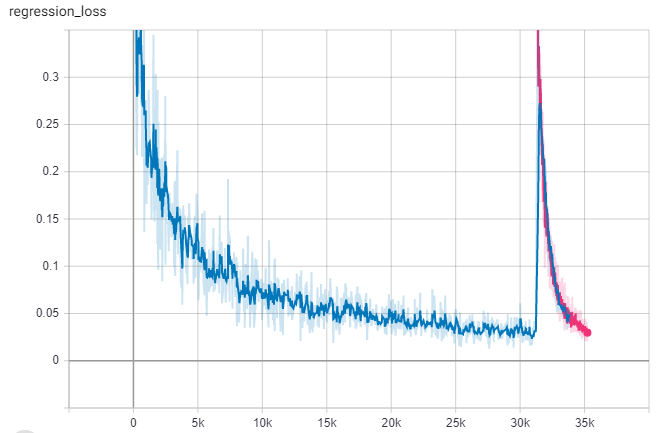

In [22]:
train_dataloader = DataLoader(train_MAFA, batch_size=16, shuffle=True, collate_fn=collate_fn)
test_dataloader = DataLoader(test_MAFA, batch_size=1, shuffle=False)

In [23]:
#retinanet.load_state_dict(torch.load('Wider_trained_v2.pth'))

In [24]:
# optimizer = optim.Adam(retinanet.parameters(), lr=1e-4)
# retinanet.cuda()
# n_epoches = 50
# iters = 31250 #10000/16*50

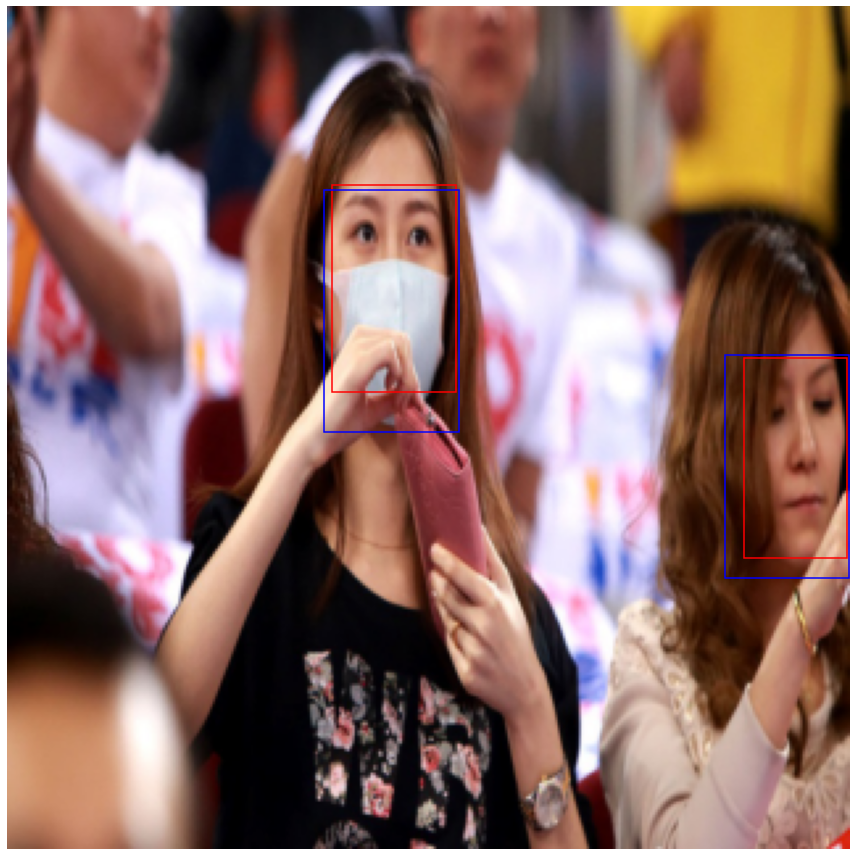

In [19]:
if DO_TRAIN:
    n_add_epoches = 30
    best_loss = 1e6
    best_mAP = -1
    for epoch_num in range(n_epoches, n_epoches + n_add_epoches+1):

        retinanet.train()
        #retinanet.module.freeze_bn()

        epoch_loss = []

        for iter_num, data in enumerate(train_dataloader):
            iters += 1

            optimizer.zero_grad()

            classification_loss, regression_loss, mask_loss = retinanet([data[0].cuda().float(), data[1]])

            classification_loss = classification_loss.mean()
            regression_loss = regression_loss.mean()
            mask_loss = mask_loss.mean()

            loss = classification_loss + regression_loss + mask_loss

            if bool(loss == 0):
                continue

            loss.backward()

            torch.nn.utils.clip_grad_norm_(retinanet.parameters(), 0.1)

            optimizer.step()

            #loss_hist.append(float(loss))

            epoch_loss.append(float(loss))

            print('Epoch: {} | Iteration: {} | Classification loss: {:1.5f} | Regression loss: {:1.5f} | Best mAP: {:0.5f}'.format(epoch_num, iters, float(classification_loss), float(regression_loss), best_mAP))

            writer.add_scalar('classification_loss', classification_loss, iters)
            writer.add_scalar('regression_loss', regression_loss, iters)
            writer.add_scalar('loss', loss, iters)

            if loss.item() < best_loss:
                best_loss = loss.item()
                torch.save(retinanet.state_dict(), best_model_path)

            del classification_loss
            del regression_loss

        retinanet.eval()
        pred_boxes = retinanet(test_MAFA[1][0].unsqueeze(0).cuda().float())
        #print(pred_boxes[-1])
        plot_img_and_boxes(test_MAFA[1][0], test_MAFA[1][1], pred_boxes[-1])
        retinanet.train()

    #     val_pred_MAFA_boxes = []
    #     for i, sample in enumerate(val_MAFA):
    #         boxes = retinanet(sample[0].unsqueeze(0).float())[2]
    #         if boxes is None:
    #             boxes = []
    #         else:
    #             boxes = list(boxes.cpu().detach().numpy())
    #         val_pred_MAFA_boxes.append(boxes)
    #         del sample
    #         del boxes
    #     mafa_results = mAP(val_MAFA, val_pred_MAFA_boxes)
    #     cur_map = mafa_results['mean_average_precision']
    #     print('Current mAP: ', cur_map)
    #     if cur_map > best_mAP:
    #         best_mAP = cur_map
    #         torch.save(retinanet.state_dict(), best_model_path)

## Load trained model

In [17]:
retinanet.load_state_dict(torch.load('./weights/FAN.best.pth'))

<All keys matched successfully>

In [18]:
retinanet.cuda()
retinanet.eval()

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [26]:
test_pred_MAFA_boxes = []
for i, sample in tqdm.tqdm(enumerate(test_MAFA), total = len(test_MAFA)):
    boxes = retinanet(sample[0].unsqueeze(0).float())[2]
    if boxes is None:
        boxes = []
    else:
        boxes = list(boxes.cpu().detach().numpy())
    test_pred_MAFA_boxes.append(boxes)
    del sample
    del boxes

  0%|                                                                                         | 0/1674 [00:00<?, ?it/s]C:\Users\EAS\Documents\Study\Skoltech\PhD\Deep Learning\Project\code\dataloaders\MAFAloader.py:76: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return torch.from_numpy(np.asarray(image)).to(device), torch.tensor(boxes, dtype=torch.float32).to(device)
100%|██████████████████████████████████████████████████████████████████████████████| 1674/1674 [01:38<00:00, 16.95it/s]


In [27]:
mafa_results = mAP(test_MAFA, test_pred_MAFA_boxes)

100%|██████████████████████████████████████████████████████████████████████████████| 1674/1674 [00:46<00:00, 36.25it/s]


In [28]:
mafa_results

{'average_iou': 0.5724272915966622,
 'mean_average_precision': 0.7181266772499693}

In [43]:
test_pred_WIDER_boxes = []
for i, sample in tqdm.tqdm(enumerate(test_WIDER), total = len(test_WIDER)):
    boxes = retinanet(sample[0].unsqueeze(0).float())[2]
    if boxes is None:
        boxes = []
    else:
        boxes = list(boxes.cpu().detach().numpy())
    test_pred_WIDER_boxes.append(boxes)
    del sample
    del boxes

  0%|                                                                                         | 0/1000 [00:00<?, ?it/s]C:\Users\EAS\Documents\Study\Skoltech\PhD\Deep Learning\Project\code\dataloaders\WIDERloader.py:74: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return torch.from_numpy(np.asarray(img)).to(device), torch.tensor(boxes, dtype = torch.float32).to(device)
100%|██████████████████████████████████████████████████████████████████████████████| 1000/1000 [01:03<00:00, 15.85it/s]


In [44]:
wider_results = mAP(test_WIDER, test_pred_WIDER_boxes)

100%|██████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:31<00:00, 32.15it/s]


In [45]:
wider_results

{'average_iou': 0.26361578369140626,
 'mean_average_precision': 0.37698038443339166}

In [19]:
test_pred_MAFA_boxes = []
test_pred_MAFA_labels = []
for i, sample in tqdm.tqdm(enumerate(test_MAFA), total = len(test_MAFA)):
    boxes = retinanet(sample[0].unsqueeze(0).float())[2]
    labels = retinanet(sample[0].unsqueeze(0).float())[1]
    if boxes is None:
        boxes = []
    else:
        boxes = list(boxes.cpu().detach().numpy())
        labels = labels.cpu().detach().numpy()
    test_pred_MAFA_boxes.append(boxes)
    test_pred_MAFA_labels.append(labels)
    del sample
    del boxes
    del labels

  0%|                                                                                         | 0/1674 [00:00<?, ?it/s]C:\Users\EAS\Documents\Study\Skoltech\PhD\Deep Learning\Project\code\dataloaders\MAFAloader.py:77: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return torch.from_numpy(np.asarray(image)).to(device), torch.tensor(boxes, dtype=torch.float32).to(device), init_sizes
100%|██████████████████████████████████████████████████████████████████████████████| 1674/1674 [02:53<00:00,  9.65it/s]


In [20]:
true_labels = [test_MAFA[i][1][:, -1].cpu().detach().numpy() for i in range(len(test_MAFA))]

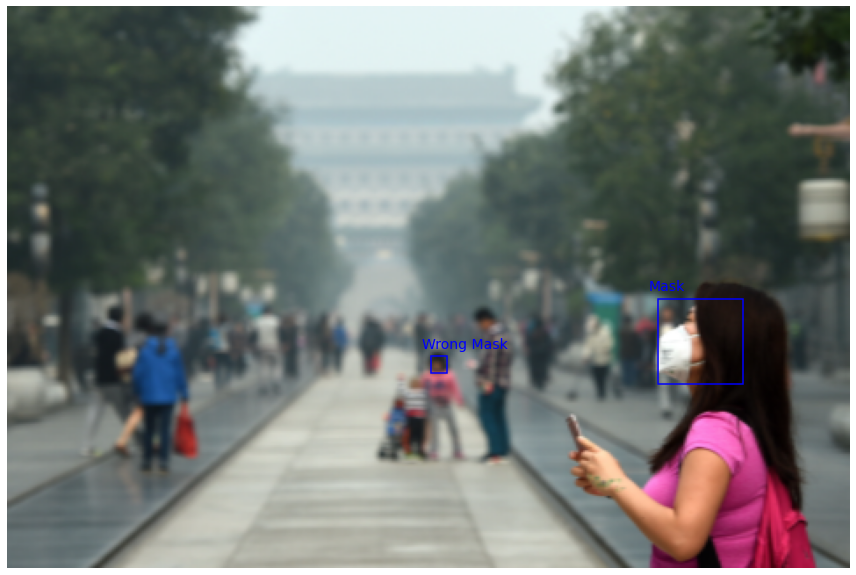

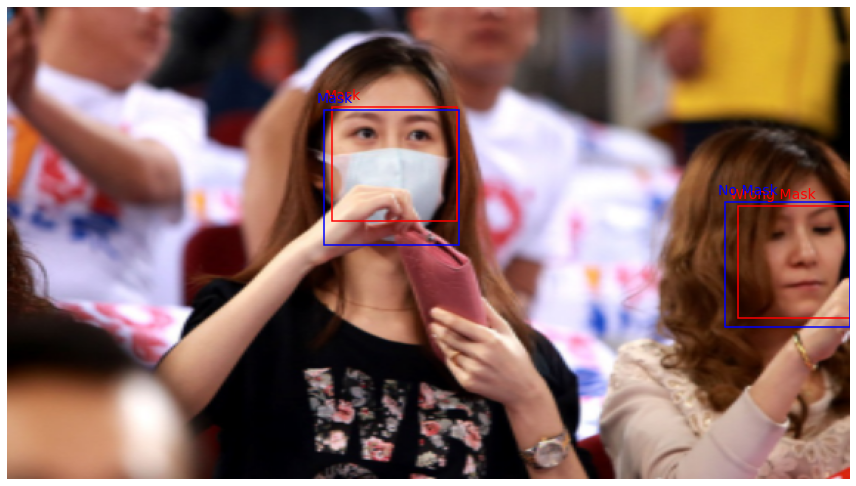

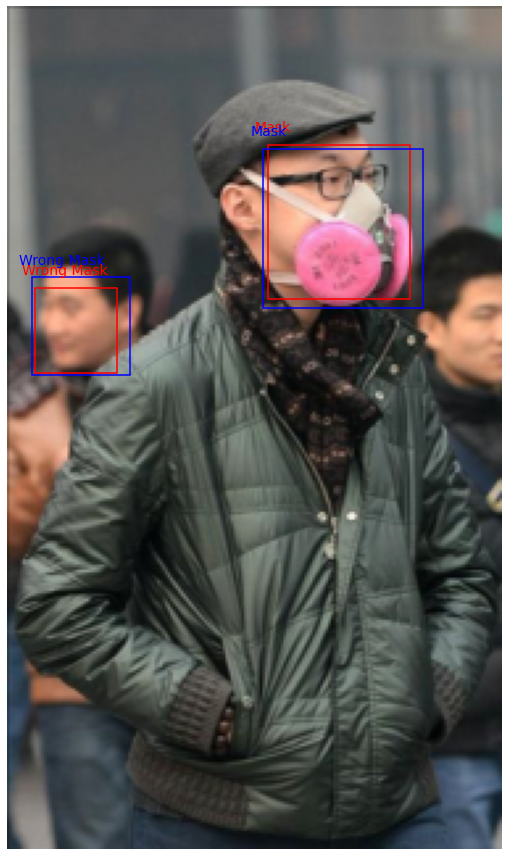

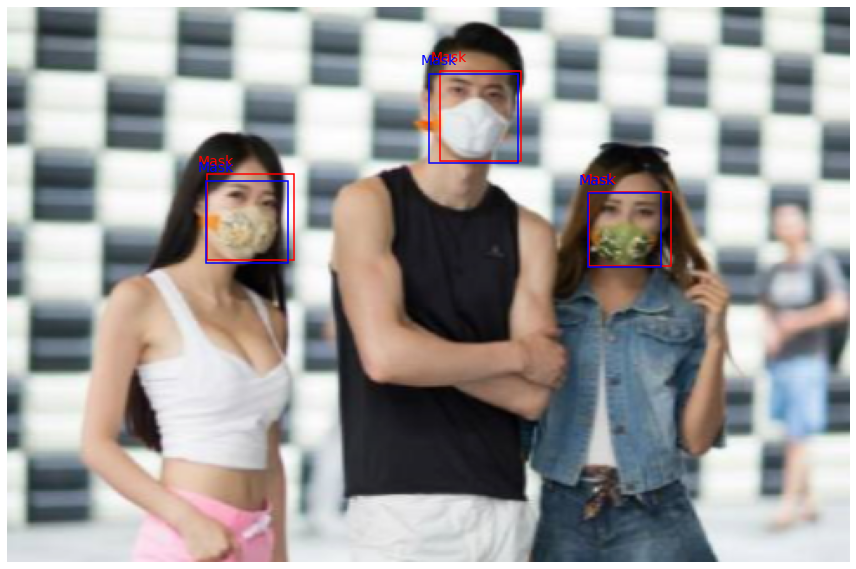

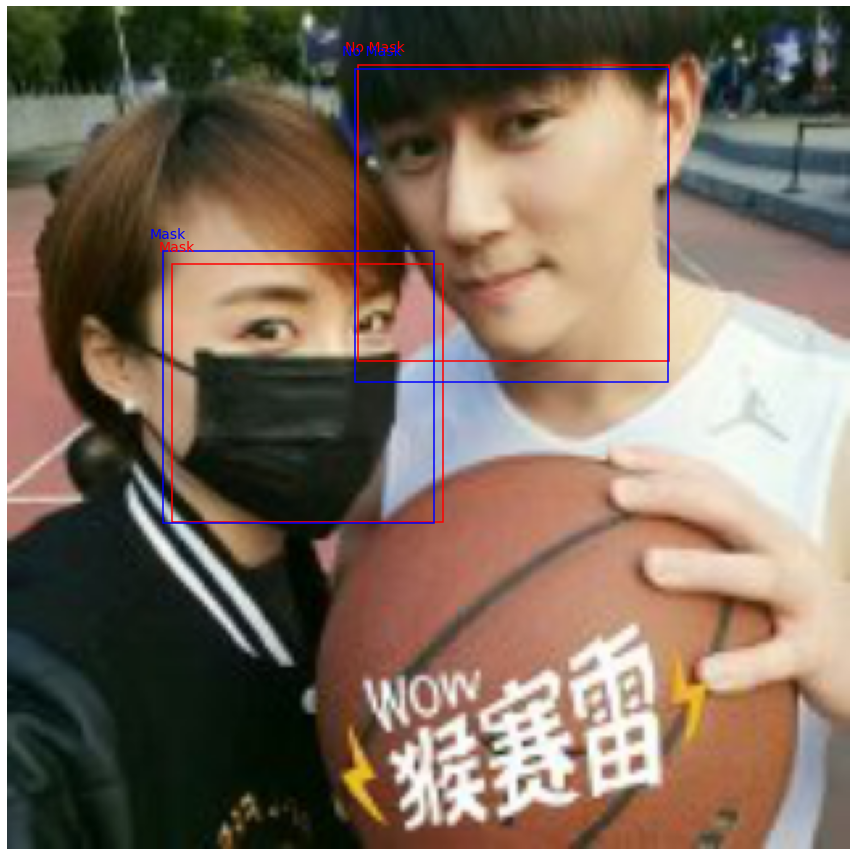

...

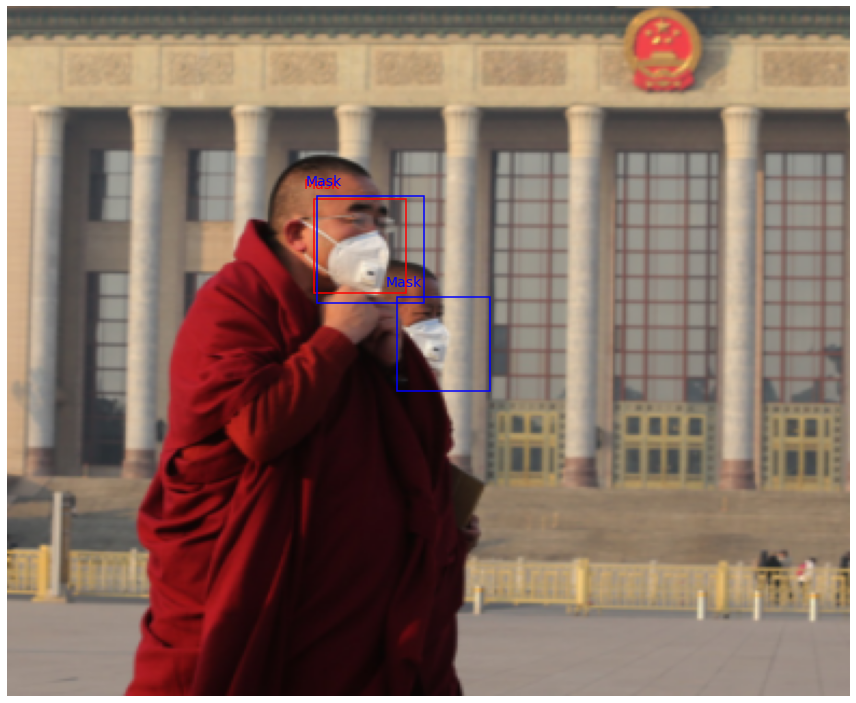

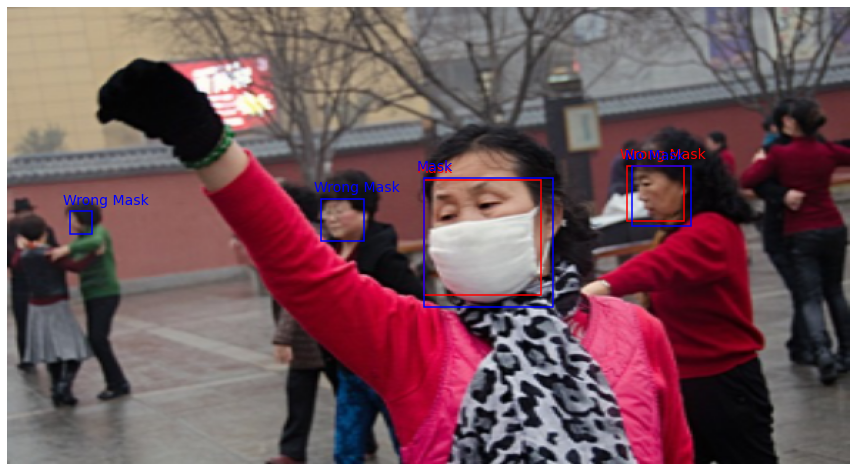

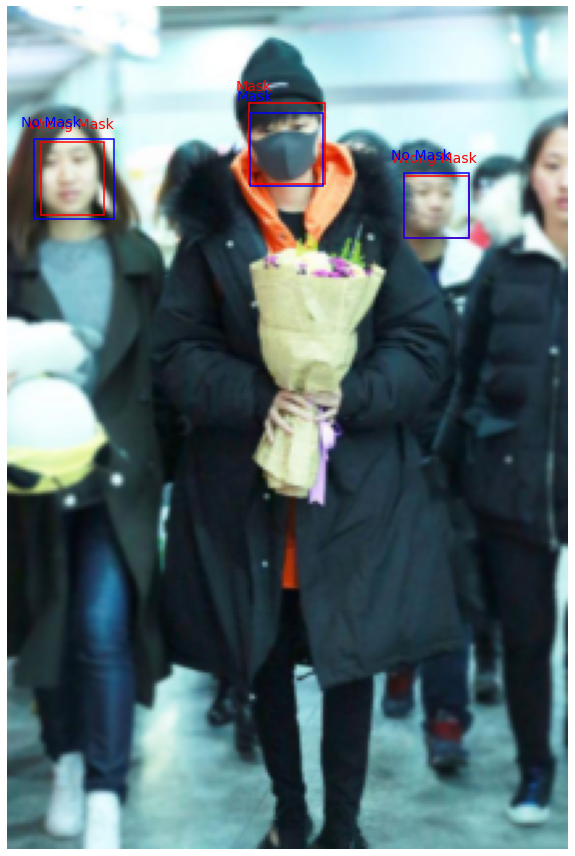

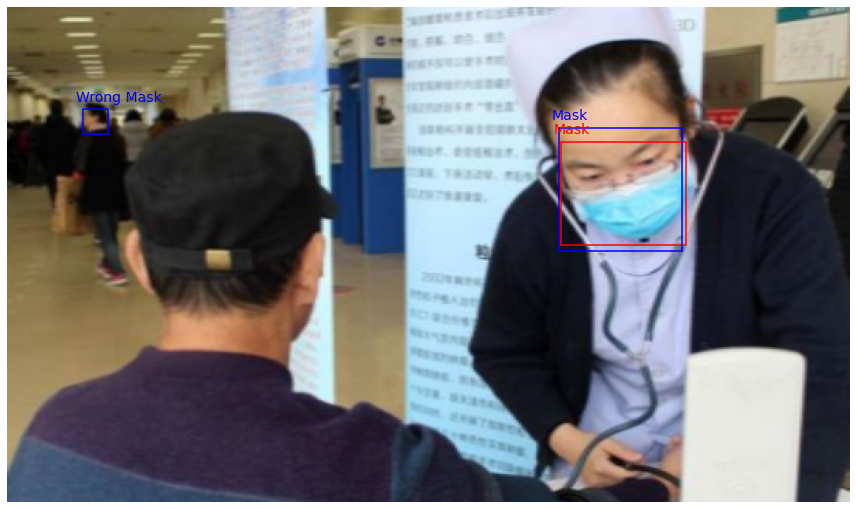

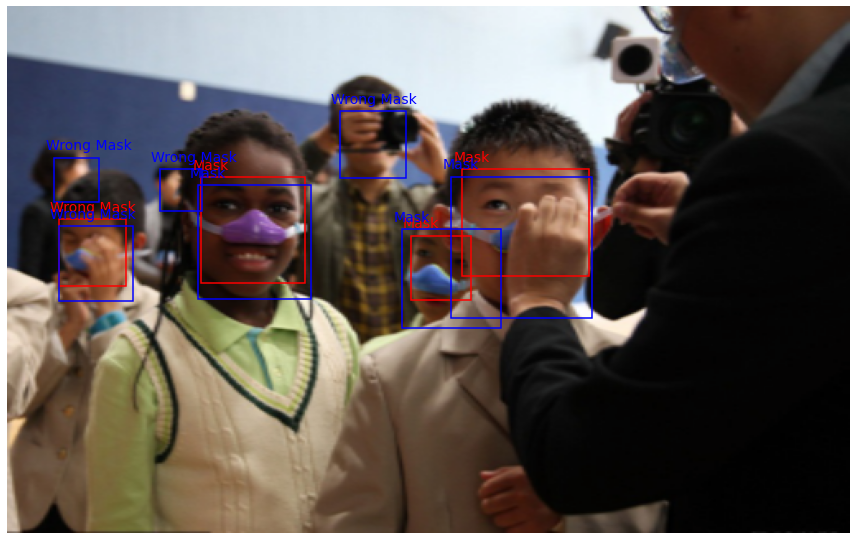

In [21]:
for i, sample in enumerate(test_MAFA):
    img = unnorm(sample[0])
    img = TF.to_pil_image(img.cpu())
    fig, ax = plt.subplots(figsize=(12, 12))
    
    img_height, img_width = sample[2]
    relation = img_width / img_height
    img = TF.resize(img, (320, int(320*relation)))
    
    ax.imshow(img)#, aspect='equal')
    pred_box = test_pred_MAFA_boxes[i]
    
    if pred_box is not None:
        for j, bbox in enumerate(pred_box):
            if bbox is None:
                break
            new_box = [0,0,0,0]
            new_box[0] = bbox[0]*relation
            new_box[2] = bbox[2]*relation
            new_box[1] = bbox[1]
            new_box[3] = bbox[3]
            #bbox[1] = bbox[1]
            #bbox[3] = bbox[3]
            ax.add_patch(
                plt.Rectangle((new_box[0], new_box[1]),
                              (new_box[2] - new_box[0]),
                              (new_box[3] - new_box[1]), fill=False,
                              edgecolor='red', linewidth=1.5)
                )
            if test_pred_MAFA_labels[i] is not None:
                if test_pred_MAFA_labels[i][j] == 0:
                    ax.text(new_box[0] - 5, new_box[1] - 5, "Mask", color = 'red', fontsize = 14)
                elif test_pred_MAFA_labels[i][j] == 1:
                    ax.text(new_box[0] - 5, new_box[1] - 5, "No Mask", color = 'red', fontsize = 14)
                elif test_pred_MAFA_labels[i][j] == 2:
                    ax.text(new_box[0] - 5, new_box[1] - 5, "Wrong Mask", color = 'red', fontsize = 14)   
    gt_box = sample[1]
    for j, bbox in enumerate(gt_box):
        new_box = [0,0,0,0]
        new_box[0] = bbox[0]*relation
        new_box[2] = bbox[2]*relation
        new_box[1] = bbox[1]
        new_box[3] = bbox[3]
        ax.add_patch(
            plt.Rectangle((new_box[0], new_box[1]),
                          (new_box[2] - new_box[0]),
                          (new_box[3] - new_box[1]), fill=False,
                          edgecolor='blue', linewidth=1.5)
            )
        if true_labels[i] is not None:
            if true_labels[i][j] == 0:
                ax.text(new_box[0] - 5, new_box[1] - 5, "Mask", color = 'blue', fontsize = 14)
            elif true_labels[i][j] == 1:
                ax.text(new_box[0] - 5, new_box[1] - 5, "No Mask", color = 'blue', fontsize = 14)
            elif true_labels[i][j] == 2:
                ax.text(new_box[0] - 5, new_box[1] - 5, "Wrong Mask", color = 'blue', fontsize = 14) 
        
    plt.axis('off')
    plt.tight_layout()
    plt.draw()
    plt.show()
    if i > 10:
        break

### Classificator

In [22]:
def get_faces(img, boxes):
    faces = []
    for box in boxes:
        face = img[:, int(box[1]):int(box[3]),
                 int(box[0]):int(box[2])]
        faces.append(face.cpu())
    return faces

In [18]:
#classif = MultilabelClassificator()

In [19]:
#classif.load_state_dict(torch.load('./weights/MultiLabelMaskDetection.best.pth'))

In [23]:
checkpoint = torch.load('./weights/custom_epoch17.pth')
classif = make_model()
classif.load_state_dict(checkpoint['state_dict'])
classif.eval()
classif.cuda()

Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (2): ReLU()
  (3): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (5): ReLU()
  (6): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (7): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (9): ReLU()
  (10): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (12): ReLU()
  (13): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): BatchNorm2d(256, eps=1e-05, momen

In [24]:
# classif = vgg_classif()
# classif.classifier = torch.load('./weights/vgg11_bn.best.pth')
# classif.cuda()

In [25]:
test_pred_classif_labels = []
mean = [0.485, 0.456, 0.406]
std = [0.229, 0.224, 0.225]
for i, sample in tqdm.tqdm(enumerate(test_MAFA), total = len(test_MAFA)):
    pred_boxes = test_pred_MAFA_boxes[i]
    if pred_boxes is not None:
        faces = get_faces(sample[0], pred_boxes)
        faces = [TF.normalize(TF.to_tensor(TF.resize(TF.to_pil_image(face), (224, 224))), std = std, mean = mean)
                 for face in faces]
        labels = np.zeros(len(faces))
        for j, face in enumerate(faces):
            class_id = classif(face.unsqueeze(0).cuda()).argmax()
            labels[j] = class_id
        test_pred_classif_labels.append(labels)

100%|██████████████████████████████████████████████████████████████████████████████| 1674/1674 [01:34<00:00, 17.68it/s]


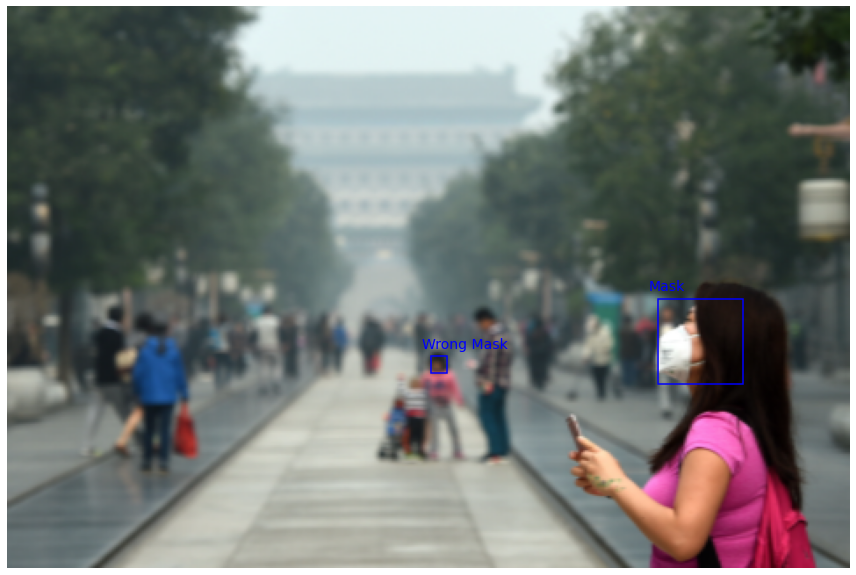

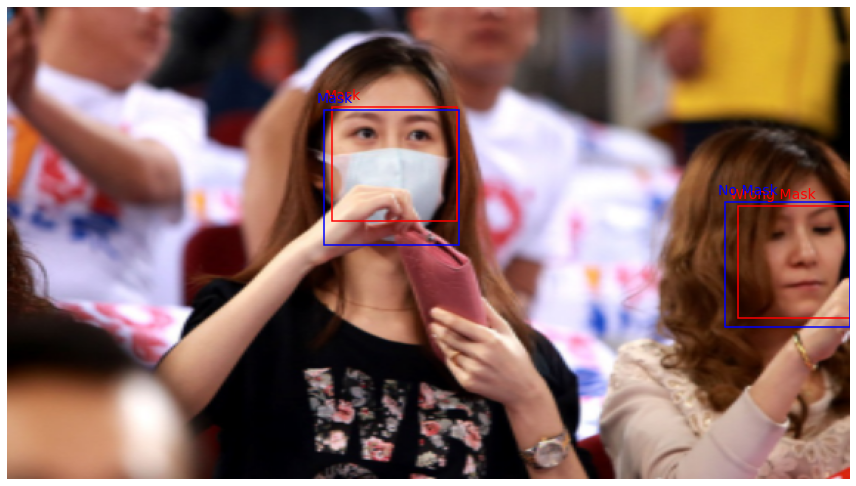

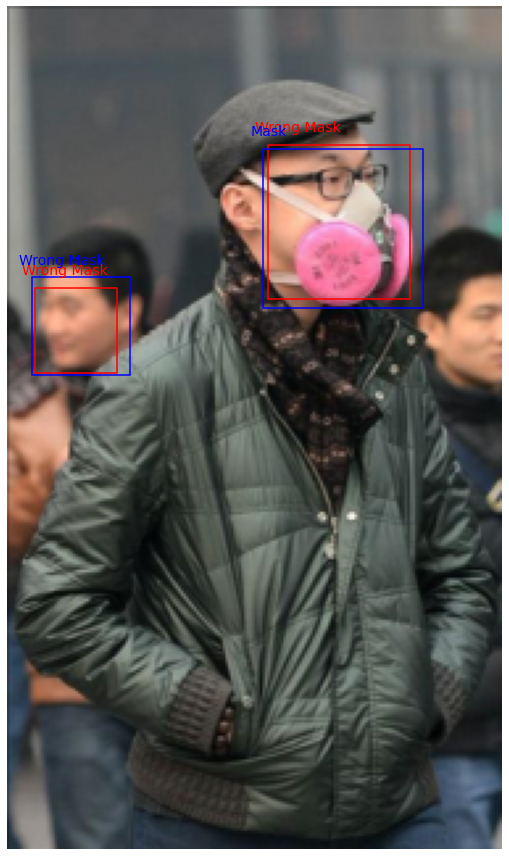

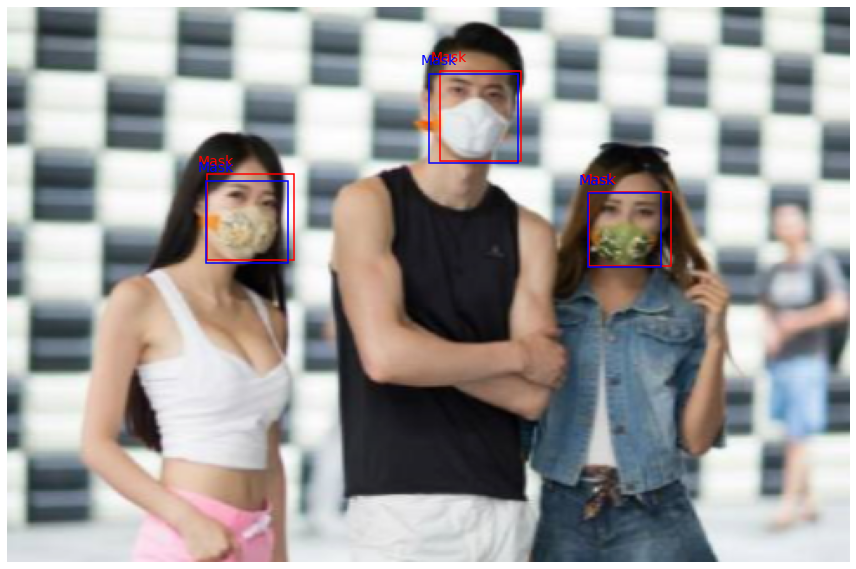

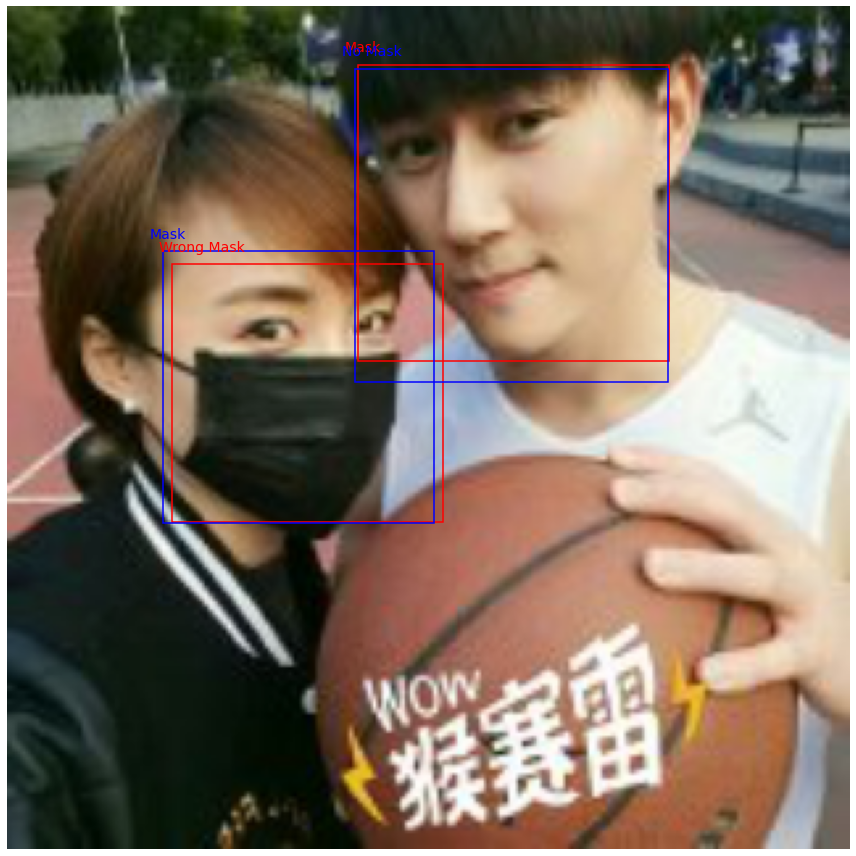

...

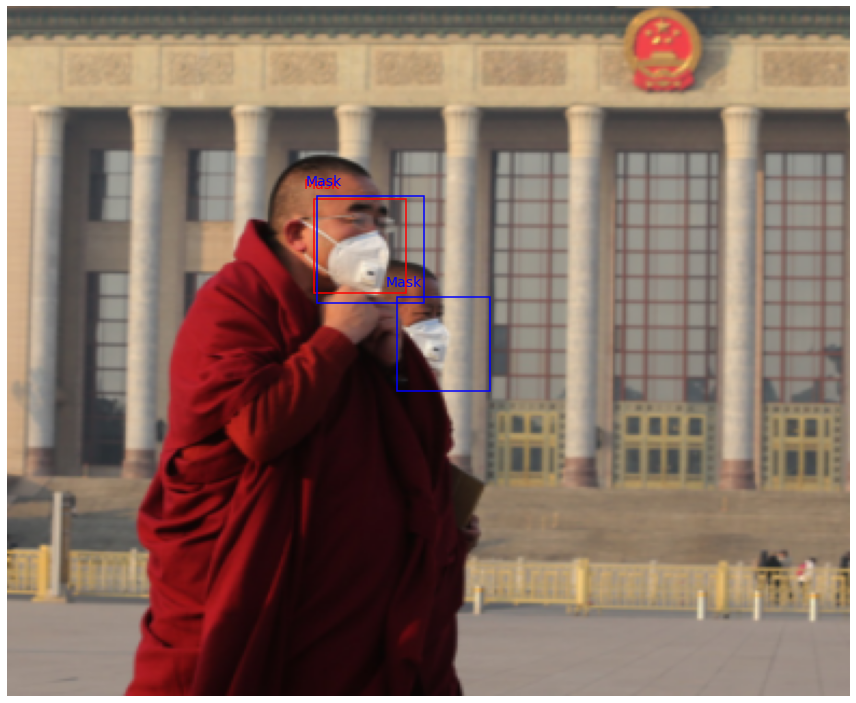

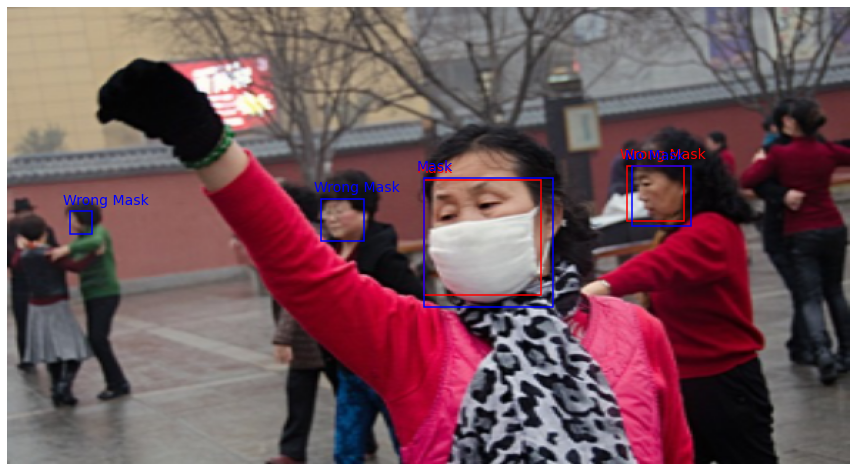

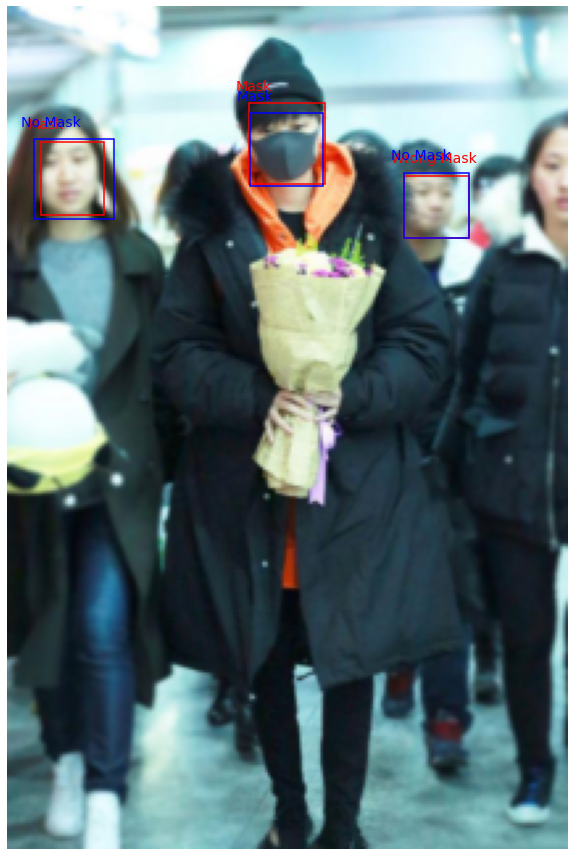

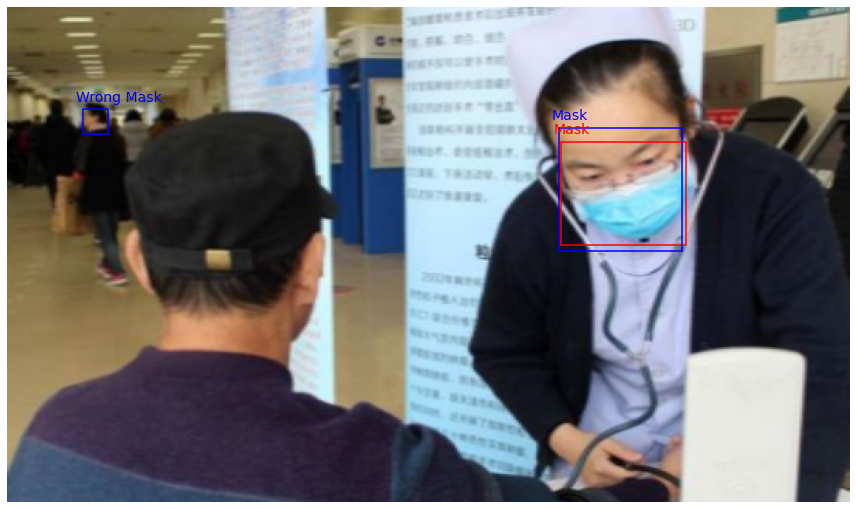

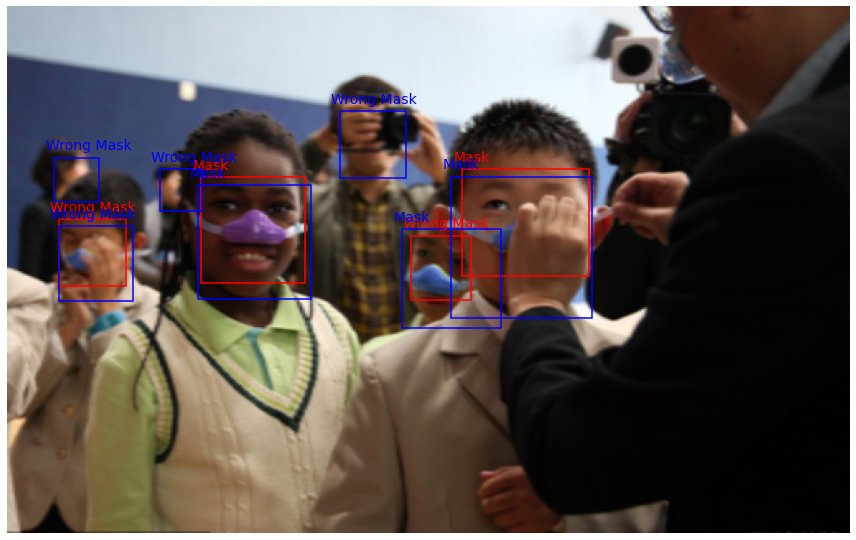

In [26]:
for i, sample in enumerate(test_MAFA):
    img = unnorm(sample[0])
    img = TF.to_pil_image(img.cpu())
    fig, ax = plt.subplots(figsize=(12, 12))
    img_height, img_width = sample[2]
    relation = img_width / img_height
    img = TF.resize(img, (320, int(320*relation)))
    ax.imshow(img)
    pred_box = test_pred_MAFA_boxes[i]
    if pred_box is not None:
        for j, bbox in enumerate(pred_box):
            if bbox is None:
                break
            new_box = [0,0,0,0]
            new_box[0] = bbox[0]*relation
            new_box[2] = bbox[2]*relation
            new_box[1] = bbox[1]
            new_box[3] = bbox[3]
            ax.add_patch(
                plt.Rectangle((new_box[0], new_box[1]),
                              (new_box[2] - new_box[0]),
                              (new_box[3] - new_box[1]), fill=False,
                              edgecolor='red', linewidth=1.5)
                )
            if test_pred_classif_labels[i] is not None:
                if test_pred_classif_labels[i][j] == 0:
                    ax.text(new_box[0] - 5, new_box[1] - 5, "Mask", color = 'red', fontsize = 14)
                elif test_pred_classif_labels[i][j] == 1:
                    ax.text(new_box[0] - 5, new_box[1] - 5, "No Mask", color = 'red', fontsize = 14)
                elif test_pred_classif_labels[i][j] == 2:
                    ax.text(new_box[0] - 5, new_box[1] - 5, "Wrong Mask", color = 'red', fontsize = 14)   
    gt_box = sample[1]
    for j, bbox in enumerate(gt_box):
        new_box = [0,0,0,0]
        new_box[0] = bbox[0]*relation
        new_box[2] = bbox[2]*relation
        new_box[1] = bbox[1]
        new_box[3] = bbox[3]
        ax.add_patch(
            plt.Rectangle((new_box[0], new_box[1]),
                          (new_box[2] - new_box[0]),
                          (new_box[3] - new_box[1]), fill=False,
                          edgecolor='blue', linewidth=1.5)
            )
        if true_labels[i] is not None:
            if true_labels[i][j] == 0:
                ax.text(new_box[0] - 5, new_box[1] - 5, "Mask", color = 'blue', fontsize = 14)
            elif true_labels[i][j] == 1:
                ax.text(new_box[0] - 5, new_box[1] - 5, "No Mask", color = 'blue', fontsize = 14)
            elif true_labels[i][j] == 2:
                ax.text(new_box[0] - 5, new_box[1] - 5, "Wrong Mask", color = 'blue', fontsize = 14) 
        
    plt.axis('off')
    plt.tight_layout()
    plt.draw()
    plt.show()
    if i > 10:
        break